# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
configs length  300
end of file: run.py


In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

 1055
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10510.454192142364
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1116 to existing amount 20897.48095757759
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10510.454192142364 from reserve 101033.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  977
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138947.00 170000.00 150000.00 0.00 109929.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

q_sold =  q_sold = 
delta_Ri =  -5323.432928719437
H_agent r out = q_sold =    101004
89431.79153639967
**********
Q ADDED INTO POOL: 1024 to existing amount 28276.552333690033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5323.432928719437 from reserve 73373.79153639969
**********
q_sold =  H_chosen_agent delta W  4901.297253872985
903939
q_sold =  
  1030
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134992.00 170000.00 150000.00 0.00 84108.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132854.00 170000.00 150000.00 0.00 77522.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3500.401525462767
H_agent r out =  77522.45096255865
**********
Q ADDED INTO POOL: 1004 to existing amount 31259.789894632824
**********
**********
POOL RESERVE ONE RE

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  3305.515096592524
H_agent r out =  165723.37433414138
**********
Q ADDED INTO POOL: 1000 to existing amount 31723.163628613944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3305.515096592524 from reserve 58478.62566585864
**********
 
q_sold =  1021
**********q_sold =  984
q_sold =  993
q_sold = 967
H_chosen_agentq_sold = 
  1004
q_sold = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127857.00 170000.00 150000.00 0.00 62859.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent1021    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133761.00 170000.00 150000.00 0.00 76627.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri = 972 -4078.2688236446047
H_agent r out =  76627.73822547361
**********
Q ADDED INTO POOL: 967 to 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129024.00 170000.00 150000.00 0.00 174749.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  2394.4414464053934
H_agent r out =  174749.3162336272
**********
Q ADDED INTO POOL: 962 to existing amount 34344.17092710456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2394.4414464053934 from reserve 50525.683766372786q_sold = q_sold =  
 delta_Ri = 894  **********1008

H_chosen_agent
 -2793.323613611055   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124737.00 170000.00 150000.00 0.00 54675.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1746.720498941527
H_agent r out =  54675.21515493591
**********
Q ADDED INTO POOL: 1008 to existing amount 38197.32180246245
**********
**********
POOL RESERVE ONE REMOVING ASS


delta_Ri =  3616.952045337806
H_agent r out =  178649.18609014168
**********
Q ADDED INTO POOL: 931 to existing amount 32627.624121240628
**********
 1020
**********H_chosen_agent1004

**********q_sold = H_agent r out =  51772.592261539954
**********
Q ADDED INTO POOL: 899 to existing amount 35554.89285184992
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1976.3357572172315 from reserve 46904.59226153997
**********
q_sold =   996

 POOL RESERVE ONE REMOVING ASSET j in amount 3616.952045337806 from reserve 63150.81390985831
**********
897q_sold = 999H_chosen_agent
 

  q_sold = 1020
H_chosen_agent q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2195.7907128876764 from reserve 46612.0530065166   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127966.00 170000.00 150000.00 0.00 58102.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i    

q_sold = q_sold =   1074
1045946
 1085
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121810.00 170000.00 150000.00 0.00 44259.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  968
q_sold = delta_Ri = 
q_sold =  q_sold =  q_sold =   946
1074
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122902.00 170000.00 150000.00 0.00 46446.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent
delta_Ri =  -1729.4308187293673
H_agent r out =  46446.32303871023
**********
Q ADDED INTO POOL: 1085 to existing amount 39216.96786352751
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1729.4308187293673 from reserve 40592.323038710245
**********
H_chosen_agent H_chosen_agent -1435.0871591850168
H_agent r out =  44259.10235775992
**********
Q ADDED INTO POOL: 920 to existing amount 39448.89285184992
*********

delta_Ri = q_sold = q_sold = 981 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115057.00 170000.00 150000.00 0.00 39324.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1042
2074.9836032442736q_sold =  1042
944
q_sold = delta_Ri = q_sold = H_chosen_agentq_sold =  -1455.0024580257195
H_agent r out =  39324.033011412
**********
Q ADDED INTO POOL: 917 to existing amount 39383.07037906009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1455.0024580257195 from reserve 40414.033011412044
**********
q_sold =   
 1073
 961
981
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117959.00 170000.00 150000.00 0.00 195432.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  1463.3130713482299
H_agent r out =  195432.21993963062
**********
Q ADDED INTO POOL: 1042 to existing amount 40827.21041516378
*******

q_sold = q_sold =  975
1017q_sold = 
 1042
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119235.00 170000.00 150000.00 0.00 203625.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2109.4964483072677
H_agent r out =  203625.78217730054
**********
Q ADDED INTO POOL: 1032 to existing amount 38527.68027669849
**********
**********q_sold = q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 2109.4964483072677 from reserve 45522.21782269943
**********
 q_sold =  1052q_sold =  q_sold = 975

1017
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114021.00 170000.00 150000.00 0.00 34036.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent  H_chosen_agent978
 
q_sold = 1038delta_Ri =  H_chosen_agent -1215.30534269884    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 1100

0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115020.00 170000.00 150000.00 0.00 212244.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107544.00 170000.00 150000.00 0.00 31065.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
-1731.1521456215232
H_agent r out =  29808.083863026917
**********
Q ADDED INTO POOL: 1042 to existing amount 38546.95560613418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1731.1521456215232 from reserve 40586.083863026935
**********
delta_Ri = 
delta_Ri = q_sold = delta_Ri =    -1150.128127066534
H_agent r out =  31065.03999394112
**********
Q ADDED INTO POOL: 984 to existing amount 43180.53945697316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1150.128127066534 from reserve 

delta_Ri =  -1110.764733103336
H_agent r out =  delta_Ri = 982   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103993.00 170000.00 150000.00 0.00 209760.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  734.8966889993361
H_agent r out =  209760.87064686464
**********
Q ADDED INTO POOL: 982 to existing amount 50561.24449444682
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 734.8966889993361 from reserve 27389.129353135435
**********

 22090.128901724365
**********
Q ADDED INTO POOL: 1036 to existing amount 44717.732447760296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.764733103336 from reserve 33189.12890172442
**********
q_sold = -1790.3671964820194 1036
q_sold =  946

H_agent r out =  26346.364475169186
**********
Q ADDED INTO POOL: 1047 to existing amount 38175.84309704958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1790.3671964820

q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112685.00 170000.00 150000.00 0.00 30928.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1016q_sold = q_sold = q_sold = 
delta_Ri =  -1632.7194994938577
H_agent r out =  30928.528423540592
**********
Q ADDED INTO POOL: 998 to existing amount 38928.53010259199
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.7194994938577 from reserve 41049.52842354061
**********

  q_sold =  1052
1010
915
H_chosen_agent  -1243.561296035359
H_agent r out = H_chosen_agentH_chosen_agent 25690.425053463256
**********
Q ADDED INTO POOL: 1018 to existing amount 42488.737676143835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1243.561296035359 from reserve 34648.42505346326
**********
   q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107934.00 170000.00 1500

997
H_chosen_agent delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105789.00 170000.00 150000.00 0.00 223020.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1009q_sold = 
q_sold = 
delta_Ri =  H_chosen_agent H_chosen_agent1055 
   1031
1165.9722088432943-1274.705521747525   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105215.00 170000.00 150000.00 0.00 225757.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  1179.1540114104653
H_agent r out =  225757.9398978417
**********
Q ADDED INTO POOL: 1009 to existing amount 45483.19277251927
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1179.1540114104653 from reserve 34172.060102158306
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98913.00 170000.00 150000.00 0.00 

q_sold = q_sold = 
 delta_Ri =   -1307.8855064428167
H_agent r out =  12168.616974647484
**********
Q ADDED INTO POOL: 1115 to existing amount 42969.57503519129
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1307.8855064428167 from reserve 33911.61697464751
**********978
986

H_chosen_agentq_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102743.00 170000.00 150000.00 0.00 226371.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95391.00 170000.00 150000.00 0.00 17512.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  999

delta_Ri =  1231.2912895000009
H_agent r out =  226371.45831995652
**********
Q ADDED INTO POOL: 986 to existing amount 44533.00192391235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1231.2912895000009 fro

154950.0q_sold = q_sold = 
1012 
q_sold = q_sold =   
155024.0976    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94413.00 170000.00 150000.00 0.00 16460.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

1060
974 
delta_Ri =  -1266.5733543821136
H_agent r out =  16460.677242796784
**********
Q ADDED INTO POOL: 932 to existing amount 40976.26665188404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1266.5733543821136 from reserve 36408.67724279677
**********
H_chosen_agentH_chosen_agent 
 POOL REMOVE LIQUIDITY Timestep === 1000q_sold =  1093
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99772.00 170000.00 150000.00 0.00 229974.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91165.00 170000.00 150000.00 0.00  9414.76

 H_chosen_agent  q_sold = q_sold =  97390
 997
delta_Ri =  -849.8382102141896
H_agent r out =  6761.0063308851
**********
Q ADDED INTO POOL: 965 to existing amount 38094.52188785957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 849.8382102141896 from reserve 30083.006330885142
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91461.00 170000.00 150000.00 0.00 12589.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1019H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95219.00 170000.00 150000.00 0.00 237031.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1056.2087769052214
H_agent r out =  237031.29278787883
**********
Q ADDED INTO POOL: 1014 to existing amount 37928.47768014907
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.2087769052214 from reserve 32230.70721

H_chosen_agentq_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95854.00 170000.00 150000.00 0.00  1691.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
delta_Ri =  -1077.758565057107
H_agent r out =  1691.397935755145
**********
Q ADDED INTO POOL: 968 to existing amount 35139.47675802739
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.758565057107 from reserve 32892.39793575518
**********
q_sold = q_sold = 978 879

 1040
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137071.00 170000.00 150000.00 0.00 96540.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = delta_Ri = 
delta_Ri =  -5655.023538162318
H_agent r out =  96540.71659671912
**********
Q ADDED INTO POOL: 978 to existing amount 22684.302631802315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5655.02

H_chosen_agentH_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
    4749.9793490562715
addliq - Sq delta S 4749.979349056272
POOL ADD LIQUIDITY Timestep ===  10 delta W  6063.749999999999
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137924.00 170000.00 150000.00 0.00 138608.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  976
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -9373.956579503041
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1020 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9373.95657950304

0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136904.00 170000.00 150000.00 0.00 144081.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 


 delta_Ri =  -4509.941473726956
H_agent r out =  82010.20887308187
**********
Q ADDED INTO POOL: 936 to existing amount 31028.146749889187
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4509.941473726956 from reserve 71118.2088730819
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134903.00 170000.00 150000.00 0.00 156659.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 
delta_Ri =  4175.439091573647
H_agent r out =  156659.0572082535
**********
Q ADDED INTO POOL: 923 to existing amount 29260.420936690232
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4175.439091573647 from reserve 

0 180000.00 160000.00  q_sold = 

delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 3089.443057279529 from reserve 54897.451128778615
**********
 
 1022q_sold = **********
Q ADDED INTO POOL: 1025 to existing amount 34944.771774851826
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2393.9329859907552 from reserve 48594.05805524591
**********

q_sold =  -3352.2620846152577
H_agent r out =  66113.41254727871
**********
Q ADDED INTO POOL: 1032 to existing amount 34078.347557223744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3352.2620846152577 from reserve 58237.41254727874
**********
1017
q_sold = q_sold = H_chosen_agent  997
H_chosen_agent1017    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129985.00 170000.00 150000.00 0.00 174900.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  2670.263722523533
H_agent r out = q_sold = q_sold = 1081H_chosen_agent 1060


986



**********
Q ADDED INTO POOL: 1043 to existing amount 32032.445305374073
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4381.9595442432865 from reserve 65581.24618181467
**********
H_agent r out = H_chosen_agentq_sold = q_sold =  72480.08899998284
**********
delta_Ri =  951
   q_sold = -3928.0360267813808
H_agent r out =  79424.06689716608
**********
Q ADDED INTO POOL: 963 to existing amount 32263.57151707096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3928.0360267813808 from reserve 65398.06689716611
**********
 945   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127184.00 170000.00 150000.00 0.00 181930.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1070 to existing amount 33230.195287305585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3842.865801604293 from reserve 61428.08899998284
**********
q_sold = 
 1046
q_sold = de

q_sold = H_chosen_agentH_chosen_agent  q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118928.00 170000.00 150000.00 0.00 44940.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     -3029.6077241722205
H_agent r out =  62393.57884360508
**********
Q ADDED INTO POOL: 1032 to existing amount 34987.40965656678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3029.6077241722205 from reserve 55329.57884360508
**********
1129

delta_Ri =  -1515.7695285296209
H_agent r out = 996q_sold =  
q_sold =  44940.64261472376q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121887.00 170000.00 150000.00 0.00 190687.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     973
delta_Ri =  1951.2899771575933
H_agent r out =  190687.5376276549
**********
Q ADDED INTO POOL: 1049 to existing amount 39627.20366990343


H_chosen_agent  H_agent r out = 195935.88690641042   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124873.00 170000.00 150000.00 0.00 186854.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125822.00 170000.00 150000.00 0.00 58198.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

delta_Ri =  -2367.6782203932817
H_agent r out =  58198.32964174381
**********
Q ADDED INTO POOL: 1020 to existing amount 37268.45809883066
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2367.6782203932817 from reserve 49071.32964174384
**********

40297.053313558994
q_sold = 
**********
Q ADDED INTO POOL: 1026 to existing amount 40162.90422815352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1505.0539212573285 from reserve 38196.05331355901
**********
delta_Ri = q_sold = delta_Ri

q_sold = 989   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115865.00 170000.00 150000.00 0.00 34290.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122801.00 170000.00 150000.00 0.00 51447.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
873q_sold =  989
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120703.00 170000.00 150000.00 0.00 40455.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = H_chosen_agentq_sold =  

delta_Ri =  -2242.6224388002443
H_agent r out =  40455.75596821375
**********
Q ADDED INTO POOL: 1048 to existing amount 37995.534659745725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2242.6224388002443 from reserve 46213.75596821379
**********
q_sold = H_chosen_agent
delta_Ri = 

q_sold = q_sold =  H_agent r out =  q_sold =  1007
1079
q_sold = 1165.3170539705163
H_agent r out =  207602.12592074432
**********
Q ADDED INTO POOL: 970 to existing amount 42944.011065913175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1165.3170539705163 from reserve 34774.874079255744
**********
q_sold =   1002q_sold =  H_chosen_agent
H_chosen_agent 1007     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115996.00 170000.00 150000.00 0.00 38071.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1101 1015
203844.61550005883982
q_sold = H_chosen_agent
 1010
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119718.00 170000.00 150000.00 0.00 197949.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agent

H_chosen_agentH_chosen_agent   -1621.3484509466623
H_agent r out =  38071.47062193297
**********
Q ADDED 

q_sold =  q_sold =  945
H_chosen_agent 1041q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112882.00 170000.00 150000.00 0.00 33599.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1247.8300149403046
H_agent r out =  33599.33876892551
**********
Q ADDED INTO POOL: 945 to existing amount 43981.34317139071
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1247.8300149403046 from reserve 36752.33876892551
**********
 
 H_chosen_agentq_sold = 1016971 1015
q_sold = 


q_sold = H_chosen_agent 987
 delta_Ri =  1095.421608125354
H_agent r out =  210972.18720340237
**********
Q ADDED INTO POOL: 982 to existing amount 44001.495996518745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1095.421608125354 from reserve 33484.812796597704
**********
H_chosen_agent H_chosen_agent q_sold =  1081
988
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

H_agent r out = q_sold =  28782.77407123945
**********
Q ADDED INTO POOL: 994 to existing amount 47077.71325971677
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.8681115023558 from reserve 32955.774071239444
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107738.00 170000.00 150000.00 0.00 209550.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  q_sold = q_sold = 994
 1001
 1033
q_sold = 1060H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114626.00 170000.00 150000.00 0.00 26203.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2317.1239605750857
H_agent r out =  26203.447203747928
**********
Q ADDED INTO POOL: 1033 to existing amount 37423.76779010592
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2317.1239605750857 from reserve 47134.447203747965
**

 q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109699.00 170000.00 150000.00 0.00 213943.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1245.8945419451084
H_agent r out =  213943.639485549
**********
Q ADDED INTO POOL: 996 to existing amount 42334.428265494746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1245.8945419451084 from reserve 35470.360514451044
**********
10761032q_sold = 
994
 
953
q_sold = H_chosen_agentH_chosen_agentq_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108773.00 170000.00 150000.00 0.00 30834.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1223.5730170922347
H_agent r out =  30834.765568989864
**********
Q ADDED INTO POOL: 1032 to existing amount 45453.3242005746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1223.

 q_sold = H_chosen_agentq_sold =    q_sold = 987  986

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105693.00 170000.00 150000.00 0.00 27421.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 10379991045

delta_Ri =  -986.3361937594468
H_agent r out =  27421.479804266517
**********
Q ADDED INTO POOL: 1019 to existing amount 48533.3242005746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.3361937594468 from reserve 31442.47980426654
**********

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101219.00 170000.00 150000.00 0.00 220275.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 H_chosen_agentq_sold = 
 1004
q_sold =  1004
H_chosen_agent delta_Ri = 879    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105754.00 170000.00 

q_sold = H_chosen_agentq_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98153.00 170000.00 150000.00 0.00 223206.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent  
delta_Ri =  831.9503932987027
H_agent r out =  223206.55907693974
**********
Q ADDED INTO POOL: 964 to existing amount 47999.20141751555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 831.9503932987027 from reserve 29354.440923060316
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94934.00 170000.00 150000.00 0.00 14495.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  976q_sold = 961q_sold = 
q_sold =  1082
1069 1007


H_chosen_agent 
H_chosen_agent991
delta_Ri =  -912.0270880151227
H_agent r out =  14495.893383032115
**********
Q ADDED INTO POOL: 968 to existing amount 46316.40807185287
**********
**********
POOL RESERVE ONE 


 q_sold =  1017
delta_Ri =  1415.7637258447605
H_agent r out =  222813.70987286672
**********
Q ADDED INTO POOL: 947 to existing amount 39935.402585799995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1415.7637258447605 from reserve 38730.29012713335
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92996.00 170000.00 150000.00 0.00 227325.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91911.00 170000.00 150000.00 0.00 11637.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1060
delta_Ri =  -933.5777192244196
H_agent r out = 
  11636.995355498877
**********
Q ADDED INTO POOL: 1050 to existing amount 47196.11755969486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.5777192244196 from reserve 29430.995355498893
**********
H_chosen_a

H_chosen_agent **********q_sold =  q_sold = 977

Q ADDED INTO POOL: 1050 to existing amount 48682.07655668884
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 866.9449759567576 from reserve 28709.690567452493
**********
   977
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94512.00 170000.00 150000.00 0.00 18647.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 90623.00 170000.00 150000.00 0.00  3025.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96566.00 170000.00 150000.00 0.00 -1209.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  933H_chosen_agent9834.224138437841

delta_Ri =  -770.8427130012799
H_agent r out =  18647.47038895828
**********
Q ADDED INTO POOL: 

q_sold =  1048
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137876.00 170000.00 150000.00 0.00 138262.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  154950.0995

 q_sold = H_chosen_agentdelta_Ri =  6870.643003633721
H_agent r out =  138262.7298977276
**********
Q ADDED INTO POOL: 1040 to existing amount 21777.43647648356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6870.643003633721 from reserve 83805.2701022724
**********
992
 q_sold =  
q_sold = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89915.00 170000.00 150000.00 0.00 223868.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1086
 954
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10224.681059518836 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19806845715201968
POOL REMOVE LIQUIDITY share fraction of res

0 130000.00 180000.00 160000.00  4179.418079254541delta_Ri = 595.9803616512722
H_agent r out =  226540.38475862335
**********
Q ADDED INTO POOL: 969 to existing amount 56407.351821426986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 595.9803616512722 from reserve 24704.615241376698
**********

q_sold = 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
  delta_Ri =  q_sold = 1005
979q_sold =  
 1039H_agent r out =  87682.9421610572
**********
Q ADDED INTO POOL: 930 to existing amount 30826.4314452174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4658.830944753329 from reserve 71778.94216105723
**********
q_sold =  985
 925
-892.3924324514205582.450753681064
H_agent r out =  233799.8851599412
**********
Q ADDED INTO POOL: 1028 to existing amount 45396.80592113309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 582.450753681064 from reserve 23750.114840058835
**********


q_sold =  1068
H_agent r out = H_chosen_agentq

0 130000.00 180000.00 160000.00  
H_chosen_agentq_sold = 
 1001
delta_Ri =  3884.271213025613
H_agent r out =  161451.61395653654
**********
Q ADDED INTO POOL: 965 to existing amount 30118.967850770427
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3884.271213025613 from reserve 64597.386043463455
**********
q_sold =   1036
H_chosen_agent q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 86465.00 170000.00 150000.00 0.00 12189.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131845.00 170000.00 150000.00 0.00 73988.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta Sq
1012q_sold =   delta_Ri = 

946q_sold = delta_Ri =  -3798.0425440406275
H_agent r out =  73988.10923230687
**********
Q ADDED INTO POOL: 1009 to existing amount 32909.74923754434
***

q_sold = 1052
 q_sold = 
990q_sold = H_agent r out =  61082.21558329573
**********
Q ADDED INTO POOL: 1040 to existing amount 36567.363929291954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2585.130491880359 from reserve 50108.215583295765
**********
q_sold = q_sold = 
   945
1039q_sold = 
 1066
 916
q_sold = 972H_chosen_agentH_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133109.00 170000.00 150000.00 0.00 162191.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    1070
1066

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139006.00 170000.00 150000.00 0.00 110647.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126783.00 170000.00 150000.00 0.00 5849

q_sold = delta_Ri = q_sold = H_chosen_agent83889.55882782541      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132931.00 170000.00 150000.00 0.00 80188.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1104902
delta_Ri =  -4004.9038589106353
H_agent r out =  80188.72875242346
**********
Q ADDED INTO POOL: 992 to existing amount 32336.572181286007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4004.9038589106353 from reserve 65127.72875242346
**********

q_sold = q_sold =  874
H_chosen_agent  
**********955
 H_chosen_agent
 -5801.48657064996
H_agent r out =  1012   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123542.00 170000.00 150000.00 0.00 51362.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1797.2427826282208
H_agent r out =  51361.997828540254
**********
Q ADDED INTO POOL: 955 to existing a

  1030delta_Ri = q_sold = 853
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135223.00 170000.00 150000.00 0.00 87065.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -4610.27637237429
H_agent r out =  87065.17214826892
**********
Q ADDED INTO POOL: 991 to existing amount 29016.34038144417
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4610.27637237429 from reserve 70146.17214826892
**********
 ********** 1048
2075.3757568014207
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120417.00 170000.00 150000.00 0.00 45599.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
delta_Ri =  -1429.5682385026191
H_agent r out =  45599.574004970535
**********
Q ADDED INTO POOL: 853 to existing amount 40852.79107857559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1429.5682385026191

 -3682.7308541273574
H_agent r out =  74286.6521619714
**********
Q ADDED INTO POOL: 1069 to existing amount 31326.715166221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3682.7308541273574 from reserve 60240.65216197141
**********
 60876.21508506345 -2411.3262088931087
H_agent r out =  59558.111761072665
**********
Q ADDED INTO POOL: 1010 to existing amount 36982.13334641009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2411.3262088931087 from reserve 49759.11176107268
**********

**********
Q ADDED INTO POOL: 976 to existing amount 33865.24351744932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3261.01986648838 from reserve 59018.21508506345
**********
q_sold =  1138

q_sold = q_sold =  1054
H_chosen_agent 1024   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123005.00 170000.00 150000.00 0.00 192730.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
del


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120062.00 170000.00 150000.00 0.00 198342.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
H_chosen_agent975 1031

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123938.00 170000.00 150000.00 0.00 49199.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = H_chosen_agent 
delta_Ri =  -2295.6340350330543
H_agent r out =  49199.99238269921
**********
Q ADDED INTO POOL: 978 to existing amount 37160.59895355072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2295.6340350330543 from reserve 49275.99238269921
**********
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127007.00 170000.00 150000.00 0.00 59276.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     delta_Ri = 

0 130000.00 180000.00 160000.00  q_sold = q_sold =  1075


q_sold = delta_Ri =  1072.276774454956
H_agent r out =  207758.2313061527
**********
Q ADDED INTO POOL: 983 to existing amount 44343.91387583001
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1072.276774454956 from reserve 33119.7686938473
**********
 delta_Ri = 

 1003
H_chosen_agent  H_agent r out = q_sold =   1009
-1645.7665970877151H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121007.00 170000.00 150000.00 0.00 42001.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  46796.351528615734   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 202030.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = **********H_agent r out = 
delta_Ri =  918
 50744.94300224756
**********
Q ADDED INTO POOL: 939 to existing amount 

H_chosen_agent q_sold = q_sold =  q_sold =  968
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119230.00 170000.00 150000.00 0.00 40682.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -1008.8351924368808
delta_Ri =  -2106.488563178807
H_agent r out =  40682.77407214077
**********
Q ADDED INTO POOL: 1102 to existing amount 39219.71136862531
**********
967

 H_agent r out = 1001**********
 POOL RESERVE ONE REMOVING ASSET j in amount 2106.488563178807 from reserve 43694.7740721407726382.43349818731

q_sold = **********q_sold = 
q_sold =  953
 936

q_sold =  **********
Q ADDED INTO POOL: 890 to existing amount 45885.46433335904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1008.8351924368808 from reserve 33326.43349818735
**********
q_sold = q_sold =  991
H_chosen_agent1036    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117871.00 170000.00

0 180000.00 160000.00  q_sold =  
delta_Ri =  -1567.216156623982
H_agent r out =  36629.04328649107
**********
Q ADDED INTO POOL: 956 to existing amount 41176.039887948944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1567.216156623982 from reserve 41016.04328649108
**********
q_sold = 991
934215535.8317452165delta_Ri = q_sold =  
**********
Q ADDED INTO POOL: 953 to existing amount 43107.392971273344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.115022159281 from reserve 34473.16825478349
**********
q_sold = q_sold =   991
 
1076H_chosen_agent -1564.339396947789 994H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118050.00 170000.00 150000.00 0.00 41879.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -1693.9545017309567
H_agent r out =  41879.29550682682
**********
Q ADDED INTO POOL: 991 to existing amount 38291.86567247078
**********

0 180000.00 160000.00  
delta_Ri =  -1367.950724732188
H_agent r out =  30852.401981029165
**********
Q ADDED INTO POOL: 1072 to existing amount 44383.86438744294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1367.950724732188 from reserve 36190.40198102918
**********

q_sold = delta_Ri =  -1720.304323878556
H_agent r out =  34542.38292009153
**********
Q ADDED INTO POOL: 971 to existing amount 38003.00308082894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1720.304323878556 from reserve 42756.38292009153
**********
 
q_sold = H_chosen_agent q_sold = 1071 1053
H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101068.00 170000.00 150000.00 0.00 220399.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9251033
delta_Ri =  1240.6916151330306
H_agent r out =  220399.61697278524
**********
Q ADDED INTO POOL: 1027 to existing amount 42776.56008457553
**********
****

H_chosen_agent
**********  **********
-1178.9603391005608q_sold = 
Q ADDED INTO POOL: 1045 to existing amount 41825.88932642803
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1594.954200151631 from reserve 38820.23913372328

H_agent r out =  26035.577397702884
**********
Q ADDED INTO POOL: 1025 to existing amount 45882.03558697268
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.9603391005608 from reserve 34302.5773977029
**********

delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 1423.6358991578777 from reserve 37802.58004590513
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98170.00 170000.00 150000.00 0.00 224334.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********893

 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108949.00 170000.00 150000.00 0.00 18174.77 130000.00   

POOL RESERVE ONE REMOVING ASSET j in amount 1202.4416399240026 from reserve 34273.959045647425H_chosen_agent
  q_sold =  1004
**********23715.815589616275
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108285.00 170000.00 150000.00 0.00 22701.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106080.00 170000.00 150000.00 0.00 14048.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  964

delta_Ri =  -1230.675343488436
H_agent r out =  14048.15294359819
**********
Q ADDED INTO POOL: 954 to existing amount 44263.19692312061
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1230.675343488436 from reserve 36282.1529435982
**********
**********q_sold = 
Q ADDED INTO POOL: 983 to existing amount 44546.8213509985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 12

 15928.799967117186
**********
Q ADDED INTO POOL: 965 to existing amount 46199.62869772808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.9388096142002 from reserve 32816.79996711719
**********
q_sold =  H_chosen_agent1004
q_sold =  1044
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105093.00 170000.00 150000.00 0.00 19638.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1025H_chosen_agent 1045q_sold = 

delta_Ri = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94027.00 170000.00 150000.00 0.00 233812.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  899.4759696401165
H_agent r out =  233812.27676192464
**********
Q ADDED INTO POOL: 1044 to existing amount 38239.60421308687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.4759696401165 from reserve 29360.72323807

0 130000.00 180000.00 160000.00  H_chosen_agent994q_sold = q_sold =  1017

q_sold =    890

H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100159.00 170000.00 150000.00 0.00 12341.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
933q_sold = 
delta_Ri =  -1202.253608864463
H_agent r out =  12341.185647644987
**********
Q ADDED INTO POOL: 934 to existing amount 43973.16794340531
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1202.253608864463 from reserve 35416.18564764499
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100118.00 170000.00 150000.00 0.00  6099.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  989

delta_Ri =  -1550.7012582703471
H_agent r out =  6099.126101620499
**********
Q ADDED INTO POOL: 1148 to existing amount 34548.7093215036
**********
*********

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 4641.00453651314 from reserve 70597.88103869361 1017

**********
 H_chosen_agentq_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93035.00 170000.00 150000.00 0.00 10203.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1047

delta_Ri =  5238.6283293402485
H_agent r out =  151036.64490210472
**********
Q ADDED INTO POOL: 1094 to existing amount 24971.068289580704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5238.6283293402485 from reserve 71008.35509789534
**********
q_sold = 957q_sold = 
 
H_chosen_agent1013q_sold = delta_Ri =  q_sold =  954
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99365.00 170000.00 150000.00 0.00 18499.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1314.720466719639
H_agent r out =  18499.12052

delta_Ri = H_chosen_agent q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93221.00 170000.00 150000.00 0.00  3743.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00     q_sold = 
1000q_sold = -4370.294995527447   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96237.00 170000.00 150000.00 0.00 14477.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri = 
delta_Ri =  -1186.707156159995
H_agent r out =  14477.415856672007
**********
Q ADDED INTO POOL: 991 to existing amount 42701.93850623976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1186.707156159995 from reserve 34199.41585667199
**********
H_agent r out = 1034 82030.7827608149
**********
Q ADDED INTO POOL: 1061 to existing amount 29895.796501204302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4370.294995527447 from reserve 66030.78276081491

-1167.944888591988-1006.0781751749511 
1024delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130889.00 170000.00 150000.00 0.00 168234.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

delta_Ri =  4035.623789718269
H_agent r out =  168234.9704500777
**********
Q ADDED INTO POOL: 1052 to existing amount 32721.274803798995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4035.623789718269 from reserve 63065.02954992236
**********
1043H_agent r out = 
H_agent r out = 
 10048.806369796974
**********
Q ADDED INTO POOL: 1045 to existing amount 34861.03913717176
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.944888591988 from reserve 33966.806369796985
**********
q_sold = -2776.78038042959 1032
 
H_agent r out =  67096.26466050591
**********
Q ADDED INTO POOL: 1028 to existing amount 33526.280871622424
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

0 130000.00 180000.00 160000.00   q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127847.00 170000.00 150000.00 0.00 178849.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1002
 
931

delta_Ri = q_sold = H_chosen_agent  H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136921.00 170000.00 150000.00 0.00 143980.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -3872.081665169568 
H_agent r out =  64389.73139450268
**********
Q ADDED INTO POOL: 1020 to existing amount 30534.53853857626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3872.081665169568 from reserve 63170.73139450268
**********
3046.821254975011
H_agent r out =  
9711007
178849.57084906846   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89202.00 170000.00 1500

0 130000.00 180000.00 160000.00   
delta_Ri =  6845.0117709313145
H_agent r out =  137318.1696719147
**********
Q ADDED INTO POOL: 1013 to existing amount 21652.68895333649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6845.0117709313145 from reserve 84723.83032808534
**********
q_sold =  q_sold =  1042 q_sold = q_sold = 975
963
 923
 992
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134077.00 170000.00 150000.00 0.00 82652.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   991
H_chosen_agentH_chosen_agentq_sold =  
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123693.00 170000.00 150000.00 0.00 189347.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131929.00 170000.00 150000.00 0.00 68

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134971.00 170000.00 150000.00 0.00 154867.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
delta_Ri =  4970.507088287245
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129034.00 170000.00 150000.00 0.00 58075.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = **********  1025


Q ADDED INTO POOL: 995 to existing amount 33635.087307465554
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2658.1017515880812 from reserve 52392.67967757095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2260.0373168491997 from reserve 50641.94765829129
**********
q_sold = 
154867.0781326913 1020
delta_Ri =  -2865.284357598092
H_agent r out =  58075.48436150073

**********
Q ADDED INTO POOL: 996 to existing amount 32904.6033704363

q_sold = delta_Ri =  2032.4317071690084
H_agent r out =  184076.49752224988
**********
Q ADDED INTO POOL: 1025 to existing amount 36679.15072623376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2032.4317071690084 from reserve 45006.50247775013
**********
q_sold = **********q_sold =  985
q_sold =  969
 H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120827.00 170000.00 150000.00 0.00 42753.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1062 POOL RESERVE ONE REMOVING ASSET j in amount 1961.9882277226711 from reserve 44374.29018730026q_sold = 1021q_sold = 
1023 971
 

**********
999


delta_Ri = q_sold = H_chosen_agentq_sold =   q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131920.00 170000.00 150000.00 0.00 69388.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   955 
954delta_Ri =  -

 q_sold = delta_Ri =  -3279.2696887240445
H_agent r out =  59600.89580152068
**********
Q ADDED INTO POOL: 1035 to existing amount 32027.31758557691
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3279.2696887240445 from reserve 56669.89580152071
**********
q_sold =   1038
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117575.00 170000.00 150000.00 0.00 35785.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1880.0889622174225
H_agent r out =  35785.90647489808
**********
Q ADDED INTO POOL: 964 to existing amount 36900.70355446661
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1880.0889622174225 from reserve 44887.906474898096
**********
965q_sold = 
 1034
q_sold =  965
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119081.00 170000.00 150000.00 0.00 34486.44   

     r_j_in       q_j       s_j  
0 130000.00 18000

1604.820145572848
H_agent r out =  194464.88777940255
**********
Q ADDED INTO POOL: 1047 to existing amount 39690.984213507494
**********
q_sold = q_sold = H_chosen_agent 1100
q_sold =   **********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118869.00 170000.00 150000.00 0.00 35754.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  932 909
q_sold = 
  1100

-1903.4437464407579
H_agent r out =  29873.66282941106
**********
Q ADDED INTO POOL: 1018 to existing amount 37349.2599027331
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1903.4437464407579 from reserve 43976.66282941107
**********
H_chosen_agentq_sold = q_sold =  1006

POOL RESERVE ONE REMOVING ASSET j in amount 1604.820145572848 from reserve 39458.112220597504
**********
H_chosen_agentdelta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127093.00 170000.0

0 130000.00 180000.00 160000.00     978
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124848.00 170000.00 150000.00 0.00 46850.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1052   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110588.00 170000.00 150000.00 0.00 23279.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
q_sold = 
delta_Ri =  -1327.2747319037135
H_agent r out =  23279.707739973008
**********
Q ADDED INTO POOL: 923 to existing amount 40610.16488652699
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1327.2747319037135 from reserve 38410.70773997302
**********
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120024.00 170000.00 150000.00 0.00 38224.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
-2080.2

q_sold = 1001 925

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105706.00 170000.00 150000.00 0.00 16920.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120890.00 170000.00 150000.00 0.00 198941.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111955.00 170000.00 150000.00 0.00 204355.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = H_chosen_agentdelta_Ri =  
delta_Ri =  1071.9385331116193
H_agent r out =  204355.0931810892
**********
Q ADDED INTO POOL: 1088 to existing amount 45888.19009616122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1071.9385331116193 from reserve 31527.906818910837
*********

  q_sold = q_sold =   976
 1053
-2093.3181584305257
H_agent r out =  37389.49443928794
**********
Q ADDED INTO POOL: 965 to existing amount 35599.557296744235
**********
**********q_sold = 1177.977492117999 1053
963

H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 2093.3181584305257 from reserve 46473.49443928797
q_sold = 
**********
q_sold = q_sold =  963
H_chosen_agentH_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114098.00 170000.00 150000.00 0.00 28200.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  1025
delta_Ri =  -1809.0505620776967
H_agent r out =  28200.96018293566
**********
Q ADDED INTO POOL: 1053 to existing amount 40392.51196902449
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1809.0505620776967 from reserve 41236.96018293568
**********
 970
q_sold =   206447.24880120537
H_chosen_agent 983
 940
H_chosen_agent 994
 
   m   r_i_out    r

   154950.0 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105778.00 170000.00 150000.00 0.00 211123.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1031935

H_chosen_agent 
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102814.00 170000.00 150000.00 0.00 224697.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  980 
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106977.00 170000.00 150000.00 0.00 17656.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold = 950
delta_Ri =  -1205.8011047176028
H_agent r out =  17656.562824343557
**********
Q ADDED INTO POOL: 943 to existing amount 41852.672254756275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1205.8011047176028 from reserve 35389.56282434357
*********

q_sold =  
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104782.00 170000.00 150000.00 0.00 212194.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1171.1003143567405
H_agent r out =  212194.60087362138
**********
Q ADDED INTO POOL: 1092 to existing amount 44537.15470278016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.1003143567405 from reserve 32867.39912637866
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106074.00 170000.00 150000.00 0.00  8268.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-869.2572703342786 
982**********
**********q_sold = 1022
H_agent r out =  8381.194396348024
**********
Q ADDED INTO POOL: 906 to existing amount 46489.222590548896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 869.2572703342786 from reserve 31282.194396348033
***

 delta_Ri = q_sold = 1000.2869382870888q_sold =  1001
   
H_chosen_agent1053
H_agent r out =  230826.55702171198
**********
Q ADDED INTO POOL: 947 to existing amount 46978.72458144316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1000.2869382870888 from reserve 32418.442978288058
**********
H_chosen_agent1039q_sold = q_sold = 
-1118.071328545915  992 q_sold = 
 964
q_sold = 1023

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96012.00 170000.00 150000.00 0.00  6583.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112779.00 170000.00 150000.00 0.00 20993.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1482.4434921174366
H_agent r out =  20993.913613388308
**********
Q ADDED INTO POOL: 1023 to existing amount 40198.179171485506
*

0 130000.00 180000.00 160000.00  922
H_agent r out = 
delta_Ri =  1238.9013465285475
H_agent r out =  232783.60665091895
********** 3596.5367642975953
**********
Q ADDED INTO POOL: 957 to existing amount 36399.61379302306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.2526888329259 from reserve 31650.5367642976
**********


q_sold = q_sold = delta_Ri = Q ADDED INTO POOL: 1044 to existing amount 35510.041536149714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1238.9013465285475 from reserve 34470.39334908109
**********
H_chosen_agent 990
H_chosen_agentq_sold = q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109791.00 170000.00 150000.00 0.00 16549.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  q_sold = 1071 
delta_Ri =  -1309.7879469077461
H_agent r out =  16549.774090066738
**********
Q ADDED INTO POOL: 922 to existing amount 40454.92122060778
***


 
971933
q_sold = q_sold = q_sold =  1036
 1090
H_chosen_agent H_chosen_agent
993H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110855.00 170000.00 150000.00 0.00 222483.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107852.00 170000.00 150000.00 0.00 13896.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

  -1206.939194800028q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136086.00 170000.00 150000.00 0.00 143140.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1060
delta_Ri =  5561.336912862715
H_agent r out =  143140.729001276
**********
Q ADDED INTO POOL: 965 to existing amount 23768.152234919482
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5561.336912862715 from reserve 77882.27099872404
**********
 987
H_agent r out = 1109-695.4223644366938


H_agent r out = q_sold = H_chosen_agent    q_sold = 2073.4663925244795
**********
Q ADDED INTO POOL: 1021 to existing amount 42305.088392865655
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 695.4223644366938 from reserve 25697.4663925245
**********
q_sold =  960
 5080.053146680618q_sold = q_sold = 9721056
 1109
H_chosen_agentq_sold =  
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

 q_sold = 155024.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  912   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105796.00 170000.00 150000.00 0.00 232970.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


10221054 q_sold = delta_Ri =  -8968.499576337132
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 974 to existing amount 19900.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8968.499576337132 from reserve 100000.00000000001
**********

1043 1070

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101814.00 170000.00 150000.00 0.00  4068.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri = q_sold =

H_agent r out =  110837.26678074147 
**********
Q ADDED INTO POOL: 980 to existing amount 21972.0
**********
q_sold = -3110.5877265663057**********
POOL RESERVE ONE REMOVING ASSET j in amount 7680.656414301433 from reserve 90837.26678074148
**********
 947
H_chosen_agentq_sold = q_sold =  870
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1049
delta_Ri =  8162.730084137938
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 870 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8162.730084137938 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136054.00 170000.00 150000.00 0.00 90707.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  105

Q ADDED INTO POOL: 1104 to existing amount 23319.125368214854430.316103615109 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6821.179876365555 from reserve 80466.40732965145
**********
H_chosen_agent991
1105 q_sold =  1080
q_sold = addliq - Sq delta S 4430.316103615109
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137983.00 170000.00 150000.00 0.00 110438.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -8694.108428180263
H_agent r out =  110438.72416797277
**********
Q ADDED INTO POOL: 1075 to existing amount 21765.213094398525
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8694.108428180263 from reserve 92544.72416797279
**********
q_sold = q_sold =  998
 1017
H_chosen_agentH_chosen_agentq_sold =   1105
q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 1000

 Q ADDED INTO POOL: 1067 to existing amount 36687.16874699468-1970.8402278795268

**********q_sold = 
Q ADDED INTO POOL: 1012 to existing amount 31208.03451952956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4784.787191651623 from reserve 69798.72088908353
**********
 1031
**********H_agent r out =  43320.93977183592
**********
Q ADDED INTO POOL: 986 to existing amount 36611.452494667785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1970.8402278795268 from reserve 45463.93977183593
**********
q_sold =  1116
q_sold = q_sold =  927

q_sold =  q_sold =   927
1063955
**********q_sold = 
 1058

H_chosen_agentH_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 2616.7763880690036 from reserve 50142.247304452416    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119753.00 170000.00 150000.00 0.00 41350.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in  

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129759.00 170000.00 150000.00 0.00 64367.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2785.4274408214237
H_agent r out =  64367.96576055689
**********
Q ADDED INTO POOL: 1019 to existing amount 33400.65699297616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2785.4274408214237 from reserve 53403.96576055691
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116944.00 170000.00 150000.00 0.00 36429.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = q_sold =  
 192537.4624256662
**********
Q ADDED INTO POOL: 1030 to existing amount 40805.16874699468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1734.6894182818269 from reserve 41360.537574333895
**********
10141023
H_chosen_agent 
   


delta_Ri =  -2345.0837818523173
H_agent r out =  56462.30625055065
**********
Q ADDED INTO POOL: 993 to existing amount 34844.08298179015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2345.0837818523173 from reserve 49522.30625055068
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2937.004127805782 from reserve 53758.17597339221delta_Ri = q_sold = 
**********
 1042
q_sold = q_sold =  1255.2463803840149
H_agent r out =  993
 198538.12840759216
**********
Q ADDED INTO POOL: 958 to existing amount 44036.29069313596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1255.2463803840149 from reserve 36355.871592407944
**********
q_sold = q_sold = 1009 981
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111944.00 170000.00 150000.00 0.00 29189.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1061


delta_Ri =  -1339.0276878559196
H_agent r out =  29189.85991309

0 130000.00 180000.00 160000.00  
delta_Ri =  2010.5472763033306
H_agent r out =  191246.19648049175
**********
Q ADDED INTO POOL: 978 to existing amount 36273.131152536705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2010.5472763033306 from reserve 45744.80351950824
**********

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108897.00 170000.00 150000.00 0.00 25254.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1257.124640416222
H_agent r out =  25254.1275595273
**********
Q ADDED INTO POOL: 1025 to existing amount 42723.08485248778
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1257.124640416222 from reserve 35491.12755952731
**********
965
H_chosen_agentH_chosen_agentq_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123823.00 170000.00 150000.00 0.00 49929.43   

     r_j_in    

**********H_chosen_agentq_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1495.2033936669197 from reserve 38118.57784741708
**********
980
q_sold =   984   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124080.00 170000.00 150000.00 0.00 48866.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119733.00 170000.00 150000.00 0.00 41725.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -1773.8390274544922
H_agent r out =  41725.67123412106
**********
Q ADDED INTO POOL: 956 to existing amount 37465.72513366442
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1773.8390274544922 from reserve 43747.67123412109
**********

1001  
992
H_chosen_agent988 
delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out 

  q_sold = 211013.28912998468
**********
Q ADDED INTO POOL: 942 to existing amount 46876.56010793902
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1009.3244926272221 from reserve 32770.71087001538
**********
1049 932
965
10811042


q_sold = q_sold =  1049
 H_chosen_agentH_chosen_agentq_sold =   993q_sold = 
q_sold =  974
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117978.00 170000.00 150000.00 0.00 200985.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109889.00 170000.00 150000.00 0.00 19549.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  929 q_sold = 1025

q_sold = q_sold =  
993
H_chosen_agent q_sold = delta_Ri = 
   H_chosen_agentdelta_Ri = 1065
 -992.4477570359267
H_agent r out =  19549.564299992016
**********
Q ADDED INTO POOL: 965 to existing amount 45027.257

**********10301043delta_Ri = q_sold = 
 
 905
961
 H_chosen_agentQ ADDED INTO POOL: 908 to existing amount 46309.90852646995
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114859.00 170000.00 150000.00 0.00 31600.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

-2605.759757559971
delta_Ri =  -1884.9776769533673
H_agent r out =  31600.822417824103
**********
Q ADDED INTO POOL: 905 to existing amount 36186.98450502304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1884.9776769533673 from reserve 46323.822417824136
**********
q_sold =  961
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105924.00 170000.00 150000.00 0.00 15659.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -936.3985231099066
H_agent r out =  15659.822598871782
**********
Q ADDED INTO POOL: 961 to existing amount 45

H_agent r out =  212088.14982964945
**********
Q ADDED INTO POOL: 1004 to existing amount 39378.62294919677
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1570.9999432816878 from reserve 39734.85017035054
**********
H_chosen_agent1062 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111006.00 170000.00 150000.00 0.00 24287.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 1027
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 117178.00 170000.00 150000.00 0.00 32618.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = q_sold =  962
 -1909.838768305311
H_agent r out =  32618.926553913534
**********
Q ADDED INTO POOL: 1062 to existing amount 39884.46088864744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1909.838768305311 from reserve 42259.92655391357
**********
q_sold = H_ch

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91994.00 170000.00 150000.00 0.00  7773.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95372.00 170000.00 150000.00 0.00 221980.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109006.00 170000.00 150000.00 0.00 30281.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 897
delta_Ri = 
1097
delta_Ri =  -1055.3712095707253
H_agent r out =  30281.338346064502
**********H_chosen_agent  -893.4593825916212
H_agent r out =  7773.302647198497
**********
Q ADDED INTO POOL: 962 to existing amount 37251.45336956651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 893.4593825916212 from reserve 308

H_agent r out = 154950.0

     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92342.00 170000.00 150000.00 0.00 224492.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  943
24976.697561008983
**********
Q ADDED INTO POOL: 961 to existing amount 48797.786361882674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.1977062118291 from reserve 30283.69756100901
**********
H_chosen_agent q_sold = 
q_sold =  1048
-1677.801999206892
H_agent r out =  24165.541790897925
**********
Q ADDED INTO POOL: 1044 to existing amount 41171.50151534544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1677.801999206892 from reserve 39820.541790897965
**********
 q_sold = delta_Ri = 859q_sold =  
966 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103077.00 170000.00 150000.00 0.00 12785.60   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agentdelta_Ri = q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101227.00 170000.00 150000.00 0.00 22189.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  1006q_sold = 
delta_Ri =  -942.0639699269655
H_agent r out =   
9001453.877231702221 H_chosen_agent 978 
985
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89368.00 170000.00 150000.00 0.00 226837.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  726.0196513195596
H_agent r out =  226837.61599394426
**********
Q ADDED INTO POOL: 1006 to existing amount 53351.6195123385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 726.0196513195596 from reserve 26799.384006055825
**********


22189.886704795717H_agent r out =  223491.7934315974
**********
Q ADDED INTO POOL: 951 to existing amount 39647.89171780277
**********
**********
P

H_chosen_agentq_sold =  q_sold =  994
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102031.00 170000.00 150000.00 0.00 227798.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101601.00 170000.00 150000.00 0.00  4898.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    970
delta_Ri =  -1276.494927141392
H_agent r out =  4898.745575029464
**********
Q ADDED INTO POOL: 1016 to existing amount 33985.49756952502
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1276.494927141392 from reserve 35978.7455750295
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 138018.00 170000.00 150000.00 0.00 129500.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
956delta_Ri =  1269.66331925



H_chosen_agentdelta_Ri =  1364.950616737119
H_agent r out = **********q_sold =  
  q_sold = q_sold = 230445.159205127Q ADDED INTO POOL: 992 to existing amount 39970.952810839684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 809.1692738736109 from reserve 28527.490068611696
**********
  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1018q_sold = q_sold = 

 997
 980
H_chosen_agent **********q_sold = delta_Ri =  -10411.523176383664
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1091 to existing amount 20900.614559425565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10411.523176383664 from reserve 101000.00000000001
**********
965
Q ADDED INTO POOL: 992 to existing amount 32364.87819567425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1364.950616737119 fro

0 130000.00 180000.00 160000.00  155024.0H_chosen_agent
922
delta_Ri =  -8338.619320227703
H_agent r out =  111474.02075973948
**********
Q ADDED INTO POOL: 1014 to existing amount 20479.229689317846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8338.619320227703 from reserve 94442.02075973949
**********
  
942
q_sold =  1072
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138032.00 170000.00 150000.00 0.00 102721.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137909.00 170000.00 150000.00 0.00 109588.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 
q_sold = -6798.629733405862
H_agent r out =  102721.92151396562
**********
Q ADDED INTO POOL: 970 to existing amount 21500.85844761024
**********
**********
POOL RESERVE ONE 

1076H_chosen_agent-5482.185422960785


 q_sold = **********
 978
H_chosen_agentH_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133854.00 170000.00 150000.00 0.00 81131.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  q_sold = H_chosen_agent
delta_Ri =  -4799.022589131919
H_agent r out =  81131.78528531028
**********
Q ADDED INTO POOL: 1011 to existing amount 31159.16946278516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4799.022589131919 from reserve 69839.7852853103
**********
q_sold =    96865.58335778836q_sold = 1026
990
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134106.00 170000.00 150000.00 0.00 80560.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128874.00 170000.00 150000.00 0.

 q_sold = H_chosen_agent1024********** 968
1010 897
q_sold =  

q_sold = 
q_sold =   H_chosen_agent985
917
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133981.00 170000.00 150000.00 0.00 80039.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126943.00 170000.00 150000.00 0.00 181401.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1048   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130854.00 170000.00 150000.00 0.00 67993.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   


   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134168.00 170000.00 150000.00 0.00 86576.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED 

1010
H_chosen_agentQ ADDED INTO POOL: 1008 to existing amount 35830.37429875923
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2699.8273824121893 from reserve 51957.876926809295
**********
 delta_Ri =  
delta_Ri = 980
 -2984.347361668846
H_agent r out =  47462.56603772418
**********
Q ADDED INTO POOL: 1009 to existing amount 32595.71802887389
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2984.347361668846 from reserve 54539.566037724195
**********
 q_sold = -3273.1615085397657
H_agent r out =  63410.9403446117
**********
Q ADDED INTO POOL: 1008 to existing amount 31845.4243519978
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3273.1615085397657 from reserve 58304.94034461171
**********
q_sold = H_chosen_agent 1041
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124949.00 170000.00 150000.00 0.00 186671.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     

H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121036.00 170000.00 150000.00 0.00 37368.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126065.00 170000.00 150000.00 0.00 51701.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    

delta_Ri =  -2512.170323157359
H_agent r out =  51701.95183631765
**********
Q ADDED INTO POOL: 1018 to existing amount 34389.630908144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2512.170323157359 from reserve 50673.951836317654
**********
 -2666.96861668353
H_agent r out =  52793.70086881494
**********
Q ADDED INTO POOL: 1006 to existing amount 35902.773674012504
**********
delta_Ri =  -1937.3664350504457
H_agent r out = 10359731012**********
POOL RESERVE ONE REMOVING ASSET j in amount 2666.96861668353 from

H_chosen_agent q_sold = q_sold = H_chosen_agent 978
 971
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119869.00 170000.00 150000.00 0.00 38712.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130262.00 170000.00 150000.00 0.00 174234.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1611.3027859965418
H_agent r out =  38712.10029604699
**********
Q ADDED INTO POOL: 1001 to existing amount 39143.64915792461
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1611.3027859965418 from reserve 40743.100296047
**********
H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119923.00 170000.00 150000.00 0.00 196848.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  971
H_chose

0 180000.00 160000.00   delta_Ri = 
 1026
990
H_chosen_agentdelta_Ri =  -2326.528713233917
H_agent r out =  50624.731504157644
**********
Q ADDED INTO POOL: 985 to existing amount 37100.342163281704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2326.528713233917 from reserve 49455.73150415766
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2581.045109557157 from reserve 50175.41535159072H_chosen_agent  1038 

**********
H_chosen_agent delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120105.00 170000.00 150000.00 0.00 44983.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2076.328067054405
H_agent r out =  44983.508084739486
**********
Q ADDED INTO POOL: 1026 to existing amount 36366.50528313832
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2076.328067054405 from reserve 44992.508084739486
**********
-2215.9019185297016H_chosen_agent   m   r_

Q ADDED INTO POOL: 1033 to existing amount 39448.58448884984
**********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1932.8989790372473 from reserve 43117.960860884166
**********
  963
delta_Ri =  H_chosen_agent24116.549387519903951 1011

**********
Q ADDED INTO POOL: 1011 to existing amount 42253.08440158085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1259.2137160417649 from reserve 35027.54938751991
**********
2125.9039811337134q_sold =   
q_sold = 
H_agent r out =  194186.2920990646
**********
Q ADDED INTO POOL: 989 to existing amount 38030.47067188783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2125.9039811337134 from reserve 46723.707900935384
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117731.00 170000.00 150000.00 0.00 195167.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1147.6331990499928
H_agent r out =  195167

 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109977.00 170000.00 150000.00 0.00 20482.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1022-1960.2192654296655 q_sold = 1055

delta_Ri =  -1246.9245338765063
H_agent r out =  20482.036239070043
**********
Q ADDED INTO POOL: 967 to existing amount 41755.315475280855
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1246.9245338765063 from reserve 35583.03623907005
**********

  H_agent r out = 
923
H_agent r out =  32726.13944133145
**********
Q ADDED INTO POOL: 995 to existing amount 38858.88235157046 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1960.2192654296655 from reserve 44184.139441331456
**********
199548.51686686318q_sold = 974
 
**********
Q ADDED INTO POOL: 859 to existing amount 49434.078776713366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 786.2788512092731 from reserve 30281.4831

********** 

 
9481025
H_chosen_agent Q ADDED INTO POOL: 960 to existing amount 44938.238452254656
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115517.00 170000.00 150000.00 0.00 34416.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
 delta_Ri =  -1469.4465740244466
H_agent r out =  34416.07253948331
**********
Q ADDED INTO POOL: 977 to existing amount 42249.928488803496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1469.4465740244466 from reserve 39287.07253948333
**********
**********q_sold =  H_chosen_agent1238.9155280968357q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 990.8135068110919 from reserve 31766.8775487049
**********
 1056

q_sold =  952 948
H_agent r out =  216943.43015269746
**********
Q ADDED INTO POOL: 958 to existing amount 44126.15327177121
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1238.9155280968357 from rese

q_sold = q_sold = q_sold = q_sold =  1026
 1002
 985
H_chosen_agent 996
H_chosen_agentq_sold = q_sold =  1011
   q_sold = 996
q_sold =  976
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103488.00 170000.00 150000.00 0.00 18758.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113484.00 170000.00 150000.00 0.00 31477.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold = 1026
 1011
1002H_chosen_agentH_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107013.00 170000.00 150000.00 0.00 205043.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   


delta_Ri =  893.8099990474407
H_agent r out =  205043.82956034035
**********
Q ADDED INTO POOL: 996 to existing amount 49669.748698635245
***

q_sold = 941
q_sold = delta_Ri =  q_sold =  -1301.5366534274865
H_agent r out =  27216.020734826274
**********
Q ADDED INTO POOL: 1020 to existing amount 44413.72371435178
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1301.5366534274865 from reserve 36163.02073482629
**********
H_chosen_agent  1034
1001
1040H_chosen_agent1013
H_chosen_agent  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106773.00 170000.00 150000.00 0.00 17532.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1196.3424545860462
H_agent r out =  17532.137684065754
**********
Q ADDED INTO POOL: 1001 to existing amount 45024.69706083556
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1196.3424545860462 from reserve 34195.13768406577
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102019.00 170000.00 150000.00 0.00 223505.90   



0 180000.00 160000.00  q_sold = 
delta_Ri =  -1312.660527456543
H_agent r out =  14936.98696991172
**********
Q ADDED INTO POOL: 1033 to existing amount 44133.84689850806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1312.660527456543 from reserve 35249.98696991173
**********
  1016
q_sold = 9601067
delta_Ri =  -1209.1278024015887
H_agent r out =  13740.018229056528
**********
Q ADDED INTO POOL: 964 to existing amount 42447.18375153524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1209.1278024015887 from reserve 35872.01822905654
**********

227289.78946621518H_chosen_agentq_sold =  q_sold =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107473.00 170000.00 150000.00 0.00 23677.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00   905  

delta_Ri =  -1128.1080041649438
H_agent r out =  23677.470113502983
**********
Q ADDED INTO POOL: 1016 to existing amount 46412.

q_sold = q_sold =  959
q_sold =  966
  933
1118993

-1646.9574509910126q_sold = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 94035.00 170000.00 150000.00 0.00 232566.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 933
q_sold = 
delta_Ri =  1027.3524050447552
H_agent r out =  232566.22028924114
**********
Q ADDED INTO POOL: 1118 to existing amount 38892.62875502619
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1027.3524050447552 from reserve 30326.779710758925
**********
 H_chosen_agentH_agent r out = 916
     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94540.00 170000.00 150000.00 0.00  9297.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 8694.34050925655q_sold =  974

**********
Q ADDED INTO POOL: 1024 to existing amount 30991.92164335117
**********
**********
POOL RESERVE ONE REMOVING ASS

959q_sold = 
-920.1037786838648delta_Ri =  5924.135252645058
H_agent r out =  145064.1902841022
**********
Q ADDED INTO POOL: 1033 to existing amount 22665.585493565217
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5924.135252645058 from reserve 77861.80971589782
**********
q_sold = 
H_agent r out =  6567.907924662541
**********
Q ADDED INTO POOL: 949 to existing amount 36550.7272244915
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 920.1037786838648 from reserve 31551.907924662548
**********
delta_Ri =   1042
q_sold = q_sold = 1125.2168903354134 1008
 937
 
H_agent r out = 975q_sold =  1008
q_sold =  
q_sold = H_chosen_agent228254.79793662662
********** 1011
q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97024.00 170000.00 150000.00 0.00 213805.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1301.289452158506
H_agent r out =  213805.1937466931
****

0 180000.00 160000.00  

 H_agent r out = 1224.745948867037q_sold = 
delta_Ri =  6295.589919791513
**********
Q ADDED INTO POOL: 964 to existing amount 37795.94994212708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 995.3174317045173 from reserve 31658.589919791528
**********

delta_Ri = H_agent r out =  216490.95630644404
**********
Q ADDED INTO POOL: 930 to existing amount 43874.76974807735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1224.745948867037 from reserve 36297.04369355604
**********
q_sold =  delta_Ri =   1054
 -9043.748296860822
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 981 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9043.748296860822 from reserve 100000.00000000001
**********
931
 q_sold = -5881.123251482369-807.2763364839602
H_agent r out =  14031.32268031684
**********
Q ADDED INTO POOL: 1040 to existing amount 52235.26247760194
**********
**********
POOL RESERVE ONE


addliq - Sq delta S 3832.5714564332884H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93733.00 170000.00 150000.00 0.00  3267.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1036
delta_Ri =  -869.3196308836789
H_agent r out =  3267.51157448518
**********
Q ADDED INTO POOL: 896 to existing amount 38751.697749120605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 869.3196308836789 from reserve 30631.511574485197
**********
 H_chosen_agent

 q_sold = 
delta_Ri =  3744.7310419161654
H_agent r out =  169626.05197422253
**********
Q ADDED INTO POOL: 1029 to existing amount 30885.946512027273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3744.7310419161654 from reserve 61393.94802577747
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133962.00 170000.00 150000.00 0.00 85858.51 130000.00   

        q_j 

 q_sold =  H_chosen_agent10361025

q_sold = q_sold =  H_chosen_agentH_chosen_agentq_sold =        m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129910.00 170000.00 150000.00 0.00 177028.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1054   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 90254.00 170000.00 150000.00 0.00  9567.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130950.00 170000.00 150000.00 0.00 74232.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1042
992

delta_Ri =  -3225.2235743667097
H_agent r out =  74232.7782146628
**********
Q ADDED INTO POOL: 1036 to existing amount 34481.76426606689
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3225.2235743667097 from reserve 57094.778214662816
**

0 130000.00 180000.00 160000.00  
delta_Ri =  2338.5103674840307
H_agent r out =  188439.8875421243
**********
Q ADDED INTO POOL: 965 to existing amount 34561.32658860226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2338.5103674840307 from reserve 49727.11245787566
**********
 q_sold =  983
167460.9017940788
**********
Q ADDED INTO POOL: 1074 to existing amount 29823.277850111703
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4463.390685243129 from reserve 65801.09820592121
**********

H_chosen_agent q_sold = addliq - Sq delta Sqq_sold =  1004
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127904.00 170000.00 150000.00 0.00 61421.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 966 to existing amount 23524.78668090135968


q_sold = delta_Ri = H_chosen_agent  ********** 1046
3602.989047739359
H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121839.00 170000.00 150000.00 0.00 197432.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1831.2461965004281
H_agent r out =  197432.25930501203
**********
Q ADDED INTO POOL: 968 to existing amount 37181.437930646556
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1831.2461965004281 from reserve 43807.74069498792
**********
163891.17940684187q_sold = 
**********
Q ADDED INTO POOL: 972 to existing amount 33038.66295291601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3602.989047739359 from reserve 61901.82059315815
**********
**********  994

POOL RESERVE ONE REMOVING ASSET j in amount 5739.697421293606 from reserve 79608.5

q_sold = H_agent r out = addliq - Sq delta SqH_chosen_agent 4449.531274434752
addliq - Sq delta S 4449.531274434752
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
   184847.91266368132 979
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120864.00 170000.00 150000.00 0.00 45973.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = H_chosen_agent
  1052
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122010.00 170000.00 150000.00 0.00 51465.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2027.9812097403385
H_agent r out =  51465.26625164911
**********
Q ADDED INTO POOL: 979 to existing 

q_sold = 
 q_sold =  1000
q_sold =  1022
H_chosen_agent 
H_chosen_agent  971
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136065.00 170000.00 150000.00 0.00 89946.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5966.524162796045
H_agent r out =  89946.02886801632
**********
Q ADDED INTO POOL: 1026 to existing amount 27461.76822197784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5966.524162796045 from reserve 78698.02886801634
H_chosen_agentq_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123938.00 170000.00 150000.00 0.00 185285.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114713.00 170000.00 150000.00 0.00 209375.27   

     r_j_in       q_j       s_j  
0 130000.00 1

  1079
1046
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115031.00 170000.00 150000.00 0.00 38931.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117856.00 170000.00 150000.00 0.00 40458.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   926

q_sold = 
  delta_Ri = 955
940 q_sold = q_sold =  1004
 1038
delta_Ri = 
-1503.6382621414084H_chosen_agent 
H_agent r out =  38931.77880721985
**********
Q ADDED INTO POOL: 1021 to existing amount 42517.820042227366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1503.6382621414084 from reserve 38927.77880721987
**********
q_sold =  -2124.5986379459414   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132085.00 170000.00 150000.00 0.00 70481.44   

     r_j_in       q_j    

1229.5043662690857H_chosen_agentq_sold =  q_sold = 
 **********
Q ADDED INTO POOL: 913 to existing amount 32271.312324247938
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3734.084335152327 from reserve 64489.96273534497
**********
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113765.00 170000.00 150000.00 0.00 33071.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   948987195816.34973362746
**********
Q ADDED INTO POOL: 960 to existing amount 44351.58358108756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1229.5043662690857 from reserve 35943.65026637259
**********


 H_chosen_agent delta_Ri =  -1563.5471216103176
H_agent r out = 984

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127037.00 170000.00 150000.00 0.00 59029.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1002


q_sold = q_sold = q_sold = q_sold = 
 1037
 1008
 906
H_chosen_agent  1012
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112793.00 170000.00 150000.00 0.00 31507.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109834.00 170000.00 150000.00 0.00 215184.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123175.00 170000.00 150000.00 0.00 46982.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -2551.613630067542
H_agent r out =  46982.22734370511
1072.54983331928
H_agent r out =  199511.9923328563
**********
Q ADDED INTO POOL: 925 to existing amount 45759.15609497983
**********
**********
POOL RESERVE ONE REMOVI

0 130000.00 180000.00 160000.00  q_sold = q_sold = 
H_chosen_agent 1016

delta_Ri =  890.1477784910419
H_agent r out =  218123.20167940218
**********
Q ADDED INTO POOL: 989 to existing amount 47322.232787571535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 890.1477784910419 from reserve 30021.79832059789
**********
q_sold = H_chosen_agent 1070
   q_sold = 945H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126233.00 170000.00 150000.00 0.00 50379.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent
969
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118076.00 170000.00 150000.00 0.00 35953.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00   delta_Ri = 
delta_Ri =  -1536.5545424561428
H_agent r out =  35953.227984587626
**********
Q ADDED INTO POOL: 930 to existing amount 41088.84548148958
 -3487.45

 q_sold = q_sold = 1027 1022

delta_Ri =  -1331.6190850950009
H_agent r out =  22661.93036651253
**********
Q ADDED INTO POOL: 937 to existing amount 43007.12361098284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1331.6190850950009 from reserve 38150.93036651254
**********
 874q_sold = 
 q_sold = H_chosen_agent
 1009
H_chosen_agent 976
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121227.00 170000.00 150000.00 0.00 36891.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2015.7769447917374
H_agent r out =  36891.73718826629
**********
Q ADDED INTO POOL: 1009 to existing amount 36590.30471826376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2015.7769447917374 from reserve 45441.73718826631
**********
948 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106843.00 170000.00 150000.00 0.00 207351.8

154950.020567.64565419732q_sold =  1004


**********
Q ADDED INTO POOL: 982 to existing amount 35873.02619533727
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2054.3510959489618 from reserve 45415.64565419734
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104999.00 170000.00 150000.00 0.00 209570.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112163.00 170000.00 150000.00 0.00 27037.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1596.0407261291873
H_agent r out =  27037.57626630476
**********
Q ADDED INTO POOL: 1067 to existing amount 42259.231365109794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1596.0407261291873 from reserve 39214.5762663048
**********
delta_Ri =  -1771.1148656539476
H_agent r out =  311

**********q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1395.208790608389 from reserve 37009.250908996175
**********
  991
delta_Ri = 
 -1590.6882105081245
H_agent r out =  q_sold = delta_Ri =  -1694.6454387982706
H_agent r out =  25920.626810658705
**********
Q ADDED INTO POOL: 1057 to existing amount 39138.17983066685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1694.6454387982706 from reserve 40658.626810658716
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96987.00 170000.00 150000.00 0.00 14386.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1049q_sold = H_chosen_agent13234.330058369618
**********
Q ADDED INTO POOL: 1020 to existing amount 39204.34500666144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1590.6882105081245 from reserve 39102.33005836963
**********
 1012
 937
 
q_sold = 
delta_Ri =  -1174.0367948654582
H_agent r out =  14386.8

0 180000.00 160000.00  
 998
q_sold = q_sold = delta_Ri =  954
 1069
H_chosen_agentH_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100123.00 170000.00 150000.00 0.00 215792.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1682.5608719057273
H_agent r out =  215792.00188215284
**********
Q ADDED INTO POOL: 1069 to existing amount 41511.23113079339
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1682.5608719057273 from reserve 39819.998117847164
**********
 q_sold =  967
delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
delta_Ri =  -9348.454151247019
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 998 to existing amount 19802.521555828193
**********
**********
P

0 130000.00 180000.00 160000.00  
delta_Ri =  -1283.5357133082
H_agent r out =  16146.342401596688
**********
Q ADDED INTO POOL: 970 to existing amount 41670.02952151996
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.5357133082 from reserve 36817.3424015967
**********
 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1043
q_sold =  1015
962
delta_Ri = 1005H_chosen_agentH_chosen_agent 
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109185.00 170000.00 150000.00 0.00 21081.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1435.5410732671025
H_agent r out =  21081.890598257065
**********
Q ADDED INTO POOL: 1015 to existing amount 42766.69917697095
**********
**********
POOL RESERVE ONE R


 q_sold = delta_Ri =  1029
991 -7970.565829366847
H_agent r out =  110837.26678074147
**********
Q ADDED INTO POOL: 998 to existing amount 21860.738733377388
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7970.565829366847 from reserve 91764.26678074148
**********

delta W delta_Ri =  6285.953537860143
H_agent r out =  136652.74047010258
**********
Q ADDED INTO POOL: 933 to existing amount 22806.930754761626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6285.953537860143 from reserve 84347.25952989742
**********
 H_chosen_agent  111392.39436102928   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105151.00 170000.00 150000.00 0.00 15841.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1106.6819738060717
H_agent r out = 
 15841.952449716342
**********
Q ADDED INTO POOL: 939 to existing amount 45238.240826590816
**********
**********
POOL RESERVE ONE REMOVING ASSET j

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130910.00 170000.00 150000.00 0.00 68563.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2929.4666337520307
H_agent r out =  68563.12950947552
**********
Q ADDED INTO POOL: 988 to existing amount 32668.309554545096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2929.4666337520307 from reserve 55650.12950947554
**********
q_sold = addliq - Sq delta Sq 4979.499291449574
addliq - Sq delta S 4979.499291449574
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
 q_sold =  968
919 q_sold = q_sold = 980
q_sold = H_chosen_agent   1026
q_sold =  q_sold = 1059
1091
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92900.00 170000.00 150000.00 0.00 227714.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agen

H_chosen_agentq_sold = q_sold =       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135132.00 170000.00 150000.00 0.00 89596.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
971POOL RESERVE ONE REMOVING ASSET j in amount 885.6458613305359 from reserve 30160.145219031452
**********
 
q_sold = q_sold = delta_Ri = 941 973
926 
 
q_sold = -5300.991173557516
H_agent r out =  89596.83423861046
**********
Q ADDED INTO POOL: 905 to existing amount 29727.154374162466
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5300.991173557516 from reserve 78588.83423861048
**********
q_sold = 894q_sold =  H_chosen_agent 1147

 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131131.00 170000.00 150000.00 0.00 72808.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -3068.083058687084
H_agent r out =  72808.15323666361
********

 q_sold =  1034
q_sold =   -1198.607182051599 q_sold = 
925
920
 927

H_agent r out =  6923.597581156666
**********
Q ADDED INTO POOL: 1011 to existing amount 36441.637605668446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1198.607182051599 from reserve 33977.59758115667
**********
**********q_sold = H_chosen_agent 1020
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 138089.00 170000.00 150000.00 0.00 111393.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132303.00 170000.00 150000.00 0.00 74747.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
delta_Ri =  -4330.600877838307
H_agent r out =  74747.22293593021
**********
Q ADDED INTO POOL: 1020 to existing amount 31923.243309160225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 433

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131283.00 170000.00 150000.00 0.00 70416.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agent q_sold = delta_Ri =  -6035.703005767383
H_agent r out =  98136.62890239718
**********
q_sold = **********Q ADDED INTO POOL: 1033 to existing amount 22606.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6035.703005767383 from reserve 78136.62890239719
**********
  957
H_chosen_agent 1009
1060
delta_Ri =  -4612.871912471588
H_agent r out =  70416.6220580919
**********
Q ADDED INTO POOL: 1009 to existing amount 31369.430031404994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4612.871912471588 from reserve 69341.62205809192
**********
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138946.00 170000.00 150000.00 0.00 109915.00

 1007

**********
q_sold =  1043
delta_Ri = 
H_agent r out = q_sold =  1069 q_sold = -1499.0884343608441007
q_sold =  q_sold = 
H_agent r out =  42546.13233463423
**********
Q ADDED INTO POOL: 1027 to existing amount 40383.25320301468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1499.088434360844 from reserve 38805.13233463426
**********
q_sold = 
120000.0  1049
 971
q_sold =  1017932
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124205.00 170000.00 150000.00 0.00 186531.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1907.0759237250857
H_agent r out =  186531.00954227452
**********
Q ADDED INTO POOL: 932 to existing amount 38620.3621338478
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1907.0759237250857 from reserve 45599.99045772547
**********
q_sold =  1001
q_sold =  1035
 q_sold = q_sold = 
**********
Q ADDED INTO POOL: 1106 to existing 

H_chosen_agent  

q_sold = 1061H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128011.00 170000.00 150000.00 0.00 62045.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 
delta_Ri =  -2617.8616226785384
H_agent r out =  62045.41097948326
**********
Q ADDED INTO POOL: 1042 to existing amount 36459.8286402546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2617.8616226785384 from reserve 51110.41097948331
**********
 q_sold =  1006980 1111
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119188.00 170000.00 150000.00 0.00 196321.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  983
 1001
q_sold = H_chosen_agent H_chosen_agent
delta_Ri =  1593.9817421238358
H_agent r out =  1048
 
 H_chosen_agent196321.40609108921   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0

0 130000.00 180000.00 160000.00    q_sold =  1014

10671017delta_Ri = q_sold = 
 1038
H_chosen_agent  -969.659339345570354706.95851706014
**********
Q ADDED INTO POOL: 934 to existing amount 37876.70790883307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2050.8086271249795 from reserve 47591.95851706019
**********
q_sold = 
H_agent r out = q_sold =  32619.13573646342
**********
Q ADDED INTO POOL: 923 to existing amount 45079.95036730377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.6593393455703 from reserve 32783.135736463446
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134725.00 170000.00 150000.00 0.00 152586.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =   1038
1014

delta_Ri =  6425.875355075044
H_agent r out = H_chosen_agentH_chosen_agent   992
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297

delta_Ri =  -1488.6047029961169
H_agent r out =  47012.85597138105
10941016q_sold = 
 973
********** H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105936.00 170000.00 150000.00 0.00 28689.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -971.4680589099182
H_agent r out =  28689.380550094185
**********
Q ADDED INTO POOL: 928 to existing amount 45132.97511244285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 971.4680589099182 from reserve 32728.38055009421
**********


q_sold = q_sold = **********H_chosen_agentQ ADDED INTO POOL: 957 to existing amount 33781.8171883961
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2514.77712479024 from reserve 51493.4732834078
**********
q_sold =    
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129312.00 170000.00 150000.00 0.00 53552.39   

     r

1022
H_chosen_agent q_sold =  q_sold =  1080
 q_sold = 940-1529.9619120516838   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117031.00 170000.00 150000.00 0.00 41565.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117118.00 170000.00 150000.00 0.00 29510.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1080
delta_Ri =  -1885.1112867849063
H_agent r out =  29510.09671871292
**********
Q ADDED INTO POOL: 1022 to existing amount 39720.123105753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1885.1112867849063 from reserve 43558.096718712935
**********

q_sold =  
q_sold = H_agent r out = 1049
delta_Ri =  -1110.0734249005354
H_agent r out =  41565.47948661722
**********
Q ADDED INTO POOL: 956 to existing amount 45795.70790883307
**********
**********
POOL RESERVE 

  POOL RESERVE ONE REMOVING ASSET j in amount 1409.553522663417 from reserve 38415.52910521448-2147.5753835825767delta_Ri =  3753.199634187351
H_agent r out =  180660.79897753106
**********
Q ADDED INTO POOL: 1050 to existing amount 33254.01532126261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3753.199634187351 from reserve 60677.20102246895
**********

**********
210038.06814063157q_sold =  1069

q_sold = q_sold = H_agent r out =  39068.21432436428
**********
Q ADDED INTO POOL: 968 to existing amount 35385.390186178556
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2147.5753835825767 from reserve 47058.21432436429
**********
 987

q_sold =  q_sold = 941
********** q_sold =  
1060H_chosen_agentQ ADDED INTO POOL: 981 to existing amount 41349.57621688413
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1572.3963840754993 from reserve 40177.93185936847
**********
1069 1094


q_sold = q_sold = q_sold =  1027
 984
H_chosen_agent q_so

 q_sold = **********1070 
1071q_sold = 
q_sold =  933
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121301.00 170000.00 150000.00 0.00 32716.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1875.7949072548145
H_agent r out =  32716.000476734145
**********
Q ADDED INTO POOL: 972 to existing amount 36857.98480467781
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1875.7949072548145 from reserve 43788.00047673416
**********
 H_chosen_agentq_sold = 
 1070
q_sold =  1071
Q ADDED INTO POOL: 1047 to existing amount 35906.926446687205984H_chosen_agentq_sold = H_chosen_agent
      m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95929.00 170000.00 150000.00 0.00 18901.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1055.9625890740751
H_agent r out =  18901.496042715356
**********
Q ADDED INTO POOL: 1071 to

q_sold = q_sold =  q_sold =   1022H_chosen_agent q_sold = 970
1026
delta_Ri =  -935.2903163013806
H_agent r out =  16005.102557847575
**********
Q ADDED INTO POOL: 1073 to existing amount 48010.994580802166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 935.2903163013806 from reserve 29901.1025578476
**********

q_sold =  954
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116105.00 170000.00 150000.00 0.00 37248.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent 1034q_sold =  q_sold = 
  1022

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118313.00 170000.00 150000.00 0.00 27168.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentq_sold =   delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107302.00 

0 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108154.00 170000.00 150000.00 0.00 31293.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00   976
q_sold = 154950.0

delta_Ri =  -1043.9883074767818
H_agent r out =  31293.866396393365
**********
Q ADDED INTO POOL: 1048 to existing amount 48063.049774395986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1043.9883074767818 from reserve 31916.866396393416
**********
H_chosen_agent1031
delta_Ri = 975q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101997.00 170000.00 150000.00 0.00 221460.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1070
delta_Ri =  1185.4556181435325
H_agent r out =  221460.1102008763
**********
Q ADDED INTO POOL: 976 to existing amount 44967.65323188975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1185.45

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99064.00 170000.00 150000.00 0.00 224912.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1090H_chosen_agent
delta_Ri =  1154.012438994988
H_agent r out =  224912.39619248195
**********
Q ADDED INTO POOL: 1045 to existing amount 46302.7787615626
**********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1154.012438994988 from reserve 33232.6038075181
**********
H_chosen_agent  
q_sold =  959
988

 q_sold =  979
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105175.00 170000.00 150000.00 0.00 28255.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1030.625756836616
H_agent r out =  28255.447339821647
**********
Q ADDED INTO POOL: 1035 to existing amount 48074.16315001753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1030.6257568366


 18497.81985823866
**********
Q ADDED INTO POOL: 1006 to existing amount 44754.218158604745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.0506800243543 from reserve 34543.81985823868
**********
H_agent r out = q_sold =  Q ADDED INTO POOL: 999 to existing amount 40852.470711017784 1027
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 734.1655239556268 from reserve 27463.55396301195
**********
10178391.355644289684
q_sold = 1026

q_sold =  1027
H_chosen_agent  982
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100308.00 170000.00 150000.00 0.00 17271.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent**********     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109066.00 170000.00 150000.00 0.00 24978.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri 

H_agent r out = q_sold =  q_sold = q_sold =    906
H_chosen_agent 956
1040129707.39484060426   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112757.00 170000.00 150000.00 0.00 215382.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1285.8000129833283
H_agent r out =  215382.37699954046
**********
Q ADDED INTO POOL: 906 to existing amount 42889.63373763231
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1285.8000129833283 from reserve 37684.62300045953
**********

q_sold =  933
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 93068.00 170000.00 150000.00 0.00 231443.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 934 to existing amount 21932.25265996181
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7322.810034380023 from reserve 91236.6051593957

 delta_Ri =  -1344.5355367841705
H_agent r out =  9181.679269399341
**********
Q ADDED INTO POOL: 955 to existing amount 40517.112584007315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1344.5355367841705 from reserve 37092.679269399356
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 90208.00 170000.00 150000.00 0.00 234217.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri =   -1259.2274465247085 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109961.00 170000.00 150000.00 0.00 219470.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
4578.240480870911
H_agent r out =  152855.45168207018
**********
Q ADDED INTO POOL: 1035 to existing amount 25576.25265996181
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4578.240480870911 from reserve 68088.54831792986
**********
q_sold 



960q_sold = q_sold = H_agent r out = H_chosen_agent 1029

q_sold =   1078
 q_sold =  q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93450.00 170000.00 150000.00 0.00  8856.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00    102414407.583294558786
1015

1029delta_Ri =  -1184.957553890216
H_agent r out =  8856.71887705872
**********
Q ADDED INTO POOL: 998 to existing amount 36181.8739049998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1184.957553890216 from reserve 34008.718877058745
**********
q_sold = H_chosen_agent
 
 1063q_sold = q_sold = H_chosen_agent 966
q_sold = **********    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93952.00 170000.00 150000.00 0.00  1963.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 13134

delta_Ri =  2519.9874004641097
H_agent r out =  173881.17565828553
**********
Q ADDED INTO POOL: 1074 to existing amount 37165.34339786058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2519.9874004641097 from reserve 49114.82434171451
**********
1011
delta_Ri = q_sold = q_sold =  934
q_sold =  1011
q_sold =   H_chosen_agent-7129.922642913443
H_agent r out =  102869.09449636968
**********
Q ADDED INTO POOL: 1068 to existing amount 21650.442497752
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7129.922642913443 from reserve 84947.0944963697
**********
 1108 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99101.00 170000.00 150000.00 0.00 10190.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1410.7415173072795
H_agent r out =  10190.94312134292
**********
Q ADDED INTO POOL: 1108 to existing amount 41802.853069682176
**********
**********
POOL RESER

q_sold = addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135045.00 170000.00 150000.00 0.00 85286.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4291.227631514728
H_agent r out =  85286.01413687959
**********
Q ADDED INTO POOL: 939 to existing amount 29163.10447108392
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4291.227631514728 from reserve 69378.01413687962
**********
delta_Ri =  1110
H_chosen_agentq_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94992.00 170000.00 150000.00 0.00  5478.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
  4193.073540873716

H_chosen_agent1002
 q_sold = **********q_sold = 
  q_sold = 985
1039  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98891.00 170000.00 150000.00 0.00 234087.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  998
1014


q_sold = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 85971.00 170000.00 150000.00 0.00  8909.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1036
1014
H_chosen_agent
H_chosen_agentdelta_Ri = q_sold = delta_Ri =   H_chosen_agent 1175.9534930808634    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139031.00 170000.00 150000.00 0.00 110869.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122171.00 170000.00 150000.00 0.00 187755.80   

 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120136.00 170000.00 150000.00 0.00 191930.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 63344.64243486413   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135937.00 170000.00 150000.00 0.00 89258.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -4936.390703948763
H_agent r out =  89258.42459273357
**********
Q ADDED INTO POOL: 956 to existing amount 28343.220280408244
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4936.390703948763 from reserve 73003.42459273359
**********
1085 
q_sold = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133130.00 170000.00 150000.00 0.00 80709.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00   **********1008
 
H_chosen_age

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125940.00 170000.00 150000.00 0.00 55585.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  978
1035
delta_Ri =  -2340.797014336532
H_agent r out =  55585.02772739315
**********
Q ADDED INTO POOL: 1049 to existing amount 35367.84419544023
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2340.797014336532 from reserve 47410.02772739316
**********
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133154.00 170000.00 150000.00 0.00 75751.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1045
 
q_sold = 
q_sold = 
Q ADDED INTO POOL: 1044 to existing amount 38380.02948868281 979H_chosen_agent
 978
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125336.00 170000.00 150000.00 0.00 52738.58   

0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -4486.230476507525
H_agent r out = 1094
 988
 81207.76666285656
**********
Q ADDED INTO POOL: 1047 to existing amount 29596.49761859633
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4486.230476507525 from reserve 67336.76666285658
**********
q_sold = q_sold =  958
H_chosen_agent q_sold = q_sold =   972
 972
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127243.00 170000.00 150000.00 0.00 59753.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 10943552.5352803948044 1123

delta_Ri =  -2872.837730211812
H_agent r out =  59753.52217753645
**********
Q ADDED INTO POOL: 972 to existing amount 34949.37390350932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2872.837730211812 from reserve 55433.52217753643
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

944998964
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124263.00 170000.00 150000.00 0.00 191285.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  2143.192804714203
H_agent r out =  191285.97677176213
**********
Q ADDED INTO POOL: 998 to existing amount 35800.31429992575
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2143.192804714203 from reserve 46799.02322823797
**********
q_sold =  1015
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110055.00 170000.00 150000.00 0.00 209110.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1200.8732665067992
H_agent r out =  209110.56920583092
**********
Q ADDED INTO POOL: 1010 to existing amount 45325.24061933675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1200.8732665067992 from reserve 34579.43079416

0 130000.00 180000.00 160000.00  1036q_sold = 
delta_Ri =  1091.821122093019
H_agent r out =  212581.53950448098
**********
Q ADDED INTO POOL: 1065 to existing amount 47491.38539709795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1091.821122093019 from reserve 32091.460495519044
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119325.00 170000.00 150000.00 0.00 200345.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1354.2109631313926
H_agent r out = q_sold =  
  1059delta_Ri =  -3538.1488087538432
H_agent r out =  61765.488888607884
**********
Q ADDED INTO POOL: 1049 to existing amount 31500.055930957576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3538.1488087538432 from reserve 59509.488888607884
**********

927
q_sold =  1059
H_chosen_agent200345.97716011736
**********
Q ADDED INTO POOL: 909 to existing amount 40091.984173482706
**********
****

1030986

q_sold = 
Q ADDED INTO POOL: 1051 to existing amount 36966.38566637253q_sold = delta_Ri =  
q_sold =  -1765.8868337691076
H_agent r out =  38238.978462941544
**********
Q ADDED INTO POOL: 1105 to existing amount 41427.64670204613
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1765.8868337691076 from reserve 40613.97846294153
**********
 1020
H_chosen_agentq_sold =  ********** 1039
974
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103035.00 170000.00 150000.00 0.00 216494.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
1040
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2002.3157456544604 from reserve 43533.75152117561
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126787.00 170000.00 150000.00 0.00 55101.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_a

q_sold = delta_Ri = H_chosen_agent 1081H_chosen_agent   -1464.2601942514377980q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114452.00 170000.00 150000.00 0.00 207817.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111776.00 170000.00 150000.00 0.00 24881.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


 H_agent r out =  28852.246515797087
**********
Q ADDED INTO POOL: 1026 to existing amount 40431.01154977274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1464.2601942514377 from reserve 37544.2465157971
**********
q_sold = delta_Ri = 1039q_sold = q_sold = 
 1024
H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115829.00 170000.00 150000.00 0.00 206871.64   

     r_j_in       q_j    

0 130000.00 180000.00 160000.00  
1103  
delta_Ri =  -1412.4815912136553
H_agent r out = q_sold = delta_Ri = 
962 32620.98296681179
**********
Q ADDED INTO POOL: 1061 to existing amount 41385.99256836008
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1412.4815912136553 from reserve 36326.9829668118
**********

q_sold =   -1175.6723368812259
H_agent r out =  24507.172785748466
**********
Q ADDED INTO POOL: 932 to existing amount 42084.39650165499
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.6723368812259 from reserve 35196.17278574848
**********
 q_sold = 1018 895
993

1063
H_chosen_agentq_sold = H_chosen_agentq_sold =   q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107745.00 170000.00 150000.00 0.00 19085.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent968   
delta_Ri =  -1254.6394099230945
H_agent r out =  19085.115575595995
*******

0 130000.00 180000.00 160000.00  979
 H_agent r out = delta_Ri = 
 -1418.462590856921
H_agent r out =  16580.73579136177
**********
Q ADDED INTO POOL: 982 to existing amount 40515.12993552947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1418.462590856921 from reserve 38528.7357913618
**********
 Q ADDED INTO POOL: 1006 to existing amount 43118.007467583484

delta_Ri = q_sold = 28758.01784104323   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108445.00 170000.00 150000.00 0.00 215653.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1009 to existing amount 43676.468033133046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1140.2391120790548 from reserve 33391.01784104325
**********
********** H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.7955469938063 from reserve 33878.6453920568
**********

 998
q_sold =  delta_Ri =

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105499.00 170000.00 150000.00 0.00 218757.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92149.00 170000.00 150000.00 0.00 225792.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 
q_sold =  
delta_Ri =  855.4983575987184
H_agent r out =  225792.7140981804
**********
Q ADDED INTO POOL: 958 to existing amount 49662.21724229007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 855.4983575987184 from reserve 29820.285901819607
**********
 delta_Ri =  833.6951515410207
H_agent r out = 
q_sold = -1150.0051742927812
H_agent r out =  26661.516808068438
**********
Q ADDED INTO POOL: 962 to existing amount 42859.6346395252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1150.0051742927812 fro

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101771.00 170000.00 150000.00 0.00 10935.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1288.9554669237718
H_agent r out =  10935.283677330523
**********
Q ADDED INTO POOL: 1023 to existing amount 42338.841150668595

H_agent r out =  23262.971420522892
**********
Q ADDED INTO POOL: 986 to existing amount 45022.059629805495q_sold =  1007
q_sold =  1007
H_chosen_agent 
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.5222100279548 from reserve 31804.971420522907
**********
 1089
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103124.00 170000.00 150000.00 0.00 17026.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  

 q_sold = q_sold = q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100517.00 170000.00 150000.00 0.00 223304.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
q_sold =  988
q_sold = 1085 1156
 1037
1013 1014998q_sold =  1065
delta_Ri =  819.7748099636879
H_agent r out =  223304.3086733956
**********
Q ADDED INTO POOL: 914 to existing amount 47387.2928321786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 819.7748099636879 from reserve 29918.691326604534
**********
q_sold = 
q_sold =  1065
H_chosen_agent 954


H_chosen_agent q_sold =  H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99959.00 170000.00 150000.00 0.00 12848.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 10


   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96615.00 170000.00 150000.00 0.00 10599.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 692.9160402587517 from reserve 26546.992681628224
delta_Ri =  -1153.8088663944711
H_agent r out =  10599.762355269817
**********
Q ADDED INTO POOL: 969 to existing amount 33992.350636769275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1153.8088663944711 from reserve 34077.76235526985
**********


delta_Ri =  -1139.2328685891605
H_agent r out =  7812.548987788465
**********
Q ADDED INTO POOL: 1007 to existing amount 36651.282245261114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1139.2328685891605 from reserve 34062.548987788454
**********
H_chosen_agent q_sold = delta_Ri = q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.0


155024.0 4901.297253872985

delta_Ri =  977
 -1077.966082244007
H_agent r out =  3512.864101534279
**********
Q ADDED INTO POOL: 1098 to existing amount 38778.40902698345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.966082244007 from reserve 31754.86410153427
**********
H_chosen_agent q_sold =  936
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93104.00 170000.00 150000.00 0.00 12261.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -665.9070821593871
H_agent r out =  12261.401182218904
**********
Q ADDED INTO POOL: 977 to existing amount 51908.95212176078
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 665.9070821593871 from reserve 25744.401182218917
**********
H_chosen_agent 973
H_chosen_agentH_chosen_agentH_chosen_agentq_sold =      975
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 1


 q_sold = 991
 **********
Q ADDED INTO POOL: 985 to existing amount 21632.278257128473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8127.1188424079655 from reserve 93833.00199163708
**********
 
1084q_sold = 962
 q_sold = H_chosen_agent907  q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99740.00 170000.00 150000.00 0.00 10393.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


 995delta_Ri = 
 991
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132917.00 170000.00 150000.00 0.00 79784.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  907
1035 -1513.693629406117
H_agent r out =  10393.78003771484
**********
Q ADDED INTO POOL: 1084 to existing amount 32148.353018495694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1513.693629406117 from reserve 38047.78003771484

q_sold =  1032

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130938.00 170000.00 150000.00 0.00 71978.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentdelta_Ri =  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95658.00 170000.00 150000.00 0.00 236125.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88147.00 170000.00 150000.00 0.00  9063.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -530.5948087796559
H_agent r out =  9063.817294925966
 5994.642135392159
H_agent r out =  144669.10426357412
**********
Q ADDED INTO POOL: 978 to existing amount 29451.228991445067
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5994.642135392159 from reserve 80218.8957364259
*****

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86263.00 170000.00 150000.00 0.00  7865.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta Sq 4178.205438842663
addliq - Sq delta S 4178.205438842663
POOL ADD LIQUIDITY Timestep ===  10q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 138059.00 170000.00 150000.00 0.00 111297.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta W  4901.419182121304
 

delta_Ri =  -661.2855543948098
H_agent r out =  7865.259039906197
**********
Q ADDED INTO POOL: 996 to existing amount 40983.48893306444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 661.2855543948098 from reserve 25385.25903990621
**********
989 q_sold = delta_Ri =  -7438.697401920849
H_agent r out =  111297.09597751341
**********
Q ADDED INTO POOL: 939 to existing amount 21824.41268962937
***

0 130000.00 180000.00 160000.00  q_sold =       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129848.00 170000.00 150000.00 0.00 69152.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1011 to existing amount 22404.80670711693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6093.253163483577 from reserve 79290.19761062309
**********
q_sold =  1009
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136096.00 170000.00 150000.00 0.00 90291.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1034q_sold = 10504082.8542411491408
H_chosen_agent 
q_sold =  988
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134936.00 170000.00 150000.00 0.00 84381.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -5036.444

  -4685.97857798633q_sold =   q_sold = 1043
-4642.4496056477091096 

924   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136024.00 170000.00 150000.00 0.00 143532.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5789.478556954348
H_agent r out =  143532.33803245684
**********
Q ADDED INTO POOL: 1018 to existing amount 23834.03444952559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5789.478556954348 from reserve 77468.66196754319
**********
q_sold =  1066
H_agent r out =  85173.59054011261
**********
Q ADDED INTO POOL: 1068 to existing amount 31676.18539004294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4685.97857798633 from reserve 68133.59054011264
**********
q_sold = 
H_chosen_agentq_sold = 
 1000
  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133010.00 170000.00 150000.00 0.00

q_sold = 
 958
 q_sold =  963POOL RESERVE ONE REMOVING ASSET j in amount 3786.227976508785 from reserve 60442.42472875177

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122888.00 170000.00 150000.00 0.00 51545.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1694.9882348749898
H_agent r out =  51545.23760098671
**********
Q ADDED INTO POOL: 959 to existing amount 40295.84929499001
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1694.9882348749898 from reserve 42659.23760098673
**********
**********delta_Ri = H_chosen_agentq_sold = q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128045.00 170000.00 150000.00 0.00 180237.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 4846.880000537502
H_agent r out =  155002.33611305107
**********

Q ADDED INTO POOL: 1069 to existing amount 31461.7218159

0 130000.00 180000.00 160000.00  
191996.81834878094delta_Ri =  -2603.833707981691
H_agent r out =  62352.088963649316
**********
Q ADDED INTO POOL: 1076 to existing amount 36832.706361495264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2603.833707981691 from reserve 50216.08896364932
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128898.00 170000.00 150000.00 0.00 59656.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -3281.053512940783
H_agent r out =  59656.40095476149
**********
Q ADDED INTO POOL: 1038 to existing amount 32060.671110096642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3281.053512940783 from reserve 57530.40095476149
**********
 
q_sold = 3178.0160688278147949
 q_sold = 
**********H_agent r out =  171836.88304360377
**********
Q ADDED INTO POOL: 967 to existing amount 34025.96058464526
**********
**********

q_sold = q_sold = q_sold = q_sold =    delta_Ri =  1036
1031
993
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118797.00 170000.00 150000.00 0.00 39730.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
 969q_sold = 
delta_Ri = H_chosen_agent -1902.957717608571   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115244.00 170000.00 150000.00 0.00 34269.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =    
-2287.21615731913061030 1020

delta_Ri = 
9931136 -1593.5660604340767
H_agent r out = 
 34269.86954516102
**********
Q ADDED INTO POOL: 1036 to existing amount 39523.14942561457
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1593.5660604340767 from reserve 39075.86954516103
**********
H_agent r out = H_chosen_agentq_sold =  q_sold =  
  1071
H_chosen_agentH_agent r out = 44150.247605872835
**********
Q ADDED

0 130000.00 180000.00 160000.00  **********
1035
POOL RESERVE ONE REMOVING ASSET j in amount 1432.914850882041 from reserve 39780.63716610888
**********
********** q_sold = 

 1059

delta_Ri =  2083.6116675493618
H_agent r out = q_sold =  194004.23402864856q_sold = 
**********
Q ADDED INTO POOL: 1045 to existing amount 38829.94746505965 1041
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117949.00 170000.00 150000.00 0.00 204894.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118591.00 170000.00 150000.00 0.00 36740.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1454.1801253233364
H_agent r out =  36740.979435693735
**********
Q ADDED INTO POOL: 999 to existing amount 40414.788818606896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1454.1

10101087q_sold = q_sold =  1008
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114892.00 170000.00 150000.00 0.00 210410.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold = q_sold =  981
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120816.00 170000.00 150000.00 0.00 40899.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2114.2539844868334
H_agent r out =  40899.241811850756
**********
Q ADDED INTO POOL: 981 to existing amount 35681.48071009464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2114.2539844868334 from reserve 46372.24181185076
**********
q_sold =  956
q_sold = 
delta_Ri =  
 1006
H_chosen_agent  956
q_sold = 1598.6312842404752972H_chosen_agent
H_agent r out =  210410.0990061764
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

q_sold = 
H_agent r out =  216321.62965573813
**********
Q ADDED INTO POOL: 983 to existing amount 41403.14893298009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1564.4738271862213 from reserve 39982.3703442619
**********
q_sold =  q_sold = 1008H_agent r out = 
 q_sold =  998
H_chosen_agent Q ADDED INTO POOL: 1065 to existing amount 41794.05780431339  
10241059**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1394.3755636762053 from reserve 36715.2590152124
**********
q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113991.00 170000.00 150000.00 0.00 205066.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  1294.6869915597913
H_agent r out =  205066.57129619934
**********
Q ADDED INTO POOL: 998 to existing amount 44113.91892662782
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1294.6869915597913 from reserve 36138.4287038

0 130000.00 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 114926.00 170000.00 150000.00 0.00 39984.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00    978

delta_Ri =  -1676.1114821003391
H_agent r out =  39984.54059650532
**********
Q ADDED INTO POOL: 984 to existing amount 40719.585018632824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1676.1114821003391 from reserve 41879.54059650533
**********

q_sold =  1065
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108948.00 170000.00 150000.00 0.00 219594.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1059H_chosen_agent  delta_Ri = 

1066q_sold =  985
H_chosen_agent 
H_chosen_agent q_sold = delta_Ri = q_sold =  1059
H_chosen_agent   -1507.0083437292799q_sold =  938
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i

H_agent r out = q_sold = -1075.7954950179612q_sold = H_chosen_agent  
  1068H_agent r out = q_sold =  998
224273.49507982354
H_chosen_agent931 q_sold =  1068
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108781.00 170000.00 150000.00 0.00 21293.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1143.027960779625
H_agent r out =  21293.915147712596
**********
H_chosen_agent **********q_sold =  1005
16353.077785560447
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106561.00 170000.00 150000.00 0.00 20707.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1182.9320756100758
H_agent r out =  20707.978405599602
**********
Q ADDED INTO POOL: 953 to existing amount 42588.63600707102
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1182.9320756100758 from reserve 35662.978405599606
**********
   m   r_i

delta_Ri =  -1173.2537470773768
H_agent r out =  18202.80181063635
**********
Q ADDED INTO POOL: 1033 to existing amount 43828.442091846526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1173.2537470773768 from reserve 34138.80181063635
**********
q_sold =  1030
H_chosen_agent 
q_sold = q_sold =  1012
**********H_chosen_agent 983
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102832.00 170000.00 150000.00 0.00 16105.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1619.8598109831505
POOL RESERVE ONE REMOVING ASSET j in amount 898.0956793957902 from reserve 30342.798456112363
**********

q_sold =  1061
 q_sold =  999
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108095.00 170000.00 150000.00 0.00 29286.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i  

155024.0
 q_sold = q_sold = 

POOL REMOVE LIQUIDITY Timestep === 925   
10061008
 POOL REMOVE LIQUIDITY Timestep === 1050
90 delta_Ri = 90
 90 q_sold =  delta W  8323.159046737524 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20295873843648676
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4875604277359941
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4875604277359941
 1050
H_chosen_agent155024.0-1035.259328300379
delta W   9886.123742900963 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20906606135742334
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6678947916612495
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6678947916612495
155024.0delta W 
q_sold = q_sold = q_sold =  
q_sold = H_agent r out =  13472.526103190658
********** 8554.23638975445    
Q ADDED INTO POOL: 946 to existing amount 44422.82638829255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1035.259328300379 from reserve 33452.52610319066
**********
95

q_sold =  984
q_sold =  1044

q_sold = **********H_chosen_agent 
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 921.0366370686372 from reserve 30429.022537108725 1045********** 984q_sold = 
**********
q_sold = 
********** 953



POOL RESERVE ONE REMOVING ASSET j in amount 1518.4368229181637 from reserve 38449.86823607814
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97187.00 170000.00 150000.00 0.00 223203.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1054.379569259188
H_agent r out =  223203.12502369066
**********
Q ADDED INTO POOL: 1021 to existing amount 47324.29238964439
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1054.379569259188 from reserve 32115.87497630941
**********
 q_sold =  1045
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99132.00 170000.00 150000.00 0.00 234435.83   

H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98920.00 170000.00 150000.00 0.00 16031.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
q_sold = 148311.53477888965
**********
Q ADDED INTO POOL: 1032 to existing amount 23762.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5038.60086825037 from reserve 71688.46522111037
**********

 1044
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97850.00 170000.00 150000.00 0.00  7151.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94662.00 170000.00 150000.00 0.00  7550.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1040



q_sold = 981   m   r_i_out    r_i_in         h       q_i       s_i  

H_chosen_agent H_chosen_agent q_sold =  1104
q_sold =  1104
H_chosen_agent 

q_sold =  1033
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136201.00 170000.00 150000.00 0.00 90681.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 7148.717236204295 from reserve 85793.27998229518

delta_Ri =  -5724.342641591094
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91274.00 170000.00 150000.00 0.00 229078.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********  1004

delta_Ri =  9297.05215419502


delta_Ri =  901.6582616824747
H_agent r out =  229078.263659

 q_sold = 1053 q_sold = ********** 1001
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1046.3912694713335 from reserve 34151.65628671014
**********

1037
q_sold = q_sold = H_chosen_agentH_chosen_agent
    1046
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 951   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137007.00 170000.00 150000.00 0.00 136970.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9414.129534489302
H_agent r out =  q_sold =  1081
H_chosen_agent q_sold =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135944.00 170000.00 150000.00 0.00 95743.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  120000.01046q_sold = 

H_chosen_agent 
del


H_chosen_agent q_sold = H_chosen_agent 890
1014
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135037.00 170000.00 150000.00 0.00 149012.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent
delta_Ri =  5027.496350265602
H_agent r out =  149012.55392849218
**********
Q ADDED INTO POOL: 991 to existing amount 24608.657751067305
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5027.496350265602 from reserve 72963.44607150783
**********
 q_sold =    991
q_sold =  1040
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133862.00 170000.00 150000.00 0.00 84531.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4009.068001665995
H_agent r out =  84531.41882325115
**********
Q ADDED INTO POOL: 890 to existing amount 31552.232411445453
**********
**********
POOL RESERVE ONE REMOVING ASSE

0 130000.00 180000.00 160000.00  
q_sold = 10071052 1019



q_sold = delta_Ri = q_sold = q_sold =  1042
delta_Ri =  -3324.3163163741765
H_agent r out =  73372.18915308849
**********
Q ADDED INTO POOL: 1052 to existing amount 34338.23241144545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3324.3163163741765 from reserve 57540.18915308849 1515.1373467108453
H_agent r out =  1073
 977
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133871.00 170000.00 150000.00 0.00 80864.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
183533.68940811916
**********
Q ADDED INTO POOL: 991 to existing amount 39797.855818696364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1515.1373467108453 from reserve 39452.31059188088
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 129917

q_sold =  1036
delta_Ri =  -3221.1972614720694
H_agent r out =  70047.87283671432
**********
Q ADDED INTO POOL: 990 to existing amount 34103.86101929698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3221.1972614720694 from reserve 58297.87283671431
**********
 1084
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127938.00 170000.00 150000.00 0.00 178197.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  988
H_chosen_agent q_sold = 1008
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126108.00 170000.00 150000.00 0.00 54967.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130963.00 170000.00 150000.00 0.00 71125.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

Q ADDED INTO POOL: 1018 to existing amount 21534.82570671    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119892.00 170000.00 150000.00 0.00 189718.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124990.00 170000.00 150000.00 0.00 56136.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  981
955 delta_Ri =  -2762.4670035101376


H_agent r out =  65918.96750796797
**********
Q ADDED INTO POOL: 1044 to existing amount 33710.05276555675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2762.4670035101376 from reserve 51809.96750796799
**********

878delta_Ri = 
q_sold =  991
 delta_Ri =  -2116.1151037287686
H_agent r out =  56136.10510412066
**********
Q ADDED INTO POOL: 1012 to existing amount 38379.650710766924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 211

H_chosen_agent q_sold = q_sold = 945
 1037
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123933.00 170000.00 150000.00 0.00 52898.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  957
q_sold =  945
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119884.00 170000.00 150000.00 0.00 46679.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1596.614089552444
H_agent r out =  46679.27858848079
**********q_sold =  963
 969
H_chosen_agentq_sold = 

 957

 delta_Ri =  -2245.3852851018255
H_agent r out =  52898.56687448747
**********
Q ADDED INTO POOL: 1037 to existing amount 35675.78054584865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2245.3852851018255 from reserve 46655.566874487486
**********
q_sold =  1023
q_sold =  892   m   r_i_out    r_i_in         h       q_i       s_i

1477.4518317001266q_sold =  948

H_agent r out =  203251.2617536164
**********
Q ADDED INTO POOL: 989 to existing amount 42255.470046641974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.4518317001266 from reserve 38815.738246383684
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2026.2533253662339 from reserve 44736.2792228594 H_chosen_agent q_sold =  1051
H_chosen_agent q_sold =  1011
q_sold =  1012
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112948.00 170000.00 150000.00 0.00 204728.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1451.998787382786
H_agent r out =  204728.71358531652
**********
Q ADDED INTO POOL: 1051 to existing amount 43244.470046641974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1451.998787382786 from reserve 37338.286414683556
**********
q_sold =  1011
H_chosen_agent 978 q_sold =  948
H_chosen_ag

0 130000.00 180000.00 160000.00   996

1010q_sold = delta_Ri =  -1808.6298095806553
H_agent r out =  41070.16038535049
**********
Q ADDED INTO POOL: 985 to existing amount 37445.045230637304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1808.6298095806553 from reserve 42759.16038535051
**********

H_chosen_agent q_sold =  q_sold = 
980
 1047
 1059
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123945.00 170000.00 150000.00 0.00 51283.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2498.231931804486
H_agent r out =  51283.09640794268
**********
Q ADDED INTO POOL: 983 to existing amount 36366.12023388701
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2498.231931804486 from reserve 51326.09640794268
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112068.00 170000.00 150000.00 0.00 30188.56 

 q_sold = 984H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107957.00 170000.00 150000.00 0.00 24427.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -1404.6187778231206
H_agent r out =  24427.727833700712
**********
Q ADDED INTO POOL: 1035 to existing amount 41063.9027752753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1404.6187778231206 from reserve 36570.72783370072
**********
delta_Ri = H_chosen_agent966
   
-2405.6062316516472
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107580.00 170000.00 150000.00 0.00 30577.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1103.4936730070535
H_agent r out =  30577.152089470692
**********
Q ADDED INTO POOL: 1060 to existing amount 47387.55538368511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1103.4936730

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117823.00 170000.00 150000.00 0.00 37435.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 208642.55833156998
**********
Q ADDED INTO POOL: 951 to existing amount 40200.59838625481
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1679.8615795593698 from reserve 42196.44166843011
**********
 1070
q_sold = H_chosen_agent 944
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100700.00 170000.00 150000.00 0.00 213682.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1242.1290118343577   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103920.00 170000.00 150000.00 0.00 19199.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =  213682.26514567068
*****

**********
q_sold = q_sold =  1158
q_sold = 1226.4566318637949 delta_Ri = 

H_agent r out =  220541.07615785734
**********
Q ADDED INTO POOL: 1029 to existing amount 45212.8186048044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.4566318637949 from reserve 34547.92384214272
**********
  ********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1956.4162280285916 from reserve 46230.809525849
**********
-1909.95402442544221364.4049591065466
H_agent r out =  42622.06953284745
**********
Q ADDED INTO POOL: 985 to existing amount 39100.32506047876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1909.9540244254422 from reserve 43945.06953284747
**********
q_sold = 1158
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100718.00 170000.00 150000.00 0.00 24069.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1106.8147297932085
H_agent r out =  24069.8437540

0 130000.00 180000.00 160000.00  H_chosen_agent 1049
H_chosen_agent 
 976
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97597.00 170000.00 150000.00 0.00 21255.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -778.7979510551213
H_agent r out =  21255.874440707776
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95767.00 170000.00 150000.00 0.00 219760.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1307.0193935658808
q_sold = 
delta_Ri =  1003.6381809484635
H_agent r out =  222928.0671905334
**********
Q ADDED INTO POOL: 968 to existing amount 47287.8186048044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1003.6381809484635 from reserve 32160.932809466667
**********q_sold =  H_agent r out =  q_sold = 
1029
H_agent r out =   Q ADDED INTO POOL: 976 to existing amount 51801

H_chosen_agentdelta_Ri = 943
 1144.6182150183206
H_agent r out =  224945.3825451529
**********
Q ADDED INTO POOL: 1034 to existing amount 46263.0631914039
**********
**********q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1144.6182150183206 from reserve 33258.617454847146
**********
H_chosen_agent 979
     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98843.00 170000.00 150000.00 0.00 13135.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_chosen_agent 
delta_Ri =  -1298.6643749801042
H_agent r out =  13135.053191272513
**********
Q ADDED INTO POOL: 965 to existing amount 41102.34979324547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.6643749801042 from reserve 36254.05319127253
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102870.00 170000.00 150000.00 0.00 221412.38   

     r_j_in       q_j       s_j  
0 13

 981
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98765.00 170000.00 150000.00 0.00 14227.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1057.4587453633121
H_agent r out =  14227.029183854702
**********
Q ADDED INTO POOL: 938 to existing amount 43589.46708811336
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1057.4587453633121 from reserve 33159.0291838547
**********
q_sold =  1000
q_sold =  973
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115180.00 170000.00 150000.00 0.00 33861.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1072

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96818.00 170000.00 150000.00 0.00 10430.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri = 
 delta_Ri = q_sol

q_sold = 1053
H_chosen_agent  q_sold =  912
932**********
q_sold = 
 984
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95762.00 170000.00 150000.00 0.00 10812.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1304.573186487091H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106792.00 170000.00 150000.00 0.00 16424.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1519.1736280687114
H_agent r out =  16424.197918396298
**********
Q ADDED INTO POOL: 912 to existing amount 40978.37222839802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1519.1736280687114 from reserve 41276.19791839632
**********

H_chosen_agentq_sold =  987
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113165.00 170000.00 150000.00 0.00 30628.22 130000.00   

        q_j    

0 180000.00 160000.00   
952
H_chosen_agent delta_Ri =  -976.6367300569747
H_agent r out = 
H_chosen_agent962 delta_Ri = q_sold = 
 1035
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89871.00 170000.00 150000.00 0.00 13990.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
7540.311843211552q_sold = 
q_sold =  962
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89651.00 170000.00 150000.00 0.00 232480.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1091.520961800974
H_agent r out =  232480.65390292782
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102748.00 170000.00 150000.00 0.00 10444.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1214.0229355815154
H_agent r out =  10444.795654812684
**********
Q ADDED INTO

q_sold =  H_chosen_agent q_sold =  1028
q_sold =  1012
951 q_sold =  940
q_sold =  1010
H_chosen_agent 
991   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
H_chosen_agent  986
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135990.00 170000.00 150000.00 0.00 95874.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9236.047622088758 delta S  
q_sold = 5024
delta_Ri =  -9763.030836828077
H_agent r out = POOL REMOVE LIQUIDITY share fraction of pool = 0.2045134627746393 951
 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5412671670698854
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5412671670698854

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in

q_sold =  q_sold =    996
-9405.8284226049021069
H_chosen_agent
q_sold =  996
H_chosen_agent q_sold = H_agent r out =  -1190.0296693333955   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107286.00 170000.00 150000.00 0.00 21432.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
H_agent r out =  5834.205354826375
**********
Q ADDED INTO POOL: 1015 to existing amount 36308.32484779977
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1190.0296693333955 from reserve 34674.205354826394
**********
q_sold =  1084
 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
1042q_sold = 
q_sold = q_sold =  1077
 
delta_Ri =  -1518.6407516679708
H_agent r out =  21432.603119773874
**********
Q ADDED INTO POOL: 996 to existing amount 41805.6854362021
**********
**********
P

q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134960.00 170000.00 150000.00 0.00 89357.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -4964.745000464487
H_agent r out = q_sold =  949
addliq - Sq delta Sq  232454.64313833995991q_sold = 1010 5727.153700057054
addliq - Sq delta S 5727.153700057054
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
delta_Ri = 1081

89357.13276454636
 
**********
Q ADDED INTO POOL: 943 to existing amount 34876.113057185874H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1211.9239038392186 from reserve 35839.35686166014
**********
H_chosen_agent964
 -1108.5033527865237q_sold = **********
     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94594.00 170000.00 150000.00 0.00  1252.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out = 1045

16015.949269753524
**********
Q ADDED INTO POOL: 997 to existing amount 43455.67719476225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1334.1993036554798 from reserve 36180.94926975354
**********

q_sold =  1058
q_sold = 
 995
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131973.00 170000.00 150000.00 0.00 75733.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3575.922862986629
H_agent r out =  75733.42010231658
**********
Q ADDED INTO POOL: 1022 to existing amount 33472.768337799294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3575.922862986629 from reserve 60557.42010231659
**********
q_sold = q_sold = q_sold =   H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 926 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8753.093897175037 from reserve 100000.00000000001
**********
q_sold = 1023  982q_sold = q_sold

0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137118.00 170000.00 150000.00 0.00 103680.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130043.00 170000.00 150000.00 0.00 66528.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3795.5718664291353
H_agent r out =  66528.59421576139
**********
Q ADDED INTO POOL: 939 to existing amount 32326.543592817623
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3795.5718664291353 from reserve 64981.59421576139
**********


 q_sold = delta_Ri =  -7553.020608212176
H_agent r out =  103680.40859975298
**********
Q ADDED INTO POOL: 1061 to existing amount 22485.967203685046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7553.020608212176 from reserve 86553.408599753
********

65542.65877075946q_sold =  974
q_sold =  q_sold = 
 924
q_sold =  924
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134894.00 170000.00 150000.00 0.00 82954.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135019.00 170000.00 150000.00 0.00 89754.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = q_sold = delta_Ri =  2977.570349959953
H_agent r out =  178762.62347727522
**********
Q ADDED INTO POOL: 1001 to existing amount 34881.949947878056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2977.570349959953 from reserve 55261.37652272479
**********

   1013
 H_chosen_agent991**********
Q ADDED INTO POOL: 1031 to existing amount 34705.456512297125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3128.0094545737993 from r

995H_chosen_agentq_sold =   q_sold = **********
 1054
q_sold =  1018

 938
H_chosen_agent q_sold =  1014
H_chosen_agent997q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123065.00 170000.00 150000.00 0.00 191577.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 1018
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131953.00 170000.00 150000.00 0.00 70795.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131953.00 170000.00 150000.00 0.00 75244.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3756.160511134836
H_agent r out =  75244.73214897273
**********
Q ADDED INTO POOL: 995 to existing amount 32898.35579302674
**********
delta_Ri =  1746.1457714738594
H_agent r out =

********** 
H_agent r out =  194970.49343784736
**********
Q ADDED INTO POOL: 1031 to existing amount 40353.435457150044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1800.8451977782302 from reserve 42104.506562152645
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125130.00 170000.00 150000.00 0.00 49524.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
-2564.3879300946887
delta_Ri =  -2856.542045288853
H_agent r out =  49524.49548946249
**********
Q ADDED INTO POOL: 910 to existing amount 34417.11889854987
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2856.542045288853 from reserve 57014.49548946249
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2946.780055459086 from reserve 55090.15737920746  1071


**********
q_sold = 50979.461971597906 976
q_sold =  1071

**********
Q ADDED INTO POOL: 924 to existing amount 40273.0189933166
**********
*******

q_sold = **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122195.00 170000.00 150000.00 0.00 40839.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2461.312510281778
H_agent r out =  40839.55832343396
**********
Q ADDED INTO POOL: 1004 to existing amount 36690.65135561553
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2461.312510281778 from reserve 50359.55832343396
**********

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91449.00 170000.00 150000.00 0.00  3106.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -986.579633597754
H_agent r out =  3106.9410080024463
**********
Q ADDED INTO POOL: 994 to existing amount 38591.25298023464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.579633597754 from reserve 31021.941008002457
**********
delta_Ri =  1059
H_chosen_agent
Q


delta_Ri =  -2008.7819990719593
H_agent r out =  34255.72323981575
**********
Q ADDED INTO POOL: 988 to existing amount 38651.26294868104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2008.7819990719593 from reserve 45757.72323981575
**********
 delta_Ri = q_sold =  907
 -2140.844343210192
H_agent r out =  57843.4595353463
**********
Q ADDED INTO POOL: 988 to existing amount 37982.01541544934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2140.844343210192 from reserve 46682.45953534632
**********
q_sold =  1020
delta_Ri =   -1725.502119647833
H_agent r out = 979q_sold = 
-1758.6702115878031 968

H_chosen_agent  q_sold =  985
q_sold =  1058
H_chosen_agent H_agent r out = q_sold =  1020
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121735.00 170000.00 150000.00 0.00 192393.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s

q_sold =  986
q_sold = addliq - Sq delta Sq delta_Ri =  
q_sold =  1097
H_chosen_agent 986H_chosen_agent1224.2323885736243     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115882.00 170000.00 150000.00 0.00 37688.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  4640.343130089083


addliq - Sq delta S 4640.343130089083
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783

q_sold = H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122117.00 170000.00 150000.00 0.00 49794.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  951
q_sold =  951
delta_Ri =  -1473.8108732596943 H_agent r out = q_sold =  208287.56113083538
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121876.00 170000.00 150000.00 0.00 46658.85   

     r_j_in       q_j       s_j  
0 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112863.00 170000.00 150000.00 0.00 33903.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1150.5539289591156
H_agent r out =  33903.90664507414
**********
Q ADDED INTO POOL: 999 to existing amount 45687.81459047699
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1150.5539289591156 from reserve 33715.90664507415
**********
q_sold =  1071
1043.259765110741
H_agent r out =  212074.0113507654
**********
Q ADDED INTO POOL: 950 to existing amount 46489.59364872551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1043.259765110741 from reserve 33167.988649234605
**********

H_agent r out = q_sold = q_sold = H_chosen_agent 1049
q_sold =  1049
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115832.00 170000.00 150000.00 0.00 204095.95   

     r_j_

q_sold =  1068
q_sold =  955
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112739.00 170000.00 150000.00 0.00 208758.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1458.1986674390344
H_agent r out =  208758.3913577928
**********
Q ADDED INTO POOL: 955 to existing amount 41972.12751120913
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.1986674390344 from reserve 39197.60864220727
**********
Q ADDED INTO POOL: 1032 to existing amount 30248.88397117231H_chosen_agentq_sold = q_sold = q_sold =  1044
 q_sold =  980
H_chosen_agent  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4066.3897046921866 from reserve 63952.86985948418
**********
q_sold =  1102
H_chosen_agent  1015   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104255.00 170000.00 150000.00 0.00 217054.35   

     r_j_in       q_j       s

992-2106.9083118617777**********1065H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99261.00 170000.00 150000.00 0.00 221554.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  35148.83962143775
**********
Q ADDED INTO POOL: 1014 to existing amount 36167.915481876524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2106.9083118617777 from reserve 46386.839621437764
**********

Q ADDED INTO POOL: 908 to existing amount 44783.59527182696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.3688581566525 from reserve 35578.06079971605
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107588.00 170000.00 150000.00 0.00 217474.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
q_sold = 

delta_Ri =  1375.993829023681
H_agent r out =  21

q_sold = H_agent r out = H_chosen_agent   1060
H_chosen_agent 23293.208699634768   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113876.00 170000.00 150000.00 0.00 31187.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96245.00 170000.00 150000.00 0.00 224197.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1048

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124135.00 170000.00 150000.00 0.00 192057.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1805.2363531300998
H_agent r out =  192057.80395867283
**********
Q ADDED INTO POOL: 1011 to existing amount 37848.13043555628
**********
**********

delta_Ri =  1034.1711530559928
H_agent r out =  224197.4601798729
**********
Q ADDED INTO POOL: 1060 to

q_sold = 984q_sold = q_sold = q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101601.00 170000.00 150000.00 0.00  7414.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1029
H_chosen_agent 979985
H_chosen_agent 1070    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100477.00 170000.00 150000.00 0.00 20205.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102623.00 170000.00 150000.00 0.00 225526.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1397.8952249729816
H_agent r out =  225526.31118712522
delta_Ri = 
H_chosen_agent 
**********
Q ADDED INTO POOL: 984 to existing amount 42814.06947316761delta_Ri =  -1419.5377069496437
H_agent r out =  7414.5371455445975
**********
Q ADDED INTO POO

 q_sold =   1044
 1063
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108887.00 170000.00 150000.00 0.00 22817.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1057
q_sold = 
delta_Ri =  -1659.7111912743271
H_agent r out =  22817.7365227511
**********
Q ADDED INTO POOL: 1021 to existing amount 38997.136705589815
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1659.7111912743271 from reserve 40936.7365227511
**********
H_chosen_agent**********985  978

Q ADDED INTO POOL: 984 to existing amount 36861.5952851514
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.0198125299207 from reserve 34886.897280161735
**********

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121086.00 170000.00 150000.00 0.00 198042.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1029
H_chosen_agent    m  r_i

H_chosen_agentq_sold = delta_Ri =  1121
  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106890.00 170000.00 150000.00 0.00 19543.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1697.5926319002174
H_agent r out =  19543.67851037492
**********
Q ADDED INTO POOL: 1010 to existing amount 38592.85161397343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1697.5926319002174 from reserve 41624.67851037493
**********
H_chosen_agent -1127.0530428432041
H_agent r out =  17206.92775213016
**********
Q ADDED INTO POOL: 1045 to existing amount 46834.174940784374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1127.0530428432041 from reserve 33218.927752130156    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98805.00 170000.00 150000.00 0.00 230917.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

**********
q_sold = q_sold =  1064

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104876.00 170000.00 150000.00 0.00 16215.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 954
Q ADDED INTO POOL: 1011 to existing amount 46297.92442723375delta_Ri = 
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94247.00 170000.00 150000.00 0.00 14074.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00   981
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134162.00 170000.00 150000.00 0.00 85452.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1253.1043188110013



**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 837.7553436251866 from reserve 28088.01295682461
**********
delta_Ri =  -1010.4094429183438
H_agent r out =  1


delta_Ri =  1525.1354867624113
H_agent r out =  206628.28824078673
**********
Q ADDED INTO POOL: 962 to existing amount 39247.44327767882
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1525.1354867624113 from reserve 39995.71175921328
q_sold =  1007
H_chosen_agent  q_sold =  989
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99199.00 170000.00 150000.00 0.00 16416.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -909.5614072826271
H_agent r out =  16416.994084856487
**********
Q ADDED INTO POOL: 1007 to existing amount 49272.92442723375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 909.5614072826271 from reserve 29690.99408485651
**********
q_sold = H_chosen_agent 1172.328597699416delta_Ri =  -1408.5965502325523
H_agent r out =  13219.10341716593
**********
Q ADDED INTO POOL: 989 to existing amount 40687.69116699625
**********
 1031
H_agent r out =    m  r_i_out

q_sold =  977
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129192.00 170000.00 150000.00 0.00 66662.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2947.0954290597033
H_agent r out =  66662.56905653984
**********
Q ADDED INTO POOL: 1001 to existing amount 35002.04925469484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2947.0954290597033 from reserve 54653.56905653986
**********
POOL REMOVE LIQUIDITY Timestep ===   q_sold = 154950.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111044.00 170000.00 150000.00 0.00 213493.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90 delta W  q_sold = 
delta_Ri =  1087.5337052676555
H_agent r out =  213493.76554592687
**********
Q ADDED INTO POOL: 932 to existing amount 43343.76371065541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.533705267

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109102.00 170000.00 150000.00 0.00 215894.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97897.00 170000.00 150000.00 0.00  6760.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1355.7357370962702
H_agent r out =  6760.552487384081
**********
Q ADDED INTO POOL: 978 to existing amount 32449.41684267061
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1355.7357370962702 from reserve 37814.55248738409
**********
q_sold =  958
q_sold =  1010
 delta_Ri = 154950.0  
q_sold = 1181.155728766819POOL REMOVE LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125195.00 170000.00 150000.00 0.00 56354.31 130000.00   

     

delta_Ri =  1054.7332505734294
H_agent r out =  219417.04915137982
**********
Q ADDED INTO POOL: 1011 to existing amount 44949.29179920964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1054.7332505734294 from reserve 32333.95084862017
**********
delta_Ri =  -834.0369005085603
q_sold =  922
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 82052.00 170000.00 150000.00 0.00  6869.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = q_sold =  7871.366635223043
**********
Q ADDED INTO POOL: 945 to existing amount 40331.017196497574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 834.0369005085603 from reserve 29257.366635223058
**********
 1042
q_sold = 
delta_Ri =  q_sold = q_sold = 1017  953
 1010
q_sold =  1010
H_chosen_agent -603.2805923162031
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105091.00 170000.00 150000.00

q_sold =  972
q_sold =  1030
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113525.00 170000.00 150000.00 0.00 33240.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1856.924564929298
H_agent r out =  33240.880260765225
**********
Q ADDED INTO POOL: 1030 to existing amount 39868.24197528156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1856.924564929298 from reserve 42298.88026076524
**********
q_sold =  958
q_sold = q_sold =   958
972
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112495.00 170000.00 150000.00 0.00 31383.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1584.7182851813411
H_agent r out =  31383.955695835928
**********
 Q ADDED INTO POOL: 958 to existing amount 40898.24197528156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in

0 180000.00 160000.00  
delta_Ri =  -1261.7770800852497
H_agent r out =  11052.078094751
**********
Q ADDED INTO POOL: 984 to existing amount 44004.3017762726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1261.7770800852497 from reserve 35363.078094751014
**********
q_sold =  1013
154950.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8988.411385299074 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19979441389004987
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5265300921290562
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5265300921290562
154950.0
q_sold =  945
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96669.00 170000.00 150000.00 0.00  9790.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1127.7816516620753
H_agent r out =  9790.301014665749
**********
Q ADDED INTO POOL: 945 to existing amount 35999.89039097352
**********
**********

0 130000.00 180000.00 160000.00  
delta_Ri =  2624.9530501508525
H_agent r out =  180246.75181670135
**********
Q ADDED INTO POOL: 1003 to existing amount 36070.63723002105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2624.9530501508525 from reserve 51755.248183298674
**********
q_sold =  974
q_sold =  974
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126705.00 170000.00 150000.00 0.00 182871.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2304.7756703388636
H_agent r out =  182871.7048668522
**********
Q ADDED INTO POOL: 974 to existing amount 37073.63723002105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2304.7756703388636 from reserve 49130.295133147825
**********
q_sold =  959
q_sold =  959
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125731.00 170000.00 150000.00 0.00 

H_agent r out =  215285.40550370576
**********
Q ADDED INTO POOL: 961 to existing amount 44326.28144903257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1224.4942047478032 from reserve 35728.59449629424
**********
q_sold =  1035
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108888.00 170000.00 150000.00 0.00 216509.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1228.6662243999237
H_agent r out =  216509.89970845357
**********
Q ADDED INTO POOL: 1035 to existing amount 45287.28144903257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1228.6662243999237 from reserve 34504.100291546434
**********
q_sold =  989
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107853.00 170000.00 150000.00 0.00 217738.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

q_sold =  1042
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131991.00 170000.00 150000.00 0.00 74100.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3461.269172968032
H_agent r out =  74100.27012229625
**********
Q ADDED INTO POOL: 1042 to existing amount 31652.11677301159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3461.269172968032 from reserve 59097.27012229628
**********
q_sold =  947
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130949.00 170000.00 150000.00 0.00 70639.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2909.2513870214975
H_agent r out =  70639.00094932821
**********
Q ADDED INTO POOL: 947 to existing amount 32376.766857349503
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2909.2513870214975 from reserve 56639.00094932

q_sold =  1022
q_sold =  1022
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115855.00 170000.00 150000.00 0.00 36557.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1644.9723210208374
H_agent r out =  36557.2598039533
**********
Q ADDED INTO POOL: 1022 to existing amount 39147.13607172184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1644.9723210208374 from reserve 40778.25980395334
**********
q_sold =  912
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114833.00 170000.00 150000.00 0.00 34912.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1359.2565560671924
H_agent r out =  34912.28748293246
**********
Q ADDED INTO POOL: 912 to existing amount 40169.13607172184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1359.2565560671924 from reserve

q_sold =  1079
q_sold =  1030
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96944.00 170000.00 150000.00 0.00 15275.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1254.7861893829624
H_agent r out =  15275.347224601668
**********
Q ADDED INTO POOL: 1030 to existing amount 42843.13546892511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1254.7861893829624 from reserve 35406.34722460171
**********
q_sold =  1009
q_sold =  952
q_sold =  952
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95914.00 170000.00 150000.00 0.00 14020.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1147.009971782238
H_agent r out =  14020.561035218705
**********
Q ADDED INTO POOL: 952 to existing amount 43038.779590464605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 114

q_sold =  944
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129939.00 170000.00 150000.00 0.00 67290.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2946.376930241916
H_agent r out =  67290.54141555558
**********
Q ADDED INTO POOL: 944 to existing amount 34491.34490812972
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2946.376930241916 from reserve 56227.54141555558
**********
q_sold =  1126
q_sold =  976
q_sold =  976
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128995.00 170000.00 150000.00 0.00 64344.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2855.2212784438752
H_agent r out =  64344.16448531366
**********
Q ADDED INTO POOL: 976 to existing amount 35052.33327931476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2855.2212784438752 from 

0 180000.00 160000.00  
delta_Ri =  -1863.315496772201
H_agent r out =  35234.305402089114
**********
Q ADDED INTO POOL: 1004 to existing amount 39549.524553543706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1863.315496772201 from reserve 42919.305402089114
**********
q_sold =  1053
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113463.00 170000.00 150000.00 0.00 33370.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1789.0792544515743
H_agent r out =  33370.989905316914
**********
Q ADDED INTO POOL: 1053 to existing amount 40553.524553543706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1789.0792544515743 from reserve 41055.989905316914
**********
q_sold =  946
q_sold =  969
q_sold =  1026
q_sold =  926
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112410.00 170000.00 15

q_sold =  985

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  8836.803358884374
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 925 to existing amount 20893.24702976443
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8836.803358884374 from reserve 101076.00000000001
**********
q_sold =  1021
  H_chosen_agent966
-9940.093665965378  q_sold =  985
H_chosen_agent
q_sold =  966
H_chosen_agent 1001H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1060 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9940.093665965378 from reserve 100000.00000000001
**********
q_sold =  995
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

    

delta_Ri =  -6428.196952902422
H_agent r out =  103052.34814456465
**********
Q ADDED INTO POOL: 974 to existing amount 22965.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6428.196952902422 from reserve 83052.34814456466
**********
q_sold =  977
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137009.00 170000.00 150000.00 0.00 103216.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
********** 6183.48032117899
H_agent r out =  137857.57669112078
**********H_chosen_agentdelta_Ri = 

delta_Ri = q_sold = 
 -6765.742977387328
H_agent r out =  103216.72592101016
**********
Q ADDED INTO POOL: 977 to existing amount 22576.7185438684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6765.742977387328 from reserve 86190.72592101018
**********
delta_Ri =  6521.12713724521
H_agent r out =  144187.13101861367
**********
Q ADDED INTO POOL: 1085 to existing amount 

q_sold =  997addliq - Sq delta Sq 4777.48841739897delta_Ri = q_sold = 
H_chosen_agent   
1060q_sold = 
 1018
H_chosen_agent addliq - Sq delta Sq 4414.426578342641
addliq - Sq delta S 4414.426578342641
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
addliq - Sq delta S4141.736644462994
H_agent r out =  154640.3818356476
**********
Q ADDED INTO POOL: 982 to existing amount 24847.405250514625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4141.736644462994 from reserve 66370.61816435245
**********
q_sold =  1001
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134931.00 170000.00 150000.00 0.00 150708.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  5657.2241673411645
H_agent r out =  150708.25815585887
**********
Q ADDED INTO POOL: 1018 to existing amount 30063.38490514933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5657.22416734116

H_agent r out = 952  
1005165363.62319298636 
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133088.00 170000.00 150000.00 0.00 162196.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3468.217584810096
H_agent r out =  162196.94945528646
**********
Q ADDED INTO POOL: 1005 to existing amount 31362.071554816648
q_sold =  917
q_sold =  917
**********q_sold =  974
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129872.00 170000.00 150000.00 0.00 68753.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2821.72438510222
H_agent r out =  68753.95580819988
**********
Q ADDED INTO POOL: 974 to existing amount 35143.62884967563
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2821.72438510222 from reserve 54908.9558081999
**********
H_chosen_agent q_sold =  1057
q_s

q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131875.00 170000.00 150000.00 0.00 168538.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1033
 H_chosen_agent 1005 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 131048.00 170000.00 150000.00 0.00 71241.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  938
delta_Ri =  -3738.60520631641
H_agent r out =  71241.24185442668
**********
Q ADDED INTO POOL: 982 to existing amount 32789.39048211451
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3738.60520631641 from reserve 63127.241854426706
**********
q_sold =  1033
H_chosen_agent 
delta_Ri =  4112.818684919275
H_agent r out =  168538.47473817077
**********
Q ADDED INTO POOL: 1129 to existing amount 30844.95033190551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4112.818684919275 fr



983
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126747.00 170000.00 150000.00 0.00 181419.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124757.00 170000.00 150000.00 0.00 56256.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  997delta_Ri = q_sold = 
delta_Ri =  -1682.03679298766
H_agent r out =  56256.348488414485
**********
Q ADDED INTO POOL: 876 to existing amount 39381.65136352616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1682.03679298766 from reserve 44427.3484884145
**********
q_sold =    1060

delta_Ri = 2448.2410880615244
 q_sold = q_sold =  1007
-3036.421529552886 H_agent r out = q_sold = 987
 979
q_sold = q_sold = 
H_chosen_agent  997
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_

H_chosen_agent 
**********q_sold =  1052
q_sold =  998
q_sold =  998
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124839.00 170000.00 150000.00 0.00 52494.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2264.315106546111
H_agent r out =  52494.76589500129
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128101.00 170000.00 150000.00 0.00 57970.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3355.2130140257977
H_agent r out =  57970.33419895458

Q ADDED INTO POOL: 998 to existing amount 37503.37296241377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2264.315106546111 from reserve 48455.765895001314
**********
q_sold =  1009Q ADDED INTO POOL: 998 to existing amount 35131.01666447809
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1630.2129609503138 f

0 130000.00 180000.00 160000.00   
delta_Ri =  -3334.1790354463055
H_agent r out =  50977.89465330386
**********
Q ADDED INTO POOL: 1031 to existing amount 34101.99016497358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3334.1790354463055 from reserve 58053.8946533039
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 120921.00 170000.00 150000.00 0.00 44446.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 116278.00 170000.00 150000.00 0.00 42692.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1049 
delta_Ri =  -1162.622181165426
H_agent r out =  42692.08506415273
**********
Q ADDED INTO POOL: 962 to existing amount 45090.466135330345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1162.622181165426 from reserve 34627.08506415274
***

 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118993.00 170000.00 150000.00 0.00 192740.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     997

38954.8070085845H_chosen_agentH_chosen_agent
**********
Q ADDED INTO POOL: 1049 to existing amount 40151.48691487968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1866.809501557261 from reserve 42843.807008584525
**********
q_sold =  953
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 120820.00 170000.00 150000.00 0.00 39848.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120981.00 170000.00 150000.00 0.00 40694.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1643.930612960478
H_agent r out =  40694.33962881701
**

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118122.00 170000.00 150000.00 0.00 36255.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1293.069624033887
H_agent r out =  36255.12317153216
**********
Q ADDED INTO POOL: 936 to existing amount 40959.62793186219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1293.069624033887 from reserve 36992.12317153218
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118958.00 170000.00 150000.00 0.00 36025.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1886.340417703088
H_agent r out =  36025.1582551291
**********
Q ADDED INTO POOL: 1046 to existing amount 39980.99016497358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1886.340417703088 from reserve 43101.158255129136
**********
q_sold =  995
q_sold =  987
H_chosen_agent    m  

**********q_sold =  1017
H_chosen_agent996
q_sold =  1026
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112228.00 170000.00 150000.00 0.00 37282.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1243.9985476724617
H_agent r out =  37282.2793098625
**********

q_sold =  1045
Q ADDED INTO POOL: 1026 to existing amount 45147.19820895083q_sold =  1018
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113838.00 170000.00 150000.00 0.00 32165.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1574.6983730391532
H_agent r out =  32165.097083587625
**********
Q ADDED INTO POOL: 958 to existing amount 41137.48079434651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1574.6983730391532 from reserve 41065.09708358764
**********
q_sold =  941

**********
**********
POOL RESERVE ONE REMOVING ASSET j

H_agent r out =  POOL RESERVE ONE REMOVING ASSET j in amount 1211.91578062801 from reserve 33539.37065746901q_sold =  941

**********
H_chosen_agent q_sold = q_sold =   977
1016201550.13321725943
**********
Q ADDED INTO POOL: 1091 to existing amount 44895.593558980516
**********
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110192.00 170000.00 150000.00 0.00 34896.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108179.00 170000.00 150000.00 0.00 32572.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  961
H_chosen_agent  q_sold =  1014
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111823.00 170000.00 150000.00 0.00 28832.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
de

delta_Ri = 
H_agent r out = H_agent r out =  27539.30649411474
**********
Q ADDED INTO POOL: 956 to existing amount 43855.8413045751
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.572835527914 from reserve 33157.30649411476
**********
 
 1082.3274554542545970delta_Ri =  
H_agent r out =  203720.60031834655
**********
Q ADDED INTO POOL: 1046 to existing amount 45149.93007311323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1082.3274554542545 from reserve 32308.399681653467
**********
1004q_sold = delta_Ri = 24916.481051246858 -1372.0493178555537
H_agent r out = 
 
**********
Q ADDED INTO POOL: 917 to existing amount 40772.61201533612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1554.5738782608892 from reserve 41664.48105124688
**********
954
H_chosen_agent  q_sold =  
q_sold =  1254.667791632707122766.451844764957

 q_sold = 927
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100

q_sold =   944q_sold = q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104857.00 170000.00 150000.00 0.00 17578.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1312.7810711625086
H_agent r out =  17578.924217055108
**********
Q ADDED INTO POOL: 953 to existing amount 43380.80921002484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1312.7810711625086 from reserve 37518.92421705514
**********
q_sold =  994
  1000
997q_sold = q_sold =  944
q_sold =  993
1055H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106882.00 170000.00 150000.00 0.00 216466.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104737.00 170000.00 150000.00 0.00 15671.52 130000.00   

        q_j    

POOL RESERVE ONE REMOVING ASSET j in amount 1367.8971201157685 from reserve 36551.223294591335H_chosen_agent 
delta_Ri = q_sold =   1047
q_sold = q_sold =  1000-1038.6417478566204
H_agent r out =  13726.280000652157
**********
Q ADDED INTO POOL: 976 to existing amount 47032.25015117545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1038.6417478566204 from reserve 32917.2800006522
**********
q_sold =  q_sold = 972
q_sold =  1011
 1012
********** 

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104363.00 170000.00 150000.00 0.00 18902.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1350.424043185574
H_agent r out =  18902.78349096843
**********
Q ADDED INTO POOL: 1015 to existing amount 41294.12620969638
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1350.424043185574 from reserve 36141.78349096846
**********
q_sold = H_chosen_agent  1026q_sold =  995
 

0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = q_sold =  961
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 94111.00 170000.00 150000.00 0.00 12481.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97783.00 170000.00 150000.00 0.00  8549.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1010.0317978674348
H_agent r out =  8549.724117509793
**********
Q ADDED INTO POOL: 961 to existing amount 47226.23960196674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1010.0317978674348 from reserve 32699.72411750984
**********
delta_Ri =  -1347.6887505336322
H_agent r out =  8418.461993034534
**********
Q ADDED INTO POOL: 998 to existing amount 34830.74780329088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1347.6887505336322 from re

 q_sold =   982q_sold = 1028974 984

 
996
959H_chosen_agent
 
q_sold =  959
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94899.00 170000.00 150000.00 0.00  4512.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent q_sold =  1017
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97069.00 170000.00 150000.00 0.00 16459.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96358.00 170000.00 150000.00 0.00 10434.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

q_sold =  966
delta_Ri = H_chosen_agentq_sold =  1028
H_chosen_agent 
delta_Ri =  -1171.1451068454987
H_agent r out =  4512.373482523881
**********
Q ADDED INTO POOL: 959 to existing amount 36247.947178502276
**********


q_sold =  1043
q_sold =  966
 983**********q_sold =  966
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92985.00 170000.00 150000.00 0.00 222419.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1010.6867960294474
H_agent r out =  222419.73300271988
**********
Q ADDED INTO POOL: 966 to existing amount 44921.41917878024
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1010.6867960294474 from reserve 32358.26699728013
**********
963
POOL RESERVE ONE REMOVING ASSET j in amount 1191.7251108198886 from reserve 35524.95212160733
**********

q_sold =  1043
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95723.00 170000.00 150000.00 0.00 231506.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154950.0

q_sold =  1016


H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_

**********
1027q_sold = 
Q ADDED INTO POOL: 1013 to existing amount 43177.533721334774
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1190.1435717709012 from reserve 34325.58020125068
**********

q_sold = delta_Ri =  q_sold = q_sold =  1027
  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137985.00 170000.00 150000.00 0.00 110281.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -8274.820542679092
H_agent r out = 992    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1032
883 -9228.273204983563
 
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 980 to existing amount 19900.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9228.273204983563 from reserve 100000

delta_Ri =  971

10549297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********addliq - Sq delta Sq_sold = delta_Ri = q_sold =  991
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136098.00 170000.00 150000.00 0.00 90513.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
 
delta_Ri =  -5316.457038953622
H_agent r out =  90513.09767931286
**********
Q ADDED INTO POOL: 991 to existing amount 28076.21216397399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5316.457038953622 from reserve 74527.09767931288
**********
5425.8213744026225q_sold = 
-6354.085567274578q_sold = 1109 q_sold = 
 1001


H_chosen_agentPOOL ADD LIQUIDITY Timestep ===  10 H_chosen_agent  q_sold =  H_agent r out = q_sold = 917   m   r_i_out    r_

1049
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 5143.4399592490345 from reserve 73889.07788618741
**********
q_sold =  -2155.6884408170367101025
q_sold =    997

q_sold = 1002
H_agent r out =  56134.145460824075
**********
Q ADDED INTO POOL: 1027 to existing amount 36027.30031988109
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2155.6884408170367 from reserve 45954.14546082409
**********
 delta W 1049 q_sold = q_sold =  1049
4901.419182121304
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132128.00 170000.00 150000.00 0.00 71990.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3939.3081298919683
H_agent r out =  71990.3830331749
**********
Q ADDED INTO POOL: 1049 to existing amount 30643.093960136717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3939.3081298919683 from reserve 61984.383033174905
**********

1021
q_sold = H_chosen_ag

 q_sold =  **********
Q ADDED INTO POOL: 966 to existing amount 38103.21038579396
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1685.0199239364208 from reserve 41749.36773030555
**********
q_sold =  877
q_sold =  877
H_chosen_agent 980
q_sold = 
delta_Ri =  4851.254675233342
H_agent r out =  169238.55555541455
**********
Q ADDED INTO POOL: 1068 to existing amount 31408.361221516065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4851.254675233342 from reserve 68715.44444458548
********** 1056
-4776.904916590609
H_agent r out =  81470.75454333026
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122725.00 170000.00 150000.00 0.00 48255.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1074 to existing amount 31567.08231544198
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4776.904916590609 from reserve 68598.75454333026
**********




   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132107.00 170000.00 150000.00 0.00 163397.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  986
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129263.00 170000.00 150000.00 0.00 66418.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri = H_agent r out = delta_Ri =   q_sold = q_sold = -2917.2472027021186 -3836.860514103655
H_agent r out =  75487.1299900372
**********
Q ADDED INTO POOL: 970 to existing amount 30237.65204850766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3836.860514103655 from reserve 64458.12999003721
**********
q_sold =   
905H_agent r out = delta_Ri = 57752.95435229847 66418.87478841413
**********
Q ADDED INTO POOL: 986 to existing amount 34946.95999366888
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

 q_sold =  1016
H_chosen_agent q_sold = -2774.7978322236027

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131870.00 170000.00 150000.00 0.00 71650.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1419.6600016618977 from reserve 38444.95361660268
**********
H_agent r out =  60724.80295009586
**********
Q ADDED INTO POOL: 1076 to existing amount 36197.18658806892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2774.7978322236027 from reserve 51857.80295009583
**********
**********q_sold =  1010
H_chosen_agent  Q ADDED INTO POOL: 981 to existing amount 33588.724567235055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3390.2822476705437 from reserve 60094.181624840574
**********
 q_sold =  993
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.

 q_sold = q_sold =  1015
q_sold = 1016  972


H_chosen_agent 1055   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122713.00 170000.00 150000.00 0.00 44969.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold = 
q_sold =  1016
 1062
delta_Ri =  -2261.048662026226
H_agent r out =  44969.241701928215
**********
Q ADDED INTO POOL: 998 to existing amount 37438.46673578875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2261.048662026226 from reserve 47589.241701928244
**********
H_chosen_agent q_sold =  1094
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121715.00 170000.00 150000.00 0.00 42708.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2247.098446540708
H_agent r out =  42708.19303990199
**********
Q ADDED INTO POOL: 1094 to existing amount 38436.46673578875
**********
**********
POO

 q_sold = 1059939 H_chosen_agent 

 977H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112584.00 170000.00 150000.00 0.00 33836.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127288.00 170000.00 150000.00 0.00 178863.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126956.00 170000.00 150000.00 0.00 55623.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2707.874578581389
H_agent r out =  55623.59771213782
**********
Q ADDED INTO POOL: 977 to existing amount 33283.88433288665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2707.874578581389 from reserve 53714.597712137824
**********
delta_Ri =  -1004.6924217

q_sold = q_sold =  1056delta_Ri =  1951.5121384558354
H_agent r out =  185701.91545924597  H_chosen_agent
q_sold =  964
1026
delta_Ri = q_sold =  1012
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116957.00 170000.00 150000.00 0.00 33569.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   ********** -2036.5853358294419
H_agent r out =  47625.397781722684
**********
Q ADDED INTO POOL: 961 to existing amount 38246.33471775831
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2036.5853358294419 from reserve 46776.397781722655
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124982.00 170000.00 150000.00 0.00 50036.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  1169
 
q_sold =  1026
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 10000

0 130000.00 180000.00 160000.00    
**********1063
delta_Ri =  -2172.9362941705454
H_agent r out =  42611.53142480579
**********
Q ADDED INTO POOL: 1086 to existing amount 36554.811643837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2172.9362941705454 from reserve 45586.5314248058
**********

 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106671.00 170000.00 150000.00 0.00 28281.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1615.235324734731 from reserve 39949.21023579615
delta_Ri =  -798.8142336796044
H_agent r out =  28281.59403428504
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122425.00 170000.00 150000.00 0.00 189313.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent**********
Q ADDED INTO POOL: 1005 to existing amount 49280.85622882271
***

q_sold = 
965969 1029
H_chosen_agentdelta_Ri = 
  -1628.8555057622289
H_agent r out =  36023.3694685083
**********
Q ADDED INTO POOL: 990 to existing amount 41126.18004423939
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1628.8555057622289 from reserve 41135.369468508274
**********
q_sold = 
q_sold =  962
q_sold =   
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103710.00 170000.00 150000.00 0.00 25672.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  985
1077   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113899.00 170000.00 150000.00 0.00 28728.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = delta_Ri = delta_Ri = 
H_chosen_agentq_sold = q_sold =    -958.8203216296231
H_agent r out =    1077
 25672.12594742605
**********
Q ADDED INTO POOL: 1029 to existing amount 46570.083077717805
**********

q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112095.00 170000.00 150000.00 0.00 31496.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
10641018
delta_Ri =  -1365.708587060702
H_agent r out =  31496.40499665446
**********
Q ADDED INTO POOL: 991 to existing amount 43386.7580268418q_sold = 


H_chosen_agentq_sold = ********** H_chosen_agent **********
 q_sold =  973

1000
q_sold = q_sold =  1022
********** 931
q_sold =  1030
 
POOL RESERVE ONE REMOVING ASSET j in amount 1365.708587060702 from reserve 37593.404996654426
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118917.00 170000.00 150000.00 0.00 36766.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1810.3027199904675
H_agent r out =  36766.030445836564
**********
Q ADDED INTO POOL: 1018 to existing amount 37928.58504520911q_sold = 1001
*****

  1036.230992399004
H_agent r out =  222767.58533703568
**********
Q ADDED INTO POOL: 994 to existing amount 47183.951565238036
 942
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116850.00 170000.00 150000.00 0.00 33244.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1072    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96773.00 170000.00 150000.00 0.00 19747.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********1059
H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1036.230992399004 from reserve 32250.414662964355
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109072.00 170000.00 150000.00 0.00 21585.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 q_sold =  1017

delta_Ri = q_sold = 939


q_sold =  q_sold = 1060
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107157.00 170000.00 150000.00 0.00 25484.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  931

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104714.00 170000.00 150000.00 0.00 20053.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1068.5562717498913998
q_sold = H_chosen_agent 1005
q_sold =  998
 
q_sold =  1005
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106077.00 170000.00 150000.00 0.00 17798.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1236.3647319482998
H_agent r out =  17798.419945406436
**********
Q ADDED INTO POOL: 1005 to existing amount 42370.76284063732
**********
**********
POOL RESERVE ONE REMOVING ASSE

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110180.00 170000.00 150000.00 0.00 27124.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri = 926
delta_Ri =  -1371.671295394656
H_agent r out =  27124.29893597426
**********
Q ADDED INTO POOL: 1046 to existing amount 44018.30424121114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1371.671295394656 from reserve 36675.298935974286
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92677.00 170000.00 150000.00 0.00 16294.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1372.771068360768
H_agent r out =  205233.8635666339
**********
Q ADDED INTO POOL: 968 to existing amount 42935.06888362541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1372.771068360768 from reserve 37792.13643336611
**********

delta_Ri =  -746.59562

H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104236.00 170000.00 150000.00 0.00 22162.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1252.4899711595006
H_agent r out =  22162.10577621962
**********
Q ADDED INTO POOL: 1017 to existing amount 44912.93729442862
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1252.4899711595006 from reserve 35518.105776219585
**********
q_sold = 
delta_Ri =   1024
 q_sold = 846.7537852164606
H_agent r out =  230721.7461854796
**********
1028    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99096.00 170000.00 150000.00 0.00 10251.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 

delta_Ri =  -953.5621238864755
H_agent r out =  17020.960093215544
**********
Q ADDED INTO POOL: 1002 to existing amount 48438.43731461351
**********
**********
POOL RESERVE ONE 

0 180000.00 160000.00  q_sold = 
q_sold =   q_sold =  1078
H_chosen_agent
 
956delta_Ri =  delta_Ri = q_sold = 971
H_chosen_agentdelta_Ri = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 85738.00 170000.00 150000.00 0.00 10463.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96591.00 170000.00 150000.00 0.00 11571.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1026.6102354245077
H_agent r out =  11571.587780541948
**********
Q ADDED INTO POOL: 969 to existing amount 46727.315754508796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1026.6102354245077 from reserve 32097.587780541966
**********
  H_chosen_agent1006
-1187.053881495214
delta_Ri =  -946.737245177961
H_agent r out =  10463.36068965502
**********
Q ADDED INTO POOL: 1078 to existing amount 37614.05601

 q_sold = q_sold = 935 H_chosen_agent
Q ADDED INTO POOL: 1057 to existing amount 44335.875886573296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.7904995492881 from reserve 36216.83133313085
**********
 
1072   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102731.00 170000.00 150000.00 0.00 15122.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  990
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 138083.00 170000.00 150000.00 0.00 111502.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7684.916846237802
H_agent r out =  111502.66490418467
**********q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137062.00 170000.00 150000.00 0.00 136571.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta


H_chosen_agent********** 
q_sold =  1041
H_chosen_agent 10041005
q_sold = 
q_sold =   1062
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100752.00 170000.00 150000.00 0.00 12190.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136111.00 170000.00 150000.00 0.00 143234.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   997
H_chosen_agent 
delta_Ri =  5847.787632241758
H_agent r out =  143234.220957422
**********
Q ADDED INTO POOL: 914 to existing amount 29208.338889876733
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5847.787632241758 from reserve 81870.77904257803
**********
q_sold =  1037
H_chosen_agent 
q_sold = q_sold = delta_Ri =  -1483.924357024072
H_agent r out =  12190.699138563668
**********
Q ADDED INTO POOL: 1041 to existing amount 40659.9450771279H_chosen_agen

delta_Ri =  1076  

 4519.51293363417
H_agent r out =  154223.59780818742
**********
Q ADDED INTO POOL: 909 to existing amount 30857.68710365906
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4519.51293363417 from reserve 71872.4021918126
**********
49501067delta_Ri = 1463.7449290353939
POOL REMOVE LIQUIDITY share fraction of pool = 0.20481140873228776
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5917436205354528
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5917436205354528

H_agent r out =  223990.36384238116
**********
Q ADDED INTO POOL: 1081 to existing amount 43417.2799097025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1463.7449290353939 from reserve 36863.63615761886
**********

q_sold =   154950.0-870.2035051662151
H_agent r out =  9605.992672777305
**********
Q ADDED INTO POOL: 997 to existing amount 39993.42559355029
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 870.2035051662151 from reserve 29874.9926727

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4692.557624529967 from reserve 68771.18709767761
**********
q_sold = 
Q ADDED INTO POOL: 1054 to existing amount 32504.16264032988q_sold = **********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130088.00 170000.00 150000.00 0.00 70970.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1085

H_chosen_agent 

1007q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95042.00 170000.00 150000.00 0.00  7053.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
********** delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4161.992537711123 from reserve 64058.04638827818
**********
q_sold =  960
H_chosen_agent 
q_sold = delta_Ri = 1072.1427698292148
H_agent r out =  227964.2486208604
**********
Q ADDED INTO POOL: 930 to existing amount 45702.560570191716
**********
**

1032
POOL RESERVE ONE REMOVING ASSET j in amount 9242.614666820704 from reserve 100000.00000000001
**********
Q ADDED INTO POOL: 935 to existing amount 35299.22155283385q_sold =  H_chosen_agentq_sold = 992
 1082
q_sold = H_chosen_agent
  q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -9693.644224508615
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1032 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9693.644224508615 from reserve 100000.00000000001
**********
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130153.00 170000.00 150000.00 0.00 171243.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE R

**********POOL RESERVE ONE REMOVING ASSET j in amount 4023.581145931013 from reserve 64982.25031098466
 1040
975.36235152304042100.5385512972593
**********

H_agent r out =  184530.21255367793
**********
Q ADDED INTO POOL: 1036 to existing amount 38687.31873764231
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2100.5385512972593 from reserve 45485.78744632207
H_agent r out =  234314.07050120027
**********
Q ADDED INTO POOL: 1046 to existing amount 39603.36420414949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 975.3623515230404 from reserve 30510.929498799745
**********


delta_Ri =  -3530.69501555487
H_agent r out =  77631.46403031544
**********
Q ADDED INTO POOL: 981 to existing amount 33306.94690113232
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3530.69501555487 from reserve 60644.46403031544
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 137021.00 

POOL ADD LIQUIDITY Timestep ===  10**********
delta_Ri =  4047.089123770696
H_agent r out =  175234.73225513886
**********
Q ADDED INTO POOL: 997 to existing amount 32271.22746759047
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4047.089123770696 from reserve 64725.267744861136
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2079.793411338517 from reserve 48051.52099328903 

q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1539.6438544392101 from reserve 41016.81946580042
**********
**********
q_sold = delta W q_sold =  999
q_sold =  1043
  4901.419182121304
982q_sold =  1031
q_sold =  1031
H_chosen_agent 
q_sold = 968q_sold =  q_sold =  970
H_chosen_agent 1040
H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126383.00 170000.00 150000.00 0.00 61079.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2178.1248386881566
q_sold = q_sold =  982
H_cho

 H_chosen_agent delta_Ri = 53584.47505759498
 
q_sold = **********2843.6030369578652q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133823.00 170000.00 150000.00 0.00 76723.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1025
  1075
H_chosen_agent
q_sold = 
H_chosen_agent Q ADDED INTO POOL: 1054 to existing amount 41790.53109087573
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1637.249191022054 from reserve 39463.47505759498
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115136.00 170000.00 150000.00 0.00 199842.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1179.9436642987298
H_agent r out =  199842.03305604006
**********
Q ADDED INTO POOL: 1025 to existing amount 45824.72134711813
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1179.9436642987298 from

H_chosen_agent q_sold = 
H_chosen_agent q_sold =  970
q_sold =  955
 -1264.113098130603
H_agent r out =  33732.411337038284
**********
Q ADDED INTO POOL: 1030 to existing amount 44978.25377876154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1264.113098130603 from reserve 35491.4113370383
**********
q_sold =  919
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132814.00 170000.00 150000.00 0.00 72479.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   993
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118971.00 170000.00 150000.00 0.00 47177.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1001.9347406254154 from reserve 31773.51440651629
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_

0 180000.00 160000.00  948H_chosen_agent
  
delta_Ri =  -2452.512789007012
H_agent r out =  57250.286564087175
**********
Q ADDED INTO POOL: 1059 to existing amount 37265.744545201815
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2452.512789007012 from reserve 48335.286564087175
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118052.00 170000.00 150000.00 0.00 45971.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108952.00 170000.00 150000.00 0.00 205902.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  817.6040804829391
H_agent r out =  205902.81819926624
**********
Q ADDED INTO POOL: 974 to existing amount 50804.28785093241
**********
**********q_sold = 
delta_Ri =  -1590.1460318532252
H_agent r out =  45971.09364591438
**********
Q ADDED INTO POOL:

q_sold = q_sold = **********   997
q_sold = 
-1395.6898065608864q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 2140.2635655213417 from reserve 45882.773775080161003997

 1005
H_chosen_agent
q_sold =  1034
  **********q_sold =  1034
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114993.00 170000.00 150000.00 0.00 41442.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  996   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106937.00 170000.00 150000.00 0.00 207671.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 116369.00 170000.00 150000.00 0.00 45262.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 1127 

 q_sold = 

917.3620838346599
H_agent r out =  20

********** q_sold =  q_sold = 
 51098.53566965255H_chosen_agentq_sold = 935
**********
Q ADDED INTO POOL: 1014 to existing amount 35065.97517776355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2337.6514118106247 from reserve 48904.535669652585
**********
q_sold = 1084
 q_sold =  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105095.00 170000.00 150000.00 0.00 25831.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1026
H_chosen_agent  1025   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116630.00 170000.00 150000.00 0.00 209824.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  958
q_sold = q_sold = 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112939.00 170000.00 150000.00 0.00 38452.34 130000.00   

        q_j       s_j  
0 180000

q_sold = H_chosen_agentdelta_Ri =  1636.973189839367
H_agent r out =  220738.73381214662
**********
Q ADDED INTO POOL: 1067 to existing amount 41817.97107499508
**********
********** q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1636.973189839367 from reserve 39284.266187853485
**********
 993
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113268.00 170000.00 150000.00 0.00 41115.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122711.00 170000.00 150000.00 0.00 44571.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1016
 
q_sold =   973
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108249.00 170000.00 150000.00 0.00 222375.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

H_chosen_agent q_sold =  956

970
delta_Ri = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119634.00 170000.00 150000.00 0.00 39169.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********
delta_Ri =  -1596.9594949819448
H_agent r out =  39169.06179596019
**********
Q ADDED INTO POOL: 973 to existing amount 38899.95435087451
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1596.9594949819448 from reserve 41095.061795960224
**********

1008q_sold = q_sold =  962
Q ADDED INTO POOL: 965 to existing amount 45068.23483656594 
-1311.2060676409467q_sold =  899

H_agent r out =  20300.348068717452
**********
Q ADDED INTO POOL: 1036 to existing amount 44529.69594439629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.2060676409467 from reserve 36036.34806871747
**********
q_sold = q_sold =  956q_sold = 1009
H_chosen_agent    m  r_i_out    r_i_in         h       q_i  

1021
 q_sold =  1065
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116827.00 170000.00 150000.00 0.00 34742.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98059.00 170000.00 150000.00 0.00 16548.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
 
delta_Ri =  -1110.6410606058216
H_agent r out =  16548.021682577233
**********
Q ADDED INTO POOL: 962 to existing amount 45873.34746743159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.6410606058216 from reserve 34350.021682577244
**********
 959
H_chosen_agent 1053
delta_Ri =  -1484.320658288081
H_agent r out =  34742.33110552621
**********
Q ADDED INTO POOL: 969 to existing amount 39759.1392439761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.320658288081 f

982

q_sold =  POOL REMOVE LIQUIDITY Timestep ===   90 delta W  9606.70498248773 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19611816241387997
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5629890840224294
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5629890840224294
1025q_sold = H_chosen_agent984
 985
H_chosen_agent
154950.0
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109833.00 170000.00 150000.00 0.00 32800.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110492.00 170000.00 150000.00 0.00 220338.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 q_sold =  1043delta_Ri = delta_Ri =  1566.050630309989
H_agent r out = q_sold =  1039

 -1108.7574042503065
H_agent r out =  32800.17699697784
**********
Q ADDED INTO POOL: 1025 to exi

1044 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107560.00 170000.00 150000.00 0.00 224981.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    959
delta_Ri =  1543.8517030316507
H_agent r out =  224981.6542215776
**********
Q ADDED INTO POOL: 993 to existing amount 41649.55323731327
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1543.8517030316507 from reserve 39455.34577842243
**********

q_sold = 1035
 q_sold =  1006
907q_sold = H_chosen_agent
 1080

887H_chosen_agent q_sold =   959
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92027.00 170000.00 150000.00 0.00 222264.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102848.00 170000.00 150000.00 0.00 25074.10 130000.00   

        q_j  

0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  848.3639439698111
H_agent r out =  225971.7092598347
**********
  948
Q ADDED INTO POOL: 986 to existing amount 50255.82203911932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 848.3639439698111 from reserve 29264.290740165357
**********
H_agent r out = 1018 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1164.9384982323606155024.0delta_Ri = 
 q_sold =   230877.62805338367q_sold = H_agent r out = -9481.740005123485
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1008 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9481.740005123485 from reserve 100000.00000000001
**********
989
  20289.004400574588
**********
Q ADDED INTO POOL: 1022 to existing amount 43764.6500114277
 
980
q_s

H_chosen_agent q_sold =  **********
q_sold =  1026
q_sold =  1058
delta_Ri =   989 985   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 84118.00 170000.00 150000.00 0.00 229296.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = -1251.7231159584562-1014.3540368205279 

q_sold = 
1027
delta_Ri =  831.194410866219
H_agent r out =  229296.25298953417
**********
Q ADDED INTO POOL: 987 to existing amount 40270.8493614558
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 831.194410866219 from reserve 28974.747010465893
**********
H_agent r out = 
H_agent r out = q_sold = q_sold =  1001
q_sold = 
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95926.00 170000.00 150000.00 0.00 14835.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1383.7887205888467
H_agent r out =  14835.605015009725
**********
Q ADDE

q_sold =  966
H_chosen_agent q_sold = delta_Ri = 996H_chosen_agent  -1186.9802752333019
H_agent r out =  19451.553712130255
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91419.00 170000.00 150000.00 0.00 16772.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
  -3993.92635898817
 
H_agent r out =  74357.62220946723
**********
Q ADDED INTO POOL: 1018 to existing amount 32580.479524420865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3993.92635898817 from reserve 63338.62220946722
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 94937.00 170000.00 150000.00 0.00 13451.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  10811003
H_chosen_agent q_sold =  1071
q_sold = 
delta_Ri =  -1440.8556384881508
H_agent r out =  13451.816294420878
**********
Q ADDED INTO POOL: 945 to existing amount 33184.49398874568
******

0 180000.00 160000.00  q_sold =  1021
q_sold = q_sold =  1013
 1029
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 1336.3152502889561 from reserve 35835.45217829188
**********
q_sold = q_sold =  999

1004    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 976154950.0
delta_Ri =  -9432.438288397061
H_agent r out = 
 
 -970.2183762888998
H_agent r out = 
 11101.982403326741
**********
Q ADDED INTO POOL: 1043 to existing amount 46899.24767613895
**********POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  9606.168772633055 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.20139558204726907
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5627175606508413
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5627175606508413
**********
POOL RESERVE ONE REMOVING ASSET j in amount 970.218

0 180000.00 160000.00  q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93094.00 170000.00 150000.00 0.00  7521.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00   974
H_chosen_agent q_sold =  877
H_chosen_agent  950
  1007
1026

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121770.00 170000.00 150000.00 0.00 46000.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1734.5444025393554
H_agent r out =  46000.57524499944
**********
Q ADDED INTO POOL: 974 to existing amount 40104.83480751949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1734.5444025393554 from reserve 42140.57524499944
**********
q_sold = 
q_sold =  1026
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138993.00 170000.00 150000.00 0.00 129538.62   

     r_j_

q_sold =  913
 
delta_Ri =  9661.099536111185
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1041 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9661.099536111185 from reserve 100000.00000000001
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90065.00 170000.00 150000.00 0.00  4849.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -3851.9173938371227
H_agent r out =  80141.9635885864
**********
q_sold = addliq - Sq delta Sq
 q_sold = 

 H_agent r out =  42249.29434998693
**********
Q ADDED INTO POOL: 1035 to existing amount 35596.74856411473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2828.151714892394 from reserve 53190.29434998694
**********
delta_Ri = 1114
q_sold =  1114
H_chosen_agent Q ADDED INTO POOL: 953 to existing amount 30081.02294171176991  
q_sold = 4190.57917410627
addliq - Sq delta S  991
H_chosen_agent

  1010q_sold =  1036

q_sold = q_sold = 1006
H_chosen_agent 1065
 q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138080.00 170000.00 150000.00 0.00 136423.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9605.4251833374361033
delta_Ri =  7656.49359281821
H_agent r out =  136423.67255285298
**********
Q ADDED INTO POOL: 1065 to existing amount 21267.4331737208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7656.49359281821 from reserve 87633.32744714705
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122193.00 170000.00 150000.00 0.00 34743.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -2132.9712139809053
H_agent r out =  34743.54147728372
**********
Q ADDED INTO POOL: 1010 to existing amount 38198.80861478667
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 

q_sold = -5723.3461036257095

 q_sold = **********
Q ADDED INTO POOL: 1069 to existing amount 30120.91174058138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4273.434684642524 from reserve 64479.98280653611
 H_chosen_agent942
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135003.00 170000.00 150000.00 0.00 151130.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  922
 **********1091
H_chosen_agent 
H_agent r out =  94607.53633235276
**********
Q ADDED INTO POOL: 958 to existing amount 23570.648821775827
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5723.3461036257095 from reserve 78753.53633235279
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127876.00 170000.00 150000.00 0.00 60040.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126874.00 170000.00 150000.00 0.00 57524.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1007
q_sold =  1007
H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131985.00 170000.00 150000.00 0.00 75593.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1019
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133053.00 170000.00 150000.00 0.00 161158.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent delta_Ri =  -3460.038144732798
H_agent r out =  75593.14937854095
**********
Q ADDED INTO POOL: 989 to existing amount 33526.67955613308
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3460.038144732798 from reserve 59739.149378540

q_sold = 975H_chosen_agentq_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131111.00 170000.00 150000.00 0.00 169015.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3435.3510333636946
H_agent r out =  169015.42392233072
**********
Q ADDED INTO POOL: 987 to existing amount 33536.59634446177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3435.3510333636946 from reserve 59909.576077669335
**********
 1068

  988
 q_sold = H_chosen_agent q_sold =  965q_sold = 872
 q_sold = 
1019
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128049.00 170000.00 150000.00 0.00 182524.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
927q_sold =  999
975
q_sold =  1019
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121393.00 170000.00 150000.00 

1053H_agent r out = 
H_chosen_agent q_sold =   1055
H_chosen_agent 1024q_sold =  1053
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107232.00 170000.00 150000.00 0.00  8719.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99635.00 170000.00 150000.00 0.00 17437.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1035.1415996333124
H_agent r out =  17436.997910790888
**********
Q ADDED INTO POOL: 969 to existing amount 46657.863007378466
**********
**********


 POOL RESERVE ONE REMOVING ASSET j in amount 1035.1415996333124 from reserve 32289.997910790888
**********
178231.3059162694q_sold = delta_Ri =  -1307.2867006923184 1024
q_sold =  989
q_sold =  989


H_chosen_agentH_agent r out =  8719.082761617383
**********
Q ADDED INTO POOL: 1055 to existing amount 44719.48225478
**********
**

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104079.00 170000.00 150000.00 0.00  5079.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1143.7341911284082 from reserve 32194.56101300247
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124969.00 170000.00 150000.00 0.00 56524.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
delta_Ri =  2291.6848636920736


delta_Ri =  -2290.1327507071373
H_agent r out =  56524.90811107322
**********
Q ADDED INTO POOL: 939 to existing amount 36765.124194419564
**********
**********
H_agent r out =  183054.33309800387
**********
Q ADDED INTO POOL: 1066 to existing amount 38041.67001352567
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2291.6848636920736 from reserve 46882.66690199616
**********
q_sold =  

0 180000.00 160000.00  
delta_Ri =  -1185.7848662605713
H_agent r out =  13050.7282438292
**********
Q ADDED INTO POOL: 1017 to existing amount 45313.38793617971
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1185.7848662605713 from reserve 33709.728243829195
q_sold = 
1043q_sold =  1104
H_chosen_agentdelta_Ri = 
**********
q_sold =  1036
 1062
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116319.00 170000.00 150000.00 0.00 25761.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent2216.1259997648663
H_agent r out =  194905.57466865022
q_sold = 
delta_Ri =  -2277.659908826082
H_agent r out =  25761.75570169022
**********
Q ADDED INTO POOL: 1062 to existing amount 35778.0367629756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2277.659908826082 from reserve 47133.75570169023
**********
  1094
 2619.224136229309
H_agent r out =  200765.39981823802
***

H_chosen_agent 
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1093.3859526177876 from reserve 31837.92042025487
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121221.00 170000.00 150000.00 0.00 192380.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122039.00 170000.00 150000.00 0.00 197121.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2370.6289671957043
H_agent r out =  197121.70066841508
**********q_sold =  1001
H_chosen_agent
 
Q ADDED INTO POOL: 1084 to existing amount 35546.52834214284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2370.6289671957043 from reserve 47250.29933158496
**********
973
delta_Ri = q_sold = 
 delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  

**********H_agent r out = q_sold =   951
H_chosen_agent-1475.3020645010542 

q_sold = 
**********
Q ADDED INTO POOL: 944 to existing amount 38437.594720041896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 966.5596143211224 from reserve 32271.697935498978
**********
 q_sold = **********q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91463.00 170000.00 150000.00 0.00  7937.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  973
H_chosen_agent 
  1018
delta_Ri =  -1313.9016378346985
H_agent r out =  7937.290440186376
**********
Q ADDED INTO POOL: 951 to existing amount 33958.5309626866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1313.9016378346985 from reserve 36654.29044018636
**********
q_sold =  908   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118092.00 170000.00 150000.00 0.00 197423.93   

     r_j_in       q_j     

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2055.9842320026023 from reserve 46680.686939659754
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115038.00 170000.00 150000.00 0.00 201368.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -9731.330533715818
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 993 to existing amount 20795.732117055875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9731.330533715818 from reserve 102077.00000000001
**********
********** delta_Ri = 
q_sold =  972
delta_Ri = 1018 1117.6665162700149
H_agent r out =  201368.18500958363
**********
Q ADDED INTO POOL: 1001 to existing amount 46269.1982992

0 130000.00 180000.00 160000.00  
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135981.00 170000.00 150000.00 0.00 94744.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  5266.584142004354
H_agent r out =  154590.0346574224
**********
Q ADDED INTO POOL: 1155 to existing amount 29125.3567815629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5266.584142004354 from reserve 69265.96534257765
**********
q_sold =  q_sold = 
delta_Ri =  1252.2287266409678

925
H_chosen_agent 1062
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106024.00 170000.00 150000.00 0.00 28638.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = H_chosen_agentq_sold = Q ADDED INTO POOL: 1006 to existing amount 40205.68249451552
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1474.1538101090882 from reserve 38

q_sold =  989
H_chosen_agent q_sold =  1019
q_sold =  1019
H_chosen_agent q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133015.00 170000.00 150000.00 0.00 78439.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  

delta_Ri =  -4412.83604214383
H_agent r out =  78439.39977361048
**********
Q ADDED INTO POOL: 989 to existing amount 31616.02231790638
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4412.83604214383 from reserve 67633.3997736105
**********
974

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109993.00 170000.00 150000.00 0.00 206839.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = q_sold =  1027
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132026.00 170000.00 150000.00 0.00 7402

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104623.00 170000.00 150000.00 0.00 24379.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00   959 1021
H_chosen_agent 1029
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104920.00 170000.00 150000.00 0.00 238320.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1479.7781643372382
H_agent r out =  238320.95124365826
**********
Q ADDED INTO POOL: 1021 to existing amount 32494.312357668594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.7781643372382 from reserve 38146.04875634174
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98971.00 170000.00 150000.00 0.00 21066.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -954.6159899612841
H_agent r 

 1003
H_chosen_agentq_sold =  
 q_sold = H_agent r out =  1054 18234.72226383579
**********
Q ADDED INTO POOL: 963 to existing amount 46697.977190547404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.8113277968312 from reserve 31124.722263835833
**********
q_sold =  938 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123014.00 170000.00 150000.00 0.00 189515.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 991H_chosen_agent
 
q_sold = 983 
-3258.993332969265delta_Ri = 
 
H_agent r out =  59687.11143051854
**********
Q ADDED INTO POOL: 1050 to existing amount 34474.88292072324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3258.993332969265 from reserve 56072.111430518555
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100416.00 170000.00 150000.00 0.00 20503.39 130000.00   

        q_j      

H_chosen_agent  964 H_chosen_agent971   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123888.00 170000.00 150000.00 0.00 48448.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold =   
q_sold =  962
delta_Ri =  -2137.890726160655
H_agent r out =  48448.52678778855
**********
Q ADDED INTO POOL: 1019 to existing amount 38265.21010684626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2137.890726160655 from reserve 45837.52678778856
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101997.00 170000.00 150000.00 0.00 227984.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
1015952998


delta_Ri =  1146.6844744439704
H_agent r out =  227984.16387383142
**********
Q ADDED INTO POOL: 989 to existing amount 43351.32567054936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1146.684474

   H_chosen_agent 966.0830263492996
H_agent r out =  232634.97832605397
**********
Q ADDED INTO POOL: 980 to existing amount 45779.771500684175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 966.0830263492996 from reserve 31349.021673946056
**********
9481018  
H_chosen_agentaddliq - Sq delta Sq-3798.872339486428   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119909.00 170000.00 150000.00 0.00 41099.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  74168.8818616212
**********
Q ADDED INTO POOL: 969 to existing amount 32556.257609370397
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3798.872339486428 from reserve 64036.881861621216
**********

 4202.868187552786
addliq - Sq delta S 4202.868187552786
POOL ADD LIQUIDITY Timestep ===     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102125.00 170000.00 150000.00 0.00

q_sold = H_chosen_agentdelta_Ri =   
  H_chosen_agent -1099.89997210610821340.2332353750182   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95525.00 170000.00 150000.00 0.00 16402.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129999.00 170000.00 150000.00 0.00 66785.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
1035
delta_Ri =  -879.7330530315284
H_agent r out =  16402.878809053684
**********
Q ADDED INTO POOL: 1042 to existing amount 50355.38443287936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 879.7330530315284 from reserve 28687.878809053716
**********
 1038
H_agent r out = H_agent r out = q_sold = 

 198345.32697444837
**********
Q ADDED INTO POOL: 958 to existing amount 40895.61402277755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in a

0 130000.00 180000.00 160000.00  **********H_chosen_agent 
q_sold =  1064

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1232.135624225329 from reserve 34140.44588938387
**********

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91496.00 170000.00 150000.00 0.00 13277.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -3021.702618628969
H_agent r out =  62692.77104885383
**********
Q ADDED INTO POOL: 957 to existing amount 32096.133185848557
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3021.702618628969 from reserve 56534.77104885385
**********
q_sold =  964
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128936.00 170000.00 150000.00 0.00 59671.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2733.8546930416155
H_agent r out =  59671.06843022486
**********
Q ADDED INTO POO

q_sold = 966 968

q_sold =  968
H_chosen_agent q_sold = q_sold =  966
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124932.00 170000.00 150000.00 0.00 49353.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2056.3657320253233
H_agent r out =  49353.46696738702
**********
Q ADDED INTO POOL: 968 to existing amount 35886.73961742717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2056.3657320253233 from reserve 46127.466967387045
**********
 957H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 121081.00 170000.00 150000.00 0.00 44762.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =   946-1785.2711165387343q_sold = 
 986
q_sold = 
H_chosen_agentH_agent r out =  44762.88565811174
**********
Q ADDED INTO POOL: 966 to existing amount 39745.87221122406
**********
**********
POOL RESE

0 180000.00 160000.00  q_sold =  1040
1062

H_chosen_agentq_sold = 
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122006.00 170000.00 150000.00 0.00 43427.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2215.946927475203
H_agent r out =  43427.13854288504
**********
Q ADDED INTO POOL: 1040 to existing amount 35797.88477777048
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2215.946927475203 from reserve 46176.13854288506
**********
q_sold =  1058 delta_Ri =  -1274.3374046183246q_sold =  933
1035



H_agent r out =  28456.291956756944
**********
Q ADDED INTO POOL: 1037 to existing amount 44709.73041567189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1274.3374046183246 from reserve 34801.29195675696
**********
H_chosen_agentq_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133902.00 170000.00 150000.00 0.00 84544.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********H_chosen_agent
Q ADDED INTO POOL: 1073 to existing amount 44961.154498476295
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1572.6698285398509 from reserve 38728.67397897901
**********
**********  q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 85482.00 170000.00 150000.00 0.00  8246.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -914.0730480435432
H_agent r out =  8246.496477081228
**********
 -1768.4812435081558
Q ADDED INTO POOL: 1024 to existing amount 39239.46677943665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 914.0730480435432 from reserve 29426.496477081262
**********
q_sold =  1004
1090

**********
POOL RESERVE ONE REMOVING AS

delta_Ri =   3047.38913548178966   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111785.00 170000.00 150000.00 0.00 30364.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
H_agent r out =  175973.1000529292
**********
Q ADDED INTO POOL: 1022 to existing amount 34854.686376928905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3047.38913548178 from reserve 55360.89994707081
**********




Q ADDED INTO POOL: 1036 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9606.10525196677 from reserve 100000.00000000001
**********
delta_Ri =  -1416.362767732259
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135040.00 170000.00 150000.00 0.00 84474.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -4585.454245761448
H_agent r out =  84

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131954.00 170000.00 150000.00 0.00 71222.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri = 
H_chosen_agent
delta_Ri =  -3599.9892697152045
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.8553989392958 from reserve 32666.952657670954
**********
  H_agent r out = 866.8331209418152
H_agent r out =  220368.57602137033
**********
Q ADDED INTO POOL: 998 to existing amount 47893.74435471199
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 866.8331209418152 from reserve 29476.423978629566
**********
q_sold =  q_sold = q_sold =  1056
H_chosen_agent  996

 71222.56026656597
**********
Q ADDED INTO POOL: 1052 to existing amount 31406.56207237444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3599.9892697152045 from reserve 59112.56026656599
**********
   m   r_i_out    r_i_in         h       q_i 

q_sold = q_sold =  911H_agent r out = q_sold =   65132.82705273936
**********
Q ADDED INTO POOL: 958 to existing amount 34741.20983686156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2900.8038028251767 from reserve 56116.827052739376
**********
q_sold = 943  
q_sold = 
962
 1005
q_sold = q_sold = q_sold =  962
H_chosen_agent -2893.157061164731 q_sold = 902

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135179.00 170000.00 150000.00 0.00 153018.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4132.209252555886
H_agent r out =  153018.54025063835
**********
Q ADDED INTO POOL: 962 to existing amount 24721.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4132.209252555886 from reserve 66981.45974936169
**********
 q_sold = q_sold =  969
954943 

1029
H_agent r out =  64549.71542021452
**********
Q ADDED INTO POOL: 988 to existing amount 32771.178996

0 180000.00 160000.00  q_sold = q_sold = 

 delta_Ri =  q_sold =  1082
1052delta_Ri = 940 
 -1492.407932855516H_chosen_agent
H_chosen_agent  -2142.6898793353685   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132098.00 170000.00 150000.00 0.00 165018.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

1046
H_agent r out =  54092.37968359526
**********
Q ADDED INTO POOL: 1014 to existing amount 35952.57681279721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2142.6898793353685 from reserve 46086.37968359529
**********
q_sold =  H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 91952.00 170000.00 150000.00 0.00 225494.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3750.2908843526848
H_agent r out =  165018.91080369032
**********
delta_Ri =  967.1119136482515
H_agent r out =  225494.0198

  q_sold = H_agent r out =  18343.94895038048
**********
Q ADDED INTO POOL: 1065 to existing amount 46814.94690428713
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 974.1642065534838 from reserve 29937.94895038051
**********
 H_chosen_agent1034
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122837.00 170000.00 150000.00 0.00 49484.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1007
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128935.00 170000.00 150000.00 0.00 174799.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1034  1073


delta_Ri =  2472.5688360433346
H_agent r out =  174799.5895615852
**********
Q ADDED INTO POOL: 1006 to existing amount 34454.44251476893
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2472.5688360433346 from reserve 50250.41043841

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101630.00 170000.00 150000.00 0.00 16450.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
994 
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97397.00 170000.00 150000.00 0.00 12445.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  926229240.8136574696
**********
Q ADDED INTO POOL: 936 to existing amount 36470.81325566972
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 883.7005862636804 from reserve 30721.186342530298
**********

delta_Ri = 
delta_Ri =  
q_sold =  958
 -884.5404169803986q_sold =  1071q_sold = 
 926
q_sold = 
-1151.2153463826314
H_agent r out =  12445.54540571745
**********
Q ADDED INTO POOL: 998 to existing amount 45827.23839023651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1151.2153463826314 from reserve 34307.5454057174

154950.0 q_sold =  974
H_chosen_agent 
q_sold =  1029

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126015.00 170000.00 150000.00 0.00 181785.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 957q_sold = 

delta_Ri =  2404.1620371369613
H_agent r out = q_sold =  1031
   H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99763.00 170000.00 150000.00 0.00 14483.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  969q_sold =  957
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117915.00 170000.00 150000.00 0.00 39766.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1559.3774201607669
H_agent r out =  39766.425066505406
**********
Q ADDED INTO POOL: 957 to existing amount 41255.03970079454
**********
**********
POOL RESERVE O



delta_Ri =  4294.241862280413
H_agent r out =  165782.42641150526
**********
H_chosen_agentdelta_Ri = delta_Ri =  H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1896.1930430709497 from reserve 45601.149774172234
**********
 -5621.857808720644
H_agent r out =  95891.68079953642
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116875.00 170000.00 150000.00 0.00 36169.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********2403.160774742558
H_agent r out =  186802.57299845509
**********
Q ADDED INTO POOL: 974 to existing amount 34392.57158800757
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2403.160774742558 from reserve 50228.427001544966
**********

q_sold =  909
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110022.00 170000.00 150000.00 0.00 211884.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q A

0 130000.00 180000.00 160000.00  q_sold =   q_sold =  981987 969

9297.05215419502

q_sold = H_chosen_agent q_sold =  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130991.00 170000.00 150000.00 0.00 71139.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1035 

 H_agent r out =  100000.0
delta_Ri =  1412.7144162726006
H_agent r out =  217480.15298168806
**********
Q ADDED INTO POOL: 1000 to existing amount 42909.849432644754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1412.7144162726006 from reserve 37647.84701831191
**********
delta_Ri = 926
H_chosen_agent 
q_sold = 996q_sold =  981

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113747.00 170000.00 150000.00 0.00 30382.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3433.264377783163
H_agent r out =  71139.44766063843
**********
Q ADDED INTO POOL: 987 to 

H_agent r out = H_agent r out =   -1435.5823620089718
H_agent r out =  25741.151655202233
**********
 Q ADDED INTO POOL: 961 to existing amount 42325.85656114477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1435.5823620089718 from reserve 39112.15165520225
**********
q_sold =   -1450.800221995834
H_agent r out =  25127.86387628536
**********
Q ADDED INTO POOL: 976 to existing amount 39903.58067001634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1450.800221995834 from reserve 38269.86387628539
**********
q_sold = 120000.01945.3552585584016
H_agent r out =  190515.83940891834
**********
Q ADDED INTO POOL: 957 to existing amount 38663.015384947736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1945.3552585584016 from reserve 45427.160591081716
**********

  1046
 970
q_sold = q_sold =  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132052.00 170000.00 150000.00 

H_chosen_agent1010 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120857.00 170000.00 150000.00 0.00 196417.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  1038
delta_Ri = q_sold =  1098
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 129195.00 170000.00 150000.00 0.00 66493.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3082.060877652725
H_agent r out =  66493.49376728482
**********
Q ADDED INTO POOL: 1098 to existing amount 35408.62626850515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3082.060877652725 from reserve 53425.49376728483
**********
q_sold = 
q_sold =  971
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107775.00 170000.00 150000.00 0.00 21013.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

  POOL RESERVE ONE REMOVING ASSET j in amount 1491.0241445368083 from reserve 38605.485375274475 -2756.1620480561282q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 135349.00 170000.00 150000.00 0.00 149723.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
992
 1024

delta_Ri =   955
5935.433672701403
H_agent r out = H_agent r out = H_chosen_agent**********

H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99013.00 170000.00 150000.00 0.00 226056.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 149723.3853435167
**********
Q ADDED INTO POOL: 1072 to existing amount 30070.875378172146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5935.433672701403 from reserve 76301.61465648335
**********
q_sold =  984
    m  r_i_out    r_i_in         h


q_sold =  982
989
Q ADDED INTO POOL: 982 to existing amount 35767.71878742206**********10281091q_sold = q_sold =  1047


 H_chosen_agent q_sold = 982 1031


H_chosen_agent
q_sold = H_chosen_agent**********H_chosen_agent  Q ADDED INTO POOL: 981 to existing amount 47752.9722447184761028 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 97168.00 170000.00 150000.00 0.00 228155.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122216.00 170000.00 150000.00 0.00 48189.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  990
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101922.00 170000.00 150000.00 0.00 15267.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1304.3785462806438
H_agent r out = 

q_sold =  1051
 **********H_chosen_agent
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95122.00 170000.00 150000.00 0.00 230321.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  968.0606650726595
H_agent r out =  230321.34456159457
**********
Q ADDED INTO POOL: 948 to existing amount 47488.97020172394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.0606650726595 from reserve 31864.655438405403
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119150.00 170000.00 150000.00 0.00 42769.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = q_sold =  1007
 Q ADDED INTO POOL: 1040 to existing amount 42997.98065047786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1240.237423340816 from reserve 34653.507595579984
**********
 1043

delta_Ri =  -1517.197247264433
H_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95702.00 170000.00 150000.00 0.00  9563.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = q_sold = 
 987
 POOL RESERVE ONE REMOVING ASSET j in amount 1190.5239428134516 from reserve 35241.88621621802q_sold =  1004
971H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110702.00 170000.00 150000.00 0.00 212434.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  983
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119949.00 170000.00 150000.00 0.00 45059.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97852.00 170000.00 150000.00 0.00 10259.60 130000.00   

 

 947
H_chosen_agent 
delta_Ri =  933.097502173333
H_agent r out =  220736.85534175477
**********
Q ADDED INTO POOL: 977 to existing amount 46358.872851627544
**********
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 933.097502173333 from reserve 30924.144658245255
**********
989   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111088.00 170000.00 150000.00 0.00 32526.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96848.00 170000.00 150000.00 0.00  9029.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1226.9991514369674
H_agent r out =  217213.71743323273
**********
Q ADDED INTO POOL: 1067 to existing amount 45730.08683776657
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.9991514369674 from reserve 33965.282566767375
**********

   m  r_i_out    r_i_in         h    

H_chosen_agent 
**********
Q ADDED INTO POOL: 940 to existing amount 41198.59717504157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.9278372204562 from reserve 40104.35014960037
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 104577.00 170000.00 150000.00 0.00 219569.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99861.00 170000.00 150000.00 0.00 223504.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********************
delta_Ri =  1293.989042666462
H_agent r out =  219569.5184036005
**********
Q ADDED INTO POOL: 1016 to existing amount 44288.92782074059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1293.989042666462 from reserve 35721.48159639959
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r

H_chosen_agent1015 delta_Ri = q_sold =  -717.4035748923344
H_agent r out =  5551.829214384573
**********
Q ADDED INTO POOL: 971 to existing amount 40200.616829864666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 717.4035748923344 from reserve 26768.829214384594
**********
q_sold =  936
q_sold =  1044

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96974.00 170000.00 150000.00 0.00 226122.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  936
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89694.00 170000.00 150000.00 0.00  4834.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  967
q_sold =  1036
H_chosen_agent 
delta_Ri =  -655.880503387615
H_agent r out =  4834.425639492239
**********
Q ADDED INTO POOL: 936 to existing amount 41171.616829864666
**********
**********q_sold =  967
H_chosen_

-4236.856859426544   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102298.00 170000.00 150000.00 0.00 24290.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
H_agent r out =  85008.33191324366
**********
Q ADDED INTO POOL: 962 to existing amount 31690.189204086455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4236.856859426544 from reserve 68054.33191324369
**********

delta_Ri =  -917.3642654656917
H_agent r out =  24290.352829715313
**********
H_chosen_agentQ ADDED INTO POOL: 1053 to existing amount 50240.618935115795
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111010.00 170000.00 150000.00 0.00 31146.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93993.00 170000.00 150000.00 0.00 228398

H_agent r out =  70387.28100246923q_sold =  1002

q_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138991.00 170000.00 150000.00 0.00 129373.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri = q_sold =   delta_Ri =  909
953

delta_Ri =  7651.655807048806
H_agent r out = H_chosen_agent 1002 
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98261.00 170000.00 150000.00 0.00 20950.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00   648.0845473364011
H_agent r out =  229785.0003601818
**********
Q ADDED INTO POOL: 1057 to existing amount 54205.64934675422
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 648.0845473364011 from reserve 24719.999639818234
**********
-1299.7272735593706
delta_Ri =  -802.3142582624796
H_agent r out =  20950.644718847398
**********
Q ADDED INTO POOL: 1002

delta_Ri =  delta_Ri = 1090.210555385331

q_sold = q_sold = delta_Ri =  669.702045467747
H_agent r out =  231010.98854339242
**********
Q ADDED INTO POOL: 1033 to existing amount 41974.92173824749
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 669.702045467747 from reserve 25444.01145660759
H_agent r out =  -761.7986768455146
H_agent r out =  19356.15211434101
**********
Q ADDED INTO POOL: 995 to existing amount 52512.94115033526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 761.7986768455146 from reserve 27914.152114341017
**********
 ********** q_sold = 1030
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134997.00 170000.00 150000.00 0.00 89513.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  155024.0
q_sold =  1027
968
q_sold =  205382.84272785243
**********
Q ADDED INTO POOL: 965 to existing amount 46089.55505161246
**********
**********
POOL RESERVE ONE RE

 q_sold = 
**********
delta_Ri =  983.0233049826248
H_agent r out =  232246.8037029838
**********
Q ADDED INTO POOL: 1028 to existing amount 38872.819064550036
**********
********************
POOL RESERVE ONE REMOVING ASSET j in amount 983.0233049826248 from reserve 30888.196297016286
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132981.00 170000.00 150000.00 0.00 79534.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1045


q_sold = ********** q_sold =  1013
Q ADDED INTO POOL: 1003 to existing amount 41855.845881661044925

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1525.0142287670185 from reserve 38676.1844135692
**********
q_sold = 
 q_sold =  1017
q_sold =  1069
q_sold =  1069
H_chosen_agent q_sold =  926
H_chosen_agent 937q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 934.1945519140561 from reserve 29732.309411139842   m  r_i_out    r_i_in        h       q_i       s_i

 q_sold = 968
H_chosen_agent  q_sold = 
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 89572.00 170000.00 150000.00 0.00 235939.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  q_sold = H_chosen_agent
delta_Ri =  964989
1023 933

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130045.00 170000.00 150000.00 0.00 68225.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00   905
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132829.00 170000.00 150000.00 0.00 163701.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
774.0313818951267
721.4663520616186

H_agent r out =  233443.82993275553
**********
Q ADDED INTO POOL: 920 to existing amount 38505.55434042946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 721.466352061618

q_sold =   1105
H_chosen_agent q_sold = q_sold =  1095
H_chosen_agent 920
q_sold = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 87670.00 170000.00 150000.00 0.00 237473.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1023
H_chosen_agent 
delta_Ri =  803.3604138161556
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129939.00 170000.00 150000.00 0.00 173263.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2968.156838266991
H_agent r out =  173263.30465873313
**********
Q ADDED INTO POOL: 1095 to existing amount 33463.399541932005
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2968.156838266991 from reserve 52905.69534126688
**********
q_sold =  972
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137080.00 170000.0

0 130000.00 180000.00 160000.00   986
delta_Ri = ********** 2527.717477090435
H_agent r out =  178873.79463288301
**********
Q ADDED INTO POOL: 941 to existing amount 33592.28188422444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2527.717477090435 from reserve 52452.205367117
**********
q_sold =  addliq - Sq delta Sq
q_sold =  1030

Q ADDED INTO POOL: 1112 to existing amount 50069.52163258776
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.5503788688869 from reserve 29553.00859305125
**********
 967
q_sold =  974q_sold = q_sold =  1103
4986.179635691043 1032q_sold = 
addliq - Sq delta S 4986.179635691043
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
 H_chosen_agent
967
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9654.316711740756
H_a

 q_sold = q_sold =  1109
H_chosen_agent delta_Ri =  935.7520789604378
H_agent r out =  214559.54178581765
**********
Q ADDED INTO POOL: 999 to existing amount 48913.74427318981
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 935.7520789604378 from reserve 30607.458214182363
**********
q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132181.00 170000.00 150000.00 0.00 77335.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1021delta S 956 1025

q_sold = 4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19834539832653292
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5327003009996794
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5327003009996794


154950.0q_sold =  addliq - Sq delta Sq 5183.289469379014
addliq - Sq delta S 5183.289469379015
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
delta_Ri =  -3956.160405152111
H_agent r out =  77335.87617709543
*********


 
q_sold =  1039

H_chosen_agentdelta_Ri = q_sold = q_sold =  1039
H_chosen_agent  H_agent r out =  983    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 138023.00 170000.00 150000.00 0.00 110792.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93782.00 170000.00 150000.00 0.00  8635.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1013.4805417177189
H_agent r out =  8635.949347063142
********** -3209.11721983427
H_agent r out =  70347.61354191563
**********
Q ADDED INTO POOL: 1055 to existing amount 34668.680873791855
**********40396.88630317556
**********
Q ADDED INTO POOL: 962 to existing amount 43634.98030853574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1304.3897915393536 from reserve 37288.88630317557
**********



q_sold = 1019**********
POOL RESERVE ONE 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112335.00 170000.00 150000.00 0.00 36412.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 

delta_Ri =  -1199.3813573057096
H_agent r out =  36412.7634066732
**********
Q ADDED INTO POOL: 989 to existing amount 45165.93173249343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1199.3813573057096 from reserve 35250.763406673206
**********
delta_Ri =  -960.2050520460534
H_agent r out =  6580.947603696455
**********
Q ADDED INTO POOL: 983 to existing amount 38815.17930690009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 960.2050520460534 from reserve 30794.947603696466
**********
 1170.1739302921053q_sold =  1022

H_agent r out =  217604.86918864612

q_sold =  959
delta_Ri = q_sold = q_sold = q_sold =   1018
 -1330.0121083385075
H_agent r out =  43457.406174749514
**********
Q ADDED INTO POOL: 881 to existing amount 42135.4

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.0303337290995 from reserve 36420.062947719845
**********
H_chosen_agent

POOL RESERVE ONE REMOVING ASSET j in amount 1329.4693059859346 from reserve 38785.510663517955
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 111346.00 170000.00 150000.00 0.00 35213.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1485.725504653111
H_agent r out =  35213.38204936749
**********
Q ADDED INTO POOL: 962 to existing amount 41932.07914601562
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.725504653111 from reserve 39825.382049367494
**********
q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 94812.00 170000.00 150000.00 0.00 220988.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  990.0679800946233
H_agent r out =  22098

q_sold =  Q ADDED INTO POOL: 1051 to existing amount 30464.764910437752969
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5509.877894343586 from reserve 73607.90853453262
**********
H_chosen_agent
q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114365.00 170000.00 150000.00 0.00 36685.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
 965
q_sold =  969
delta_Ri =  -1201.0120717348905
H_agent r out =  36685.18565203529
**********
Q ADDED INTO POOL: 1034 to existing amount 45590.804372081686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1201.0120717348905 from reserve 33917.1856520353
**********
q_sold = H_chosen_agent  964
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125857.00 170000.00 150000.00 0.00 57909.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00   967
897q_sold =  10

 delta_Ri =  899.6802126907236
H_agent r out =  226634.89454306095
**********
Q ADDED INTO POOL: 1026 to existing amount 49911.86927873897    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 138035.00 170000.00 150000.00 0.00 129355.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1783.631201355671H_chosen_agent 931999




   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105616.00 170000.00 150000.00 0.00 27517.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  8403.132808318556
H_agent r out =  129355.29492514889
**********
Q ADDED INTO POOL: 1024 to existing amount 21647.420717684072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8403.132808318556 from reserve 93692.70507485111
q_sold =  1070
q_sold = 
delta_Ri =  -1133.7162129787487
H_agent r out =  27517.052800096208
**********
H_chosen_agentH_agent r out = *****

q_sold = **********  q_sold = 10301045    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103633.00 170000.00 150000.00 0.00 25263.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
1064
1018

945
POOL RESERVE ONE REMOVING ASSET j in amount 1389.399764832328 from reserve 37683.591341397034
**********
H_chosen_agent
delta_Ri =  -1064.4642182339933
H_agent r out =  25263.78208287818
**********
Q ADDED INTO POOL: 1005 to existing amount 47144.36985648658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1064.4642182339933 from reserve 32911.7820828782
**********

 q_sold =  966
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 86818.00 170000.00 150000.00 0.00 228583.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1067.978914692175
H_agent r out =  228583.7924793125
**********
Q ADDED INTO POOL: 1064 to existin

0 180000.00 160000.00  
1036


**********delta_Ri = q_sold = q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1450.4090842512944 from reserve 38903.886160222515
**********
963q_sold = delta_Ri = q_sold =   1026
 -1189.7875063095196
H_agent r out =  27670.87811707141
**********
Q ADDED INTO POOL: 1086 to existing amount 46341.256668659145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.7875063095196 from reserve 32852.87811707143
**********
1036
H_chosen_agent    q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 138003.00 170000.00 150000.00 0.00 110820.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7829.787965885623
H_agent r out =  110820.53007036968
**********
q_sold =  969
 q_sold =  963
H_chosen_agent 975Q ADDED INTO POOL: 1026 to existing amount 21997.0998H_chosen_agent1000 -1514.5830485614479


H_agent r out =  37213.732754376804
**********
Q ADDED INTO POO

**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130091.00 170000.00 150000.00 0.00 173249.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3536.1738471404738
H_agent r out =  173249.0676564857
**********

 Q ADDED INTO POOL: 1022 to existing amount 39929.65719793359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1529.8486796933107 from reserve 38863.23230658994
**********
Q ADDED INTO POOL: 1058 to existing amount 33843.54174474067
delta_Ri =  -1256.5301638513097
H_agent r out =  33033.07442309562
**********
Q ADDED INTO POOL: 1052 to existing amount 45329.98243942372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1256.5301638513097 from reserve 34989.07442309562
**********

q_sold =  q_sold =  1011
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118797.00 170000.00 1

0 180000.00 160000.00  q_sold =  q_sold = 
delta_Ri =  -5068.8767273463955
H_agent r out =  85559.2914956335
**********
Q ADDED INTO POOL: 1041 to existing amount 30924.636043488583
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5068.8767273463955 from reserve 71792.2914956335
**********
 1005    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 92545.00 170000.00 150000.00 0.00 15051.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -752.3070938148782
H_agent r out =  15051.252001598259
**********
Q ADDED INTO POOL: 991 to existing amount 52675.144952646406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 752.3070938148782 from reserve 27798.252001598277
**********
938delta_Ri =  -1723.657564689063
 q_sold = 1026
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115699.00 170000.00 150000.00 0.00 32330.1

q_sold =  1080
H_chosen_agent 1360.35665481051 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112732.00 170000.00 150000.00 0.00 28915.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1002 q_sold =  1011


1029q_sold =  1096
H_chosen_agent delta_Ri = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124936.00 170000.00 150000.00 0.00 187299.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2207.0825720747434
H_agent r out =  187299.48669373879
**********
Q ADDED INTO POOL: 1080 to existing amount 38568.20370084601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2207.0825720747434 from reserve 45671.513306261164
**********
q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 90620.00 170000.00 150000.00 0.00 13527.49 130000.00   

        q_j 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.1967577887256 from reserve 35004.26063520303
**********
q_sold = q_sold =  1031
q_sold = **********

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98024.00 170000.00 150000.00 0.00 16099.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1094
**********
 H_chosen_agent
q_sold = 925
 
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 3748.347273647748 from reserve 63532.70929862049   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99488.00 170000.00 150000.00 0.00 224114.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  1197.6212704385202
H_agent r out =  q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1184.4648922152576 from reserve 34652.806609754414delta_Ri = 
 224114.63160658805
**********
Q ADDED INTO POOL: 1031 to existing amount 4333

delta_Ri =  988.6086543174009
H_agent r out = 
delta_Ri =  -1263.2745779376176
H_agent r out =  13031.888269333764
**********
Q ADDED INTO POOL: 988 to existing amount 44035.379462338344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1263.2745779376176 from reserve 35304.88826933379
**********
1090  Q ADDED INTO POOL: 1018 to existing amount 40081.3060547414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 883.0140797602024 from reserve 29817.62703873522
**********
H_chosen_agent1651.799794655436227616.08529756285 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102189.00 170000.00 150000.00 0.00 24126.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1186.1049560795643
H_agent r out =  24126.391470213905
**********
Q ADDED INTO POOL: 974 to existing amount 45098.75209302198
**********
**********
Q ADDED INTO POOL: 988 to existing amount 45575.56751135362
**********

Q ADDED INTO POOL: 1005 to existing amount 43806.17355419204 delta W  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1340.0493881310442 from reserve 36954.118918709086
**********
1111 delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99197.00 170000.00 150000.00 0.00 20720.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105764.00 170000.00 150000.00 0.00 21484.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118066.00 170000.00 150000.00 0.00 199686.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1428.3329651025495
H_agent r out =  199686.78131816085
**********
Q ADDED INTO POOL: 1036 to existin

q_sold = H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101731.00 170000.00 150000.00 0.00 17013.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -985.3272011574542
H_agent r out =  17013.185893380567
**********
Q ADDED INTO POOL: 1019 to existing amount 48178.60828638272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 985.3272011574542 from reserve 30733.185893380552
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93322.00 170000.00 150000.00 0.00 230665.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96036.00 170000.00 150000.00 0.00 14875.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1025
q_sold =  
 1136
delta_Ri =  -1218.012128746499
H_agent r out 

q_sold = H_chosen_agentq_sold = 
 q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135949.00 170000.00 150000.00 0.00 95506.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5624.5117403330805
H_agent r out =  95506.55877310835
**********
Q ADDED INTO POOL: 973 to existing amount 23784.126454612047
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5624.5117403330805 from reserve 77495.55877310837
**********
q_sold =  992
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93054.00 170000.00 150000.00 0.00 11264.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1085.488124954086
H_agent r out =  11264.128815990058
**********
Q ADDED INTO POOL: 1032 to existing amount 38079.55861967075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.488124954086 from reserve 32842.12881599005
**

 H_chosen_agent1072
H_chosen_agent 854q_sold =  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93193.00 170000.00 150000.00 0.00 14912.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1009
q_sold = 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89123.00 170000.00 150000.00 0.00 234579.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    delta_Ri = 
delta_Ri =  952.4091444233017
H_agent r out =  234579.31512560186
**********
Q ADDED INTO POOL: 1021 to existing amount 37210.72938883134
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 952.4091444233017 from reserve 30553.68487439806
**********
q_sold =  935
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89087.00 170000.00 150000.00 0.00  7211.73 130000.00   

        q_j       s_j  
0 180000.

0 180000.00 160000.00  delta_Ri = q_sold =  
 1027
-7294.157124380257H_agent r out = delta_Ri =  1029
q_sold =  952
q_sold = **********  -1410.1116764366022
H_agent r out =  34928.35129476199
**********
Q ADDED INTO POOL: 987 to existing amount 42903.41933348497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1410.1116764366022 from reserve 38272.351294761975
**********
H_chosen_agent 

Q ADDED INTO POOL: 962 to existing amount 25841.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3578.9208682051167 from reserve 62209.44531295472
**********
13103.87636675862H_agent r out =  110057.89310141231
**********
Q ADDED INTO POOL: 969 to existing amount 20990.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7294.157124380257 from reserve 90057.89310141232
**********
 q_sold = 1004
**********    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96688.00 170000.00 1500

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132119.00 170000.00 150000.00 0.00 164608.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2840.673507907419
H_agent r out =  164608.4816418968
**********
Q ADDED INTO POOL: 923 to existing amount 32387.046652187186
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2840.673507907419 from reserve 56320.51835810325
**********
q_sold =  1039
Q ADDED INTO POOL: 960 to existing amount 52645.462481392584   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113434.00 170000.00 150000.00 0.00 31033.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  990
 H_chosen_agent q_sold =  966
H_chosen_agent 
delta_Ri =  -1225.2113847394928
H_agent r out =  31033.18997869628
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10929

q_sold = Q ADDED INTO POOL: 954 to existing amount 20891.770703693383 944
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9097.816870361377 from reserve 101091.00000000001
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135026.00 170000.00 150000.00 0.00 86081.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 q_sold =  944
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127014.00 170000.00 150000.00 0.00 57949.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  916
H_chosen_agentdelta_Ri =  q_sold =  -4759.325283900584
H_agent r out = q_sold =  923

delta_Ri =  -2735.8201397318944
H_agent r out =  57949.41653857916
**********
Q ADDED INTO POOL: 944 to existing amount 35120.864187929095
**********
  1044
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133805.00 170000.00 150000.00 0.00 80501.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126413.00 170000.00 150000.00 0.00 179017.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    5198.79481480139
delta_Ri =  -5457.280746935678
H_agent r out = 
delta_Ri =  1908.5264543772528
H_agent r out = 
  addliq - Sq delta Sq_sold =  49665.1234997259 864.5464208752027
H_agent r out =  218600.26556204353
 1030
**********
Q ADDED INTO POOL: 1000 to existing amount 50211.62436330035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 864.5464208752027 from reserve 29376.734437956435
**********
5198.794814801389q_sold =  968
179017.57037968826

80501.72463781317
**********
H_chosen_agent
Q ADDED INTO POOL: 1070 to existing amount 

 1030
  1082H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122398.00 170000.00 150000.00 0.00 185741.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1030
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120913.00 170000.00 150000.00 0.00 43375.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
delta_Ri =  -1594.1890115092283
H_agent r out =  43375.677843826474
**********
Q ADDED INTO POOL: 923 to existing amount 40469.39937665476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1594.1890115092283 from reserve 41444.67784382649
**********
1007    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105712.00 170000.00 150000.00 0.00 21757.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold = delta_R

946q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102710.00 170000.00 150000.00 0.00 18652.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1098
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119414.00 170000.00 150000.00 0.00 189540.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -963.2601098266196
H_agent r out =  18652.371223330698
**********
Q ADDED INTO POOL: 1014 to existing amount 48816.85769875581
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 963.2601098266196 from reserve 31124.37122333069
**********
**********q_sold =  1019
q_sold = q_sold =  947
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130663.00 170000.00 150000.00 0.00 64741.59 130000.00   

        q_j       s_j  
0 180000.00 1600

delta_Ri = q_sold =  993
  876
H_chosen_agent 995   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113520.00 170000.00 150000.00 0.00 195906.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
H_chosen_agent q_sold =  1015
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91839.00 170000.00 150000.00 0.00 227330.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -1259.5315934161426
delta_Ri =  830.1622440903254
H_agent r out =  195906.11175005385
**********
Q ADDED INTO POOL: 876 to existing amount 46654.21589283757
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 830.1622440903254 from reserve 30884.888249946234
**********

H_agent r out =  14216.382389581826
**********
Q ADDED INTO POOL: 948 to existing amount 43877.33187764316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

**********q_sold =  880
delta S 
q_sold = H_chosen_agent Q ADDED INTO POOL: 989 to existing amount 36715.82413141174q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113003.00 170000.00 150000.00 0.00 31261.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122926.00 170000.00 150000.00 0.00 52476.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19810693134454702
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5332543718821816
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5332543718821816
154950.0
 **********
delta_Ri =  -1174.4429322903322
H_agent r out =  31261.839342347623
**********
Q ADDED INTO POOL: 880 to existing amount 43659.24657131022
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1174.442932290332

H_chosen_agent974
 48910.12470070427  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108639.00 170000.00 150000.00 0.00 200857.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  968.9088855510998
H_agent r out =  200857.10086084352
**********
Q ADDED INTO POOL: 1024 to existing amount 46591.91638608928
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.9088855510998 from reserve 30895.89913915657
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 94804.00 170000.00 150000.00 0.00  9418.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
54283.763372370211010**********H_chosen_agent 
Q ADDED INTO POOL: 1001 to existing amount 36984.12329933077
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1937.8574659330152 from reserve 44788.12470070427
**********

981
 q_sold =

0 180000.00 160000.00  ********** 
  903

H_chosen_agent
Q ADDED INTO POOL: 1020 to existing amount 35559.909790128644delta_Ri = 1012
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1272.7558317132978 from reserve 35817.13070629318
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.1291504597982 from reserve 44083.56395299768
**********976  


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122042.00 170000.00 150000.00 0.00 50645.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = -2319.9724581144014q_sold =  903
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105658.00 170000.00 150000.00 0.00 203634.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 83829.00 170000.00 1500

q_sold =  q_sold = 959
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101638.00 170000.00 150000.00 0.00 207381.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 138050.00 170000.00 150000.00 0.00 111032.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7443.356881297499
H_agent r out =  111032.89773904461
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122076.00 170000.00 150000.00 0.00 197729.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2054.3533522856524
H_agent r out =  197729.53706157417
**********
Q ADDED INTO POOL: 955 to existing amount 38025.82700380753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2054.3533522856524 from r


delta_Ri =  -1641.2636660300057
H_agent r out =  25014.000898040587
**********
Q ADDED INTO POOL: 1078 to existing amount 41834.85052586045
**********

POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
 -1322.0448084035643
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1641.2636660300057 from reserve 38771.00089804063
**********
delta_Ri = 
q_sold = delta_Ri = delta_Ri =  -5173.314930513986
H_agent r out =  90773.97499179296q_sold =  931
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118129.00 170000.00 150000.00 0.00 205191.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  21049.749781732484
**********
Q ADDED INTO POOL: 880 to existing amount 42027.449431077715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1322.0448084035643 from reserve 38352.749781732506
**********
  
delta_Ri =  1486.7743990462136
H_agent r out =  205191.337

H_chosen_agent********** 929
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114068.00 170000.00 150000.00 0.00 211633.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  960
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102132.00 170000.00 150000.00 0.00 15756.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 1454.690911284185
H_agent r out =  211633.43674200564
**********
Q ADDED INTO POOL: 980 to existing amount 42304.78733618581
**********
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111535.00 170000.00 150000.00 0.00 19499.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1049.9962664219197
 1028

delta_Ri =  -1143.8895882518477
H_agent r out =  15756.175316057213
********

0 180000.00 160000.00   q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131934.00 170000.00 150000.00 0.00 71309.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri =  -2636.981624728263
H_agent r out =  67743.03475628918
**********
Q ADDED INTO POOL: 1042 to existing amount 36427.37902836051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2636.981624728263 from reserve 50663.034756289206
**********
 1038
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113698.00 170000.00 150000.00 0.00 37228.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1311.0147509652736
H_agent r out =  37228.24976485938
**********
Q ADDED INTO POOL: 1038 to existing amount 44397.63755439657
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.0147509652736 from reserve 35374.2497

delta_Ri =  967
q_sold = -1383.7409427600815 1224
q_sold = 
H_agent r out =  28265.30597449847
**********H_chosen_agentH_chosen_agent  
1051
-1266.7996909624458
H_agent r out =  34681.89095417575
**********
Q ADDED INTO POOL: 1037 to existing amount 44842.432168571104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1266.7996909624458 from reserve 34757.890954175775
**********
Q ADDED INTO POOL: 1097 to existing amount 42316.91411841617Q ADDED INTO POOL: 1069 to existing amount 41390.94477397774q_sold =  H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1383.7409427600815 from reserve 36076.30597449847
**********
 
q_sold =  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129979.00 170000.00 150000.00 0.00 64712.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
969
1055
 delta_Ri = 
q_sold =  **********   m   r_i_out    r_i_in        h       q_i       s_i

 q_sold = 948**********-2144.3036081958417 960

Q ADDED INTO POOL: 997 to existing amount 43814.28713865251
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1136.7082146785986 from reserve 34212.41939136923
**********
q_sold =  1008
 
H_agent r out =  54669.5417207412
**********
Q ADDED INTO POOL: 1033 to existing amount 38406.86500980385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2144.3036081958417 from reserve 45665.541720741225
**********
-1309.2964041882292H_chosen_agent
H_agent r out =  30307.535456293022
**********
Q ADDED INTO POOL: 961 to existing amount 43331.17090236399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.2964041882292 from reserve 36633.535456293044
**********
q_sold = q_sold =  
 931
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126800.00 170000.00 150000.00 0.00 56390.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

q_sold = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102828.00 170000.00 150000.00 0.00 23239.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -987.3325737480106
H_agent r out =  23239.775518581475
**********
Q ADDED INTO POOL: 975 to existing amount 47525.93239398404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 987.3325737480106 from reserve 31493.7755185815
**********
  1056q_sold =  1061
H_chosen_agent 
H_chosen_agent 9872.562699766338
**********
Q ADDED INTO POOL: 1042 to existing amount 45916.798125122295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1163.9361241968973 from reserve 32988.56269976639
**********
q_sold =  947
-1998.5203680905188
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

  q_sold = 9721039 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137960.00 170000.00 150000.00 0.00 129843.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta W  8614.975795035269 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.19762472051481814
POOL REMOVE LIQUIDITY share fraction of reserve = 0.504654694206409
POOL REMOVE LIQUIDITY weight fraction of pool = 0.504654694206409

1063155024.0
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99705.00 170000.00 150000.00 0.00 20217.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  938


H_chosen_agent q_sold = 
delta_Ri =  -942.580279769117
H_agent r out =  20217.021772338354
**********
Q ADDED INTO POOL: 1063 to existing amount 49583.633766973944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 942.580279769117 from reserve 29457.0217

 90 delta W  9336.120058963003 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20908140647053963
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6307215049830485
q_sold =  974
H_chosen_agent POOL REMOVE LIQUIDITY weight fraction of pool = 0.6307215049830485
q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136927.00 170000.00 150000.00 0.00 138242.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1002
q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96688.00 170000.00 150000.00 0.00 17103.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1069.5675953489765
H_agent r out =  17103.842427899843
**********
Q ADDED INTO POOL: 1065 to existing amount 47556.7853810318
**********
**********
155024.0  1038
6658.258083484175
q_sold = 
POOL RESERVE ONE REMOVING ASSET j i

q_sold = delta_Ri =  967
 -948.5586773716389
H_agent r out = 916 q_sold = 
 H_chosen_agent
1084    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
**********q_sold = 10220.840425795528

 1002
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1879.1251780528673 from reserve 42739.31837618161
**********
q_sold =  938

**********
Q ADDED INTO POOL: 997 to existing amount 37206.91827937675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.5586773716389 from reserve 31280.840425795526
**********
q_sold = H_chosen_agent q_sold =  1036
   m   r_i_out    r_i_in      

q_sold = H_chosen_agentq_sold =  1074
H_chosen_agent delta_Ri =  -5636.735642800257
H_agent r out =  95230.21743116096
**********
Q ADDED INTO POOL: 1008 to existing amount 22795.28213642038
 Q ADDED INTO POOL: 1067 to existing amount 32863.30852662764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4022.655414370576 from reserve 62560.73769208174
**********

q_sold =  896
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 136887.00 170000.00 150000.00 0.00 102028.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 943q_sold =  9272.28174842389
**********
Q ADDED INTO POOL: 1077 to existing amount 37179.806614734174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1023.8341571395723 from reserve 31316.281748423888
**********
 **********
 1004

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1624.5111250452735 from reserve 42049.36861654873
**********
q_sold = 
**

 4190.238334127057
addliq - Sq delta S 4190.238334127057
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
H_chosen_agent
q_sold =  946
q_sold =  1026
H_chosen_agent
delta_Ri = H_chosen_agent q_sold =  1026
H_chosen_agent Q ADDED INTO POOL: 1004 to existing amount 45855.18318845583   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133818.00 170000.00 150000.00 0.00 80656.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128951.00 170000.00 150000.00 0.00 175164.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2713.148866721628
H_agent r out =  175164.9443833284
**********
Q ADDED INTO POOL: 922 to existing amount 35016.96193224186
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2713.148866721628 from reserve 54891.055616671605
 
delta_Ri =  -3951.763668

delta_Ri =   -9189.369995241183
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 975 to existing amount 21000.0
**********
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132996.00 170000.00 150000.00 0.00 75726.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 9189.369995241183 from reserve 100000.00000000001

q_sold = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132716.00 170000.00 150000.00 0.00 79387.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102844.00 170000.00 150000.00 0.00 21430.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1312.999440773084
H_agent r out =  21430.263837403738
**********
Q ADDED INTO POOL: 973

q_sold = 1058q_sold =  872
995 1101
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135964.00 170000.00 150000.00 0.00 95405.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 

delta_Ri =  -6312.970578127622
H_agent r out =  95405.19712834762
**********
Q ADDED INTO POOL: 1101 to existing amount 23797.130845838423
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6312.970578127622 from reserve 77417.19712834763
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 89461.00 170000.00 150000.00 0.00  9008.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri = 978 1043
 -3107.1161496548066
H_agent r out =  71888.1524123098
**********
Q ADDED INTO POOL: 967 to existing amount 34220.19161926668
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3107.1161496548066 from reserve

q_sold =  944
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102031.00 170000.00 150000.00 0.00 15230.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  -1125.4456700885157
H_agent r out =  15230.319059969395
**********
Q ADDED INTO POOL: 1031 to existing amount 44420.7161993462
**********
q_sold =  944
 1077
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133820.00 170000.00 150000.00 0.00 84002.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.4456700885157 from reserve 33459.319059969406
**********
q_sold =  966
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 14104.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt

delta_Ri =  -2128.9397594439824
H_agent r out =  58671.46948293548
**********
Q ADDED INTO POOL: 1009 to existing amount 38281.44108331211
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2128.9397594439824 from reserve 46739.46948293549
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122868.00 170000.00 150000.00 0.00 51104.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1985.8307746944258
H_agent r out =  51104.44431862716
**********
Q ADDED INTO POOL: 1005 to existing amount 36755.530617557524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1985.8307746944258 from reserve 45266.444318627175
**********q_sold =  1008
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120045.00 170000.00 150000.00 0.00 195358.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1137



**********q_sold 

H_agent r out = 
delta_Ri =  -1695.8932282574422
H_agent r out =  52527.58235249423
**********12413.392163397164 

q_sold =  67433.42176443436
**********
Q ADDED INTO POOL: 1001 to existing amount 33838.88632581343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3360.6280336508426 from reserve 58404.421764434366
**********
q_sold =  1058
H_chosen_agent 
 1015
q_sold = q_sold =  964
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136920.00 170000.00 150000.00 0.00 144760.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1047 1015

delta_Ri =  6457.241716073635
H_agent r out =  1008
H_chosen_agent 
**********
Q ADDED INTO POOL: 1051 to existing amount 32744.322874655543 144760.1246085093
**********
Q ADDED INTO POOL: 1058 to existing amount 27180.92858913206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6457.241716073635 from reserve 80285.87539149073
**********
******

 Q ADDED INTO POOL: 1045 to existing amount 37498.07105026791
q_sold = Q ADDED INTO POOL: 1036 to existing amount 38137.22970912874
 1021 
delta_Ri = **********
-1388.7948866174152
********** addliq - Sq delta Sq 4624.522956478875
addliq - Sq delta S 4624.522956478875
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783990
H_chosen_agent -1623.555634169134
H_agent r out =  49068.17831050517
**********
Q ADDED INTO POOL: 991 to existing amount 41191.30586931117
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1623.555634169134 from reserve 41069.17831050519
**********
q_sold =  928


**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123072.00 170000.00 150000.00 0.00 46314.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1811.8803159169174 from reserve 42553.05799085817
**********
q_sold = H_agent r out =  7849.238984425716


0 130000.00 180000.00 160000.00  q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128927.00 170000.00 150000.00 0.00 177447.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114022.00 170000.00 150000.00 0.00 34651.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri =  1197.1038233531444
H_agent r out =  211601.61707254386
-1619.5926413418715
H_agent r out =  34651.953541939976
**********
Q ADDED INTO POOL: 1002 to existing amount 39104.66571242491
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1619.5926413418715 from reserve 40849.95354193999
**********
q_sold =  1122
q_sold =  997
 **********q_sold =  1032
H_chosen_agent 
delta_Ri =  2471.5618574064897
H_agent r out =  177447.3091064071
**********
Q ADDED INTO POOL: 987 to existi

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112827.00 170000.00 150000.00 0.00 37056.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2200.475143082478 from reserve 47895.77250283419
**********
q_sold = q_sold = 
q_sold =  1052
H_chosen_agent 1116.3346190875475 q_sold =  
H_agent r out =  215072.66749031094
**********
Q ADDED INTO POOL: 1027 to existing amount 46592.65123970249
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1116.3346190875475 from reserve 33011.332509689106
**********
 
3614.3267228306561061 966
H_chosen_agent
H_agent r out =  171636.21145548986
**********
Q ADDED INTO POOL: 1029 to existing amount 31168.44287198968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3614.326722830656 from reserve 60255.78854451018
**********
q_sold = 
 q_sold = 1016  1061
q_sold =  1002
H_chosen_agen

0 180000.00 160000.00  
q_sold = delta_Ri =  -2339.8744582360296
H_agent r out =  44668.48114895342
**********
Q ADDED INTO POOL: 953 to existing amount 36634.94082594006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2339.8744582360296 from reserve 49524.481148953426
**********
q_sold = 
 delta_Ri =  q_sold = 1074
1017 914
q_sold =  946

q_sold =  q_sold = H_chosen_agent  1043
 q_sold = -1411.938851050483H_chosen_agent  953
1074
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108023.00 170000.00 150000.00 0.00 26019.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108830.00 170000.00 150000.00 0.00 32597.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 


delta_Ri =  -1007.259189382203
H_agent r out =  32597.846014179027
**********    m

  H_agent r out = 993delta_Ri =  
**********
Q ADDED INTO POOL: 980 to existing amount 44872.324133197966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1197.5760899145037 from reserve 34954.54996594542
**********
-1266.1993063275954
 
H_agent r out =  30134.07036752975
**********
Q ADDED INTO POOL: 1024 to existing amount 44861.71867160602
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1266.1993063275954 from reserve 35606.07036752976
********** 
-3366.59769931296571030190376.76029508334delta_Ri = q_sold = 


q_sold = q_sold =  982
 H_agent r out =  71419.57181910712
**********
Q ADDED INTO POOL: 990 to existing amount 33719.58789601263
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3366.5976993129657 from reserve 59608.571819107136
**********
H_chosen_agent q_sold = ********** 1112
q_sold = -1062.8868596106345 982
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 1

q_sold = 1006delta_Ri =  -1586.236712671707
H_agent r out =  30473.20457968165
**********
Q ADDED INTO POOL: 925 to existing amount 40467.7709315368
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1586.236712671707 from reserve 41148.20457968166
**********

q_sold =  1013H_chosen_agent 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118798.00 170000.00 150000.00 0.00 200150.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********1032H_chosen_agent


Q ADDED INTO POOL: 1053 to existing amount 40130.52635824634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1553.2269757877677 from reserve 38630.64554301225
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96200.00 170000.00 150000.00 0.00 225812.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1414.5909842447368
H

H_chosen_agent   H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98881.00 170000.00 150000.00 0.00 16329.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri =  1360.50446479779
H_agent r out =  207601.24560219963
 1053 21312.526817341834 
**********
Q ADDED INTO POOL: 1026 to existing amount 41537.69871741933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1360.50446479779 from reserve 36572.75439780038
**********

**********27283.432226641406
999

1000
q_sold = delta_Ri = q_sold = Q ADDED INTO POOL: 975 to existing amount 43831.32109106805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1086.3084548605382 from reserve 33068.52681734186
**********
H_chosen_agent       m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98613.00 170000.00 150000.00 0.00 20438.49 130000.00   

        q_j       s_j  
0

990
delta_Ri = H_agent r out =   211448.53217246957
**********
Q ADDED INTO POOL: 920 to existing amount 44659.69871741933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 983.0539816598089 from reserve 32725.467827530443
**********
q_sold =  1021
q_sold = 933 q_sold =  1021
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95925.00 170000.00 150000.00 0.00 13218.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
 1001delta_Ri =  -1045.7886158000374
H_agent r out = q_sold =  959
-1482.8701417162047H_chosen_agent q_sold =  933
H_chosen_agent
H_agent r out =  24021.568948561635
 980
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123708.00 170000.00 150000.00 0.00 52118.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108750.00 170000.00 150000.00 0.00 211164.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  821.4507077449904
H_agent r out =  211164.3126179803
**********
Q ADDED INTO POOL: 1074 to existing amount 50097.251809437745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 821.4507077449904 from reserve 27696.687382019787
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95654.00 170000.00 150000.00 0.00 17286.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1238.3790348405118
H_agent r out =  17286.305177620063
**********
Q ADDED INTO POOL: 1026 to existing amount 45194.393381051734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1238.3790348405118 from reserve 35162.305177620095
**********
H_chosen_agent
delta_Ri = ********

q_sold = 21128.0174879191471046
**********
Q ADDED INTO POOL: 1053 to existing amount 42495.890318562444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1519.8061367582063 from reserve 37687.017487919155
**********
q_sold = 
 q_sold = q_sold =    942
1001
1108
155024.0
H_chosen_agentH_chosen_agentH_chosen_agent967    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105669.00 170000.00 150000.00 0.00 213396.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    POOL REMOVE LIQUIDITY Timestep === q_sold =  1025
H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103534.00 170000.00 150000.00 0.00 217331.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  977.1645980182859
H_agent r out =  217331.51334621946
**********
Q ADDED INTO POOL: 1025 to existing amount 46361.8643443628
**********
**********
 

0 180000.00 160000.00  q_sold =  
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98190.00 170000.00 150000.00 0.00  9366.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1242.7180286064367
H_agent r out =  9366.556229897247
**********
Q ADDED INTO POOL: 986 to existing amount 33061.77271728311
********** -878.2465002598724
H_agent r out =  7319.696889460704
**********
Q ADDED INTO POOL: 991 to existing amount 40540.43338375145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 878.2465002598724 from reserve 30109.696889460738
**********
q_sold = 896delta_Ri = 
q_sold = 

 1068
 952
 **********
POOL RESERVE ONE REMOVING ASSET j in amount 1242.7180286064367 from reserve 35086.55622989726
**********
delta_Ri =  -1238.0123972075633
H_agent r out =  15710.809992318877
**********
Q ADDED INTO POOL: 1030 to existing amount 44932.488155794854
**********
**********
POOL RESERVE ONE RE

   5964.543769577197q_sold = 931 977

727.4663787124468q_sold = 9090.375678079856
H_agent r out =  120000.0
**********
H_agent r out =  218738.9136216879
**********
Q ADDED INTO POOL: 999 to existing amount 50971.58968384117
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 727.4663787124468 from reserve 26961.086378312153
**********

Q ADDED INTO POOL: 975 to existing amount 21000
**********
 q_sold = q_sold = 989q_sold =  931

********** 1016
**********
Q ADDED INTO POOL: 1075 to existing amount 35945.77271728311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.2632620830682 from reserve 31684.54376957721
**********

 1008
q_sold =  975
H_chosen_agent
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 9090.375678079856 from reserve 100000.00000000001
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96409.00 170000.00 150000.00 0.00 223561.38   

     r_j_in       q_j     

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 133995.00 170000.00 150000.00 0.00 82097.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 979 to existing amount 45138.0412121057
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1157.8285694839008 from reserve 33955.13936161362
**********
H_chosen_agentq_sold = 
 q_sold = delta_Ri =  -5306.704532198732
H_agent r out =  82097.81819327247
**********
Q ADDED INTO POOL: 1054 to existing amount 30736.410203749303
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5306.704532198732 from reserve 72074.81819327247
**********
q_sold =  q_sold = q_sold =  973
1008 H_chosen_agent
993
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134885.00 170000.00 150000.00 0.00 149675.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   
delta

q_sold =  addliq - Sq delta Sq 4570.162302336301
addliq - Sq delta S 4570.162302336301
POOL ADD LIQUIDITY Timestep ===  10 1064H_chosen_agentq_sold =  1017
 
delta W  6063.749999999999

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92417.00 170000.00 150000.00 0.00 227600.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
q_sold =  1068
1010delta_Ri = 
 1018.8596930949062
H_agent r out =  227600.43158825918
**********
Q ADDED INTO POOL: 1073 to existing amount 46349.767319097766q_sold = 
q_sold = q_sold =  968
 q_sold =  1013
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132978.00 170000.00 150000.00 0.00 158417.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4221.981194271422
H_agent r out =  158417.14265348454
**********
Q ADDED INTO POOL: 1013 to existing amount 32111.126454853184
**********
***

 **********
q_sold = 1029q_sold =  Q ADDED INTO POOL: 940 to existing amount 38599.242902056561050
1007

********** 934H_chosen_agentq_sold = 
q_sold =  927
H_chosen_agent   
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 107630.00 170000.00 150000.00 0.00 23279.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00   **********1049

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133881.00 170000.00 150000.00 0.00 162481.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 787.5274950393076 from reserve 28904.409025122015
**********
1007H_chosen_agent


q_sold =  delta_Ri =  -1951.8619244027159
H_agent r out =  23279.17092120703
**********
Q ADDED INTO POOL: 927 to existing amount 38296.45789394499
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1951.8619244027159 from r

********** H_chosen_agentq_sold =  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137106.00 170000.00 150000.00 0.00 96031.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
 Q ADDED INTO POOL: 1031 to existing amount 40248.01043074128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1816.8767230548299 from reserve 42567.57142441423
**********
q_sold = 
Q ADDED INTO POOL: 1004 to existing amount 35112.15544599371delta_Ri = POOL RESE

 1040   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121037.00 170000.00 150000.00 0.00 35105.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125891.00 170000.00 150000.00 0.00 189365.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2343.89779361754
H_agent r out =  35105.11361904899
**********
Q ADDED INTO POOL: 1015 to existing amount 37189.39678857783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2343.89779361754 from reserve 47955.11361904899
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99620.00 170000.00 150000.00 0.00  8406.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -1952.2156626480946
H_agent r out =  30758.08450133555
********

 924
Q ADDED INTO POOL: 1014 to existing amount 27996.16410519849POOL RESERVE ONE REMOVING ASSET j in amount 5367.25149325602 from reserve 73543.21609845122 -1560.2461855073166
H_agent r out =  5346.5097032222875
**********
Q ADDED INTO POOL: 1066 to existing amount 34439.535786508146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1560.2461855073166 from reserve 38846.5097032223
**********

q_sold = q_sold =   1090
q_sold = 
**********10561056**********
 

924
**********
H_chosen_agent
973
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 5499.591430706525 from reserve 74988.01806233531H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122734.00 170000.00 150000.00 0.00 196720.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2096.381952863583
H_agent r out =  196720.75587663145
**********
Q ADDED INTO POOL: 1056 to existing amount 36600.49511350751
**********


H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 4383.424340574913 from reserve 66688.97373693026
**********
q_sold =  1016

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113981.00 170000.00 150000.00 0.00 21347.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1511.7506797731621
H_agent r out =  21347.25374074852
**********
Q ADDED INTO POOL: 1073 to existing amount 42816.852994279274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1511.7506797731621 from reserve 37260.25374074851
**********delta_Ri = 

q_sold =  1042
q_sold =  969
 H_chosen_agent q_sold = q_sold =  963
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119627.00 170000.00 150000.00 0.00 202638.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_ou

0 130000.00 180000.00 160000.00  
delta_Ri =  -2329.8706241029586
H_agent r out =  50407.50367352178
**********
Q ADDED INTO POOL: 1016 to existing amount 35128.810756910585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2329.8706241029586 from reserve 48795.5036735218
**********
q_sold = q_sold =  1037
1052q_sold = 975H_chosen_agent  1070
q_sold =  901q_sold = 
 1005

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131990.00 170000.00 150000.00 0.00 72091.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 986
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135896.00 170000.00 150000.00 0.00 94415.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = H_chosen_agent H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109956.00

 **********933
q_sold = 990q_sold =  890
Q ADDED INTO POOL: 970 to existing amount 39218.74400459663q_sold = 

H_chosen_agent
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1871.007070294311 from reserve 44202.744182012895
**********
  q_sold =  9221094890q_sold = 
 
H_chosen_agent
q_sold = H_chosen_agent  964
H_chosen_agentH_chosen_agent H_chosen_agent 948    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128957.00 170000.00 150000.00 0.00 63904.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
 
delta_Ri =  -2966.6730399166768
H_agent r out =  63904.85510185103
**********
Q ADDED INTO POOL: 922 to existing amount 34215.43728046415
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114438.00 170000.00 150000.00 0.00 211764.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h 

0 130000.00 180000.00 160000.00   1016

 1012

H_chosen_agentq_sold = **********q_sold =  delta_Ri = 
  905
 -2382.1566130442784
H_agent r out =  56503.951984466905
**********
Q ADDED INTO POOL: 939 to existing amount 34109.07177949061
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2382.1566130442784 from reserve 50515.95198446693
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111376.00 170000.00 150000.00 0.00 217219.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1805.8724347314503
H_agent r out =  217219.78728366824
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114834.00 170000.00 150000.00 0.00 205574.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1691.1191809336708
H_agent r out =  205574.95406778617
**********
Q ADDED INTO POOL: 976 to existing amount 40428.3521

q_sold =  1046
H_agent r out =  1591.6449792828016
H_agent r out =  220795.91915776875
**********
Q ADDED INTO POOL: 1062 to existing amount 39853.18438069034
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1591.6449792828016 from reserve 38844.08084223131
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106946.00 170000.00 150000.00 0.00  3389.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1889.3878132246634
H_agent r out =  3389.2354767480047
**********
Q ADDED INTO POOL: 1062 to existing amount 30266.47011255369
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1889.3878132246634 from reserve 41769.23547674803
**********
**********1010q_sold =  1046
H_chosen_agent q_sold =  994
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124169.00 170000.00 150000.00 0.00 49220.90

H_chosen_agentq_sold =  q_sold =  973
 1004
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122968.00 170000.00 150000.00 0.00 47499.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -2004.645377066659
H_agent r out =  47499.005918103234
**********
Q ADDED INTO POOL: 967 to existing amount 36138.15811909124
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2004.645377066659 from reserve 45535.005918103256
**********
Q ADDED INTO POOL: 902 to existing amount 39480.04577572615   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123175.00 170000.00 150000.00 0.00 46433.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2891.28457313276
H_agent r out =  46433.87224102961
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 1100

q_sold =  1041
q_sold =  1019
1214.4801783776043q_sold =  1041
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109892.00 170000.00 150000.00 0.00 213753.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = **********
delta_Ri =  1979.738885411685
H_agent r out =  213753.8593875091
**********
Q ADDED INTO POOL: 958 to existing amount 38403.436639736596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1979.738885411685 from reserve 45644.140612490926
**********
 
 -1672.901336136337
H_agent r out =  41802.92218908046
**********
Q ADDED INTO POOL: 1051 to existing amount 39139.15811909124
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1672.901336136337 from reserve 39838.922189080484
**********
q_sold = H_agent r out = 
154950.0 984
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118251.00 170000.00 15


945H_chosen_agentdelta_Ri =  -1342.092709335029
H_agent r out =  27774.84794718781

1104delta_Ri =  
1048   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123941.00 170000.00 150000.00 0.00 48511.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00   921.7965794163915
H_agent r out =  230942.2344907368
**********
Q ADDED INTO POOL: 920 to existing amount 45547.575682041315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 921.7965794163915 from reserve 31578.765509263274
**********

**********

q_sold =  961
**********delta_Ri = 
Q ADDED INTO POOL: 931 to existing amount 40565.86864115835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.092709335029 from reserve 38452.847947187845
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117972.00 170000.00 150000.00 0.00 38515.16   

     r_j_in       q_j       s_j  
0 130000.00 1800

q_sold = 
 1013
delta_Ri =  -1767.0980034509446
H_agent r out =  25217.469609657725
**********
Q ADDED INTO POOL: 972 to existing amount 39912.097863759365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1767.0980034509446 from reserve 43198.469609657746
**********
154950.0
q_sold =  1101
q_sold =  922
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109337.00 170000.00 150000.00 0.00 23707.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1003

delta_Ri =  -1255.116684113258
H_agent r out =  23707.83405404965
**********
Q ADDED INTO POOL: 922 to existing amount 41328.16725924163
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1255.116684113258 from reserve 37343.83405404969
**********
q_sold =  1036
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 129584.00 170000.00 150000.00 0.00 170246.55

q_sold = q_sold = q_sold =  q_sold =  925
 1017
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133825.00 170000.00 150000.00 0.00 155653.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1057  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111982.00 170000.00 150000.00 0.00 29288.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1318.5021670773638
H_agent r out =  29288.501039220755
**********
Q ADDED INTO POOL: 1051 to existing amount 42169.68068444405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1318.5021670773638 from reserve 35209.50103922078
**********
q_sold = 
1034 H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108229.00 170000.00 150000.00 0.00 13861.17 130000.00   

        q_j     

 Q ADDED INTO POOL: 996 to existing amount 43254.33667624698    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123483.00 170000.00 150000.00 0.00 188073.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  905
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130691.00 170000.00 150000.00 0.00 167792.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1380.511015516078 from reserve 37631.97996230157
**********
q_sold =  1038
q_sold =  delta_Ri =  2541.095749937135
 1038
9572988.6647165843037
H_agent r out =  167792.59748328896
**********
Q ADDED INTO POOL: 905 to existing amount 34019.16418244354
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2988.6647165843037 from reserve 58242.40251671106
**********

 q_sold = H_a

992q_sold = 
delta_Ri =  3002.336939330664
H_agent r out =  173835.1861779124
**********
Q ADDED INTO POOL: 1093 to existing amount 35597.33193147853
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3002.336939330664 from reserve 53202.81382208765
**********
q_sold = q_sold = 155024.0    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114914.00 170000.00 150000.00 0.00 29091.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1036
 
delta_Ri =  -1796.8352155436755
H_agent r out = 
 29091.755397834724
**********
Q ADDED INTO POOL: 949 to existing amount 39304.80407443011
**********
**********1006915H_chosen_agent
 q_sold = 1095 955

POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  9006.631665859817 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.2014858183743639
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5280439348910521
POOL REMOVE LIQUIDITY weight fraction of pool = 0.

**********
q_sold = q_sold = H_chosen_agent
 q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99441.00 170000.00 150000.00 0.00  9819.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  942addliq - Sq delta Sq
 delta_Ri =  -1760.338409767999
H_agent r out =  27294.920182291047
**********
Q ADDED INTO POOL: 962 to existing amount 39678.22270921309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1760.338409767999 from reserve 42503.92018229107
**********
  9174739.679797712074delta_Ri = 


971 -1215.3583420325658
H_agent r out =  9819.710200882886
**********
Q ADDED INTO POOL: 981 to existing amount 42590.64246930618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1215.3583420325658 from reserve 35631.71020088292
**********
154950.0H_chosen_agentq_sold = addliq - Sq delta S 4739.679797712075
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029  908
H_chosen_agent
 

       m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97495.00 170000.00 150000.00 0.00  7491.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100454.00 170000.00 150000.00 0.00  2583.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  915
delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117527.00 170000.00 150000.00 0.00 200500.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1672.556570693838
H_agent r out =  200500.3316663532
**********
Q ADDED INTO POOL: 1025 to existing amount 41148.78161065004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1672.556570693838 from reserve 40630.668333646914
**********
q_sold =  934
delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i 

delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111671.00 170000.00 150000.00 0.00 208935.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1005
 -6158.832763291783
H_agent r out =  95174.04140783292
**********
Q ADDED INTO POOL: 1080 to existing amount 22736.955491021105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6158.832763291783 from reserve 77182.04140783293
**********
q_sold =  918
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139005.00 170000.00 150000.00 0.00 110638.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7343.866746749501
H_agent r out = 


H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96314.00 170000.00 150000.00 0.00 13899.35 130000.00   

        q_j       s_j  
0 180

0 180000.00 160000.00  10991046
delta_Ri =  -4125.474629549945
H_agent r out = 
q_sold = delta_Ri =  -1427.9677485139011
H_agent r out =  989
 
q_sold =  1005
81264.32689886933
**********
Q ADDED INTO POOL: 958 to existing amount 31854.085301121133
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4125.474629549945 from reserve 67241.32689886935
**********
q_sold = 
 1043
 10569.915521343597
**********
Q ADDED INTO POOL: 1025 to existing amount 42887.265630974296
**********
H_chosen_agentq_sold = H_agent r out = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1427.9677485139011 from reserve 36897.91552134361
**********
   1043
q_sold = q_sold =  1002
q_sold = q_sold =  1099
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136198.00 170000.00 150000.00 0.00 91089.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

H_agent r out =  199535.14830782404
**********
Q ADDED INTO POOL: 1042 to existing amount 42437.640753306194
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1534.2095121326458 from reserve 38588.851692176
**********
q_sold =  1023
  1068
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130228.00 170000.00 150000.00 0.00 69912.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1058
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124851.00 170000.00 150000.00 0.00 56893.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2358.7341640891104
H_agent r out =  56893.36336553012
**********
Q ADDED INTO POOL: 1058 to existing amount 37675.87446222469
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2358.7341640891104 from reserve 48124.363365530124
**********
q_sold =  

965**********delta_Ri = 
H_chosen_agent
 
 919.2920805129293
q_sold =  1048
H_agent r out =  216368.79261972415
**********
Q ADDED INTO POOL: 971 to existing amount 48750.604596081896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 919.2920805129293 from reserve 30759.207380275937
**********Q ADDED INTO POOL: 1065 to existing amount 32784.29084689829POOL RESERVE ONE REMOVING ASSET j in amount 1950.5641071340801 from reserve 43757.18845687989q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112935.00 170000.00 150000.00 0.00 203849.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = 

********** 1015
**********
H_chosen_agentq_sold =  1052
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 120841.00 170000.00 150000.00 0.00 48569.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
 1010
de

delta_Ri =  delta_Ri =   -1504.72089924653-2213.7761172361543q_sold = q_sold =  1010
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130098.00 170000.00 150000.00 0.00 66403.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3288.5202684153255
H_agent r out =  66403.50327467712
**********
Q ADDED INTO POOL: 1010 to existing amount 31830.60312779473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3288.5202684153255 from reserve 57541.50327467713
**********
 
6839.636067205503q_sold =  1015

**********
Q ADDED INTO POOL: 1083 to existing amount 37732.62525838924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 923.7288885931089 from reserve 28810.636067205523
**********
q_sold = 

POOL RESERVE ONE REMOVING ASSET j in amount 1726.418279956005 from reserve 42749.43881592558
**********
H_agent r out =  57468.2539878724
**********
Q ADDED INTO 

delta_Ri = H_chosen_agent  q_sold =  q_sold = **********q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122450.00 170000.00 150000.00 0.00 52437.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
 **********  -2291.1462769640884-1154.2314524273127
POOL RESERVE ONE REMOVING ASSET j in amount 2312.425621922437 from reserve 47697.90495729617
**********
937

delta_Ri =  1061H_agent r out =  39803.39149643708
**********
Q ADDED INTO POOL: 1023 to existing amount 46199.93514313228
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1154.2314524273127 from reserve 34007.391496437085
**********
1068H_agent r out =  57740.58698670033
**********
Q ADDED INTO POOL: 966 to existing amount 34785.60312779473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2291.1462769640884 from reserve 48878.58698670034
**********
 
q_sold = 

-1482.52485273235771007
 H_agent r out =  52437.4821

H_chosen_agent H_chosen_agentH_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125207.00 170000.00 150000.00 0.00 53355.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 107016.00 170000.00 150000.00 0.00 212025.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2180.656185688026
H_agent r out =  53355.337095345225
**********
Q ADDED INTO POOL: 1013 to existing amount 35756.82445579035
995
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100845.00 170000.00 150000.00 0.00 220272.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1221.8126431703329
H_agent r out =  220272.93337864295
**********
Q ADDED INTO POOL: 1001 to existing amount 44888.159229546305
**********
**********
POOL R

 q_sold = 
Q ADDED INTO POOL: 1072 to existing amount 23854.920590340604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6058.469766187952 from reserve 77341.17119681727
**********

982 q_sold = 
q_sold =  982
q_sold = 993q_sold =  953
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121335.00 170000.00 150000.00 0.00 45699.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1597.6847624729312
H_agent r out =  45699.633410801456
**********
Q ADDED INTO POOL: 953 to existing amount 38569.49609174716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1597.6847624729312 from reserve 40894.63341080147
**********
q_sold =  
1086
q_sold =  958
 1039
H_chosen_agentH_chosen_agent 981
 H_chosen_agentq_sold =  986
 H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134012.00 170000.00 150000.

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119396.00 170000.00 150000.00 0.00 42574.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
960
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1315.8613770811016 from reserve 36320.158578564464
 
H_agent r out = 
 945
H_chosen_agent1008 delta_Ri = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105996.00 170000.00 150000.00 0.00 30451.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
149776.2985693707H_agent r out = **********delta_Ri =  -866.3913184875698 -1521.660208400754
 
H_chosen_agent
 **********44076.726583610376



**********H_agent r out = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 130903.00 170000.00 150000.00 0.00 168873.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_so

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 969 to existing amount 31047.898603018286q_sold =  
 90  **********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128813.00 170000.00 150000.00 0.00 175097.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   987-1290.381349303264
delta_Ri =  delta W  9129.96882221329 delta S  5024
 -1372.7123662350898
H_agent r out = 

H_agent r out =  41456.62803768148
**********
Q ADDED INTO POOL: 1106 to existing amount 45672.27672435924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1290.381349303264 from reserve 34640.628037681505
**********

POOL REMOVE LIQUIDITY share fraction of pool = 0.20493271302511565delta_Ri =  2788.917442903168
H_agent r out = 973
 175097.5756637612
**********
Q ADDED INTO POOL: 1027 to existing amount 35723.15904911469
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2788.917442903168 from reserve 5280


1066 
delta_Ri =  -661.5795083561416
H_agent r out =  24796.981037633013
**********
Q ADDED INTO POOL: 997 to existing amount 55193.37861893949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 661.5795083561416 from reserve 25980.98103763302
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108473.00 170000.00 150000.00 0.00 35532.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  958
964

delta_Ri =  -927.1841634182015
H_agent r out =  35532.61910951889
**********
Q ADDED INTO POOL: 932 to existing amount 48164.6699067355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 927.1841634182015 from reserve 31861.619109518917
**********

q_sold = 
 982
H_chosen_agent H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111811.00 170000.00 150000.00 0.00 31796.98   

     r_j_in       q_j      

**********1001   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111365.00 170000.00 150000.00 0.00 28806.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1031



 q_sold = H_chosen_agent 
delta_Ri =  -1445.00270793616
H_agent r out =  28806.246187547098
**********
 999
delta_Ri = 1030
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104534.00 170000.00 150000.00 0.00 31210.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  980
delta_Ri =  -1052.5099695421177
H_agent r out =  31210.761367223793
**********
Q ADDED INTO POOL: 1001 to existing amount 47268.901517239996
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1052.5099695421177 from reserve 32799.761367223815
**********
H_chosen_agent Q ADDED INTO POOL: 995 to existing amount 40230.57192398985   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r

**********H_chosen_agentq_sold =   POOL RESERVE ONE REMOVING ASSET j in amount 6784.633773276933 from reserve 85280.5847871135 
9741023

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 91695.00 170000.00 150000.00 0.00 18055.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -986.9642471620956
H_agent r out =  18055.71280285003
**********
Q ADDED INTO POOL: 969 to existing amount 47771.70931715147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.9642471620956 from reserve 32255.712802850045
**********
q_sold =  1038
q_sold = Q ADDED INTO POOL: 957 to existing amount 46790.59846808942q_sold = **********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 880.3781302911971 from reserve 30019.59838322984
**********

q_sold =  938
 q_sold =  967
q_sold =  974
1006q_sold = H_chosen_agent  H_chosen_agentq_sold =  
 1046H_chosen_agent 967
   m   r_i_out    r_i_in         h    

10351.43345827438H_chosen_agent q_sold = q_sold =    1002

 q_sold =  q_sold = 1005q_sold =  1002
delta S    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115578.00 170000.00 150000.00 0.00 205113.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2317.500350018078
H_agent r out =  205113.58862608275
**********
Q ADDED INTO POOL: 1069 to existing amount 37869.0978547453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2317.500350018078 from reserve 46906.41137391718
**********
1007
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98761.00 170000.00 150000.00 0.00 24993.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent  
 968delta_Ri =  -945.6867695857021
H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104374.00 170000.00 150000.00 0.00 20

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95792.00 170000.00 150000.00 0.00 22422.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -801.1758348550549
H_agent r out =  22422.173772250015
**********
Q ADDED INTO POOL: 1040 to existing amount 52398.48778026975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 801.1758348550549 from reserve 28033.173772250037
**********

H_chosen_agentq_sold = H_chosen_agent q_sold =       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101253.00 170000.00 150000.00 0.00 17510.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1073984
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113515.00 170000.00 150000.00 0.00 209387.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 1004

delta_Ri = 

 delta_Ri = 994
q_sold =  
q_sold = delta_Ri = q_sold = 1697.9942073107238 H_chosen_agent  1044 
H_agent r out =  212947.88043312053
**********
Q ADDED INTO POOL: 1068 to existing amount 41394.53809271536
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1697.9942073107238 from reserve 40035.11956687943
**********
q_sold =  -876.4637261331244
H_agent r out =  16288.144034879677
**********
Q ADDED INTO POOL: 996 to existing amount 47429.504918188984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 876.4637261331244 from reserve 29302.144034879686
**********
1002     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 83622.00 170000.00 150000.00 0.00 10736.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 105810101025

H_chosen_agent
 


 delta_Ri = 996
H_chosen_agent H_chosen_agentq_sold =  1002
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_

 922
1004H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119720.00 170000.00 150000.00 0.00 46162.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
delta_Ri =  -1543.2029799881611
H_agent r out =  46162.94983098095
**********
Q ADDED INTO POOL: 1042 to existing amount 42430.93303693338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1543.2029799881611 from reserve 39046.94983098099
**********
q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127321.00 170000.00 150000.00 0.00 57693.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   944
q_sold =  990

 H_chosen_agent q_sold = 
 936 922
delta_Ri = 1038q_sold =  -2170.5396758943125
H_agent r out =  57693.61608144142
**********
Q ADDED INTO POOL: 947 to existing amount 35185.27283922587
**********
********** 990
H_chosen_age

q_sold = q_sold = 
delta_Ri =  delta_Ri =  -797.533578083878
H_agent r out =  16320.433807269515
**********
Q ADDED INTO POOL: 975 to existing amount 51373.77222698136
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 797.533578083878 from reserve 28870.433807269535
**********
 909-819.5770394887278
H_agent r out =  10575.404953624482
**********
Q ADDED INTO POOL: 986 to existing amount 48351.84053031933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 819.5770394887278 from reserve 28440.40495362449
**********
q_sold =  
q_sold =  q_sold = 1007q_sold = 942
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116698.00 170000.00 150000.00 0.00 41933.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00    10071000

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124364.00 170000.00 150000.00 0.00 51416.30   

     r_j_in

q_sold = H_chosen_agent 992
  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91939.00 170000.00 150000.00 0.00  8722.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  979
q_sold =  1039
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
1037POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
q_sold = q_sold =  995
 1009
q_sold = q_sold = delta_Ri = delta_Ri =  
 q_sold = q_sold =  1147
  995
H_chosen_agent  q_sold = -956.9330840241155H_chosen_agent10121435.8807055201535
H_agent r out =  224049.91601157564
**********
Q ADDED INTO POOL: 1051 to exis

H_chosen_agentq_sold =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129018.00 170000.00 150000.00 0.00 63019.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3279.9593034003706
H_agent r out =  63019.35701473767
**********
Q ADDED INTO POOL: 1100 to existing amount 32565.80427567062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3279.9593034003706 from reserve 55068.35701473769
**********
2166.0445635264145q_sold =  1030
q_sold =  1030
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108773.00 170000.00 150000.00 0.00 29359.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
delta_Ri =  -1439.773998757471
H_agent r out =  29359.386963490237
**********
Q ADDED INTO POOL: 944 to existing amount 42081.82117594049
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.77

H_agent r out =  965
995
   970   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133005.00 170000.00 150000.00 0.00 162437.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   232884.93295427994
**********
Q ADDED INTO POOL: 966 to existing amount 47250.5493958108
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1000.3366558586586 from reserve 32081.06704572003
**********


delta_Ri =  4204.247928909395
H_agent r out =  162437.6508390655
**********
Q ADDED INTO POOL: 1022 to existing amount 32189.451770062915
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4204.247928909395 from reserve 65331.34916093457
**********
q_sold =  998
155024.0q_sold = q_sold = 
 1035
POOL REMOVE LIQUIDITY Timestep ===  90 8495.905267556693
H_agent r out =  129441.58884680986
**********
Q ADDED INTO POOL: 1018 to existing amount 21557.480464211352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 


H_chosen_agent
delta_Ri =  -1935.7973328839853
H_agent r out =  48503.159800429865
**********
Q ADDED INTO POOL: 1026 to existing amount 37172.57112210747
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1935.7973328839853 from reserve 43472.15980042989
**********
 q_sold = delta_Ri =  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95327.00 170000.00 150000.00 0.00 234870.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  1152.1662457080736
H_agent r out =  234870.8124631887
**********
Q ADDED INTO POOL: 985 to existing amount 35759.458988965416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1152.1662457080736 from reserve 34166.18753681128
**********
addliq - Sq delta Sq 5451.430409635939
addliq - Sq delta S 5451.430409635941
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
983 -1244.6590010781772 917
1068

q_sold =  1055

H_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104854.00 170000.00 150000.00 0.00 23955.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1073
 237154.23336224875
**********q_sold = 

 951 
delta_Ri = H_chosen_agent953   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126921.00 170000.00 150000.00 0.00 183805.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1264.5026177267848
H_agent r out =  23955.89841463247
**********
Q ADDED INTO POOL: 1045 to existing amount 42928.94975944045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1264.5026177267848 from reserve 35290.89841463248
**********
 
Q ADDED INTO POOL: 976 to existing amount 35983.5376829407H_chosen_agent q_sold =  1029

delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134953.00 17

q_sold = 
delta_Ri =  -1730.9395525889236
H_agent r out =  38466.182485601414
**********
Q ADDED INTO POOL: 971 to existing amount 37780.88229730431
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1730.9395525889236 from reserve 42096.182485601435
**********

 990q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 99926.00 170000.00 150000.00 0.00 18420.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  980
q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 129945.00 170000.00 150000.00 0.00 175294.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  2991.986317455504
H_agent r out =  175294.0638560103
**********
Q ADDED INTO POOL: 990 to existing amount 34742.052027893034
**********
********** -5522.1152073582225
H_agent r out = 
 935delta_Ri =  -1033.1560032882255
H_a

H_chosen_agentdelta_Ri = q_sold = q_sold = q_sold =  980
 -3681.368205504952
H_agent r out =  67663.26290324015
**********
Q ADDED INTO POOL: 921 to existing amount 32436.357319871848
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3681.368205504952 from reserve 63709.26290324016
**********
H_chosen_agentq_sold =  924
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137985.00 170000.00 150000.00 0.00 110311.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  906
q_sold =  930
  q_sold =  1001    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126910.00 170000.00 150000.00 0.00 183836.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2346.4859485858397
H_agent r out =  183836.30169689012
**********
Q ADDED INTO POOL: 952 to existing amount 36663.569469369104
**********
**********
POOL RES


**********
 -3247.4687153890222

POOL REMOVE LIQUIDITY weight fraction of pool = 0.57631786457594
q_sold =  1021
q_sold =  1085
delta_Ri = q_sold =  1021
H_chosen_agent 154950.0H_agent r out =  56168.55886430558
**********
Q ADDED INTO POOL: 1042 to existing amount 34426.14225377282
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3247.4687153890222 from reserve 56134.558864305596
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130001.00 170000.00 150000.00 0.00 67461.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   
q_sold =  984
H_chosen_agent 155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9906.164875176057 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20131975329931162
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5807820808522124
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5807820808522124
998155024.0q_sold =  1014



q_sold = delt

991-807.9506266871582q_sold =  1005
H_chosen_agent delta_Ri = 1009-2469.2132822958883

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 133894.00 170000.00 150000.00 0.00 83767.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
H_chosen_agentH_chosen_agentq_sold = H_agent r out = 
-1890.6838538223103
H_agent r out =  25421.71477653211
**********
Q ADDED INTO POOL: 963 to existing amount 36603.05424865587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1890.6838538223103 from reserve 44034.71477653213
**********
  H_agent r out =  q_sold =  1004
q_sold = delta_Ri =    -5698.338581229501
H_agent r out = 61980.1481847401749787.601595832979
**********
Q ADDED INTO POOL: 926 to existing amount 40301.95977394415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 807.9506266871582 from reserve 29828.601595833024
**********

**********
Q ADDED INTO POOL: 1074 to existing amount 35102.829366

q_sold =  q_sold =  1009
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105189.00 170000.00 150000.00 0.00 16798.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  956
q_sold = q_sold =  
 1041
delta_Ri = q_sold =  1041
H_chosen_agent 
delta_Ri = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 113086.00 170000.00 150000.00 0.00 212899.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1664.8204547884973
H_agent r out =  212899.50821749863
**********
Q ADDED INTO POOL: 1041 to existing amount 41330.41391713761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1664.8204547884973 from reserve 40133.491782501434
**********
q_sold =  968
1080 q_sold = -1679.0936188078465
 H_chosen_agent883q_sold =   H_chosen_agent  1005-3772.9887310921545
H_agent r out =  16798.449931204537
**********   m   r_i

H_agent r out =   911
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116057.00 170000.00 150000.00 0.00 205984.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = ********** q_sold =  1006
H_chosen_agent 1022

56807.98328808738
**********
Q ADDED INTO POOL: 934 to existing amount 34599.21656582818
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2871.5000222896806 from reserve 56470.98328808741
**********
delta_Ri = q_sold =  1120
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102141.00 170000.00 150000.00 0.00 12118.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
q_sold =  1022
H_chosen_agent q_sold =  1055
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111065.00 170000.00 150000.00 0.00 216236.05   

     r_j_in       q_j       s_j  


**********951q_sold = Q ADDED INTO POOL: 889 to existing amount 24718.342605369748
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4484.6227588387155 from reserve 72086.18404634483
**********

 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1894.1851663909908 from reserve 42215.47262921621
**********
q_sold = H_chosen_agent  1061
155024.0    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123871.00 170000.00 150000.00 0.00 46337.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1033q_sold = 163323.0448473163q_sold =  1053
970


**********
Q ADDED INTO POOL: 1011 to existing amount 30072.769437842726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4084.740827234173 from reserve 64793.955152683724
**********

 delta_Ri = 
q_sold = 1061
 q_sold =  1053
-2120.3180847165177 H_chosen_agent984
q_sold =  POOL REMOVE LIQUIDITY Timestep === H_chosen_agent    m  r_i_out    r_i_in      

 1018
1044H_agent r out = delta_Ri = 
H_chosen_agent H_chosen_agent q_sold =  178655.44173566386
**********
Q ADDED INTO POOL: 974 to existing amount 32189.775174972212
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3042.151840350497 from reserve 56660.55826433618
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118879.00 170000.00 150000.00 0.00 36513.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1018
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97164.00 170000.00 150000.00 0.00  5455.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1030

delta_Ri =  -1796.7126864687807
H_agent r out =  36513.737151837944
**********
Q ADDED INTO POOL: 1044 to existing amount 40540.13817350573
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1796.7126864687807 from reserve 42098.73715183797
*******

 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2480.1283645861736 from reserve 51632.45188293744
**********
q_sold =  994
 q_sold =  
delta_Ri =  3382.505099600766
H_agent r out =  188387.03483416777
**********
1057q_sold =  1018
 1058
-1185.687555600336Q ADDED INTO POOL: 999 to existing amount 31453.666748193504
H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3382.505099600766 from reserve 58978.965165832284
**********
 29356.847114863016
**********
Q ADDED INTO POOL: 997 to existing amount 43198.33593636777
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1185.687555600336 from reserve 34949.84711486303
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 115781.00 170000.00 150000.00 0.00 30798.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1104
q_sold = 
 1100
H_chosen_agent delta_Ri = 978 -1785.0833112240025q_s

 940994H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122927.00 170000.00 150000.00 0.00 197993.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  965
q_sold = q_sold = 
q_sold =  979
H_chosen_agent  1041
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101689.00 170000.00 150000.00 0.00 227886.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112873.00 170000.00 150000.00 0.00 25631.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1638.70334037781
H_agent r out =  25631.77536441569
**********
Q ADDED INTO POOL: 940 to existing amount 40420.87144870175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1638.70334037781 from res

q_sold = q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95688.00 170000.00 150000.00 0.00 236631.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

delta_Ri =  -1426.583803900532
H_agent r out =  989q_sold =  993

delta_Ri = q_sold = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103722.00 170000.00 150000.00 0.00 14284.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1050.144850197116908q_sold = 43052.47404423635
delta_Ri =  -1136.7670985927903
H_agent r out =  14284.409924247546
**********
Q ADDED INTO POOL: 989 to existing amount 45563.88913319762
**********
Q ADDED INTO POOL: 1033 to existing amount 43239.51430511013
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1426.583803900532 from reserve 37071.47404423636
**********

  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount

q_sold = delta_Ri =  994
 **********q_sold = 1318.0546556164393
H_agent r out =  220591.46046264123
**********
Q ADDED INTO POOL: 1032 to existing amount 42002.039362242635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1318.0546556164393 from reserve 35827.539537358825
**********
 H_chosen_agent
155024.0918
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  8311.766703079425 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.19739558520443345
POOL REMOVE LIQUIDITY share fraction of reserve = 0.48689307824577444
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4868930782457744
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137961.00 170000.00 150000.00 0.00 102302.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 959 to existing amount 40083.86443627021155024.0q_sold =  1021

**********
q_sold = H_chosen_agentdelta_Ri =  
     m   r_i_out    r_i_in         h     

 H_chosen_agent916    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134908.00 170000.00 150000.00 0.00 84164.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4722.163574131493
H_agent r out =  84164.67373206127
**********
Q ADDED INTO POOL: 1079 to existing amount 29423.05739834917
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4722.163574131493 from reserve 68130.67373206129
**********
q_sold = q_sold =  1006
H_chosen_agent 
 q_sold =  916
974H_chosen_agentq_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107934.00 170000.00 150000.00 0.00 31401.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  980
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98483.00 170000.00 150000.00 0.00 13897.55 130000.00   

        q_j       s_j  
0 180000.0

154950.0q_sold = q_sold = q_sold = 989
q_sold =  1083

  q_sold =  961967

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 105006.00 170000.00 150000.00 0.00 28820.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -870.9030205883419
H_agent r out =  28820.62497252817
**********
Q ADDED INTO POOL: 961 to existing amount 49349.55032841369
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 870.9030205883419 from reserve 29831.624972528174
**********
9891087
q_sold = H_chosen_agent 1083
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104021.00 170000.00 150000.00 0.00 228501.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  1199.6660001819403
H_agent r out = q_sold =    1038
228501.62181709392
**********
Q ADDED INTO POOL: 989 to existing amount 42705.119466637654
**********


0 130000.00 180000.00 160000.00  
delta_Ri =  -2008.2291143462294
H_agent r out = Q ADDED INTO POOL: 1001 to existing amount 45896.574628589224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 979.0163509279013 from reserve 31234.136102606168
**********

q_sold =  962
 q_sold =  962
H_chosen_agent  q_sold = delta_Ri = 56357.683109688311002
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98925.00 170000.00 150000.00 0.00 234093.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9796635.623427626517

delta_Ri =  944.8384702896034
H_agent r out =  234093.88024832183
**********
Q ADDED INTO POOL: 962 to existing amount 45841.341367186404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 944.8384702896034 from reserve 31279.119751678267
**********
q_sold = ********** 


Q ADDED INTO POOL: 1013 to existing amount 36711.03628071139
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

delta_Ri =  -1459.5080451023496
H_agent r out = q_sold = 998
 H_chosen_agent 1084 q_sold =  999

44018.7353962331
**********
Q ADDED INTO POOL: 1098 to existing amount 41596.14140041975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1459.5080451023496 from reserve 37053.73539623311
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137053.00 170000.00 150000.00 0.00 94987.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1017
 987

delta_Ri =  -6438.300241639323
H_agent r out =  94987.71948798822
**********
Q ADDED INTO POOL: 998 to existing amount 26888.15443393944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6438.300241639323 from reserve 81950.71948798823
**********
H_chosen_agent q_sold =  q_sold =  1084
q_sold =  1017
H_chosen_agentq_sold = 1003H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10

delta_Ri =  968   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132223.00 170000.00 150000.00 0.00 70195.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  965
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134148.00 170000.00 150000.00 0.00 84684.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -3950.305718610672
H_agent r out =  70195.19867574492
**********
Q ADDED INTO POOL: 1018 to existing amount 30382.925664518305
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3950.305718610672 from reserve 62960.19867574494
**********

 delta_Ri =  -4844.56746579929
H_agent r out =  84684.5547074358
**********
Q ADDED INTO POOL: 965 to existing amount 30735.628690489637
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4844.56746579929 from reserve 72735.5547074358
******

1070H_chosen_agent  q_sold =  928
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110712.00 170000.00 150000.00 0.00 32991.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-2927.9994040172232
delta_Ri =  -1294.1920895783294
H_agent r out =  32991.59886876559
**********
Q ADDED INTO POOL: 928 to existing amount 41027.9875558815
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1294.1920895783294 from reserve 37844.59886876559
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127121.00 170000.00 150000.00 0.00 54013.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2289.4259486486767
H_agent r out =  54013.551258483334
**********
Q ADDED INTO POOL: 1009 to existing amount 35206.059260376365
**********
**********H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i  

0 130000.00 180000.00 160000.00   q_sold = 976
 q_sold = delta_Ri =  1504.6292190495167
H_agent r out =  193156.99690073245
**********
Q ADDED INTO POOL: 1003 to existing amount 39992.50358997183
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1504.6292190495167 from reserve 39018.00309926758
**********

 1065
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125968.00 170000.00 150000.00 0.00 56620.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  970
delta_Ri =  -2642.871938500603
H_agent r out =  56620.532790503064
**********
Q ADDED INTO POOL: 1065 to existing amount 36564.94357180033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2642.871938500603 from reserve 50799.532790503064
**********
q_sold = 
 1051
q_sold = q_sold =  931
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120041.00 170000.00 150


delta_Ri =  1261.6556328576578
H_agent r out =  198858.33687282723
********** 979
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119692.00 170000.00 150000.00 0.00 43909.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1814.846750611264
H_agent r out =  43909.399210534044
**********
Q ADDED INTO POOL: 1113 to existing amount 41176.45144721902
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1814.846750611264 from reserve 41039.399210534044
**********

Q ADDED INTO POOL: 962 to existing amount 41764.077078275455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1261.6556328576578 from reserve 36400.663127172855
**********
q_sold =  927
q_sold = H_chosen_agentq_sold =  927
 1004
H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116061.00 170000.00 150000.00 0.00 200119.99   

     r_j_in       q_j

q_sold =  959
956
H_chosen_agent q_sold =  1038
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97652.00 170000.00 150000.00 0.00 17289.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  940
q_sold =  959

q_sold =  940
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113133.00 170000.00 150000.00 0.00 203823.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116388.00 170000.00 150000.00 0.00 34726.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1344.0049204938473
H_agent r out =  34726.21205134673
**********
Q ADDED INTO POOL: 940 to existing amount 40492.48617021544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1344.0049204938473 from reserve 37620.

 985
q_sold =  q_sold =  1071
1001
q_sold = q_sold = q_sold =   q_sold = 1063
1056
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110118.00 170000.00 150000.00 0.00 208052.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10361037
delta_Ri =  1456.573837895907
H_agent r out =  208052.88656792752


**********H_chosen_agentq_sold =   
q_sold =  899
Q ADDED INTO POOL: 1056 to existing amount 41005.79703994947995q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1456.573837895907 from reserve 37340.11343207259
**********

 899
H_chosen_agent H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110578.00 170000.00 150000.00 0.00 28177.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1812.1034665578288
H_agent r out =  28177.851195729047
**********
Q ADDED INTO POOL: 899 to 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105690.00 170000.00 150000.00 0.00 19443.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 1060
q_sold = delta_Ri =  -1479.04720798904
H_agent r out = 964
 890
q_sold =  q_sold = 19443.502770161653  945

964
q_sold = **********
Q ADDED INTO POOL: 964 to existing amount 41973.16711130542
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.04720798904 from reserve 39630.50277016166
**********
 H_chosen_agentH_chosen_agentq_sold = 945     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90530.00 170000.00 150000.00 0.00  9977.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent  
delta_Ri =  -900.612841977005
H_agent r out =  9977.986408427372
1012
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106472.00 170000.00


delta_Ri =  1016.714700513186
H_agent r out = 
delta_Ri =  -996.9332275170246
H_agent r out =  10948.325828491976
**********
Q ADDED INTO POOL: 989 to existing amount 47867.23118161061
**********
 217974.64594254812
**********
Q ADDED INTO POOL: 911 to existing amount 43994.72954341542
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.714700513186 from reserve 33427.35405745202
**********
H_agent r out = q_sold =  1038
**********
POOL RESERVE ONE REMOVING ASSET j in amount 996.9332275170246 from reserve 32039.325828491972
**********
q_sold =  921
q_sold =  967
q_sold =  967
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97912.00 170000.00 150000.00 0.00  9951.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -916.3887988245473
H_agent r out =  9951.39260097495
**********
Q ADDED INTO POOL: 967 to existing amount 48856.23118161061
 **********q_sold =  1038q_sold =  92

0 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1092.1795612395713
 725.0890279187408
H_agent r out =  224731.68734810266
**********
Q ADDED INTO POOL: 936 to existing amount 49873.93159253869
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 725.0890279187408 from reserve 27787.312651897504
**********
q_sold = H_agent r out =  1002
delta_Ri =   -704.7693999116985
H_agent r out =  4007.594502061717
**********
Q ADDED INTO POOL: 971 to existing amount 43118.35380545519
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 704.7693999116985 from reserve 27175.594502061715
**********
q_sold = q_sold = 15161.530876991648 944
 952

**********
Q ADDED INTO POOL: 982 to existing amount 43788.30074993261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1092.1795612395713 from reserve 32967.53087699166
**********
q_sold =  870
q_sold =  1088
q_sold = q_sold =  857 995
q_sold =  995
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94764.00 170000.00 150000.00 0.00  9339.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1019.7324433792281
H_agent r out =  9339.284375254718
**********
Q ADDED INTO POOL: 966 to existing amount 35838.54653182806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1019.7324433792281 from reserve 32070.284375254723
**********
q_sold = q_sold =  980
 1102
H_chosen_agentq_sold =  1007
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135109.00 170000.00 150000.00 0.00 90840.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 90978.00 170000.00 150000.00 0.00 228542.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

0 180000.00 160000.00  
delta_Ri =  -2218.2919463591297
H_agent r out =  64223.48640727532
**********
Q ADDED INTO POOL: 925 to existing amount 36983.87560092022
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2218.2919463591297 from reserve 49168.48640727531
**********
q_sold =  953
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 127041.00 170000.00 150000.00 0.00 62005.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2086.1301753749653
H_agent r out =  62005.19446091619
**********
Q ADDED INTO POOL: 953 to existing amount 37908.87560092022
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2086.1301753749653 from reserve 46950.19446091618
**********
q_sold =  1092
q_sold =  1111
q_sold =  1011
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126088.00 170000.00 150000.00 0.00 59919.

0 180000.00 160000.00  
delta_Ri =  -1116.9208736099188
H_agent r out =  13824.993292776988
**********
Q ADDED INTO POOL: 970 to existing amount 45521.55696514063
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1116.9208736099188 from reserve 33494.99329277697
**********
155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9173.49518577634 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.204714132781851
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5373720736917023
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5373720736917023
155024.0
q_sold =  961
q_sold =  961
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 94074.00 170000.00 150000.00 0.00 12708.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1302.9055142768177
H_agent r out =  12708.072419167069
**********
Q ADDED INTO POOL: 961 to existing amount 34058.25345275363
**********
**********

q_sold =  962
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113900.00 170000.00 150000.00 0.00 212560.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1639.6841304674535
H_agent r out =  212560.90719495306
**********
Q ADDED INTO POOL: 962 to existing amount 38357.07640187125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1639.6841304674535 from reserve 41475.09280504701
**********
q_sold =  1038
q_sold =  1014
q_sold =  1014
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112938.00 170000.00 150000.00 0.00 214200.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1677.0388931531718
H_agent r out =  214200.5913254205
**********
Q ADDED INTO POOL: 1014 to existing amount 38693.444506124855
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1677.038893

q_sold =  1087
q_sold =  1087
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96926.00 170000.00 150000.00 0.00 234901.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1262.8850207680564
H_agent r out =  234901.98320272923
**********
Q ADDED INTO POOL: 1087 to existing amount 34002.712487796765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1262.8850207680564 from reserve 34178.01679727086
**********
q_sold =  987
q_sold =  987
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95839.00 170000.00 150000.00 0.00 236164.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1068.1162049274283
H_agent r out =  236164.8682234973
**********
Q ADDED INTO POOL: 987 to existing amount 35089.712487796765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1068.1162049274

q_sold =   
1019

1001**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139069.00 170000.00 150000.00 0.00 111217.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -7800.314646854526
H_agent r out = delta_Ri =  -10105.410056167762
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1059 to existing amount 20910.794849374644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10105.410056167762 from reserve 100897.00000000001
**********
 q_sold = 111217.12468501405
**********
Q ADDED INTO POOL: 990 to existing amount 20725.566086278952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7800.314646854526 from reserve 92290.12468501406
**********
q_sold =   q_sold =    1047
H_chosen_agent 985
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 137092.00 170000.00 150000.00 0.00 136353.18   

 

 
 1072
delta_Ri =  -6706.38398414393
H_agent r out =  102471.74841633189
**********
Q ADDED INTO POOL: 961 to existing amount 22630.38217409581
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6706.38398414393 from reserve 85414.7484163319
**********
Q ADDED INTO POOL: 1000 to existing amount 24040.794849374644H_chosen_agent1018
 
q_sold = q_sold =   **********addliq - Sq delta SqQ ADDED INTO POOL: 1027 to existing amount 22761.566086278952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5766.70966308902 from reserve 77569.34753869705
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136082.00 170000.00 150000.00 0.00 144037.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********1008 
POOL RESERVE ONE REMOVING ASSET j in amount 5550.742947748791 from reserve 75941.65044800767
**********
1017886

delta_Ri =  5983.4809430231035
H_agent r out =  144037.665

 935
H_chosen_agent **********
Q ADDED INTO POOL: 941 to existing amount 34898.14998505532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2806.483378719766 from reserve 55319.51920869885
**********
q_sold = q_sold = ********** 973
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131870.00 170000.00 150000.00 0.00 76418.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 131161.00 170000.00 150000.00 0.00 168043.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 q_sold =  938
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135121.00 170000.00 150000.00 0.00 87451.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5890.022265103251
H_agent r out =  87451

0 180000.00 160000.00  
delta_Ri =  -4442.936617013931
H_agent r out =  70800.70228850932
**********
Q ADDED INTO POOL: 1079 to existing amount 32118.617874626696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4442.936617013931 from reserve 65825.70228850933
**********
H_chosen_agent delta_Ri = q_sold =  950
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128913.00 170000.00 150000.00 0.00 66693.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3239.166809204323
H_agent r out =  73082.60287088313
**********
Q ADDED INTO POOL: 953 to existing amount 33771.66631011313
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3239.166809204323 from reserve 58796.60287088314
**********
q_sold =  1080
q_sold =  1061

delta_Ri =  -2618.7750121350764
H_agent r out =  66693.24170884794
**********
Q ADDED INTO POOL: 985 to existing amount 35958.023624167596
**********
*

0 130000.00 180000.00 160000.00   q_sold = q_sold =  935
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127032.00 170000.00 150000.00 0.00 57522.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2382.1397860460174
H_agent r out =  57522.76825537643
**********
Q ADDED INTO POOL: 935 to existing amount 36349.360523388146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2382.1397860460174 from reserve 51299.768255376446
**********

delta_Ri =  2042.3452205750916
H_agent r out =  184324.7278539891
**********
Q ADDED INTO POOL: 950 to existing amount 38084.034011489886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2042.3452205750916 from reserve 46780.272146010924
**********
q_sold =  1026
H_chosen_agent62136.40597958709 q_sold =  1026
 
q_sold =  1011
955
H_chosen_agent **********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   

q_sold =  906997
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 125933.00 170000.00 150000.00 0.00 59014.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2747.249332618809
H_agent r out =  59014.929632149964
**********
Q ADDED INTO POOL: 937 to existing amount 35018.309226481986
**********
**********
Q ADDED INTO POOL: 1014 to existing amount 39743.686578241584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1868.5117524153284 from reserve 43264.66044434017
**********


q_sold =  1017
H_chosen_agent H_chosen_agent 900Q ADDED INTO POOL: 944 to existing amount 37359.063904858944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2175.153110715811 from reserve 48136.857354779735
**********
q_sold =  1026
q_sold =  1077

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125923.00 170000.00 150000.00 0.00 53803.58   

     r_j

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124906.00 170000.00 150000.00 0.00 51417.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1818.0847376616919 from reserve 41924.4428874288
**********
Q ADDED INTO POOL: 949 to existing amount 36273.05671919074
q_sold =  1060

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2425.6545509786342 from reserve 50622.291482852066
**********
delta_Ri =  -2642.176303284238
H_agent r out =  51417.21308241878
**********
Q ADDED INTO POOL: 979 to existing amount 33536.00892385239
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2642.176303284238 from reserve 52996.213082418784
**********
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 118528.00 170000.00 150000.00 0.00 197323.15   

     r_j_in       q_j       s_j  


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122066.00 170000.00 150000.00 0.00 48776.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2394.9673830673582
H_agent r out =  48776.12058513393
**********
Q ADDED INTO POOL: 1041 to existing amount 37288.88720482899
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2394.9673830673582 from reserve 48044.12058513394
**********

POOL RESERVE ONE REMOVING ASSET j in amount 2382.1006398519057 from reserve 49696.455007339246
**********
q_sold =  934
delta_Ri = delta_Ri =  2109.8266678723703
H_agent r out =  196313.67205199943
**********
Q ADDED INTO POOL: 1048 to existing amount 38719.70832866002
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2109.8266678723703 from reserve 45248.32794800058
********** 1713.6485144374717
H_agent r out =  200380.2718350066
**********
Q ADDED INTO POOL: 987 to existing amount 404


delta_Ri =  -2078.1770684043895
H_agent r out =  998

39429.99203186362
**********
Q ADDED INTO POOL: 1021 to existing amount 36398.788091210525
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2078.1770684043895 from reserve 45927.99203186362
**********
1016
H_chosen_agent1010q_sold = 

Q ADDED INTO POOL: 1008 to existing amount 40854.70832866002
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1686.7070969503197 from reserve 41148.25133914908
**********
q_sold = H_chosen_agent  Q ADDED INTO POOL: 972 to existing amount 39746.475717276306q_sold = q_sold =  1010
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 120017.00 170000.00 150000.00 0.00 47709.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent
989
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1781.8380609460357 from reserve 42717.71724390055
**********
q_sold =   
  965
    m  r_i

 **********
Q ADDED INTO POOL: 975 to existing amount 40672.10861467448
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1649.443211887736 from reserve 40995.04042967373
**********
q_sold =  941
 -1616.0939572211105
H_agent r out =  34306.188782000245
**********
Q ADDED INTO POOL: 1022 to existing amount 41445.43106876479
**********
**********1007   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 116915.00 170000.00 150000.00 0.00 34934.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118487.00 170000.00 150000.00 0.00 32474.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1033
 

POOL RESERVE ONE REMOVING ASSET j in amount 1616.0939572211105 from reserve 39593.18878200025delta_Ri =  -1663.0271913432373
H_agent r out =  34934.24546343412
**********

delta_Ri =  H_chosen_agent1079 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111917.00 170000.00 150000.00 0.00 211058.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109359.00 170000.00 150000.00 0.00 29817.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
-1562.4106401660565
H_agent r out =  36933.07014285532
**********
Q ADDED INTO POOL: 993 to existing amount 41527.83184122262
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1562.4106401660565 from reserve 39496.07014285534
**********
delta_Ri = 963 q_sold = -1464.786907963059
H_agent r out =  27486.84117866757
**********
Q ADDED INTO POOL: 1047 to existing amount 40913.89855680507
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1464.786907963059 from reserve 37967.84117866757
***


delta_Ri =  1004.8201613460917
H_agent r out =  214524.33188171947
**********
Q ADDED INTO POOL: 986 to existing amount 47599.2873427009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1004.8201613460917 from reserve 31944.668118280606
**********
q_sold = q_sold =  1004
 1011
**********H_chosen_agent

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.1558312182249 from reserve 32472.926163169173
**********
987 28761.67052254408
**********
Q ADDED INTO POOL: 1009 to existing amount 43279.293988507576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1379.0518951211016 from reserve 36721.67052254409
**********
H_agent r out = q_sold = 
  968
 27842.67495179797
**********
Q ADDED INTO POOL: 990 to existing amount 39896.68164647765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1776.1264345614622 from reserve 42097.67495179797
**********
q_sold = 
 1011
q_sold = H_chosen_agent     m  r_i_out    r_i_in         h       q_i      

H_chosen_agent **********
q_sold =  1102

delta_Ri =  -1336.7406360670402
H_agent r out =  25938.03804649563
**********
Q ADDED INTO POOL: 969 to existing amount 43146.1098538452
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1336.7406360670402 from reserve 36844.03804649564
**********
q_sold =  1064
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 110028.00 170000.00 150000.00 0.00 31050.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  964
q_sold = 

 delta_Ri = delta_Ri = H_chosen_agentq_sold = 1008
  q_sold =  982
H_chosen_agent  961
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105929.00 170000.00 150000.00 0.00 217411.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  815.3355877395541
H_agent r out =  217411.82055689368
**********
Q ADDED INTO POOL: 964 to existing amount 50616.2

1379.5292143221814Q ADDED INTO POOL: 995 to existing amount 46089.1098538452
q_sold =  1069
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102925.00 170000.00 150000.00 0.00 220103.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104313.00 170000.00 150000.00 0.00 24551.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1374.259196134126
H_agent r out =  24551.508824255354
**********
Q ADDED INTO POOL: 1015 to existing amount 43581.920512064586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1374.259196134126 from reserve 37231.508824255376
**********
q_sold = 983.2648412977325 
H_agent r out = H_agent r out =  934q_sold =  220103.08373453695
**********
Q ADDED INTO POOL: 1069 to existing amount 49160.71631610868
**********
**********


H_chosen_agentq_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101714.00 170000.00 150000.00 0.00 13247.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      q_sold =  996
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95578.00 170000.00 150000.00 0.00 228266.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1068
H_chosen_agent q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103863.00 170000.00 150000.00 0.00 17691.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  984 1033
delta_Ri =  1049.8702839911994
H_agent r out =  228266.28480845064

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 103511.00 170000.00 150000.00 0.00 15724.71 130000.00   

        q_j     

H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9437.877123986666 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.19635127054806614
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5530951358280956
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5530951358280956
154950.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101837.00 170000.00 150000.00 0.00 15687.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1018
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 94862.00 170000.00 150000.00 0.00 227373.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -931.96845718237
H_agent r out =  15687.125715598555
**********

 959
q_sold =  959
H_chosen_agent 155024.0

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 98306.00 170000.

0 180000.00 160000.00  q_sold = q_sold = 
1008
delta_Ri = delta_Ri =  q_sold =  988
 968

1048
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 100447.00 170000.00 150000.00 0.00 10507.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1965.399939695652
H_agent r out =  10507.409621874487
**********
Q ADDED INTO POOL: 1048 to existing amount 31067.84175129553
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1965.399939695652 from reserve 42907.40962187448
**********
q_sold =  1003
q_sold =  1003
q_sold = -1345.7874855987043H_chosen_agent      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 95316.00 170000.00 150000.00 0.00 13947.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1024
-958.72425416255081012
q_sold =  H_chosen_agent
1012H_chosen_agent

H_agent r out =  13704.207375026175
**********
Q ADDED I

q_sold = q_sold =  q_sold =  991
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97430.00 170000.00 150000.00 0.00 12405.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 155024.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94647.00 170000.00 150000.00 0.00  4867.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00   963

q_sold = 1041
q_sold =  
delta_Ri =  -1029.1429014764124
H_agent r out =  12405.562136527617
**********
Q ADDED INTO POOL: 935 to existing amount 46193.607427915944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1029.1429014764124 from reserve 32733.562136527635
**********
q_sold =   
q_sold =  1079
 10011030963
q_sold = 
q_sold = H_chosen_agent988
  
delta_Ri = 988
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102

delta_Ri =  q_sold =  1019
q_sold = -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
q_sold =  1019
q_sold =  H_chosen_agent q_sold =  978
q_sold = 1074
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 134049.00 170000.00 150000.00 0.00 84861.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4573.6888914405945
H_agent r out =  84861.52079696991
**********
Q ADDED INTO POOL: 1019 to existing amount 31523.504158301977
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4573.6888914405945 from reserve 68816.52079696993
**********
1035
 H_chosen_agent 1059q_sold =  1074

q_sold =  1011
q_sold =  1126
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00

q_sold = 1065 
1006
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1065
q_sold =  987973
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********

q_sold = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 95506.00 170000.00 150000.00 0.00 10222.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1381.3053991373758
H_agent r out =  10222.161021155594
**********
Q ADDED INTO POOL: 1006 to existing amount 33695.37447526995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1381.3053991373758 from reserve 36617.

**********1092
q_sold = H_chosen_agent
 Q ADDED INTO POOL: 969 to existing amount 37507.501789931965 
q_sold =  1019
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 92333.00 170000.00 150000.00 0.00  6190.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1090
delta_Ri =  -1129.2514569663012
H_agent r out =  6190.914716531088
**********
Q ADDED INTO POOL: 1035 to existing amount 36868.37447526995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.2514569663012 from reserve 32585.914716531108
**********

q_sold = **********H_chosen_agent q_sold =  1019 1069
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 137062.00 170000.00 150000.00 0.00 103123.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7319.634686290808q_sold =  1090

H_agent r out =  103123.23438888804
**********
Q ADDED INTO POOL: 1092 to existing amount

1076q_sold =  q_sold = 1067

q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 4709.001581149721 from reserve 71539.34666524654
**********
 ********** 
9471097
1061

H_chosen_agent H_chosen_agent q_sold =  1097
q_sold =  1061
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 8946.982062768795 from reserve 101933.00000000001
**********
q_sold =  1010
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129683.00 170000.00 150000.00 0.00 175049.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri =  9016.026484142043
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 947 to existing amount 20902.801752541964
**********
********

0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agent1024
 5561.094868648906
H_agent r out =  149755.38299172837
**********
Q ADDED INTO POOL: 1031 to existing amount 30262.683957787598
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5561.094868648906 from reserve 75215.61700827166
**********
H_chosen_agent1026
q_sold =  

 1062
Q ADDED INTO POOL: 1035 to existing amount 30230.460745275228
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4095.9358838002604 from reserve 63646.19456759404
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 134961.00 170000.00 150000.00 0.00 151363.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  q_sold = delta_Ri =   1026
 1012
H_chosen_agent  
delta_Ri =  5354.273117972666
H_agent r out =  151363.97620994603
**********
Q ADDED INTO POOL: 977 to existing amount 30167.26832790792
**********
**********
POOL RESERVE O

q_sold = q_sold = delta_Ri =  1045
 -2554.5767230054175
H_agent r out =  49107.83823508026
**********
Q ADDED INTO POOL: 1096 to existing amount 37182.011363888836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2554.5767230054175 from reserve 49231.83823508027
**********
 H_chosen_agent
delta_Ri =  3496.313320670225
H_agent r out =  164348.09485378495
**********
Q ADDED INTO POOL: 983 to existing amount 33372.683957787594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3496.313320670225 from reserve 60622.9051462151
**********
 q_sold =  946
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130109.00 170000.00 150000.00 0.00 69053.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3480.214426674095
H_agent r out =  69053.8467996053
**********
Q ADDED INTO POOL: 946 to existing amount 33083.912358467336
**********
**********
POOL RESERVE ONE RE


1013q_sold = delta_Ri = H_chosen_agent
H_chosen_agentq_sold =    1040
H_chosen_agent -2625.1133169129484   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120569.00 170000.00 150000.00 0.00 196635.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1599.641365103992
H_agent r out =  196635.03902611922
**********
Q ADDED INTO POOL: 1040 to existing amount 39639.38623151162
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1599.641365103992 from reserve 39506.96097388078
**********
q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119786.00 170000.00 150000.00 0.00 44529.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 128132.00 170000.00 150000.00 0.00 176433.63   

     r_j_in       q_j       s_

q_sold = 181143.415176985 q_sold =  944
 1083
53378.95008252891
**********
Q ADDED INTO POOL: 950 to existing amount 36769.51597494485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2322.304920966673 from reserve 50290.95008252892
**********

**********
Q ADDED INTO POOL: 964 to existing amount 36884.70478027314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2327.7695063101987 from reserve 49657.58482301505
**********
q_sold = H_chosen_agent q_sold = H_chosen_agent 1049
  q_sold =  1008
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124105.00 170000.00 150000.00 0.00 51056.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123596.00 170000.00 150000.00 0.00 48071.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2207.

   1080
 q_sold =  1123 H_chosen_agent1026
991
 H_chosen_agent 
H_chosen_agent1034   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123217.00 170000.00 150000.00 0.00 187691.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121622.00 170000.00 150000.00 0.00 44008.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 H_chosen_agent
delta_Ri =  1831.2754419096348
H_agent r out =  187691.22500360192
**********
Q ADDED INTO POOL: 1002 to existing amount 39861.70478027314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1831.2754419096348 from reserve 43109.774996398155
**********
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116742.00 170000.00 150000.00 0.00 38036.93 130000.00   

        q_j       s_j  
0 180000.00 1

1323.9217445826682
delta_Ri = 954
H_chosen_agent 985**********
Q ADDED INTO POOL: 995 to existing amount 40126.84240220743

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1466.8598063999061 from reserve 38303.0156999171
**********
H_agent r out =  205028.9691395703
**********
Q ADDED INTO POOL: 1091 to existing amount 42760.893072317995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1323.9217445826682 from reserve 35025.03086042971
**********1453.651493478181

q_sold =  
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121087.00 170000.00 150000.00 0.00 42679.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1122H_agent r out = 
q_sold =  192565.74192353245
**********
Q ADDED INTO POOL: 1007 to existing amount 42742.70478027314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1453.651493478181 from reserve 38235.25807646762
**********

delta_Ri =  -1

 1008-1455.305309099036
H_agent r out =  38356.34204086463
**********
Q ADDED INTO POOL: 1031 to existing amount 40634.58494464149
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1455.305309099036 from reserve 37426.34204086463
**********
q_sold = H_chosen_agent q_sold =  1012
q_sold =  1007
  q_sold = 1064978   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 116160.00 170000.00 150000.00 0.00 198364.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 H_chosen_agentq_sold =  1082
q_sold = 
delta_Ri = q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111631.00 170000.00 150000.00 0.00 209011.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1051 
delta_Ri =  1319.4413648543382
H_agent r out =  209011.1733183011
**********
Q ADDED INTO POOL: 1008 to existing amount 41721.03982563012
**********
*********

**********q_sold = q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1794.8984308102267 from reserve 41872.874707884606
**********
q_sold =  q_sold = 10511030

H_chosen_agentq_sold = q_sold =    912
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 111026.00 170000.00 150000.00 0.00 204591.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1074 947
978

delta_Ri = 
H_chosen_agentq_sold =  1034
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114960.00 170000.00 150000.00 0.00 204715.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  982
delta_Ri =  1560.9408374015757
H_agent r out =  204715.27181057422
**********
Q ADDED INTO POOL: 912 to existing amount 40594.67616681544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1560.9408374015757 from reserve 41510.72818942579
**********
1074q_sold

q_sold =  1033
**********
Q ADDED INTO POOL: 975 to existing amount 46529.3016996379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1068.5517155082614 from reserve 33167.14808229135
**********

q_sold = -2075.0339706000377
H_agent r out =  26894.669000470574
**********
Q ADDED INTO POOL: 999 to existing amount 38416.91674118984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2075.0339706000377 from reserve 46276.66900047059
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112058.00 170000.00 150000.00 0.00 209378.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    155024.0920
1035
q_sold = q_sold =  947

q_sold =   H_chosen_agent
POOL REMOVE LIQUIDITY Timestep === q_sold =  1073991 90 delta W  8975.420179575141 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20138853383166724
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5262140570140617

q_sold = q_sold = q_sold = q_sold = -1376.8656913361467 973
H_chosen_agent  H_chosen_agent  1005   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 109883.00 170000.00 150000.00 0.00 22561.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  920
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 110186.00 170000.00 150000.00 0.00 212741.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
998

q_sold = 
delta_Ri =  1584.7550760760425
H_agent r out =  212741.8179409952
**********
Q ADDED INTO POOL: 920 to existing amount 40483.545600373465
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1584.7550760760425 from reserve 41596.18205900478
**********

H_agent r out = delta_Ri = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97574.00 170000.00 150000.00 0.0

**********q_sold = 924H_chosen_agent

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1821.8011144975183 from reserve 42063.81611309117
**********
 delta_Ri = delta_Ri = 986
 
 -1175.0781878279004
H_agent r out =  19671.451230985615
**********893.5370595536356
H_agent r out =  
q_sold =  986
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 101121.00 170000.00 150000.00 0.00 214065.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 934 to existing amount 42097.66015754724q_sold = q_sold =  924
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106290.00 170000.00 150000.00 0.00 219108.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 1085
H_chosen_agent H_chosen_agent223789.09742273617

delta_Ri =  1570.6094243962905
H_agent r out =  219108.20489882058
**********
Q ADDED INTO POOL: 1018 to existing amou

q_sold =  1047
********************890.6754147205704delta_Ri =  -1260.3375023662134
H_agent r out = 
H_chosen_agent  
q_sold = 15864.470998070605
**********
Q ADDED INTO POOL: 985 to existing amount 41815.83390669491
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1260.3375023662134 from reserve 35401.47099807064
**********
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135952.00 170000.00 150000.00 0.00 90410.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  989H_agent r out =  226490.87609124568

********** Q ADDED INTO POOL: 1030 to existing amount 42255.35841624253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1270.9661839910007 from reserve 34720.73897610995
**********
q_sold =  1064
q_sold =  941
H_chosen_agent1031

H_chosen_agent
q_sold = delta_Ri =  -5004.78138902156
H_agent r out =  90410.2946504697
**********
Q ADDED INTO POOL: 1047 to existing amount 239

154950.0
  990q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92591.00 170000.00 150000.00 0.00 11269.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1018 
q_sold =  950

987delta_Ri =  -1016.6627958921376
H_agent r out =  11269.424903359295
**********
Q ADDED INTO POOL: 1018 to existing amount 35831.42765284223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.6627958921376 from reserve 31199.424903359293
**********

q_sold = 
 1018
H_chosen_agentq_sold =  1036
H_chosen_agent q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91573.00 170000.00 150000.00 0.00 10252.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -968.9207001164765
H_agent r out =  q_sold = 155024.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100131.00 170000.00 150000.00

H_chosen_agent   1065
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 97625.00 170000.00 150000.00 0.00  4292.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00   70166.40575977154
**********
Q ADDED INTO POOL: 917 to existing amount 32611.1115551406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2746.594452525884 from reserve 55099.40575977153
**********
q_sold =  1082
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89508.00 170000.00 150000.00 0.00  8381.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -957.642427424741
H_agent r out =  8381.223674687364
**********
Q ADDED INTO POOL: 945 to existing amount 35603.43316381233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 957.642427424741 from reserve 31374.22367468736
**********
q_sold = 985
 991
q_sold = H_chosen_

delta W 953
 q_sold =  1035
877.1426057299899 9554.047899637735 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.2075264178988936
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6454601416487721
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6454601416487721
155024.0 q_sold =  937
H_chosen_agent 

q_sold =  1048
q_sold = 1035 
H_chosen_agentH_agent r out =  230991.167369934
**********
Q ADDED INTO POOL: 1009 to existing amount 37911.5080750639
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 877.1426057299899 from reserve 29480.83263006603
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127924.00 170000.00 150000.00 0.00 61986.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

q_sold =  998
H_chosen_agent q_sold = Q ADDED INTO POOL: 914 to existing amount 36376.74966789631
 1021

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.7024603754912 from reserve 45253.93961303921
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136037.00 170000.00 150000.00 0.00 144130.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5739.372421098109
H_agent r out =  144130.68411499972
**********
Q ADDED INTO POOL: 998 to existing amount 23767.283877728736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5739.372421098109 from reserve 77860.3158850003
**********
q_sold =  1030

 **********q_sold = 
 delta_Ri = 995
954

delta_Ri =  q_sold =  954q_sold =  995

H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 6788.439083763234 from reserve 84309.84760135134    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  

 8493.18177899852
H_agent r out =  129215.93798370953
**********
Q ADDED INTO POOL: 969 to existing amount 21312.263492263675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8493.18177899852 from reserve 96737.06201629048
**********
 1005addliq - Sq delta Sq 4202.664553807587
addliq - Sq delta S 4202.664553807587
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304

addliq - Sq delta Sq 3854.706864711554
addliq - Sq delta S 3854.706864711554
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122005.00 170000.00 150000.00 0.00 49451.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1883.863735474268
H_agent r out =  49451.92305713137
**********
Q ADDED INTO POOL: 999 to existing amount 37188.4549773103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1883.863735474268 from reserve 43445.92

 q_sold = 1047
 1009   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136063.00 170000.00 150000.00 0.00 145202.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6633.854042931194
H_agent r out =  145202.5680308896
**********
Q ADDED INTO POOL: 1044 to existing amount 29198.954957713853

q_sold = **********
q_sold =   967
q_sold =  955
q_sold = ********** 953
q_sold = 
 953
H_chosen_agent 1009
155024.0
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133985.00 170000.00 150000.00 0.00 79686.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  955
H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11527.815720423567 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20118899588060776
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6755734068082084
POOL REMOVE LIQUIDITY weight fractio

 959
 H_agent r out = q_sold =  120000.0
**********
Q ADDED INTO POOL: 993 to existing amount 20432.00340432385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10356.146205779327 from reserve 106006.00000000001
**********
  delta_Ri = -1858.4404186168388959961

H_chosen_agent  
H_agent r out =  42643.8726545853
**********
Q ADDED INTO POOL: 1059 to existing amount 37957.71459273931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1858.4404186168388 from reserve 41853.872654585284
**********
q_sold =  983
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 133034.00 170000.00 150000.00 0.00 161860.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3946.154322684214
H_agent r out =  161860.76902935863
**********
Q ADDED INTO POOL: 961 to existing amount 32227.954957713853
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3946.154322684214 from reserve 65186


 
delta_Ri =  -2695.9983414578637
H_agent r out =  61971.82684810602
**********
Q ADDED INTO POOL: 951 to existing amount 33091.23596749431
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2695.9983414578637 from reserve 54321.82684810604
**********
q_sold = 955q_sold =  992
q_sold =  1042
H_chosen_agentq_sold =  992

 q_sold = delta_Ri =  H_chosen_agent 972
977
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136955.00 170000.00 150000.00 0.00 139329.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  977
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128145.00 170000.00 150000.00 0.00 61747.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
686.4384303774073 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115029.00 170000.00 1

q_sold = 
H_agent r out = delta_Ri = q_sold = q_sold =     -2084.8222906736655
H_agent r out =  57249.713378260385
**********
Q ADDED INTO POOL: 1020 to existing amount 36334.99294310379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2084.8222906736655 from reserve 45369.713378260414
**********
1018 169673.4412943133 933   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126970.00 170000.00 150000.00 0.00 56772.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2713.8095035833267
H_agent r out =  56772.14058534028
**********
Q ADDED INTO POOL: 1039 to existing amount 33825.80854380568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2713.8095035833267 from reserve 52199.1405853403
**********

q_sold = 
********** 1004
q_sold = 
Q ADDED INTO POOL: 985 to existing amount 31745.66181650778
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4295.715129626608 

0 130000.00 180000.00 160000.00  
H_chosen_agent

delta_Ri =  1685.3021145487585
H_agent r out =  187734.1870434012
**********H_chosen_agent   POOL RESERVE ONE REMOVING ASSET j in amount 3735.6110684100636 from reserve 63940.84357606013q_sold =  994
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123848.00 170000.00 150000.00 0.00 49390.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109005.00 170000.00 150000.00 0.00 28569.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121210.00 170000.00 150000.00 0.00 48609.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1477.6251916238948
H_agent r out =  48609.661169619394
**********
Q ADDED INTO POOL: 1096 to existin


 
delta_Ri =  -6244.117659500688
H_agent r out =  95700.51451311266
**********
Q ADDED INTO POOL: 1024 to existing amount 29429.349603664592
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6244.117659500688 from reserve 80573.51451311269
**********

1066975********** 
H_chosen_agent
1051
 
q_sold = q_sold = H_chosen_agent  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125245.00 170000.00 150000.00 0.00 53760.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2158.4435972175497
H_agent r out =  53760.62734394136
**********
Q ADDED INTO POOL: 975 to existing amount 35528.687520861116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2158.4435972175497 from reserve 47913.62734394137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3506.3468586364343 from reserve 59743.095664428874
**********1030q_sold =  1051

 q_sold =   994
-1254.29414912

q_sold = 
 q_sold =  925
H_chosen_agent 920q_sold =  954
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120017.00 170000.00 150000.00 0.00 194946.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1457.479497968161
H_agent r out =  194946.27560094532
**********
Q ADDED INTO POOL: 954 to existing amount 42012.9213206817
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1457.479497968161 from reserve 39280.724399054765

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115049.00 170000.00 150000.00 0.00 40929.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1024.0664364540748
H_agent r out =  40929.468825748794
**********
Q ADDED INTO POOL: 925 to existing amount 44097.00503006192
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1024.0664364540748 from reserve

 H_chosen_agent
q_sold =  
185682.82088922188944q_sold = 
  
q_sold =  906
**********
Q ADDED INTO POOL: 937 to existing amount 37843.963880239506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2058.9039525658573 from reserve 47261.17911077817
**********
 956H_chosen_agent1006
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121180.00 170000.00 150000.00 0.00 200424.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agentH_chosen_agent
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112605.00 170000.00 150000.00 0.00 31850.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117041.00 170000.00 150000.00 0.00 199161.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
de

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111119.00 170000.00 150000.00 0.00 36916.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1839.3115601379009   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95170.00 170000.00 150000.00 0.00 15092.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -705.1678970251753
H_agent r out =  15092.747328746078
**********
Q ADDED INTO POOL: 988 to existing amount 51077.35672136831
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 705.1678970251753 from reserve 26369.74732874606
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115170.00 170000.00 150000.00 0.00 201505.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =   
1201.0715420134704 H_agent r out = -975.048983791019

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 112310.00 170000.00 150000.00 0.00 205057.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1489.3118939322449
H_agent r out =  196631.86115827033
**********
Q ADDED INTO POOL: 1025 to existing amount 42620.62331870958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1489.3118939322449 from reserve 38328.13884172969
**********

delta_Ri =  1059.8441821916406
H_agent r out =  205057.05216494508
**********
q_sold = Q ADDED INTO POOL: 958 to existing amount 46399.37709600002q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109280.00 170000.00 150000.00 0.00 34990.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -941.2201558786173
H_agent r out =  34990.40706939155
**********
Q ADDED INTO POOL: 953 to existing amount 45772.7456445595
****

   964   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113201.00 170000.00 150000.00 0.00 30266.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124878.00 170000.00 150000.00 0.00 49615.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104305.00 170000.00 150000.00 0.00 29686.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -943.8121656034463
H_agent r out =  29686.318719058974
**********
Q ADDED INTO POOL: 964 to existing amount 45850.156522397156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 943.8121656034463 from reserve 31031.318719058992
**********
q_sold =  1119


    m   r_i_out    r_i_in         h       q_i       s_i  s_q

q_sold = q_sold = H_chosen_agent 1003912
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108454.00 170000.00 150000.00 0.00 210446.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  

delta_Ri =  1661.1296099601982
H_agent r out =  210446.70989528374
**********
Q ADDED INTO POOL: 997 to existing amount 40857.391342300056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1661.1296099601982 from reserve 40961.290104716354
********** 1010
1102

1065q_sold = 
  27080.806844048853H_chosen_agent q_sold = 929 970q_sold =  1010

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 122879.00 170000.00 150000.00 0.00 43043.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_chosen_agentq_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103571.00 

delta_Ri =  -2213.6674432296795
H_agent r out =  35233.477354247894
**********
Q ADDED INTO POOL: 965 to existing amount 37369.32504376302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2213.6674432296795 from reserve 48612.47735424792
**********
q_sold =  948
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99706.00 170000.00 150000.00 0.00 18784.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105535.00 170000.00 150000.00 0.00 215028.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1017

delta_Ri =  1378.1759195528143
H_agent r out =  215027.99511496836
**********
Q ADDED INTO POOL: 948 to existing amount 42563.8791939522
**********
H_chosen_agent    m  r_i_out    r_i_in         h       

delta_Ri =  -2012.7120271980539
H_agent r out =  28677.488270637507
**********
Q ADDED INTO POOL: 978 to existing amount 38507.87997008312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2012.7120271980539 from reserve 45999.488270637536
**********
q_sold = 
 1076
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 103621.00 170000.00 150000.00 0.00 217711.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1155.8979482264556
H_agent r out = delta_Ri =  913
 q_sold = 217711.76081224415
**********
Q ADDED INTO POOL: 917 to existing amount 44477.8791939522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1155.8979482264556 from reserve 35492.23918775597
**********
q_sold =  q_sold =    q_sold = 975
 1064-1493.4449007050616978
962q_sold = 
 1048
H_chosen_agentq_sold = 

H_chosen_agentH_chosen_agent   H_agent r out =  q_sold =    m   r_i_out    r_i_in        h       q_i      

H_agent r out = q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97299.00 170000.00 150000.00 0.00 20819.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =   -1340.5442907128909 
H_agent r out =  20819.093732171586
**********
Q ADDED INTO POOL: 1054 to existing amount 41881.20151736368
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1340.5442907128909 from reserve 35331.0937321716
**********
22800.107825488096
**********
Q ADDED INTO POOL: 994 to existing amount 40430.134044801904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1725.6725041603468 from reserve 42194.10782548812
**********
10891013q_sold = q_sold =  1040


 1022q_sold =  936

q_sold = H_chosen_agentq_sold =  1040
 q_sold =  936
1052
H_chosen_agentq_sold = H_chosen_agent   H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94121.00 170000.00 150000.00 0.00 16993.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1588.7168152105532
H_agent r out =  17979.848031001926
**********
Q ADDED INTO POOL: 1000 to existing amount 41499.438152155315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1588.7168152105532 from reserve 40332.848031001944
**********


920
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 95554.00 170000.00 150000.00 0.00 229593.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1171.9196193181908
H_agent r out =  16993.771985459338
**********
Q ADDED INTO POOL: 962 to existing amount 42475.78062145477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.9196193181908 from reserve 34491.77198545936
**********
del

H_agent r out = q_sold =  980
q_sold =  1147
154950.0 
H_chosen_agentH_chosen_agent174885.9084796019********** 

**********
Q ADDED INTO POOL: 1065 to existing amount 32414.474571102583
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3235.7974770276023 from reserve 56020.091520398106
**********
1005
 
 Q ADDED INTO POOL: 993 to existing amount 43406.438152155315POOL REMOVE LIQUIDITY Timestep === q_sold =  
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106142.00 170000.00 150000.00 0.00 218135.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********1028
 90   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 98717.00 170000.00 150000.00 0.00 223948.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  945
1002
 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1360.641156117837 from reserv

H_chosen_agent-1266.5815772769845 q_sold = 
H_agent r out =  12439.614332262532
**********
Q ADDED INTO POOL: 1069 to existing amount 45384.438152155315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1266.5815772769845 from reserve 34792.61433226255
**********
 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96581.00 170000.00 150000.00 0.00 10920.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1049
delta_Ri =  -1092.6108063690278
H_agent r out =  10920.702215028026
**********
Q ADDED INTO POOL: 1025 to existing amount 44790.90776296927
**********
**********1042delta_Ri =  -862.5050658183652
H_agent r out =  10765.191748135598
**********
Q ADDED INTO POOL: 976 to existing amount 38087.22103342798
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 862.5050658183652 from reserve 29320.191748135614
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in     

q_sold = 

**********
H_chosen_agent **********    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86444.00 170000.00 150000.00 0.00  8945.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1015.8588308989376
H_agent r out =  8945.488702188588
**********
Q ADDED INTO POOL: 1138 to existing amount 37845.113493064026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.8588308989376 from reserve 29504.488702188602
**********



delta_Ri =  -7875.214357326045
H_agent r out =  110257.81006995373
**********
Q ADDED INTO POOL: 1048 to existing amount 20966.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7875.214357326045 from reserve 90257.81006995375
**********q_sold = 937**********
POOL RESERVE ONE REMOVING ASSET j in amount 2197.772522681607 from reserve 47744.16217479936
**********


q_sold =  1071
POOL RESERVE ONE REMOVING ASSET j in amount 1164.463163244555

**********q_sold = delta_Ri = q_sold = 
 1002
q_sold = Q ADDED INTO POOL: 1079 to existing amount 25136.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5086.670789530003 from reserve 69923.56773710345
**********
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 93575.00 170000.00 150000.00 0.00 230584.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1021
q_sold = q_sold =  1018
996   

delta_Ri =  1219.2335224709916
H_agent r out =  230584.24904425503
**********
Q ADDED INTO POOL: 1019 to existing amount 36393.670652023844
********** 
1021
1023
H_chosen_agent**********H_chosen_agent
 
-5130.170889339012   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93578.00 170000.00 150000.00 0.00  7674.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r

H_chosen_agentq_sold =  1037
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137915.00 170000.00 150000.00 0.00 138296.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1031
3646.2289988591538
addliq - Sq delta S 3646.228998859154
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 131818.00 170000.00 150000.00 0.00 77038.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold =  1018
delta_Ri =  
delta_Ri =  1078.9222756458641
H_agent r out =  226277.55687964067
**********
Q ADDED INTO POOL: 1040 to existing amount 47226.52210566948
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1078.9222756458641 from reserve 32177.443120359323
**********961

  H_chosen_agent7538.6445451281215
H_agent r out =  138296.34551064845
**********
Q AD


addliq - Sq delta S 4403.8622660683195
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
delta_Ri = delta_Ri =  6251.305988594101
H_agent r out =  152722.6272816435
**********
Q ADDED INTO POOL: 998 to existing amount 27020.51320145644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6251.305988594101 from reserve 81106.37271835655
**********

-925.672691127744 
H_agent r out = q_sold = q_sold = 970 1041
H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134944.00 170000.00 150000.00 0.00 158973.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********  q_sold = 2355.1902417439755

1831.676268403869q_sold =   970


H_chosen_agent9061036**********delta_Ri = 

 H_agent r out = q_sold =  
 990
 H_chosen_agent203229.51740116463 Q ADDED INTO POOL: 1002 to existing amount 39478.8193038945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 925.672691127744 f

q_sold = addliq - Sq delta Sq 4002.2770492418144
addliq - Sq delta S 4002.2770492418144
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.419182121304
 H_chosen_agent974
**********q_sold = q_sold = 
Q ADDED INTO POOL: 1071 to existing amount 38951.55456127667
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1058.7627052623855 from reserve 31422.710467373727
**********
 932
q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134865.00 170000.00 150000.00 0.00 83327.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4475.272424710618
H_agent r out =  83327.92283071783
**********
Q ADDED INTO POOL: 987 to existing amount 29240.38238302152
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4475.272424710618 from reserve 68277.92283071784
**********
 1045   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125931.00 170000.0

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132851.00 170000.00 150000.00 0.00 76527.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3934.990949364859
H_agent r out =  76527.64531373265
**********
Q ADDED INTO POOL: 1098 to existing amount 30985.35616607207
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3934.990949364859 from reserve 61522.645313732646
**********
 1057q_sold = q_sold =  988
1004
q_sold =  
 964
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123033.00 170000.00 150000.00 0.00 54109.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 123023.00 170000.00 150000.00 0.00 52253.67 130000.00   

        q_j       s_j  
0 180000.00 160000.

H_chosen_agent  q_sold = 1108q_sold =  q_sold = q_sold =  
 1795.520476602217
H_agent r out =  210725.8152614368
**********
Q ADDED INTO POOL: 992 to existing amount 37638.3800845957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1795.520476602217 from reserve 42780.18473856316
**********
 970    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129899.00 170000.00 150000.00 0.00 64009.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  948
1008 
q_sold =  1011
1071

H_chosen_agent 
953H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121149.00 170000.00 150000.00 0.00 51220.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127881.00 170000.00 150000.00 0.00 186114.26   

     r_j_in       q_j       s_j  
0 130000.00 1800

 -1410.9709149246903
H_agent r out =  42148.67816982783
**********
Q ADDED INTO POOL: 1028 to existing amount 43308.641230989764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1410.9709149246903 from reserve 36934.67816982783
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125059.00 170000.00 150000.00 0.00 51297.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  994
H_chosen_agentdelta_Ri = H_chosen_agent
  delta_Ri =  -2146.7372058098254
H_agent r out =  51297.98605371225
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132849.00 170000.00 150000.00 0.00 74018.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = -1227.9059677939847
H_agent r out =  45484.3251232639
**********
Q ADDED INTO POOL: 1005 to existing amount 42837.40665099543
**********
**********
POOL RESERVE ONE REMOVING ASSET j in a

q_sold = q_sold =  1038
  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109012.00 170000.00 150000.00 0.00 217925.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2050.6157091764785
H_agent r out =  217925.26171328418
**********
Q ADDED INTO POOL: 992 to existing amount 36122.324017046536q_sold =  
delta_Ri =  -998.7431982679354
H_agent r out =  43179.34827248563
q_sold =  974 942

H_chosen_agent **********q_sold =  997
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123688.00 170000.00 150000.00 0.00 51424.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2361.0544086286322
H_agent r out =  51424.00632172379
**********
Q ADDED INTO POOL: 1038 to existing amount 35217.42850967559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2361.0544086286322 from reserve 48651.

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118930.00 170000.00 150000.00 0.00 207095.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121059.00 170000.00 150000.00 0.00 43120.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1510.6934733500575
H_agent r out =  43120.5845110275
**********
Q ADDED INTO POOL: 892 to existing amount 38441.81807478665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1510.6934733500575 from reserve 41027.58451102751
**********
 979

1046 1037
H_chosen_agent delta_Ri =  -2702.7885484045337
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106094.00 170000.00 150000.00 0.00 223544.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

0 130000.00 180000.00 160000.00  977
delta_Ri = 154950.0delta_Ri =  1002q_sold = 

POOL RESERVE ONE REMOVING ASSET j in amount 1549.9038104200981 from reserve 40795.726644650225
**********
q_sold = 
delta_Ri = 
  939
 -2209.8840553834116
H_agent r out =  46606.03087710969
**********
Q ADDED INTO POOL: 1069 to existing amount 36130.87651060876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2209.8840553834116 from reserve 45530.03087710969
**********
H_chosen_agent q_sold = q_sold =  934
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101082.00 170000.00 150000.00 0.00 231340.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1222.006654210154
H_agent r out =  231340.39420680352
**********
Q ADDED INTO POOL: 934 to existing amount 33043.44677125559
**********
**********-1989.4498772801114 945
q_sold =  945
H_chosen_agent  1013

-871.0811626036417
H_agent r out =  36477.


q_sold = 1054941H_agent r out =  37834.89154784726
**********
Q ADDED INTO POOL: 948 to existing amount 39682.59753141912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1465.597952798664 from reserve 39889.89154784726
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115174.00 170000.00 150000.00 0.00 34253.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 963
H_chosen_agent
delta_Ri =  -1400.7721818636003
H_agent r out =  34253.348372155524
**********
Q ADDED INTO POOL: 1006 to existing amount 40806.80584456275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1400.7721818636003 from reserve 37136.34837215554
**********
H_chosen_agent  q_sold = 996
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120570.00 170000.00 150000.00 0.00 42543.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

1038q_sold = H_agent r out = q_sold =   
1036 q_sold = 31672.42972573527
**********
Q ADDED INTO POOL: 923 to existing amount 42724.80584456275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1117.6631348839499 from reserve 34555.42972573529
**********
 969

989

q_sold = delta_Ri = 951 -1280.2150888979368
H_agent r out =  38252.47932878723
q_sold =  **********861
 

Q ADDED INTO POOL: 978 to existing amount 41848.78655954364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1280.2150888979368 from reserve 36667.479328787245
**********
q_sold =  861
969H_chosen_agent
 q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
P

delta_Ri = H_chosen_agentH_chosen_agent q_sold = q_sold = q_sold =   980
  1039
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99341.00 170000.00 150000.00 0.00 15399.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
-1347.2462257257073delta_Ri =  -1047.8569038899702
H_agent r out =  29898.014237558447
**********
Q ADDED INTO POOL: 1034 to existing amount 45616.65471150917
**********
**********

H_agent r out =  31094.855191502058
**********
Q ADDED INTO POOL: 954 to existing amount 40846.72721123604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1347.2462257257073 from reserve 38100.85519150206
**********
q_sold = H_chosen_agentH_chosen_agent
delta_Ri =  q_sold =  -948.2760082635037
H_agent r out =  15399.131354516812
**********
Q ADDED INTO POOL: 898 to existing amount 46848.54068745849
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.2760082635037 from reserve 32071.131354

  q_sold = q_sold =  953925

 q_sold = 987q_sold = H_chosen_agent
 968
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112733.00 170000.00 150000.00 0.00 31861.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1137.421739836728
H_agent r out =  31861.81785134145
1013
H_chosen_agent **********q_sold = H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96518.00 170000.00 150000.00 0.00 12538.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100420.00 170000.00 150000.00 0.00 28850.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  968
Q ADDED INTO POOL: 925 to existing amount 42744.786933935145

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.421739836728 from reserve 

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106021.00 170000.00 150000.00 0.00 225761.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1509.0963279331054
H_agent r out =  225761.4586047612
**********
Q ADDED INTO POOL: 1150 to existing amount 41547.72021287481
**********
q_sold = 
**********
Q ADDED INTO POOL: 1023 to existing amount 43843.20047563886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1161.9261741847458 from reserve 34145.18393486468
**********
 1004
**********
q_sold =  1004
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109939.00 170000.00 150000.00 0.00 25544.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1296.406104696674
H_agent r out =  25544.538717953295
**********
Q ADDED INTO POOL: 1004 to existing amount 41753.021494

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2764.7224217352305
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104724.00 170000.00 150000.00 0.00 22184.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -876.265342874565

H_agent r out =  168456.4613061571
**********
Q ADDED INTO POOL: 958 to existing amount 35210.37844067957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2764.7224217352305 from reserve 54473.53869384284
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107074.00 170000.00 150000.00 0.00 22080.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1141.0528748847848
H_agent r out =  22080.661963985072
**********
Q ADDED INTO POOL: 961 to existing amount 42909.71942133891
**********
delta_Ri =  -977.7914978837637
H_agent r out =  8493.162020772032
****

q_sold =  20176.0923163408081097q_sold =  1024
H_chosen_agent 
 983
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101627.00 170000.00 150000.00 0.00 19611.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -791.6701117734405
H_agent r out =  19611.992326495205
**********
Q ADDED INTO POOL: 1024 to existing amount 49685.43678006007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 791.6701117734405 from reserve 27504.992326495223
**********
**********1037
Q ADDED INTO POOL: 950 to existing amount 41280.27044629553
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.684486206484 from reserve 37473.09231634081
**********
q_sold =  937
q_sold = 
q_sold =  983
q_sold = H_chosen_agentq_sold =   953
q_sold =  1004
 q_sold =  1039
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103996.00 170000.00 150000.00 0.

q_sold = q_sold = H_chosen_agent q_sold =  970
q_sold = q_sold =  932
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97959.00 170000.00 150000.00 0.00 235076.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent1022968 971

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100966.00 170000.00 150000.00 0.00 16933.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = 
q_sold =  H_chosen_agent 1089
q_sold =  1065
H_chosen_agent delta_Ri =  -1059.935883822902
H_agent r out =  16933.489396032208
**********
Q ADDED INTO POOL: 970 to existing amount 44440.74594413075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.935883822902 from reserve 33448.48939603221
**********
 1054.8673034730805   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 123940.00 17

H_chosen_agentH_chosen_agent 1037
 
Q ADDED INTO POOL: 1025 to existing amount 20696.52907443771
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8262.363250877139 from reserve 92284.32127780229
**********

q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  155024.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96857.00 170000.00 150000.00 0.00 12547.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  9033.384274913124

delta_Ri =  -1224.427860053941
H_agent r out =  12547.97587451865
**********
Q ADDED INTO POOL: 1026 to existing amount 43119.0737279155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1224.427860053941 from reserve 35010.97587451865
**********

q_sold =  q_sold =  929
H_cho

q_sold =  -932.3906475294012
**********q_sold = q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1032.7589576397763 from reserve 31979.314435066015
**********
  delta W q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 119011.00 170000.00 150000.00 0.00 195503.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1017
 9233.489519335682 968
H_agent r out = delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.2045202215094264
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6237880799625742
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6237880799625742
1007
H_chosen_agent
delta_Ri =  1997.3507648930572
H_agent r out = q_sold =  7933.289803124814
**********
Q ADDED INTO POOL: 976 to existing amount 36665.2851213189
********** 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.3906475294012 from reserve 30489.28980312482
**********
 195503.6649135285 1021
 1017
H_chosen_

**********q_sold = q_sold =  1028
 1069

q_sold =  1069
H_chosen_agent 997q_sold =  1009
**********H_chosen_agentq_sold = 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115000.00 170000.00 150000.00 0.00 202760.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1622.1036040581948
H_agent r out =  202760.60519461494
**********
Q ADDED INTO POOL: 1069 to existing amount 42038.53322201999
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1622.1036040581948 from reserve 39193.39480538506
**********
 
q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 4576.726169554358 from reserve 66861.78146325304
**********
 1060
  1038
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88324.00 170000.00 150000.00 0.00  4901.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r

0 130000.00 180000.00 160000.00  1082
q_sold =  1006
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 129788.00 170000.00 150000.00 0.00 62244.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = q_sold =  1082
q_sold = 
q_sold =  H_chosen_agent  delta_Ri =  -3618.618836172787
H_agent r out =  62244.478424058
**********
Q ADDED INTO POOL: 1006 to existing amount 33215.66913576594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3618.618836172787 from reserve 61269.478424058
**********
H_chosen_agent 1005q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132844.00 170000.00 150000.00 0.00 164217.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3533.4590622562905
H_agent r out =  164217.22305140967
**********
Q ADDED INTO POOL: 987 to existing amount 31053.13504413206
**********
*****

q_sold = H_chosen_agentq_sold =  q_sold = q_sold =  969
 951
  966968H_chosen_agent
q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 135919.00 170000.00 150000.00 0.00 96219.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127089.00 170000.00 150000.00 0.00 57560.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2200.262549554851
H_agent r out =  57560.55320582353
**********
Q ADDED INTO POOL: 966 to existing amount 35195.7936632569
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2200.262549554851 from reserve 47876.55320582356
**********

q_sold =  1019
q_sold =  q_sold =  1097
H_chosen_agent  978
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 108037.00 170000.00 150000.00 0.00 212480.90   

9784958.6174473067285
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 4861.985520815077 from reserve 72194.59630954971
q_sold = 
**********
addliq - Sq delta S 1020
H_chosen_agent 1103
q_sold =  1034
 q_sold = q_sold = q_sold = q_sold = q_sold =  1103
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106082.00 170000.00 150000.00 0.00 214738.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    978

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124045.00 170000.00 150000.00 0.00 51164.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1918.9190754695717
H_agent r out =  51164.580500174416
**********
Q ADDED INTO POOL: 1020 to existing amount 37222.07526723441
**********
**********
 4958.617447306728POOL RESERVE ONE REMOVING ASSET j in amount 1918.9190754695717 from reserve 43432.580500174445
**********
H_chose

 73004.38547525929delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132069.00 170000.00 150000.00 0.00 167464.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
********** q_sold =  988

-3141.528806880646delta_Ri = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100160.00 170000.00 150000.00 0.00 220894.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  67836.12210838927
**********
Q ADDED INTO POOL: 1029 to existing amount 34665.39537924862
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3141.528806880646 from reserve 55697.12210838929
**********
 3455.854256908948
H_agent r out =  167464.59402907648
**********
q_sold = 
delta_Ri =  956.7289109908467
H_agent r out =  220894.42034259363
**********
Q ADDED INTO POOL: 978 to existing amount 48213.9625342899
**********
**********
POOL RESERVE ONE 

q_sold =  996
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 120985.00 170000.00 150000.00 0.00 36029.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2035.5578224381022
H_agent r out =  36029.41238827362
**********
Q ADDED INTO POOL: 993 to existing amount 38543.74787729334
**********
**********
 q_sold =  937
**********9781049
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130127.00 170000.00 150000.00 0.00 173873.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3090.8042688698124
H_agent r out =  173873.73956154982
**********
Q ADDED INTO POOL: 1049 to existing amount 32701.249462953878
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3090.8042688698124 from reserve 55140.26043845022
**********
Q ADDED INTO POOL: 944 to existing amount 38882.98962816567
POOL RESERVE ON

1003   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119028.00 170000.00 150000.00 0.00 32013.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2001.0949590393361
H_agent r out =  32013.43343660731
**********
Q ADDED INTO POOL: 1018 to existing amount 38990.54347476913
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2001.0949590393361 from reserve 44966.43343660731
**********
q_sold = Q ADDED INTO POOL: 980 to existing amount 40367.0119143222 901

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1710.7439144528566 from reserve 41773.466295781596
**********


H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 795.5069909231096 from reserve 28577.05678499208q_sold = delta_Ri =  
**********
********** -1346.1806278113615   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 126882.00 170000.00 150000.00 0.00 61005.

H_chosen_agent 1028980q_sold = 
H_agent r out =  39291.413426867526
**********
Q ADDED INTO POOL: 1023 to existing amount 46251.55181098146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.1351943035945 from reserve 33186.41342686754
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91211.00 170000.00 150000.00 0.00 228783.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111081.00 170000.00 150000.00 0.00 30743.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1505.0110537847272
H_agent r out =  30743.337378336088
**********
Q ADDED INTO POOL: 991 to existing amount 39661.99645205768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1505.0110537847272 from reserve 38746.33737833611
**********
q_sold =  988

92

0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri = 
 H_chosen_agentdelta_Ri =  -2573.526554006576
H_agent r out =  46527.63748994999
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112874.00 170000.00 150000.00 0.00 37114.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1188.17248376802
H_agent r out =  37114.897769686955
**********
Q ADDED INTO POOL: 1012 to existing amount 45433.48264111141
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1188.17248376802 from reserve 34081.89776968697
**********

delta_Ri =  853.6450746955351
H_agent r out =  230375.44103858364
**********
Q ADDED INTO POOL: 1043 to existing amount 40422.27877855654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 853.6450746955351 from reserve 28587.5589614163
**********
q_sold =  1040
H_chosen_agent 
 1043Q ADDED INTO POOL: 1091 to existing amount 37038.054370567166
**********


q_sold =  1020
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120130.00 170000.00 150000.00 0.00 195646.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2135.5978861320677 from reserve 45510.44158977838
**********
 1354.3244376866555
H_agent r out =  195646.31153202167
**********
Q ADDED INTO POOL: 985 to existing amount 41126.446912531515
**********
**********q_sold =  1018   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117738.00 170000.00 150000.00 0.00 44030.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1453.480022770972
H_agent r out =  44030.4903612254
**********
Q ADDED INTO POOL: 968 to existing amount 42298.784036732824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1453.480022770972 from reser

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119099.00 170000.00 150000.00 0.00 34639.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -7827.89028370474
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1195.770770940598 from reserve 34544.9718537034
**********
**********
Q ADDED INTO POOL: 968 to existing amount 35885.756355157886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2047.3195522798833 from reserve 46222.06194377276
********************H_agent r out = 

 110646.35919090814
**********
Q ADDED INTO POOL: 1009 to existing amount 20803.389272339587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7827.89028370474 from reserve 91619.35919090817
**********
delta_Ri = **********q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1082.759979987759 from reserve 33866.829335394694
**********

q_sold = Q ADDED INTO POOL: 1061 to existing amount 44719.97021121922q_sold 

0 130000.00 180000.00 160000.00  delta_Ri =  -1148.2973645415143
H_agent r out =  15526.580489144451
**********
Q ADDED INTO POOL: 1016 to existing amount 43544.85677839944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1148.2973645415143 from reserve 33251.58048914447
**********

delta_Ri =  1667.3397066701154
H_agent r out =  223601.39856001618
**********
Q ADDED INTO POOL: 990 to existing amount 38443.072471570275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1667.3397066701154 from reserve 41165.60143998388
**********
q_sold =  965
q_sold =  1028
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108749.00 170000.00 150000.00 0.00 33706.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114173.00 170000.00 150000.00 0.00 204420.31   

     r_j_in       q_j       s_j 

 991 1042



delta_Ri = q_sold =  1037
H_chosen_agent  q_sold =  904
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97217.00 170000.00 150000.00 0.00 11890.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -1348.7647491158286
H_agent r out =  11890.37886856426
**********
Q ADDED INTO POOL: 1037 to existing amount 32894.32024481536
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1348.7647491158286 from reserve 35682.37886856427
**********
9601124.0615627470572H_chosen_agent 
H_chosen_agent 991
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103703.00 170000.00 150000.00 0.00 233085.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  209581.70471945973
**********
Q ADDED INTO POOL: 1005 to existing amount 43961.31856101486
**********
**********
POOL RESERVE ONE REMOVING ASSET j

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 96961.00 170000.00 150000.00 0.00 18016.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_chosen_agent 
 **********delta_Ri =  -1111.2108337262218
H_agent r out =  18016.238891172732
**********
Q ADDED INTO POOL: 980 to existing amount 45766.29157655499
**********
**********q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 97829.00 170000.00 150000.00 0.00 26096.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1043 H_chosen_agent

987q_sold =  1043
H_chosen_agent 

 
POOL RESERVE ONE REMOVING ASSET j in amount 1111.2108337262218 from reserve 33269.23889117275
**********
delta_Ri = q_sold = q_sold =  955
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_


q_sold = 994********** 972
H_chosen_agent 

H_chosen_agentq_sold =  1061
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105265.00 170000.00 150000.00 0.00 216245.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold = H_chosen_agent

H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126976.00 170000.00 150000.00 0.00 48220.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00        m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93954.00 170000.00 150000.00 0.00 14684.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1046.2601588739385
H_agent r out =  14684.742908694054
**********
Q ADDED INTO POOL: 994 to existing amount 46831.71374249235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1046.2601588739385 f



 4596.390840755233
addliq - Sq delta S 4596.390840755233
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
q_sold = **********
 1006

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1326.895714543222 from reserve 37321.82296869708
**********
**********q_sold =  941
q_sold = H_chosen_agentdelta_Ri =  -1242.4912335091803
H_agent r out =  13638.482749820116
**********
Q ADDED INTO POOL: 1053 to existing amount 45124.991411514995
**********
********** q_sold =  927

POOL RESERVE ONE REMOVING ASSET j in amount 643.3684666321327 from reserve 24993.101143317897
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105802.00 170000.00 150000.00 0.00  5198.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1051q_sold = q_sold =  961

 927
H_chosen_agent q_sold = q_sold =  922
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101361.00 170000.00 1500

H_chosen_agentq_sold = H_chosen_agentH_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133921.00 170000.00 150000.00 0.00 77541.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4313.939487173764
H_agent r out =  77541.15122571528
**********
Q ADDED INTO POOL: 1001 to existing amount 29595.4049756135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4313.939487173764 from reserve 66470.1512257153
**********
1030   996

q_sold =  947
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104796.00 170000.00 150000.00 0.00  3781.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 1010
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122072.00 170000.00 150000.00 0.00 34446.37   

     r_j_in       q_j       s_j 

1108.8369935679602   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 91907.00 170000.00 150000.00 0.00 12395.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  228200.96043483572
**********
Q ADDED INTO POOL: 1089 to existing amount 45259.045390501175
delta_Ri =  -1578.403305248237
H_agent r out =  12395.991516310936
**********
Q ADDED INTO POOL: 980 to existing amount 31857.573395655392
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1578.403305248237 from reserve 39654.99151631095
**********
addliq - Sq delta Sqq_sold =  4346.568830010588
addliq - Sq delta S 4346.568830010588
POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
 delta_Ri =  -966.0465191771833
926

q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.8369935679602 from reserve 31941.039565164334
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o


delta_Ri =  3116.0560197179725
H_agent r out =  177003.5432239912
**********
Q ADDED INTO POOL: 986 to existing amount 32079.556338359496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3116.0560197179725 from reserve 57009.45677600883
**********
-2012.1499931391343959

H_agent r out =  23092.804258567616
**********
Q ADDED INTO POOL: 1028 to existing amount 36793.37763870799
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2012.1499931391343 from reserve 44957.80425856764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2910.7117257141363 from reserve 55719.96014170702
**********

q_sold = q_sold =  962
 1080
H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100849.00 170000.00 150000.00 0.00 -1244.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERV

1019 922
1022  -2664.339725162171
H_agent r out =  65985.90508143224
**********
Q ADDED INTO POOL: 992 to existing amount 35855.635985460416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2664.339725162171 from reserve 52879.90508143227
**********
q_sold = 
 1015
1016q_sold = 
q_sold =  978
 
q_sold = 1015
q_sold = q_sold = q_sold = H_chosen_agent  952
 1010
q_sold =  q_sold =  952
1019
H_chosen_agent  1022 1010H_chosen_agent
 q_sold = q_sold = q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128795.00 170000.00 150000.00 0.00 58995.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  1015
H_chosen_agent 924

155024.0delta_Ri =  -3138.221048566597
H_agent r out =  58995.9595990095
**********
Q ADDED INTO POOL: 1022 to existing amount 32302.015342310544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3138.221048566597 from reserve 55742.95959900951
*******

0 180000.00 160000.00  95880.58835426628
**********
Q ADDED INTO POOL: 917 to existing amount 22469.44775828062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5495.57431210538 from reserve 78866.5883542663
**********
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 957.732943696347 from reserve 30788.883032655147
**********
  
1000 delta_Ri =  -2718.738744368494
H_agent r out =  60761.821095171246
**********
Q ADDED INTO POOL: 1058 to existing amount 36247.67748965725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2718.738744368494 from reserve 51763.821095171275
**********
 1005

902   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126781.00 170000.00 150000.00 0.00 53134.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  922

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 1

q_sold = delta_Ri =  3770.881823138146
H_agent r out =  163957.02662172788
**********
Q ADDED INTO POOL: 984 to existing amount 32762.872222208374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3770.881823138146 from reserve 62965.973378272094
**********
Q ADDED INTO POOL: 1008 to existing amount 40055.705792148925q_sold = q_sold =  991
 987
H_chosen_agent154950.0 
 947q_sold = **********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119819.00 170000.00 150000.00 0.00 201884.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 942 
 
q_sold = 
1040982********** 
976

delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 1816.8982769886893 from reserve 43151.16026228129
**********
 1744.5651698030047
H_agent r out =  201884.83892307716
**********
Q ADDED INTO POOL: 987 to existing amount 37938.216906772075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1744.56516980

0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1661.3376767652896
H_agent r out =  208388.88312708595
**********
Q ADDED INTO POOL: 1010 to existing amount 38766.27182815383
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1661.3376767652896 from reserve 40766.11687291408
**********
 q_sold = 923
q_sold = q_sold =  915
 924

delta_Ri = H_chosen_agent   q_sold = 934
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 116075.00 170000.00 150000.00 0.00 42157.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1097
-1984.7126767865343
 934
delta_Ri = H_chosen_agent  
-1245.2854792203439
H_agent r out =  42157.10989243016
**********
Q ADDED INTO POOL: 924 to existing amount 43746.36346694986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1245.2854792203439 from reserve 37165.10989243019
**********
H_agent r out = q_sold =  q_sold = 917  
39019.43516018939
********

 q_sold = 
q_sold =  972

q_sold =  60971.566644043094delta_Ri = q_sold = 1010
 3405.1710154513244
H_agent r out =   178091.02663612776
**********
Q ADDED INTO POOL: 1010 to existing amount 33774.99036896474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3405.1710154513244 from reserve 58898.97336387226
**********
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113891.00 170000.00 150000.00 0.00 211657.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    998

delta_Ri =  1417.5006763942433
H_agent r out =  211657.38417466628
**********
Q ADDED INTO POOL: 967 to existing amount 40215.81514918177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1417.5006763942433 from reserve 38412.61582533375
**********

1046**********q_sold = q_sold = 
Q ADDED INTO POOL: 903 to existing amount 32255.539133145612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in a

0 130000.00 180000.00 160000.00  q_sold = delta_Ri = H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 136947.00 170000.00 150000.00 0.00 102059.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  962
 delta_Ri =  -3487.7168945264184
H_agent r out = q_sold = 3007.1846733426914  66674.76840821195
**********
Q ADDED INTO POOL: 1097 to existing amount 32007.401002062106
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3487.7168945264184 from reserve 56928.76840821197
**********
q_sold = 
H_agent r out = 
  996
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132023.00 170000.00 150000.00 0.00 68993.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1025
delta_Ri =  -4098.507646964358
H_agent r out =  68993.3962568332
**********
Q ADDED INTO POOL: 1051 to existing amount 30302.664873215792
**********
*******

q_sold =   H_chosen_agent1071
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125192.00 170000.00 150000.00 0.00 49580.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
  q_sold =  1060
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128756.00 170000.00 150000.00 0.00 60114.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =  1060
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108237.00 170000.00 150000.00 0.00 33131.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1130.152795966257
H_agent r out =  33131.61569997141
**********
Q ADDED INTO POOL: 1060 to existing amount 47038.353471500646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1130.152795966257 from reserve 33073

 H_chosen_agent**********q_sold = -2556.196913349262
H_agent r out =  46649.746618446545
**********
Q ADDED INTO POOL: 962 to existing amount 33610.55636436125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2556.196913349262 from reserve 51621.746618446574
**********

 
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2062.947254780547 from reserve 47100.30973077627
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132874.00 170000.00 150000.00 0.00 77969.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   960q_sold = 
delta_Ri =  -4326.3528927835805
H_agent r out =  77969.96050132257
**********
Q ADDED INTO POOL: 984 to existing amount 31721.79980176101
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4326.3528927835805 from reserve 67097.96050132257
**********
992 939

 
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_

970   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124858.00 170000.00 150000.00 0.00 50766.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1968.7209353760252
H_agent r out =  50766.45379538295
**********
Q ADDED INTO POOL: 975 to existing amount 36439.89420474628
**********
********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1968.7209353760252 from reserve 44973.453795382964
**********
q_sold =  957
q_sold = -2163.3900505942206q_sold = 

H_agent r out =  46803.66783231915
**********
Q ADDED INTO POOL: 1025 to existing amount 35993.360073522956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2163.3900505942206 from reserve 46769.66783231917
**********

q_sold =  H_chosen_agent  1055q_sold =  1060
H_chosen_agent 
990    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123943.00 170000.00 150000.00 0.00 44640.28   

     r_j_in       

0 180000.00 160000.00  q_sold = **********
delta_Ri =  -3311.270209720567
H_agent r out =  62907.375517511005
**********
Q ADDED INTO POOL: 1007 to existing amount 33994.10546862963
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3311.270209720567 from reserve 57728.37551751101
**********
 
944q_sold =  q_sold = q_sold = Q ADDED INTO POOL: 1046 to existing amount 35493.8518210629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2289.06652049071 from reserve 46767.53002431111
**********
  
 H_chosen_agent 9391025
1063
q_sold = 923q_sold =  912

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121946.00 170000.00 150000.00 0.00 45207.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent 
993
delta_Ri = q_sold =  -1544.5424830748495
H_agent r out =  1025
  45207.17170183292
**********
Q ADDED INTO POOL: 944 to existing amount 38855.85190901254
**********
**

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126006.00 170000.00 150000.00 0.00 53889.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2013.4964535202232
H_agent r out =  40276.47179391501
**********
Q ADDED INTO POOL: 1012 to existing amount 36640.16463922916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2013.4964535202232 from reserve 45361.47179391503
**********
 951
********** 
delta_Ri =  -1943.1257179853762
H_agent r out =  43662.62921875807
**********
Q ADDED INTO POOL: 1051 to existing amount 37362.76086436892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1943.1257179853762 from reserve 42981.629218758084
**********

q_sold = q_sold = q_sold = q_sold = delta_Ri =  -2689.762545465041
H_agent r out =  53889.481468611215
**********
Q ADDED INTO POOL: 1013 to existing amount 35897.32690230195
**********
**********
POOL RESERVE ONE REMOVING ASSET 

0 130000.00 180000.00 160000.00  q_sold =  1001
H_chosen_agent q_sold =  1004
H_chosen_agent
q_sold = q_sold =   945
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113086.00 170000.00 150000.00 0.00 25683.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 96124.00 170000.00 150000.00 0.00 21296.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -906.4566388781902
H_agent r out =  21296.0756947515
**********
Q ADDED INTO POOL: 1023 to existing amount 49999.97482305363
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 906.4566388781902 from reserve 30093.075694751537
**********
q_sold =  1004

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121966.00 170000.00 150000.00 0.00 44510.29 130000.00   

    

H_chosen_agent  q_sold =  975
1012
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116986.00 170000.00 150000.00 0.00 36364.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1550.0526492343408
H_agent r out =  36364.15182849566
**********

delta_Ri =  -951.4462471469991
H_agent r out =  9928.531542807468
**********
Q ADDED INTO POOL: 924 to existing amount 44910.320148090424
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 951.4462471469991 from reserve 31639.5315428075
**********
**********delta_Ri = q_sold = 
 802.5650818925532
H_agent r out =  233429.38161742353
**********
Q ADDED INTO POOL: 1046 to existing amount 39797.07936714539
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 802.5650818925532 from reserve 27675.618382576515
**********
q_sold =  986
q_sold = 
 q_sold = 948q_sold =  1012
H_chosen_agent   950
q_sold =  1050q_sold =  1000
Q ADDED INTO POOL: 926 

 7087.893015002544
**********
Q ADDED INTO POOL: 997 to existing amount 47848.320148090424
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 851.5315377327233 from reserve 28798.893015002577
**********

H_chosen_agent  155024.0H_chosen_agent
  1026
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116884.00 170000.00 150000.00 0.00 29381.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9962.325329864107 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20395659808677855   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115060.00 170000.00 150000.00 0.00 33186.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1637.5891882926342
H_agent r out =  33186.397909333304
**********
Q ADDED INTO POOL: 1041 to existing amount 39225.52100666704
*********

  946
H_chosen_agent1121q_sold =  
********************
Q ADDED INTO POOL: 1012 to existing amount 38365.69672554384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1707.853223104711 from reserve 40886.80872104068
**********
q_sold =  965
q_sold =  965
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105013.00 170000.00 150000.00 0.00 222009.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  970.9772401882691
H_agent r out =  222009.0528253867
**********
Q ADDED INTO POOL: 946 to existing amount 47461.21301605604
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113941.00 170000.00 150000.00 0.00 24143.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1579.0945862593164
H_agent r out =  24143.095305871433
**********
Q ADDED INTO POOL: 965 to existing amount 38930.03892848381
**

POOL RESERVE ONE REMOVING ASSET j in amount 687.3069796983874 from reserve 26900.37378227268q_sold =  
**********
q_sold = 1038
 1059
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112051.00 170000.00 150000.00 0.00 28111.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1805.4362088474165
H_agent r out =  28111.71891628535
**********
Q ADDED INTO POOL: 938 to existing amount 36843.131233414824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1805.4362088474165 from reserve 43601.718916285354
**********
q_sold =  998
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 114832.00 170000.00 150000.00 0.00 31688.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
q_sold = q_sold = delta_Ri =  -1754.1372743896454
H_agent r out =  31688.27119256943
**********
Q ADDED INTO POOL: 1059 to exis

q_sold =  H_chosen_agentq_sold = 979q_sold = q_sold = 
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109642.00 170000.00 150000.00 0.00 23752.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  959 delta_Ri =  -4880.422296801161
H_agent r out =  79368.6108039331
**********
  
delta_Ri =  -1381.0012486640824
H_agent r out =  23752.24868091493
**********
Q ADDED INTO POOL: 1009 to existing amount 43214.16955068487
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1381.0012486640824 from reserve 36684.248680914934
**********
991Q ADDED INTO POOL: 1104 to existing amount 29328.80284606817
1021961
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4880.422296801161 from reserve 68494.6108039331
**********


H_chosen_agentq_sold = H_chosen_agentH_chosen_agent
   1065
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 15000


delta_Ri =  -569.5836914279141
H_agent r out =  11047.84999884247
**********
Q ADDED INTO POOL: 970 to existing amount 54833.29464070386
**********delta_Ri = 1032


**********
POOL RESERVE ONE REMOVING ASSET j in amount 569.5836914279141 from reserve 23895.849998842492
**********
delta_Ri = H_chosen_agent   983q_sold = 
1027.6330822075163 1092

H_agent r out =  230382.9297909289
**********
Q ADDED INTO POOL: 967 to existing amount 46876.27504696951q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106302.00 170000.00 150000.00 0.00 13407.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta Sq 4831.008493407292
addliq - Sq delta S 4831.008493407292
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
7117.4120925801235
delta_Ri =  -1613.5632035539518
H_agent r out =  13407.410594419493
**********
Q ADDED INTO POOL: 1032 to existing amount 39458.37690169297
**********
**********
POOL

154950.0H_chosen_agentH_chosen_agent  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101635.00 170000.00 150000.00 0.00 12851.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98291.00 170000.00 150000.00 0.00  5230.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1475.1340327163093

delta_Ri =  -1300.6442438692206
H_agent r out =  12851.09376776657
**********
Q ADDED INTO POOL: 1005 to existing amount 43876.71622840674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.6442438692206 from reserve 35543.09376776657
**********
H_agent r out = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135842.00 170000.00 150000.00 0.00 83190.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

 884
976.7069771203093q_sold =  884

H_chosen_agent -849.728244734371H_agent r out = q_sold =  997
 236770.59596565974
**********
Q ADDED INTO POOL: 1004 to existing amount 38726.27546113954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 976.7069771203093 from reserve 31136.40403434023
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  8285.792885431221
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 884 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8285.792885431221 from reserve 100000.00000000001
**********
q_sold = H_agent r out =   q_sold = 997
 6367.876158328079H_chosen_agent1017
**********
Q ADDED INTO POOL: 971 to existing amount 36675.70024520098
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120844.00 170000.00 150000.00 0.00 42972.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137140.00 170000.00 150000.00 0.00 142629.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   972
-805.0400305116833
delta_Ri =  5653.476885051073
H_agent r out =  142629.31921160073
**********H_agent r out =  62442.91201156469
**********
Q ADDED INTO POOL: 1014 to existing amount 30180.253068730333
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4018.7830842972594 from reserve 63487.9120115647
**********

Q ADDED INTO POOL: 997 to existing amount 22760.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5653.476885051073 from reserve 77370.68078839929
**********
q_sold =  996
   m   r_i_out    r_i_in         h    

 1000addliq - Sq delta S 1009

 100000.0 -1236.9667946195248
H_agent r out =  35451.49570382244
**********
Q ADDED INTO POOL: 1008 to existing amount 42729.75997352345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1236.9667946195248 from reserve 35498.49570382244
**********

 990**********
q_sold =  990
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135208.00 170000.00 150000.00 0.00 153001.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4953.483519489418
q_sold =  1018

POOL ADD LIQUIDITY Timestep ===  10 delta W  6056.595239027029
q_sold =  1081
q_sold =  1018

q_sold = delta_Ri =  4771.31396877444
H_agent r out =  153001.24841565784
**********
Q ADDED INTO POOL: 990 to existing amount 28788.77886958536
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4771.31396877444 from reserve 70974.75158434216
**********
q_sold =  Q ADDED INTO POOL: 1000 to existing am

  
1002
q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135936.00 170000.00 150000.00 0.00 93608.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 
delta_Ri =  -5817.120716764361
H_agent r out =  93608.50937163246
**********
Q ADDED INTO POOL: 951 to existing amount 29503.614829479033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5817.120716764361 from reserve 79601.50937163248
**********
940
H_chosen_agent q_sold =  940
  H_chosen_agent 991
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 121913.00 170000.00 150000.00 0.00 193391.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1067   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130998.00 170000.00 150000.00 0.00 72141.27 130000.00   

        q_j       s_j  
0 180000.00 16

q_sold = q_sold =  936
q_sold =  1002
delta_Ri =  3459.8832869456587
H_agent r out =  163823.05615687996
**********
Q ADDED INTO POOL: 984 to existing amount 31206.24953465292

delta_Ri = q_sold =  1008
H_chosen_agent q_sold =  976
q_sold =  948
 **********q_sold =  1002
H_chosen_agent q_sold = -2647.3640637797107 
H_agent r out =  62573.0195462406
**********
Q ADDED INTO POOL: 991 to existing amount 35890.643289045925
**********
**********
952   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108935.00 170000.00 150000.00 0.00 26642.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1025

delta_Ri =  -1234.5623892512663
H_agent r out =  26642.849152854593
**********
Q ADDED INTO POOL: 1002 to existing amount 42673.73065537079
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.5623892512663 from reserve 35564.84915285459
**********

 948**********   m   r_i_out    r_i_in         h       q

q_sold = q_sold =  9531031
 H_chosen_agentH_agent r out = q_sold = q_sold =  1011
 
 931 q_sold = 181485.92015053678
q_sold =  953
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119722.00 170000.00 150000.00 0.00 30055.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1110
**********
Q ADDED INTO POOL: 958 to existing amount 34364.1082077987
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130312.00 170000.00 150000.00 0.00 175265.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 117073.00 170000.00 150000.00 0.00 203009.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1784.071106809067
H_agent r out =  203009.2680025566
**********
Q ADD

 2900.677287086624
H_agent r out =  173194.83887304715
q_sold = **********
Q ADDED INTO POOL: 1026 to existing amount 33094.55879747467
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2900.677287086624 from reserve 53977.16112695288
**********
1112 

H_chosen_agent915
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127362.00 170000.00 150000.00 0.00 183267.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = ********** q_sold =  947
q_sold =  993
q_sold = 
delta_Ri =  2057.795826330198
H_agent r out =  183267.6436096825
**********

H_chosen_agent 1046
H_chosen_agent q_sold =  928
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114189.00 170000.00 150000.00 0.00 208103.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    

q_sold = q_sold =  991
H_chosen_agent 
delta_Ri =  2094.6068607614616
H_agent r out =  193320.266696569
**********
Q ADDED INTO POOL: 1075 to existing amount 36830.97853756953
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2094.6068607614616 from reserve 44601.733303430985
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113803.00 170000.00 150000.00 0.00 20087.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1397.8084426269136
H_agent r out =  20087.478277143557
**********
Q ADDED INTO POOL: 991 to existing amount 40544.91951398227
**********
**********
H_chosen_agentq_sold =  984
 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119147.00 170000.00 150000.00 0.00 44592.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1413.5627008133115
H_agent r out =  44592.5246997837
**********
Q A


delta_Ri =  -1307.1802546652136
H_agent r out =  40275.10096976825
POOL RESERVE ONE REMOVING ASSET j in amount 1452.9349627290214 from reserve 37008.96986251008 **********
Q ADDED INTO POOL: 959 to existing amount 43557.32221707551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1307.1802546652136 from reserve 37375.10096976827
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110798.00 170000.00 150000.00 0.00 15937.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1007
H_chosen_agent **********
q_sold =  1007
1914.2467361039294   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118289.00 170000.00 150000.00 0.00 200396.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1087
q_sold =  

q_sold = H_agent r out = q_sold = delta_Ri =   190055.39099100154
**********
Q ADDED INTO POOL: 998 to existing 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122963.00 170000.00 150000.00 0.00 43899.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2145.045429884242
H_agent r out =  43899.590192516815
**********
Q ADDED INTO POOL: 1016 to existing amount 38174.495914278974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2145.045429884242 from reserve 45930.590192516815
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 114299.00 170000.00 150000.00 0.00 37685.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1452.278547522983
H_agent r out =  37685.53959594022
**********
Q ADDED INTO POOL: 1047 to existing amount 43279.93608801092
**********
**********H_agent r out =  193654.15616653487
**********
Q ADDED INTO POOL: 1010 to existing amount 36787.665902126755
**********
**********
POOL RESERVE ONE REMO

q_sold =    991
 delta_Ri = 1069991
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105955.00 170000.00 150000.00 0.00 220403.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118775.00 170000.00 150000.00 0.00 195685.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1121.5765655348087 
1134
H_chosen_agentq_sold = 
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 119986.00 170000.00 150000.00 0.00 38052.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00    H_agent r out = q_sold = 10191350.9146759979808 205591.98623492807
**********
Q ADDED INTO POOL: 962 to existing amount 43396.77331276892
**********
**********
 
1514.9630613657307POOL RESERVE ONE REMOVING ASSET j in amount 1121.57656553480

 **********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114617.00 170000.00 150000.00 0.00 201372.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1031
 H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116276.00 170000.00 150000.00 0.00 203848.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1149.1431038967614
H_agent r out =  30189.612649892373
**********
Q ADDED INTO POOL: 1056 to existing amount 46705.99968016364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1149.1431038967614 from reserve 33388.612649892384
**********
delta_Ri = q_sold =  

POOL RESERVE ONE REMOVING ASSET j i

q_sold =  q_sold =  970q_sold =  1127
1029q_sold =  965q_sold =  1013
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 96804.00 170000.00 150000.00 0.00 231387.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1158.5664971509177
H_agent r out =  231387.83006373214
**********
Q ADDED INTO POOL: 1036 to existing amount 36767.010198070624
**********
q_sold = 

q_sold =  980
H_chosen_agent q_sold =  1038
992
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113197.00 170000.00 150000.00 0.00 208586.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1598.7008693953476
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135187.00 170000.00 150000.00 0.00 90432.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5270.015769519368
H_a

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 126484.00 170000.00 150000.00 0.00 59060.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2219.3969027840735
H_agent r out =  59060.687045952815
**********
Q ADDED INTO POOL: 1002 to existing amount 37759.41080874089
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2219.3969027840735 from reserve 47244.68704595283
**********
q_sold = 215652.13341734774
**********
Q ADDED INTO POOL: 992 to existing amount 46237.164457739826
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.6396949814161 from reserve 31086.86658265224
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109672.00 170000.00 150000.00 0.00 22767.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1218.410362455198
H_agent r out =  22767.760471822276
**

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 897.3329171015057 from reserve 30676.41455937508
**********

q_sold = q_sold = delta_Ri =   1123.0467390714582
H_agent r out =  213025.47812121466
**********
Q ADDED INTO POOL: 1084 to existing amount 45064.132780767264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1123.0467390714582 from reserve 32292.521878785345
**********
q_sold = 1047 10571006
 q_sold = 
1030
 q_sold = 1047
H_chosen_agentq_sold =  1058

 H_chosen_agent 1021
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107209.00 170000.00 150000.00 0.00 217898.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_

0 130000.00 180000.00 160000.00  delta_Ri = 1476.9585349668832
delta_Ri =  1133.4369863342206
H_agent r out =  216157.56391726874
**********
Q ADDED INTO POOL: 982 to existing amount 43475.447383377286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1133.4369863342206 from reserve 34037.436082731256
**********

 **********q_sold = 
q_sold = H_agent r out =  219370.32884740946
**********
Q ADDED INTO POOL: 1081 to existing amount 41071.727971320564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1476.9585349668832 from reserve 37105.67115259058
**********
q_sold = H_agent r out =   977
  q_sold = 94146088.4064074117
**********
Q ADDED INTO POOL: 965 to existing amount 41891.24554526351
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.7563251114914 from reserve 39154.40640741171
**********
3380.9174962421434
994 
H_agent r out =  163812.01835794272
**********
Q ADDED INTO POOL: 936 to existing amount 30999.804821600963
**********


**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102069.00 170000.00 150000.00 0.00 224859.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 101401.00 170000.00 150000.00 0.00 14222.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1041
998
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 113630.00 170000.00 150000.00 0.00 38319.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1256.3069869667286
H_agent r out =  38319.7975314562
**********


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95288.00 170000.00 150000.00 0.00 221360.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

q_sold = 985q_sold = q_sold =  1022

  964
H_chosen_agentq_sold = 1027
 947
q_sold = H_chosen_agent  1041
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 98329.00 170000.00 150000.00 0.00 11286.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109617.00 170000.00 150000.00 0.00 33373.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  985
H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 87507.00 170000.00 150000.00 0.00  8613.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -956.3250440389079
 1034
H_agent r out =  8613.389916806862
**********
Q ADDED INTO POOL: 985 to existing amount 39312.9963606373
**********
**********
POOL RESERVE ONE REMOVING ASSET j in a

q_sold = 988
q_sold =  1008
 H_chosen_agentdelta W  9115.754863207476 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20572504244611683
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6158419113306225
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6158419113306225
1048 q_sold =  1028
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 83655.00 170000.00 150000.00 0.00 233789.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
985
delta_Ri =  631.2749082210477
H_agent r out =  233789.3966315822
**********
Q ADDED INTO POOL: 1008 to existing amount 43248.88695305803
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 631.2749082210477 from reserve 24985.60336841777
**********
H_chosen_agent155024.0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104644.00 170000.00 150000.00 0.00 27997.78 130000.00   

        q_

 
 delta W q_sold =  1070
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116864.00 170000.00 150000.00 0.00 198878.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  100000.0
q_sold =  
 10661033

H_chosen_agent **********delta_Ri =  1544.6708812983586
H_agent r out =  198878.62946536695
**********
Q ADDED INTO POOL: 1050 to existing amount 40199.11666108988
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.6708812983586 from reserve 38625.370534633046
**********
q_sold =  1046

Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
q_sold =  981
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124671.00 170000.00 150000.00 0.00 47969.34 130000.00   

        q_j       s_j  
0 180000.0

q_sold = H_agent r out =    1174.2656909810064
H_agent r out =  205598.67825033504
**********
Q ADDED INTO POOL: 1090 to existing amount 44505.182043837915
**********
**********937
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1174.2656909810064 from reserve 32980.32174966497
**********
989 987
addliq - Sq delta Sq 4173.497146585512
addliq - Sq delta S 4173.497146585512
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.297253872985
 5757.320045011772
**********
Q ADDED INTO POOL: 952 to existing amount 34647.418909801614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.8976497387175 from reserve 35738.32004501177
**********
q_sold = 
H_chosen_agent q_sold = 937  
1021
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119486.00 170000.00 150000.00 0.00 37386.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1641.9227322318152
H_agent r out =  37386.502792471976
**********
H_c

H_agent r out = H_chosen_agent 959   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137907.00 170000.00 150000.00 0.00 102015.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1093
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134217.00 170000.00 150000.00 0.00 80089.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
920 q_sold =  946
86055.69882486087
**********
Q ADDED INTO POOL: 1041 to existing amount 25643.80456365957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4535.613314032679 from reserve 68032.6988248609
**********


delta_Ri =  -7142.440354831988
H_agent r out = delta_Ri = q_sold =   102015.07261809183
**********
addliq - Sq delta Sq-4888.841960834955
H_agent r out =  80089.41243236455
**********
Q ADDED INTO POOL: 993 to existing amount 28639.271680909373
**********
**********
POOL RESERVE ONE REMO

 **********delta_Ri = 
q_sold = 1075
delta_Ri = 
q_sold =  1009
 924
H_chosen_agent  -1141.3995174587133
H_agent r out =  17906.436458585416
**********
Q ADDED INTO POOL: 1034 to existing amount 46149.301509064986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1141.3995174587133 from reserve 32851.436458585435
**********
 q_sold = q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105635.00 170000.00 150000.00 0.00 212388.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1225.708249662181
H_agent r out =  212388.00707872593
**********
Q ADDED INTO POOL: 1009 to existing amount 42749.165288551274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1225.708249662181 from reserve 34964.99292127408
**********
q_sold =  1001
q_sold =  991
H_chosen_agent -6857.167580852972  1062
q_sold =  1001
 1075

H_agent r out =  94872.63226325985
**********
Q ADDED INTO 

q_sold = q_sold = H_chosen_agent   994q_sold = 
 1005
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126665.00 170000.00 150000.00 0.00 53954.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 980
 1053
q_sold = 
H_chosen_agentdelta_Ri =  
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4956.863477920157 from reserve 73263.10454183292
**********
 q_sold =  H_chosen_agent1058-2296.4066105090583q_sold = 

H_agent r out =  53954.78341299766
**********
Q ADDED INTO POOL: 1005 to existing amount 35126.08408924808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2296.4066105090583 from reserve 47927.78341299769
**********
 q_sold =  944
H_chosen_agentH_chosen_agent  1071980    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101656.00 170000.00 150000.00 0.00 216768.45   

     r_j_in       q_j       s_j  
0 130000.00 1800

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 126121.00 170000.00 150000.00 0.00 58222.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1934.8615840618486
H_agent r out =  47388.40417282194
**********
Q ADDED INTO POOL: 1029 to existing amount 37197.09782926921
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1934.8615840618486 from reserve 43374.40417282197
**********



q_sold = delta_Ri =  3198.6156654016077
H_agent r out =  167831.66597293425
**********
Q ADDED INTO POOL: 914 to existing amount 31257.089916436642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3198.6156654016077 from reserve 60037.33402706579
**********
**********  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3770.9276924997403 from reserve 64115.223017726385
**********
delta_Ri =  -2731.868079851613
H_agent r out =  58222.69844867521
**********
Q ADDED INTO POOL: 1005 

 **********997
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106341.00 170000.00 150000.00 0.00 19993.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1041
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 86450.00 170000.00 150000.00 0.00 10198.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -913.787857268795
H_agent r out =  10198.335302368254
**********
Q ADDED INTO POOL: 1041 to existing amount 39940.42110529648
q_sold =  981


delta_Ri =  915.7931215842937
H_agent r out =  221437.7279895599
**********
Q ADDED INTO POOL: 1031 to existing amount 47500.87075629493
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 915.7931215842937 from reserve 29819.27201044011
**********
 delta_Ri = q_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116565.00 170000.00 150000.00 0.00 36682.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.1726432361072
H_agent r out =  36682.511690678475
**********
Q ADDED INTO POOL: 1051 to existing amount 41193.56334071272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1421.1726432361072 from reserve 36628.511690678504
**********
q_sold =  1011
q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1050.9860344745593 from reserve 33950.50375600887 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122989.00 170000.00 150000.00 0.00 43263.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  975q_sold = delta_Ri = H_chosen_agent
delta_Ri =  -2375.950121798905
H_agent r out =  43263.04278557936
**********
Q ADDED INTO POOL: 1022 to existing amoun

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125876.00 170000.00 150000.00 0.00 51086.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 90412.00 170000.00 150000.00 0.00 226787.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -2509.8143463250476
H_agent r out = delta_Ri =  769.2501301132671
H_agent r out =  226787.60262403716
**********
Q ADDED INTO POOL: 946 to existing amount 49002.50754993653
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 769.2501301132671 from reserve 28464.397375962835
**********
q_sold = 951
 1055
H_chosen_agentH_chosen_agent  51086.57149197156
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 100366.00 170000.00 150000.00 0.00 13472.76 1300

H_chosen_agentq_sold = q_sold =  q_sold =  987
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 86536.00 170000.00 150000.00 0.00 229740.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  991
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121745.00 170000.00 150000.00 0.00 42309.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1839.3801820709466
H_agent r out =  42309.20062048446
**********
Q ADDED INTO POOL: 981 to existing amount 37329.294280638576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1839.3801820709466 from reserve 43995.20062048447
**********
  q_sold = q_sold = 1063
 1097
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120764.00 170000.00 150000.00 0.00 40469.82   

     r_j_in       q_j       s_j  
0 130000.00 180000

q_sold =  1133
q_sold =  q_sold = delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
1133 **********H_agent r out = q_sold =  979
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108683.00 170000.00 150000.00 0.00 24619.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   164330.89741538448
1052
delta_Ri =  -1561.1172778271898
H_agent r out =  24619.150353574685
**********
Q ADDED INTO POOL: 979 to existing amount 39007.727498260836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1561.1172778271898 from reserve 39625.15035357471
**********


q_sold =  969
**********
Q ADDED INTO POOL: 1039 to existing amount 30863.46455217445
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 37

q_sold = H_chosen_agent
q_sold = 1016 delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117782.00 170000.00 150000.00 0.00 35718.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
-1276.457815906674
H_agent r out =  1005
952 19968.37950745981
**********
Q ADDED INTO POOL: 1024 to existing amount 42178.727498260836
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1276.457815906674 from reserve 34974.37950745984
**********

 -7405.476544037658
H_agent r out =  109995.5328807657
**********
Q ADDED INTO POOL: 938 to existing amount 21841.820662146874
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7405.476544037658 from reserve 92097.53288076572
**********
delta_Ri = delta_Ri = 933   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116982.00 170000.00 150000.00 0.00 205450.97   

     r_j_in       q_j       s_j 

delta_Ri =  1918.483959934321
H_agent r out =  184976.11629341647
**********

POOL RESERVE ONE REMOVING ASSET j in amount 1440.0693146260787 from reserve 37890.41332522607
**********
Q ADDED INTO POOL: 926 to existing amount 36231.73764362758
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1918.483959934321 from reserve 45928.88370658355
**********
q_sold =  989
**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113933.00 170000.00 150000.00 0.00 30712.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1026

q_sold = q_sold = 
 1026
 968delta_Ri =  q_sold = 
H_chosen_agent H_chosen_agent  1042
1024H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106042.00 170000.00 150000.00 0.00 22466.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -1103.3672307319773
H_agent r out =  30712.87174049

q_sold = q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 8432.745757519315 from reserve 91945.58329697438
**********
q_sold = 
 H_chosen_agent  909
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101493.00 170000.00 150000.00 0.00 15254.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = 1054delta_Ri = 1012 q_sold =  -1237.7605096805703
H_agent r out =  19816.954941843094
**********
Q ADDED INTO POOL: 1051 to existing amount 45534.90774490241
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1237.7605096805703 from reserve 34740.95494184313
**********
  
1577.125229648548

964
-1100.3326592537665H_agent r out = 
q_sold = H_chosen_agent 1028
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111878.00 170000.00 150000.00 0.00 28540.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

delta_Ri =  -996.9866731535215
H_agent r out =  10969.286092306576
**********
Q ADDED INTO POOL: 939 to existing amount 44440.444614676846
**********
 -2924.9688178462334
H_agent r out =  64107.837798688735
**********
Q ADDED INTO POOL: 960 to existing amount 34678.1649195684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2924.9688178462334 from reserve 56277.83779868875
**********

H_chosen_agent**********q_sold =  1006
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 996.9866731535215 from reserve 32135.286092306604
**********
  1048
q_sold =  q_sold =  1048
q_sold =  1020
958H_chosen_agentq_sold = q_sold =  1077
 1020
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 127940.00 170000.00 150000.00 0.00 61182.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent q_sold =  958
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 1100

 q_sold =  1007
1006
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 125045.00 170000.00 150000.00 0.00 53958.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agentq_sold = delta_Ri = delta_Ri =  -2284.1733532497174
H_agent r out =  53958.8648008327
**********
Q ADDED INTO POOL: 1029 to existing amount 37716.65826005998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2284.1733532497174 from reserve 47948.864800832715
**********
154950.0 q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105699.00 170000.00 150000.00 0.00 21685.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1006
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99256.00 170000.00 150000.00 0.00  7630.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1006

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130791.00 170000.00 150000.00 0.00 64821.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   
 q_sold = 
962.2350879583579
H_agent r out =  207934.20602993495
**********
Q ADDED INTO POOL: 955 to existing amount 45572.47302062532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 962.2350879583579 from reserve 31810.793970065057
**********
q_sold =  1050delta_Ri =  -937.278654596228
H_agent r out =  6037.033813279431
q_sold =  904
q_sold =  904
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104116.00 170000.00 150000.00 0.00 225829.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  996.5716767580393
H_agent r out =  225829.16418609317
**********
Q ADDED INTO POOL: 908 to existing amount 44199.252291300414
**********
**********
POOL RESERVE O

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128666.00 170000.00 150000.00 0.00 57828.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2584.436782693487
H_agent r out =  57828.35151196093
**********
Q ADDED INTO POOL: 938 to existing amount 33318.740236863756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2584.436782693487 from reserve 52678.35151196095
**********
q_sold =  1050
q_sold =  1050
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89485.00 170000.00 150000.00 0.00  3186.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1166.9941717485076
H_agent r out =  2900.2579439434785
**********
Q ADDED INTO POOL: 1054 to existing amount 34608.04133151616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1166.9941717485076 from reserve 32845.257943943456
********

H_chosen_agentq_sold = 
  **********
Q ADDED INTO POOL: 892 to existing amount 40911.553186697165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1254.4555517536496 from reserve 37948.611426375326
**********
4219.335041589448
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.358318910783
 889944q_sold = 
  
956q_sold = 9821036 1023



H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99093.00 170000.00 150000.00 0.00 231073.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  846.4966077477608
H_agent r out =  231073.31104897134
**********
Q ADDED INTO POOL: 889 to existing amount 46373.78910911668
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 846.4966077477608 from reserve 30774.688951028744
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 119919.00 170000.00

delta_Ri =  1381.3251885649624
H_agent r out = 
delta_Ri =  -1342.1953385291233
H_agent r out =  14597.472144005525
**********
Q ADDED INTO POOL: 944 to existing amount 40740.709583404925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.1953385291233 from reserve 38194.47214400553
**********
q_sold = addliq - Sq delta Sqq_sold =  ********** **********delta_Ri =  4559.650779539084
addliq - Sq delta S 4559.650779539084
 -1584.5316872993994
H_agent r out =  44678.25009389523
**********
Q ADDED INTO POOL: 960 to existing amount 38740.81521569595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1584.5316872993994 from reserve 40553.25009389526
**********
1103
POOL RESERVE ONE REMOVING ASSET j in amount 2268.230653013924 from reserve 48177.70031361113
**********
q_sold =  1029
 
q_sold = 1113
214740.4416985244
Q ADDED INTO POOL: 997 to existing amount 29992.014688416122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4077.63645859299 f

q_sold = H_chosen_agent  934   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99699.00 170000.00 150000.00 0.00 221400.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1059q_sold = 
q_sold = 
 960
delta_Ri = 
 delta_Ri =  1285.962549127817
H_agent r out =  221400.61989705235
**********
Q ADDED INTO POOL: 987 to existing amount 41739.829822149295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1285.962549127817 from reserve 36157.38010294766
**********
 -1643.0680823052462
H_agent r out = 941q_sold =  960
 H_chosen_agent 30922.277288116406
**********
Q ADDED INTO POOL: 962 to existing amount 40662.53683183028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1643.0680823052462 from reserve 41859.27728811642
q_sold = 
q_sold = ********** 984
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132997.00 170000.00 150000.00 0.00 810

q_sold = q_sold =  958
delta_Ri =  3061.7790131721817
H_agent r out =  177636.77646603333
**********
Q ADDED INTO POOL: 1023 to existing amount 34820.50806512496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3061.7790131721817 from reserve 55467.22353396667
**********
q_sold = H_chosen_agent  q_sold =  939
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92043.00 170000.00 150000.00 0.00 236757.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  938
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125202.00 170000.00 150000.00 0.00 186479.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1751.4433665150102
H_agent r out =  186479.5241762164
**********
Q ADDED INTO POOL: 938 to existing amount 37386.56610827579
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1751.44336651

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 917 to existing amount 35665.60044828762q_sold =  1006
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2511.2310797898444 from reserve 52859.61913072444
**********

**********
 1037


**********q_sold = delta_Ri = delta_Ri = 
q_sold =  1037
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115716.00 170000.00 150000.00 0.00 31076.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1936.5995335530192
H_agent r out =  31076.310856669745
**********
Q ADDED INTO POOL: 1037 to existing amount 37172.56197862606
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1936.5995335530192 from reserve 43042.31085666978
**********
q_sold =  970
q_sold =  949
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 128948.00 170000.00 150000.00 0.00 6

H_chosen_agent  
1069
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93772.00 170000.00 150000.00 0.00 229181.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agentH_chosen_agent987q_sold =  1071
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138961.00 170000.00 150000.00 0.00 129819.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121125.00 170000.00 150000.00 0.00 194067.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1942.672457537451
H_agent r out =  194067.59595011832
**********
Q ADDED INTO POOL: 1069 to existing amount 37620.37084147845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1942.672457537451 from reserve 43032.40404988169
**********

 
H_c

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136985.00 170000.00 150000.00 0.00 96652.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5905.420908266361
H_agent r out =  96652.32028157295
**********
Q ADDED INTO POOL: 1052 to existing amount 22752.41027300026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5905.420908266361 from reserve 77626.32028157296
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 103715.00 170000.00 150000.00 0.00 16515.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1040
H_chosen_agent 
delta_Ri = 

H_chosen_agent  H_chosen_agent q_sold =  978
q_sold = q_sold =  1028
q_sold =  950
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135933.00 170000.00 150000.00 0.00 90746.90   

     r_j_in       q_j     

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.2925477939657 from reserve 32995.96502824444
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116015.00 170000.00 150000.00 0.00 203337.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1567.3914715438723 from reserve 39311.941679077085q_sold = 
**********
delta_Ri =  q_sold =  1007 q_sold = q_sold = 1499.4787722192439953


H_chosen_agent  1089
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133982.00 170000.00 150000.00 0.00 81130.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1025q_sold =  1016
q_sold =  903

H_agent r out = 
H_chosen_agent 203337.7535944339
**********
Q ADDED INTO POOL: 869 to existing amount 38275.49331268363
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1499.47


H_chosen_agent 
********** q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 114885.00 170000.00 150000.00 0.00 208224.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1355.4052336273453
H_agent r out =  40630.79088180206
**********
Q ADDED INTO POOL: 1031 to existing amount 44021.443804836126
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1355.4052336273453 from reserve 36752.790881802066
**********
q_sold =  954
 
delta_Ri = 989
 -1090.6748061744645
H_agent r out =  10776.545228778226
**********
Q ADDED INTO POOL: 985 to existing amount 46435.304790848975
**********
**********delta_Ri = 
q_sold = H_chosen_agent
 POOL RESERVE ONE REMOVING ASSET j in amount 1090.6748061744645 from reserve 33595.545228778241681.1598878840773
 q_sold =  953

H_agent r out =  208224.86677493152
**********
Q ADDED INTO POOL: 1038 to existing amount 41209.6974808987
**********
**********
POOL RESERVE ONE 

 
delta_Ri =  -3041.346241180857
H_agent r out =  60846.58623297374
**********
Q ADDED INTO POOL: 960 to existing amount 34327.07203051095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3041.346241180857 from reserve 56582.586232973765
**********
177162.92435635687
POOL RESERVE ONE REMOVING ASSET j in amount 995.3679887413388 from reserve 31125.413713208443
**********


**********
Q ADDED INTO POOL: 988 to existing amount 32823.23035946128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2877.222831236307 from reserve 54718.07564364314
**********
H_chosen_agentq_sold =  1020
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 112789.00 170000.00 150000.00 0.00 36840.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128931.00 170000.00 150000.00 0.00 63244.80  

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107343.00 170000.00 150000.00 0.00 214651.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = q_sold =  1147.4109664474142
H_agent r out =  216766.7445463294
**********
Q ADDED INTO POOL: 948 to existing amount 45055.80018602103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.4109664474142 from reserve 34812.25545367052
**********
-2410.1676725274133
H_agent r out =  52091.17217840824
**********
Q ADDED INTO POOL: 1016 to existing amount 37002.45013638043
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2410.1676725274133 from reserve 48819.17217840826
**********
q_sold =  1018
 940
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127030.00 170000.00 150000.00 0.00 182804.62   

     r_j_in       q_j       s_j  
0 130000

985delta_Ri =  -2479.0282674315813
H_agent r out =  54811.0840420376
**********
Q ADDED INTO POOL: 954 to existing amount 33916.7280352347
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2479.0282674315813 from reserve 51965.084042037604
**********
q_sold = 
q_sold =  1070
 q_sold =  1055
q_sold =  1055
H_chosen_agent q_sold = 935
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121076.00 170000.00 150000.00 0.00 45259.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   958

delta_Ri =  -2135.3608729157486
H_agent r out =  45259.18126363776
**********
Q ADDED INTO POOL: 1055 to existing amount 38625.930286852796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2135.3608729157486 from reserve 45000.18126363778
**********
q_sold =  996
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96784.00 170000.0

0 180000.00 160000.00  H_chosen_agentq_sold =  **********q_sold =  1026
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102324.00 170000.00 150000.00 0.00 218894.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120934.00 170000.00 150000.00 0.00 195019.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 927
q_sold = H_chosen_agent H_chosen_agentH_chosen_agent  
delta_Ri = 
   1554.328772556525
H_agent r out = 1015928   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 106865.00 170000.00 150000.00 0.00 29348.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

q_sold = H_chosen_agentq_sold =    10929701055
 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138943.00 170000.00 150000.00 0.00 129786.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   970
q_sold = 
q_sold = delta_Ri =  7485.589074811262
H_agent r out =  129786.26911937619
**********
Q ADDED INTO POOL: 980 to existing amount 20957.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7485.589074811262 from reserve 90213.73088062383
**********
 q_sold =  
H_chosen_agent 1092q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135960.00 170000.00 150000.00 0.00 95556.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5620.369805332649
H_agent r out =  95556.60295806629
**********
Q ADDED INTO POOL: 970 to existing amount 23769.829720598267
**********
**********
POOL RESERVE ONE REMOVING ASS

q_sold =  1037H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 102811.00 170000.00 150000.00 0.00 25265.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -860.5644240192485
H_agent r out =  25265.220970033555
**********
Q ADDED INTO POOL: 967 to existing amount 49938.38380274732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 860.5644240192485 from reserve 30119.220970033562
**********

delta_Ri =  -4387.91600346145
H_agent r out =  84785.08057019414
**********
Q ADDED INTO POOL: 983 to existing amount 31637.860948438352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4387.91600346145 from reserve 67743.08057019416
**********
q_sold = q_sold = q_sold =  1011
H_chosen_agent  q_sold =  9761066q_sold =  982
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 132976.00 170000.00 150000.00 0

q_sold = q_sold = H_chosen_agent  q_sold =  900
1023 H_agent r out = 
 27978.873849753334
**********
Q ADDED INTO POOL: 950 to existing amount 44701.03641001601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.8796080064578 from reserve 34822.87384975334
**********
q_sold =  900
1033H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112779.00 170000.00 150000.00 0.00 205607.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
64922.505592419904
delta_Ri =  1054.4697550593557
H_agent r out =  205607.28770697044
**********
Q ADDED INTO POOL: 900 to existing amount 43343.24330657447
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1054.4697550593557 from reserve 34315.71229302953
**********

q_sold =  896
********** q_sold =  1136
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132158.00 17000


delta_Ri =  -1348.4512952458883
H_agent r out =  26807.994241746877
**********
Q ADDED INTO POOL: 985 to existing amount 43244.909397037896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1348.4512952458883 from reserve 36712.994241746885
**********


delta_Ri = q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 792.3055537662514 from reserve 28694.016922077702 H_chosen_agentq_sold =  1139
q_sold =  1139
H_chosen_agent2543.448085207855      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 108142.00 170000.00 150000.00 0.00 25459.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1443.4212469766799
H_agent r out =  25459.542946500987
**********
Q ADDED INTO POOL: 1139 to existing amount 44229.909397037896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1443.4212469766799 from reserve 35364.542946500995
**********
q_sold =  1095
    m   r_i_out    r_i_in        

**********835.666352239339
 POOL REMOVE LIQUIDITY Timestep === 
H_agent r out =  210579.08707533195
**********
Q ADDED INTO POOL: 909 to existing amount 47044.98020468037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 835.666352239339 from reserve 30346.912924668013
**********
H_agent r out =  POOL RESERVE ONE REMOVING ASSET j in amount 1903.3734896571902 from reserve 44057.02536515952
**********
q_sold =  1050
q_sold = 90**********
Q ADDED INTO POOL: 1072 to existing amount 47291.228189538786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1122.0162498745751 from reserve 32746.554467231657
**********
q_sold =   1039
 1009H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127114.00 170000.00 150000.00 0.00 180572.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  21650.010003001567
delta_Ri =  2381.5758576839603
H_agent r out =  180572.834381

 956
q_sold =  1007
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 93887.00 170000.00 150000.00 0.00 15840.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -937.5652614854088
H_agent r out =  15840.12582828361
**********
Q ADDED INTO POOL: 1086 to existing amount 50383.228189538786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 937.5652614854088 from reserve 29707.125828283624
**********
H_chosen_agentq_sold =  935
H_chosen_agent q_sold =  1032
q_sold = q_sold =  932
H_chosen_agent q_sold =  q_sold =  939
H_chosen_agent  981
q_sold =  981 q_sold =  985
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124171.00 170000.00 150000.00 0.00 187563.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2252.766530293396
H_agent r out =  187563.2135303522
**********935
H_chosen_agent    m  r_i_out

q_sold = q_sold = H_chosen_agentq_sold = H_chosen_agent q_sold =   926
   10201054

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106256.00 170000.00 150000.00 0.00 16525.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 87306.00 170000.00 150000.00 0.00 231277.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104125.00 170000.00 150000.00 0.00 213871.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  889.8148500500412
H_agent r out =  231277.530910722
**********
Q ADDED INTO POOL: 996 to existing amount 37714.06146013809
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889.8148500500412 from reserve 29891.469089277973
*

 1890.346925770292delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135037.00 170000.00 150000.00 0.00 85446.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  943

delta_Ri =  -5089.641110274274
H_agent r out =  85446.00165673542
 930
H_chosen_agent
 ********** H_agent r out =   q_sold = -866.8311185652428
988Q ADDED INTO POOL: 1085 to existing amount 28911.544812597655H_chosen_agent

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5089.641110274274 from reserve 70619.00165673543
**********
q_sold = 195622.00264971808   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103094.00 170000.00 150000.00 0.00 214738.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
973
**********
Q ADDED INTO POOL: 1078 to existing amount 38034.14137715572
**********
**********
POOL RESERVE ONE REMOVING ASSET j

POOL RESERVE ONE REMOVING ASSET j in amount 924.2502714342569 from reserve 30379.794277399487
**********
 delta_Ri =  -6863.833934941675
 890
940
H_agent r out =  102474.62902358596
**********
Q ADDED INTO POOL: 1015 to existing amount 21595.344065114088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6863.833934941675 from reserve 85339.62902358596
**********
q_sold = q_sold =  936
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118121.00 170000.00 150000.00 0.00 199105.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1526.9898608968476
H_agent r out =  199105.4765430434
q_sold = delta_Ri =  -3382.21767964358
H_agent r out =  69389.62998186912
**********
Q ADDED INTO POOL: 1029 to existing amount 31736.75239710975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3382.21767964358 from reserve 58719.62998186913
**********

 q_sold = q_sold =  ********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent
1025POOL RESERVE ONE REMOVING ASSET j in amount 895.8392498526033 from reserve 29410.14145307014POOL REMOVE LIQUIDITY Timestep ===  958

**********
q_sold =  1029
1736.8037731612249  delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135893.00 170000.00 150000.00 0.00 89299.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4844.209274233717
H_agent r out =  89299.83942610897
**********
Q ADDED INTO POOL: 930 to existing amount 28241.252775655714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4844.209274233717 from reserve 74174.83942610897
**********
 90q_sold =  1051
-9495.87861018075 delta W  9622.33289356396 delta S  5024
P

915q_sold =  922

1031
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97424.00 170000.00 150000.00 0.00  5288.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1349.1324528122734
H_agent r out =  5288.162624722711
**********
Q ADDED INTO POOL: 1031 to existing amount 32129.977776656433
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1349.1324528122734 from reserve 36791.162624722725
**********
q_sold =  971
q_sold =  915
delta_Ri = H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 88770.00 170000.00 150000.00 0.00  6461.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  997
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126120.00 170000.00 150000.00 0.00 54572.85   

     r_j_in       q_j       s_j  
0 130000.00 1

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 135947.00 170000.00 150000.00 0.00 94400.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 **********
delta_Ri =  -6326.970526631515
H_agent r out =  94400.67195922913
**********
Q ADDED INTO POOL: 1026 to existing amount 29431.122613869513
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6326.970526631515 from reserve 80085.67195922915
**********
1026   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110082.00 170000.00 150000.00 0.00 212806.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1124.0927373918173
H_agent r out =  220858.28642235397
**********
Q ADDED INTO POOL: 1037 to existing amount 44358.19201232078
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1124.0927373918173 from reserve 32976.71357764604
**********

delta_Ri =  1334.2

addliq - Sq delta SqH_agent r out =  ********** 5216.075715980598
addliq - Sq delta S 5216.075715980597
POOL ADD LIQUIDITY Timestep ===  10 delta W  6071.030734357252
 -2283.8898672364685 1080
H_agent r out =  55722.419229159794
**********
Q ADDED INTO POOL: 964 to existing amount 34828.54507911216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2283.8898672364685 from reserve 49579.41922915979
**********
q_sold = 980
77394.90065451179
**********
Q ADDED INTO POOL: 938 to existing amount 32139.52093365987
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3909.377553414303 from reserve 65231.9006545118
**********

Q ADDED INTO POOL: 981 to existing amount 51829.584763109626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 765.1462857923644 from reserve 27622.523319153606
**********
q_sold =  
q_sold =  977q_sold = H_chosen_agent 1084
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.

H_chosen_agent q_sold =  944


delta_Ri =  5199.413672070454
H_agent r out =  150324.182275778
**********
Q ADDED INTO POOL: 998 to existing amount 28240.64339613953
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5199.413672070454 from reserve 73873.81772422201
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104268.00 170000.00 150000.00 0.00 219857.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = **********q_sold =  1028
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89907.00 170000.00 150000.00 0.00 227213.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  954.5155011380278
POOL RESERVE ONE REMOVING ASSET j in amount 918.8659728279164 from reserve 29102.40762868018
**********


H_agent r out =  219857.57733330832
**********
q_sold = delta_Ri =  1090.80664732872
H_agent r o

q_sold = 
delta_Ri =  1100.3487618177492
H_agent r out =  229299.98588112925
**********
Q ADDED INTO POOL: 977 to existing amount 33924.38981039477
********** 957
POOL RESERVE ONE REMOVING ASSET j in amount 861.4051112072594 from reserve 28366.018767426194
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99330.00 170000.00 150000.00 0.00 224292.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  966
**********

q_sold = 869.677736451433
H_agent r out =  224292.58078820413
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4848.292529591648 from reserve 70224.03294562348
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.3487618177492 from reserve 33610.014118870764
**********
q_sold =  972
q_sold =  1063
q_sold =  1063
 Q ADDED INTO POOL: 939 to existing amount 46847.91939915866973

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 869.677736451433 from reserv

q_sold = q_sold = H_chosen_agentq_sold =  1041
H_chosen_agent 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 124958.00 170000.00 150000.00 0.00 53561.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   
delta_Ri =  -2059.358441973699
H_agent r out =  53561.55975979555
**********
Q ADDED INTO POOL: 1041 to existing amount 38925.503132804675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2059.358441973699 from reserve 44558.55975979557
**********
 10651077q_sold = 
996q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128806.00 170000.00 150000.00 0.00 178670.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2597.5269568654167
H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137918.00 170000.00 150000.00 0.00 102257.65   

  

 1060
q_sold = q_sold =  971

 q_sold = q_sold = 929**********H_chosen_agent 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115917.00 170000.00 150000.00 0.00 33302.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1771.4191989441326
H_agent r out =  33302.11770773146
**********
Q ADDED INTO POOL: 993 to existing amount 37903.94341098716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1771.4191989441326 from reserve 42911.11770773146
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109921.00 170000.00 150000.00 0.00 18374.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1567.94409437207331007

H_agent r out =  18374.127034227156
**********
Q ADDED INTO POOL: 929 to existing amount 38576.674128403305
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 156

q_sold =  1088
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113936.00 170000.00 150000.00 0.00 29663.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  14833.736397804561q_sold = H_chosen_agent
 q_sold = 1042
 
**********
Q ADDED INTO POOL: 999 to existing amount 39038.63257931662
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 913.391843875431 from reserve 29820.736397804587
**********
q_sold =  1002
H_chosen_agent  delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 121818.00 170000.00 150000.00 0.00 43525.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1074
 1068
q_sold =  1074
-1881.6403257908464delta_Ri =  -1957.1936832531615
H_agent r out = H_chosen_agent
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106927.00 170000.00 150000.00 0.

q_sold =  1000
 11131039q_sold =  1066

q_sold =  1000
H_chosen_agent 
968H_chosen_agent q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118183.00 170000.00 150000.00 0.00 41394.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1021
H_chosen_agent q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 83519.00 170000.00 150000.00 0.00 12266.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -907.853452023573
H_agent r out =  12266.101013350022
**********
delta_Ri =  -1561.52134644165
H_agent r out =  41394.87137448718
**********
Q ADDED INTO POOL: 1000 to existing amount 41648.24530526656
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1561.52134644165 from reserve 39392.87137448719
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 14000

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 81401.00 170000.00 150000.00 0.00 10531.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  1285.1795157069673
 1014
q_sold =  1070q_sold =  1007 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102042.00 170000.00 150000.00 0.00  6505.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 117183.00 170000.00 150000.00 0.00 39833.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  971
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109015.00 170000.00 150000.00 0.00 21387.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1430.4380569782

992q_sold = q_sold =  1091
51205.11237935505
delta_Ri =  q_sold =  995

 995-7303.418173482621

q_sold =  1046
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138183.00 170000.00 150000.00 0.00 135954.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_agent r out =  95279.50861629358
**********
Q ADDED INTO POOL: 1074 to existing amount 26467.273105679564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7303.418173482621 from reserve 85436.50861629359
**********
q_sold =  884
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135968.00 170000.00 150000.00 0.00 87976.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  997
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112770.00 170000.00 150000.00 0.00 300

POOL RESERVE ONE REMOVING ASSET j in amount 5597.1046606982945 from reserve 73134.17812924116
**********
Q ADDED INTO POOL: 927 to existing amount 37106.8378567043
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 916.5553886020534 from reserve 31815.368545924983
**********
H_chosen_agent
204265.20713243177q_sold =  **********
 1065q_sold = 
 H_chosen_agent

964
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109775.00 170000.00 150000.00 0.00 26525.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1096.9083810583463
H_agent r out =  26525.817764669606
**********
Q ADDED INTO POOL: 1069 to existing amount 47338.63003766521
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1096.9083810583463 from reserve 31783.817764669613
**********
998   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120557.00 170000.00 150000.00 0.00 453


    q_sold = H_chosen_agentq_sold = 940962 1033
 1085
1057
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 112365.00 170000.00 150000.00 0.00 31312.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
-1705.3522907208094980
H_agent r out =  31312.126424208334
**********
Q ADDED INTO POOL: 979 to existing amount 40258.15097580872
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1705.3522907208094 from reserve 41493.12642420835
q_sold = q_sold = 

H_chosen_agent q_sold =  940
  1033
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138982.00 170000.00 150000.00 0.00 110435.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132060.00 170000.00 150000.00 0.00 69386.65   

     r_j_in       q_j       s_j  
0 130

q_sold = 
 1006
delta_Ri = q_sold =  -1354.7074881782287
H_agent r out =  26593.062197816642
**********
Q ADDED INTO POOL: 929 to existing amount 42431.19293227277
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1354.7074881782287 from reserve 37864.06219781665
q_sold =  1018
q_sold =  1018
H_chosen_agent  **********1016   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 104800.00 170000.00 150000.00 0.00 21767.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
  
1095H_chosen_agent
 -5150.165441380504
q_sold = delta_Ri =  -933.8638382118677
H_agent r out =  21767.786355783803
**********
Q ADDED INTO POOL: 1018 to existing amount 49072.85651299572
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.8638382118677 from reserve 29977.78635578381
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100052.00 17000

q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99866.00 170000.00 150000.00 0.00 17122.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -911.3509216983267
H_agent r out =  17122.3179980461
**********
Q ADDED INTO POOL: 1031 to existing amount 49621.07407911655
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.3509216983267 from reserve 29379.317998046106
**********
 q_sold = 1063
H_chosen_agent **********POOL RESERVE ONE REMOVING ASSET j in amount 2463.7661256473816 from reserve 52203.935054555811002   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114624.00 170000.00 150000.00 0.00 35135.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1761.1287718999656
H_agent r out =  35135.599649720316
**********
Q ADDED INTO POOL: 1063 to existing amount 38763.02635549602
**********
**********
POOL 

 q_sold = 1008
2326.8883685364676Q ADDED INTO POOL: 969 to existing amount 34266.04214885671545799.280740343645H_chosen_agent

 965
 **********
q_sold = H_agent r out = **********  1008q_sold = 
188021.35044111253
**********
Q ADDED INTO POOL: 1023 to existing amount 35197.433475908176
**********
Q ADDED INTO POOL: 1000 to existing amount 35621.38060731055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2186.6050855670087 from reserve 47581.280740343675
**********
 
H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101227.00 170000.00 150000.00 0.00 218704.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  
**********delta_Ri =  828.2994585336271
H_agent r out = 971   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 102647.00 170000.00 150000.00 0.00 17269.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  9

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120905.00 170000.00 150000.00 0.00 39793.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1596.7490811385107
H_agent r out =  39793.52683056918
**********
Q ADDED INTO POOL: 950 to existing amount 38621.38060731055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1596.7490811385107 from reserve 41575.52683056921
**********
q_sold =  1122
H_chosen_agent q_sold =  996
q_sold =  996
1047   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99653.00 170000.00 150000.00 0.00 13994.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121104.00 170000.00 150000.00 0.00 194292.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1186.4076880038385
H_ag

q_sold = H_chosen_agent898q_sold = 1004
  1082
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123922.00 170000.00 150000.00 0.00 51273.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
986
q_sold = delta_Ri = delta_Ri =  -2578.568519504542
H_agent r out =  51273.495531769004
**********
Q ADDED INTO POOL: 1002 to existing amount 33923.66255696132
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 136053.00 170000.00 150000.00 0.00 95309.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5430.961724098835
H_agent r out =  95309.57131205032
**********
Q ADDED INTO POOL: 898 to existing amount 23516.704164789568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5430.961724098835 from reserve 79162.57131205032
**********

 
1733.076240465455
H_agent r out =  201373.73144729924
**********
Q ADDED

Q ADDED INTO POOL: 1010 to existing amount 36880.55279495007154950.0

q_sold = q_sold = q_sold = ********** q_sold =  995
q_sold = q_sold = 977 q_sold =  1022
 

 **********10361041q_sold = 987q_sold = 
 982

POOL RESERVE ONE REMOVING ASSET j in amount 1957.8147227923237 from reserve 44367.19231223535
**********
H_chosen_agent  
 1022
995   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93960.00 170000.00 150000.00 0.00 224226.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119910.00 170000.00 150000.00 0.00 42057.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1985.5367229822562
H_agent r out =  42057.70961769104
H_chosen_agent 1075

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 13

q_sold = q_sold =  
  976
 1004q_sold = 972-667.0815886918824q_sold =  1034
H_chosen_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99388.00 170000.00 150000.00 0.00 11081.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1254.198416685304
H_agent r out =  11081.644169810808
**********
Q ADDED INTO POOL: 1034 to existing amount 42875.05839792125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1254.198416685304 from reserve 35296.64416981081
**********
 1004
q_sold =  979

H_agent r out =  7443.022977764257
**********
Q ADDED INTO POOL: 984 to existing amount 43614.98155243935
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 667.0815886918824 from reserve 25624.022977764267
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113150.00 170000.00 150000.00 0.00 208765.57   

     r_j_in    

 q_sold = 937 q_sold = 984
delta_Ri = q_sold =  1031
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114846.00 170000.00 150000.00 0.00 33215.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109807.00 170000.00 150000.00 0.00 23965.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1096H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 130142.00 170000.00 150000.00 0.00 68238.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1054

delta_Ri =  -3555.060789280412
H_agent r out =  68238.4286151797
**********
Q ADDED INTO POOL: 1031 to existing amount 33610.11236778571
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3555.060789280412 from reserve 59259.428615179684
*******

 1032
 970q_sold = H_chosen_agentq_sold =  
 q_sold =   1091
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 136934.00 170000.00 150000.00 0.00 137824.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  946
delta_Ri =  7044.4857082759545
H_agent r out = q_sold = 954
q_sold = H_chosen_agent  
 q_sold = 1103q_sold =  923
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110039.00 170000.00 150000.00 0.00 26576.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1017
 137824.52197512073
delta_Ri =  -1264.8616714320126
H_agent r out = H_chosen_agent
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 86893.00 170000.00 150000.00 0.00 229333.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  958
H_chosen_agent 26576.85295681199
**********
Q ADDED INTO POOL: 954 to existing amount 4

q_sold = delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     954
 -1100.6375510218709
H_agent r out =  17148.539380915106
**********
Q ADDED INTO POOL: 974 to existing amount 43915.94532460398
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.6375510218709 from reserve 33998.539380915165
**********
-1666.2146562921062
H_agent r out =  45119.64190725778
986
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137944.00 170000.00 150000.00 0.00 102391.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6633.331325610355
H_agent r out =  102391.07224362853
**********
Q ADDED INTO POOL: 975 to existing amount 21674.589325802524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6633.33132

q_sold = 994q_sold = 
   q_sold =  107310571086
1036H_chosen_agent

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135942.00 170000.00 150000.00 0.00 89806.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  953
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100932.00 170000.00 150000.00 0.00 13638.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
q_sold =  1087H_chosen_agent 
delta_Ri =  -5379.709236366651
H_agent r out =  89806.35056812079
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118087.00 170000.00 150000.00 0.00 40284.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1057 to existing amount 23498.99531052078
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5379.709236

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132012.00 170000.00 150000.00 0.00 164823.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3772.15309216154   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102163.00 170000.00 150000.00 0.00 17513.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = **********976


delta_Ri =  -1208.224233839782
H_agent r out =  17513.11112133407
**********
Q ADDED INTO POOL: 1038 to existing amount 43132.09457727862
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1208.224233839782 from reserve 33781.11112133408
**********
q_sold =  1005
H_chosen_agent H_agent r out =  164823.18619880063
**********
Q ADDED INTO POOL: 1018 to existing amount 33017.864161269215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3772.15309216154 from reserve 61929.81380119937
***

 
6438.852892689871q_sold = q_sold = 
 delta_Ri = **********
Q ADDED INTO POOL: 956 to existing amount 36748.08266967982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 973.54803521502 from reserve 32309.852892689938
**********
1050q_sold =   950
H_chosen_agent H_chosen_agent -2529.416451241539
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 111153.00 170000.00 150000.00 0.00 31136.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 129010.00 170000.00 150000.00 0.00 174761.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1053
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127888.00 170000.00 150000.00 0.00 178007.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   912

 183377.60931224175
**********
Q ADDED INTO POOL: 972 to existing amount 36593.8328275972
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2413.4931414172784 from reserve 50351.39068775826
**********
q_sold =  986
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128907.00 170000.00 150000.00 0.00 62020.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 126056.00 170000.00 150000.00 0.00 182363.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91908.00 170000.00 150000.00 0.00  3625.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 1

 H_agent r out = 1008H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125862.00 170000.00 150000.00 0.00 54210.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
27991.99128211893967
q_sold = 

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 122848.00 170000.00 150000.00 0.00 190312.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2098.3600825197254
H_agent r out =  54210.20882106873
**********
Q ADDED INTO POOL: 974 to existing amount 35811.12182416294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2098.3600825197254 from reserve 47239.20882106875
**********
**********q_sold = q_sold =  
 1018
Q ADDED INTO POOL: 1043 to existing amount 47338.64406405463
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1071.6739303109364 from reserve 31808.991282118914
**********
 q_s

-1810.5432585334004H_agent r out =  

193816.96797165013
**********
Q ADDED INTO POOL: 1036 to existing amount 41693.23566282429
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1620.3906973020319 from reserve 39815.03202834988
**********

q_sold = delta_Ri = H_agent r out =  q_sold = H_agent r out =  997
q_sold =  1009
997 924
H_chosen_agent  H_chosen_agent-2097.2748697445177
H_agent r out =   46136.02214306188
**********
Q ADDED INTO POOL: 1006 to existing amount 37801.60678449406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1810.5432585334004 from reserve 43129.0221430619
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 132918.00 170000.00 150000.00 0.00 79744.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00    H_chosen_agent50472.57482613527
**********
Q ADDED INTO POOL: 1020 to existing amount 36220.945190659004
**********
**********
POOL RESERVE ONE REMOVING ASS

971**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121864.00 170000.00 150000.00 0.00 48375.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2092.1498665435856
H_agent r out =  48375.29995639075
**********
Q ADDED INTO POOL: 981 to existing amount 35826.859102381524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2092.1498665435856 from reserve 46198.29995639078
**********
q_sold = q_sold =  967
 Q ADDED INTO POOL: 974 to existing amount 42346.65788737766q_sold =  q_sold =  1039
H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1448.179427315728 from reserve 38750.93040380858
**********
982q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130920.00 170000.00 150000.00 0.00 71105.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1005
q_sold =  100

H_chosen_agent  -3063.479413096771   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132288.00 170000.00 150000.00 0.00 73177.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  63676.73088477084
**********
Q ADDED INTO POOL: 992 to existing amount 34550.758478369404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3063.479413096771 from reserve 56731.73088477084
**********
q_sold =  987
1168
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 99208.00 170000.00 150000.00 0.00 19138.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -991.8182042903915
H_agent r out =  19138.931089596063
**********
Q ADDED INTO POOL: 1168 to existing amount 50268.94354771245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 991.8182042903915 from reserve 28851.931089596048
**********
q_sold =  9

H_chosen_agent H_chosen_agentdelta_Ri =   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 130909.00 170000.00 150000.00 0.00 71250.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1112.4946362004714delta_Ri = 54775.78847717191q_sold =  -1675.2208774495984
H_agent r out =  35816.35777395919
**********
Q ADDED INTO POOL: 1011 to existing amount 38612.06538402255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1675.2208774495984 from reserve 40553.35777395922
**********
 


delta_Ri =  -3656.833027515491
H_agent r out =  71250.2562561023
**********
Q ADDED INTO POOL: 1015 to existing amount 33225.39665686274
**********
********************
Q ADDED INTO POOL: 971 to existing amount 35135.06051309438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2810.5552700807634 from reserve 54827.78847717191
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0

q_sold =  943
H_chosen_agent q_sold =  1065
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110993.00 170000.00 150000.00 0.00 29575.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1017 to existing amount 35828.482788679095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2173.8392667443927 from reserve 46356.64636141719
**********
q_sold =  1077
H_chosen_agent  q_sold =  926
q_sold =  926
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 109435.00 170000.00 150000.00 0.00 208434.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1402.7876929555678
H_agent r out =  208434.19654798674
**********
Q ADDED INTO POOL: 926 to existing amount 42077.9058965456
**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1402.7876929555678 from reserve 39014

q_sold = q_sold = q_sold = 1014q_sold =  
 950
q_sold =  1098
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 118889.00 170000.00 150000.00 0.00 38511.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold =  1077 1043
 959H_chosen_agent 
delta_Ri =  -1771.1190663865423
H_agent r out =  38511.735095647105
**********
Q ADDED INTO POOL: 959 to existing amount 39761.89014196325
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 106451.00 170000.00 150000.00 0.00 212699.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1479.3492607871085
H_agent r out =  212699.04144242505
**********
Q ADDED INTO POOL: 1098 to existing amount 43522.661502066
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.3492607871085 from reserve 36840.95855757498
**********
    m   r_i_out    r_i_in         h       q_i

q_sold =  1032
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 124029.00 170000.00 150000.00 0.00 52067.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1951.9976800092559
H_agent r out =  52067.02698401556
**********
Q ADDED INTO POOL: 1032 to existing amount 39473.580604988434q_sold =  952
q_sold =  1053
H_chosen_agent q_sold =  967
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 105918.00 170000.00 150000.00 0.00 222880.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2474.437664145097
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1951.9976800092559 from reserve 44214.02698401554q_sold =  985
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 90782.00 170000.00 150000.00 0.00 10598.65 130000.00   

        q_j

**********
Q ADDED INTO POOL: 963 to existing amount 37440.63262082745
**********delta_Ri = 
q_sold =  1056
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.6545190793013 from reserve 31488.853261838056
**********
 
q_sold =  987
H_chosen_agent q_sold = H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 102292.00 170000.00 150000.00 0.00 218101.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  155024.0  q_sold = 
delta_Ri =  1467.4467307756936
H_agent r out =  218101.06522204395
**********
Q ADDED INTO POOL: 997 to existing amount 42374.46547205023
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1467.4467307756936 from reserve 38428.93477795607
********** -1341.706217124046410211051 
q_sold = 


H_agent r out =  23373.70711497398
**********
Q ADDED INTO POOL: 960 to existing amount 40685.7938092854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13

q_sold = q_sold =  945

q_sold = H_chosen_agent H_chosen_agent967
   961q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 99315.00 170000.00 150000.00 0.00 222173.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 931

 1030q_sold =  931
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 117146.00 170000.00 150000.00 0.00 41662.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1038
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115263.00 170000.00 150000.00 0.00 35493.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1345.1668464231084
H_agent r out =  222173.18843823843
**********
Q ADDED INTO POOL: 1144 to existing amount 45351.46547205023
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount


delta_Ri =  1266.7468876829573
H_agent r out =  225792.22443742002
**********
Q ADDED INTO POOL: 1047 to existing amount 44963.96928198041
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1266.7468876829573 from reserve 34784.775562580035
**********
q_sold =  970
**********q_sold = 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 113161.00 170000.00 150000.00 0.00 37552.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7117.393006164019 from reserve 85720.63463511296
**********
  
1055
1006   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 100873.00 170000.00 150000.00 0.00 233931.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold =  970
q_sold =  1056
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_i


delta_Ri =  5577.6406814760385
H_agent r out =  149455.92454395682
**********

POOL RESERVE ONE REMOVING ASSET j in amount 1589.9745332405976 from reserve 41212.02316944128
**********
q_sold =  1057
q_sold =  1057
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104843.00 170000.00 150000.00 0.00 13677.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1002

q_sold =  q_sold = q_sold =  1002
H_chosen_agent  delta_Ri =  -1616.0076184284137
 1006
q_sold =  976983
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 110083.00 170000.00 150000.00 0.00 34715.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1055 to existing amount 30391.32343997868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5577.6406814760385 from reserve 74502.0754560432
**********
q_sold =  1062

POOL REMOVE LIQUIDITY Time

q_sold = H_chosen_agent  q_sold =   1016
  1007
1003H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 132053.00 170000.00 150000.00 0.00 163802.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  4017.8932589468513
H_agent r out =  163802.93553949893
**********
Q ADDED INTO POOL: 1075 to existing amount 32933.37905330051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4017.8932589468513 from reserve 62308.064460501075
**********
q_sold =  1016   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 108128.00 170000.00 150000.00 0.00 32954.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93893.00 170000.00 150000.00 0.00  9540.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

1033
delta_Ri = q_sold =  980
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 127925.00 170000.00 150000.00 0.00 177118.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2576.2275567145894
H_agent r out =  177118.8989657685
********** -1544.8824327013067
H_agent r out =  14695.979905051281
**********q_sold = 
q_sold = POOL REMOVE LIQUIDITY Timestep === Q ADDED INTO POOL: 980 to existing amount 36050.58993821545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2576.2275567145894 from reserve 51887.10103423152
**********
  q_sold = 
Q ADDED INTO POOL: 1039 to existing amount 39814.5707660609
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.8824327013067 from reserve 38209.9799050513
**********
90 delta W  8922.26283516927 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20328530958388996
POOL REMOVE LIQUIDITY share fraction of reserve 

  1047
-9860.906083079517q_sold =  970
1016q_sold = 
  973
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136975.00 170000.00 150000.00 0.00 145012.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1010 to existing amount 20809.4794855516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9860.906083079517 from reserve 101935.00000000001
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6028.228507988782 from reserve 78305.79404340721
**********

993 1016

H_chosen_agentdelta_Ri = q_sold =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102198.00 170000.00 150000.00 0.00 11571.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 908

q_sold = q_sold =  1001
 q_sold = -1386.4296205804305
H_agent r out =  7210.402260423534
**********
Q ADDED INTO POOL: 1010 to existing amount 32317.11621121609
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1386.4296205804305 from reserve 36638.40226042355
**********
  q_sold = q_sold = 977934 
923
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 101074.00 170000.00 150000.00 0.00 25537.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1021.2889694901795
H_agent r out =  25537.601166914214
**********
Q ADDED INTO POOL: 923 to existing amount 46523.66599200047
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1021.2889694901795 from reserve 33602.60116691419
**********
  905

q_sold = 1143q_sold =  1012

 905
H_chosen_agent q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135095.0

q_sold =  1086
q_sold =  931
q_sold =  1062
q_sold =  978
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 120748.00 170000.00 150000.00 0.00 194139.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  999
q_sold = 2127.093262382816
H_agent r out =  194139.49274987142
**********
Q ADDED INTO POOL: 978 to existing amount 37913.66552991874
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2127.093262382816 from reserve 47001.50725012856
**********
q_sold =  989
 q_sold =  1060
q_sold =  1060
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132233.00 170000.00 150000.00 0.00 169532.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  989
H_chosen_agent q_sold = H_chosen_agent q_sold =  1041
H_chosen_agent  1102
q_sold =  1017
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_ou

154950.0
delta_Ri =  -2348.140150875228
H_agent r out = q_sold = 934
q_sold =   1053
 1089
q_sold = 49186.691278335806 955
H_chosen_agent
**********
Q ADDED INTO POOL: 966 to existing amount 36759.184713315546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2348.140150875228 from reserve 49353.691278335806
**********
q_sold =   q_sold = 1016
 1093
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 115782.00 170000.00 150000.00 0.00 204998.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2474.8445728124593
H_agent r out =  204998.90533946047
**********
Q ADDED INTO POOL: 1089 to existing amount 37373.46478567535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2474.8445728124593 from reserve 48073.09466053951
**********
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 92427.00 170000.00

1021
H_chosen_agentq_sold =  1006
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125287.00 170000.00 150000.00 0.00 52044.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  981
q_sold = 
delta_Ri =  -2454.421786622236
H_agent r out =  52044.06196969413
**********
Q ADDED INTO POOL: 1021 to existing amount 34655.76364999932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2454.421786622236 from reserve 50016.06196969416
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 118931.00 170000.00 150000.00 0.00 38271.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri = 1016
 -1787.4264996266213
H_agent r out =  38271.79004478528
**********
Q ADDED INTO POOL: 1035 to existing amount 40403.69191172721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1787.4264996266213

0 130000.00 180000.00 160000.00  
delta_Ri =  -2222.6150286123284
H_agent r out =  39057.06038616234
**********
Q ADDED INTO POOL: 952 to existing amount 34971.624012284825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2222.6150286123284 from reserve 49168.06038616237
**********
q_sold =  1034

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118324.00 170000.00 150000.00 0.00 211306.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1925.1117439799548
H_agent r out =  211306.8723392857
**********
Q ADDED INTO POOL: 1034 to existing amount 37294.41882695066
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1925.1117439799548 from reserve 43424.127660714264
**********
q_sold =  1002
q_sold =  1011
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 134046.00 170000.00 1500

0 130000.00 180000.00 160000.00  q_sold =  1008

H_chosen_agentdelta_Ri =  1520.1062622748113
H_agent r out =  229028.69125803965
**********
Q ADDED INTO POOL: 988 to existing amount 41772.697208913036
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1520.1062622748113 from reserve 39229.30874196029
**********
 q_sold = q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114258.00 170000.00 150000.00 0.00 218003.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   988
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 109867.00 170000.00 150000.00 0.00 24827.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  973
delta_Ri =  1351.7407527126154
H_agent r out =  218003.61927141785
**********
Q ADDED INTO POOL: 1008 to existing amount 41360.41882695066
**********
**********
POOL RESERVE ONE REMOVING ASSET j

 **********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 128984.00 170000.00 150000.00 0.00 62279.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  231934.5292088206
**********
Q ADDED INTO POOL: 986 to existing amount 34424.64582039392
**********

delta_Ri =  -3346.4612995312127
H_agent r out =  62279.81252593067
**********
Q ADDED INTO POOL: 1035 to existing amount 34134.02415634259
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3346.4612995312127 from reserve 57274.81252593069
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1364.676724758489 from reserve 37220.47079117934
**********
 909
q_sold =  909
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112216.00 170000.00 150000.00 0.00 23381.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold = 1037
 1033
d

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103353.00 170000.00 150000.00 0.00 230974.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1248.566893351481
H_agent r out =  230974.90366469868
**********
Q ADDED INTO POOL: 1103 to existing amount 43646.443791736914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1248.566893351481 from reserve 33690.09633530131
**********
q_sold = q_sold = H_chosen_agentq_sold =  1049
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 122075.00 170000.00 150000.00 0.00 43607.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2060.0677933689294
H_agent r out =  43606.997028662576
**********
Q ADDED INTO POOL: 988 to existing amount 38319.65390037578
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2060.0677933689294 from reserve 45626.9970

0 180000.00 160000.00  q_sold =  q_sold = 
delta_Ri =  -1822.1465264379558
H_agent r out =  33662.190115645746
**********
Q ADDED INTO POOL: 1101 to existing amount 40864.29167535026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1822.1465264379558 from reserve 40559.19011564576
**********
q_sold =  992
 q_sold = 10751002
 992
H_chosen_agent
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 93809.00 170000.00 150000.00 0.00  4848.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1059.1719464178389
H_agent r out =  4848.496450735276
**********
Q ADDED INTO POOL: 1075 to existing amount 38289.24342154103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.1719464178389 from reserve 30960.496450735285
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 115915.00 170000.00 150000.00 0.00 31840

q_sold =  1029
q_sold =  1001
q_sold =  1001
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 107915.00 170000.00 150000.00 0.00 21391.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1195.5904972290975
H_agent r out =  21391.11071560581
**********
Q ADDED INTO POOL: 1001 to existing amount 45080.23408130116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1195.5904972290975 from reserve 34240.11071560581
**********
q_sold =  972
q_sold =  972
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90594.17 110000.00 106914.00 170000.00 150000.00 0.00 20195.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1083.241121077045
H_agent r out =  20195.52021837671
**********
Q ADDED INTO POOL: 972 to existing amount 46081.23408130116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1083.2

q_sold =  974
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 125922.00 170000.00 150000.00 0.00 187902.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2541.501599526389
H_agent r out =  187902.9484734464
**********
Q ADDED INTO POOL: 974 to existing amount 36082.61398264334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2541.501599526389 from reserve 51575.051526553616
**********
q_sold =  996
q_sold =  952
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 124948.00 170000.00 150000.00 0.00 190444.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2343.1962150460163
H_agent r out =  190444.45007297277
**********
Q ADDED INTO POOL: 952 to existing amount 36656.7490650002
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2343.1962150460163 from reserve 

q_sold =  1001
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 92829.00 170000.00 150000.00 0.00 237117.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  803.3163942191796
H_agent r out =  237117.14788853948
**********
Q ADDED INTO POOL: 1001 to existing amount 42344.63967333317
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 803.3163942191796 from reserve 28234.85211146043
**********
q_sold =  999
q_sold =  999
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 91828.00 170000.00 150000.00 0.00 237920.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  757.3468064383449
H_agent r out =  237920.46428275865
**********
Q ADDED INTO POOL: 999 to existing amount 43345.63967333317
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 757.3468064383449 from reserve 274

q_sold =  958
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123999.00 170000.00 150000.00 0.00 53924.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2138.407966653908
H_agent r out =  53923.996683736455
**********
Q ADDED INTO POOL: 958 to existing amount 37703.09334029811
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2138.407966653908 from reserve 48039.99668373647
**********
q_sold =  1013
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 123041.00 170000.00 150000.00 0.00 51785.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2063.0589686019835
H_agent r out =  51785.588717082544
**********
Q ADDED INTO POOL: 1013 to existing amount 38661.09334029811
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2063.0589686019835 from reserve 45901.58871708256

q_sold =  1045
q_sold =  1045
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 105892.00 170000.00 150000.00 0.00 25721.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1107.619117407859
H_agent r out =  25721.600870950806
**********
Q ADDED INTO POOL: 1045 to existing amount 47108.47450733252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1107.619117407859 from reserve 32938.60087095082
**********
q_sold =  1017
q_sold =  1056
q_sold =  914
q_sold =  914
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 104847.00 170000.00 150000.00 0.00 24613.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1094.2378427656406
H_agent r out =  24613.981753542947
**********
Q ADDED INTO POOL: 914 to existing amount 45369.95736297836
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

q_sold =  1038
q_sold =  989
q_sold =  989
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 89799.00 170000.00 150000.00 0.00  9211.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1101.9950921035893
H_agent r out =  9211.828858281711
**********
Q ADDED INTO POOL: 989 to existing amount 35620.30716043848
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1101.9950921035893 from reserve 33837.82885828172
**********
q_sold =  939
q_sold =  1054
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90810.10 110000.00 88810.00 170000.00 150000.00 0.00  8109.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1160.3003028364167
H_agent r out =  8109.8337661781225
**********
Q ADDED INTO POOL: 1054 to existing amount 35768.53116575046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1160.3003

In [8]:
import pickle
filename = 'experiment' + '_block2_randomRJforQorQforRJ_sigma50_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,201000.00,99504.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1029,0,0,1,4,1
2,8,201000.00,99504.00,10000.00,197970.00,101029.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1053,0,0,1,4,2
3,12,201000.00,99504.00,10000.00,199023.00,100497.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,985,0,0,1,4,3
4,16,201000.00,99504.00,10000.00,200008.00,100004.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1005,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,201013.00,99511.00,10000.00,174088.00,115155.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,989,99,2,3,4,96
30296,120287,201013.00,99511.00,10000.00,175077.00,114507.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,939,99,2,3,4,97
30297,120291,201013.00,99511.00,10000.00,176016.00,113898.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,1054,99,2,3,4,98
30298,120295,201013.00,99511.00,10000.00,174407.00,114952.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,1031,99,2,3,4,99
30299,120299,201013.00,99511.00,10000.00,175438.00,114279.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,1013,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,201000.00,99504.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1026,99,2,3,4,1
20404,119907,201000.00,99504.00,10000.00,201026.00,99492.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1024,99,2,3,4,2
20396,119911,201000.00,99504.00,10000.00,202050.00,98990.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,912,99,2,3,4,3
20397,119915,201000.00,99504.00,10000.00,202962.00,98547.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1026,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,201013.00,99511.00,10000.00,174088.00,115155.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,989,99,2,3,4,96
20665,120287,201013.00,99511.00,10000.00,175077.00,114507.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,939,99,2,3,4,97
20666,120291,201013.00,99511.00,10000.00,176016.00,113898.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,1054,99,2,3,4,98
30290,120295,201013.00,99511.00,10000.00,174407.00,114952.00,10000,100000.00,100000.00,10000000000.00,...,19725.43,m r_i_out r_i_in h q_i ...,972542707404.79,j,1031,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 149504.,  99511.,  99504., 151000., 101004., 101000.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

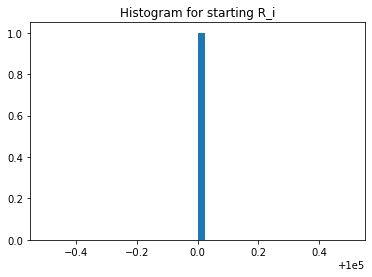

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 302001., 201013., 201000., 296059., 198033., 198026.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15024., 14950.])

In [25]:
experiments.UNI_Qj.unique()

array([200000., 173266., 174748., ..., 203053., 201091., 201999.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 115634., 114650., ...,  98502.,  99021., 125309.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

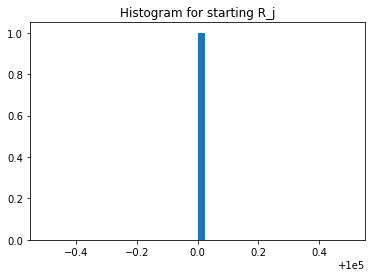

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


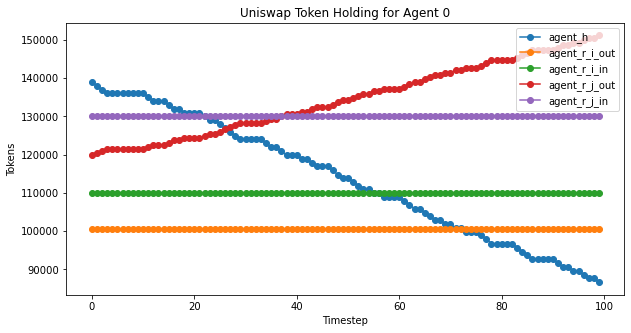

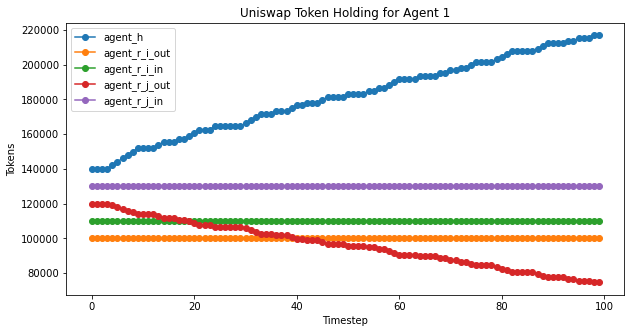

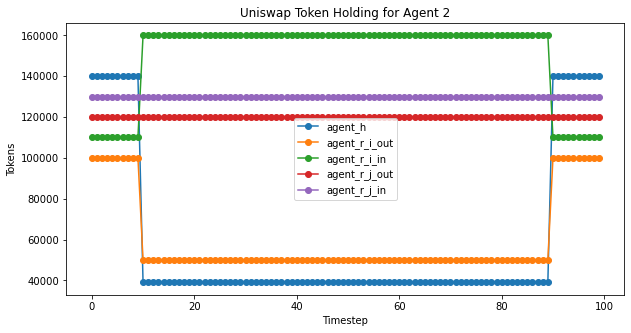

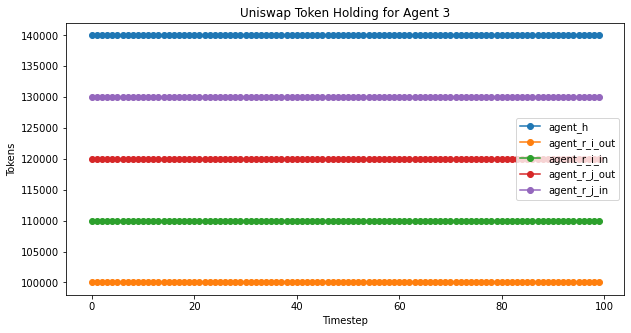

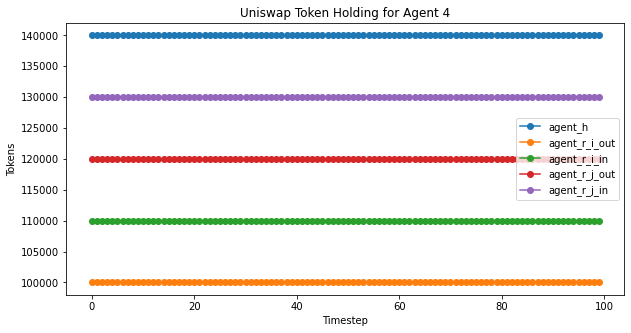

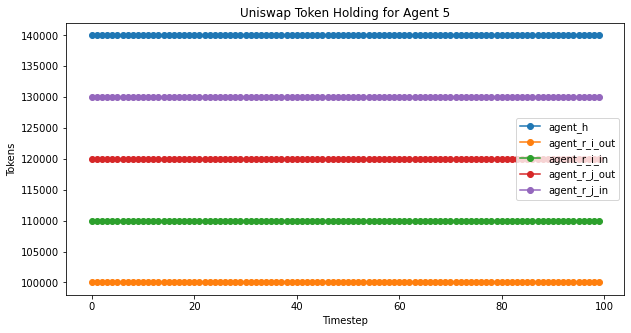

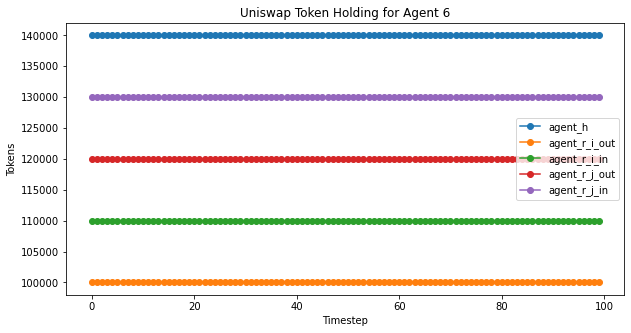

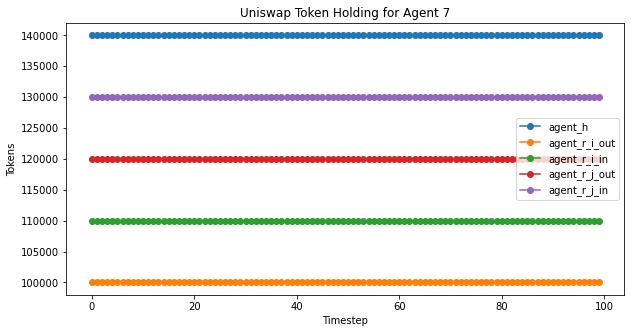

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


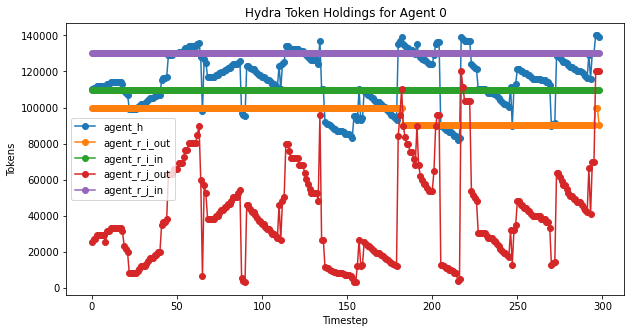

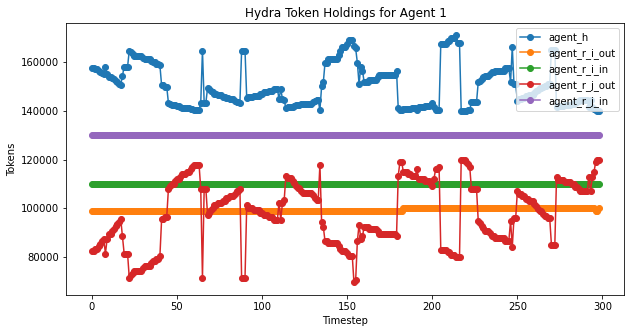

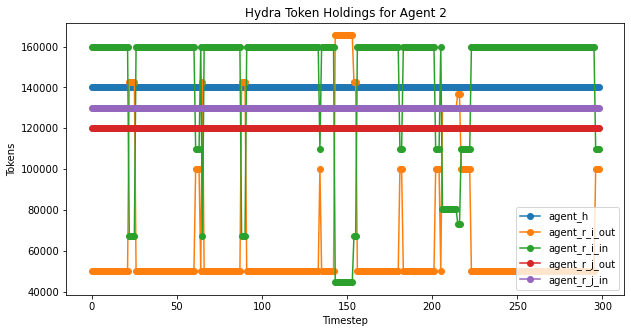

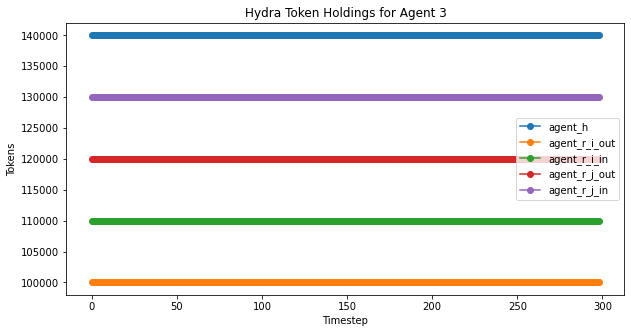

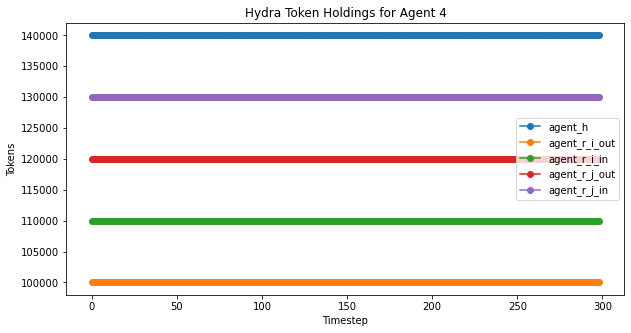

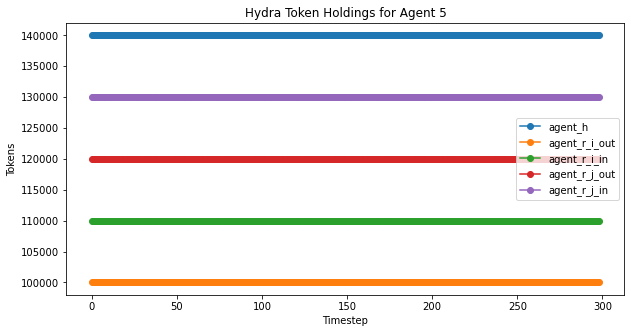

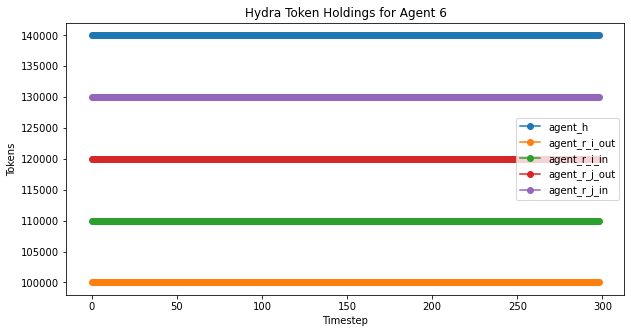

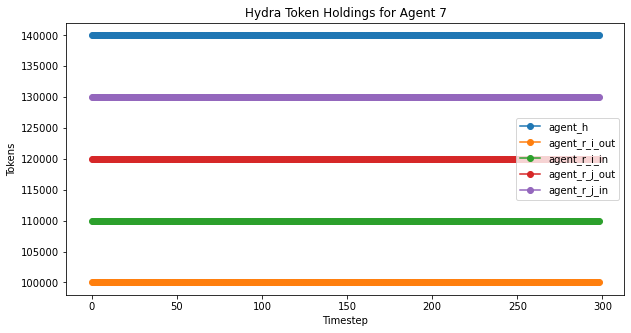

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

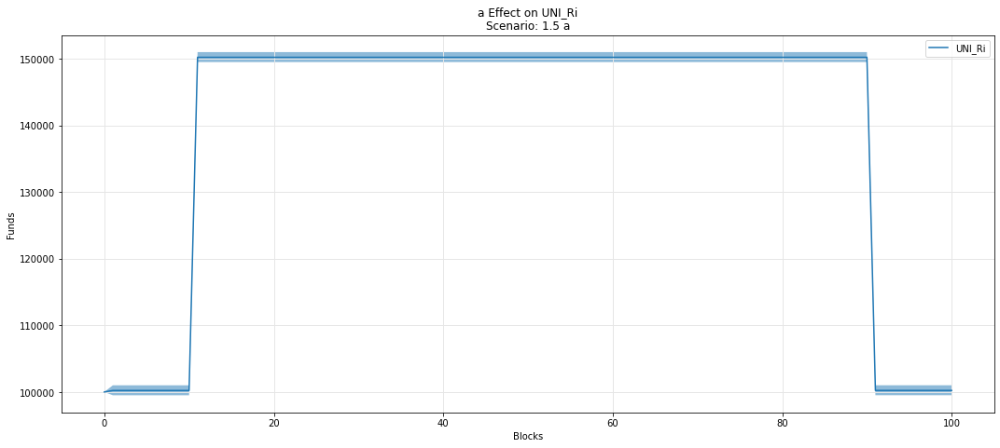

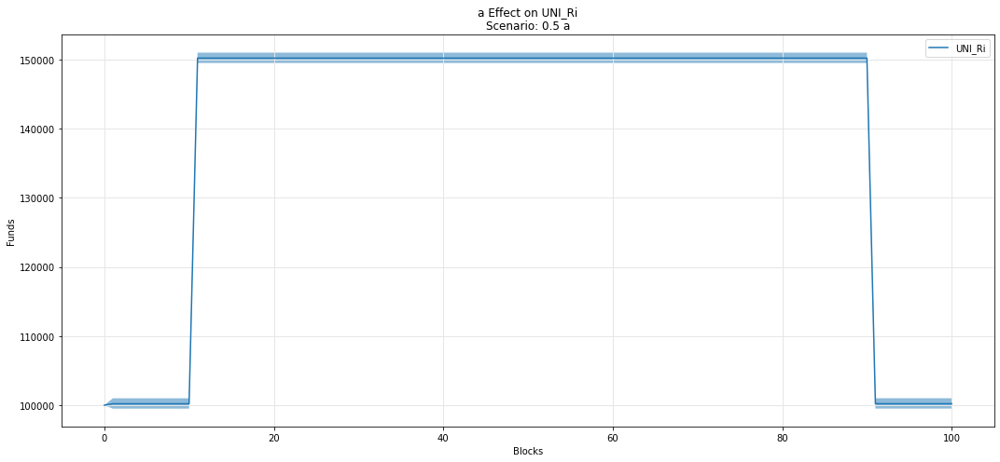

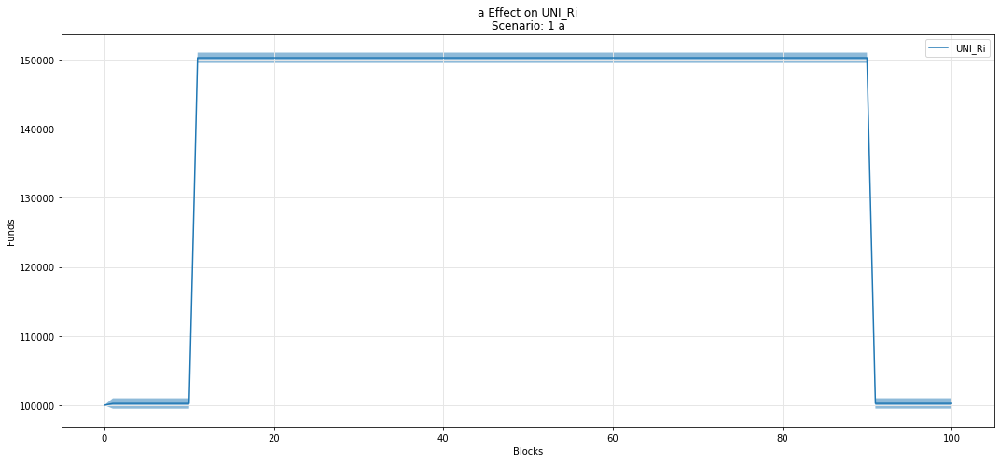

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

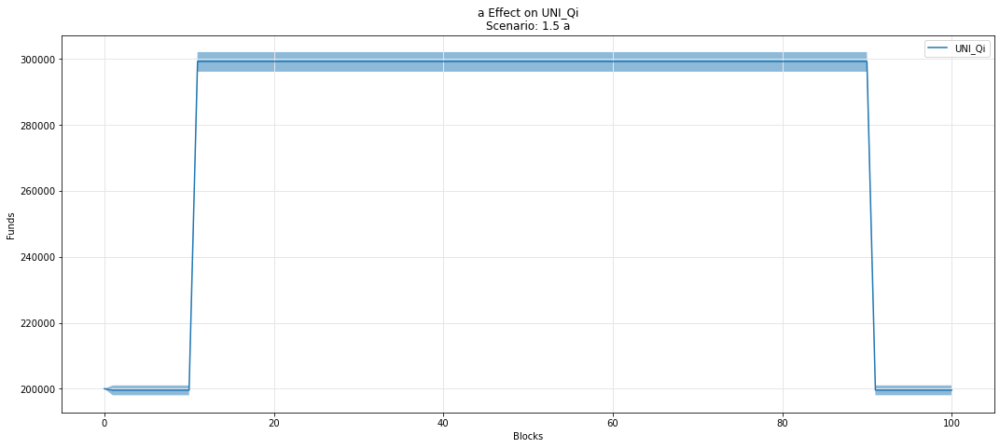

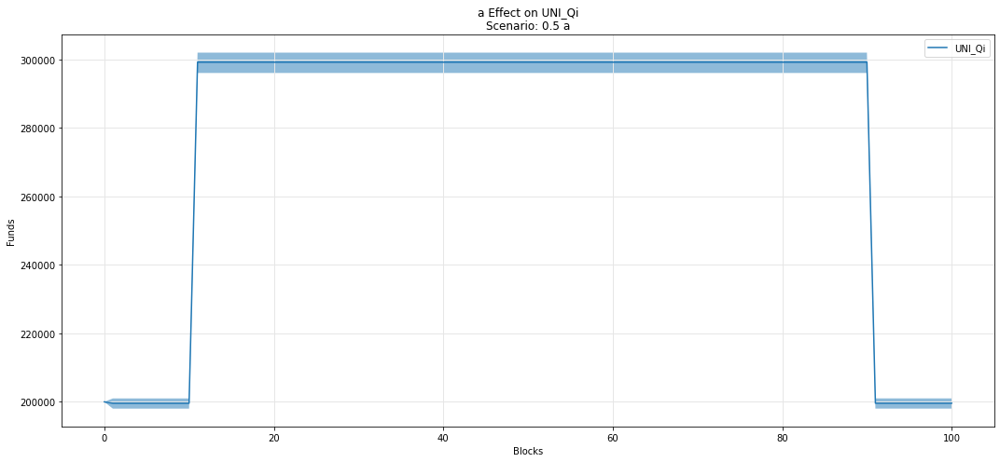

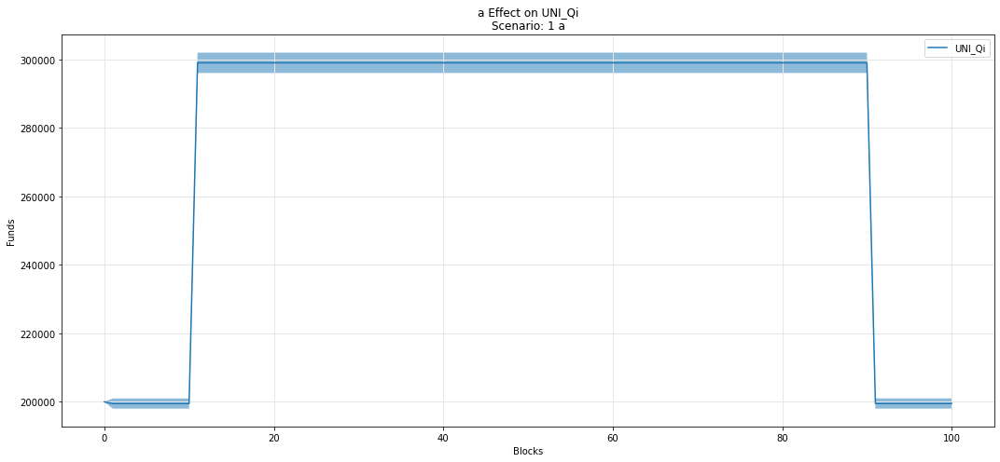

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

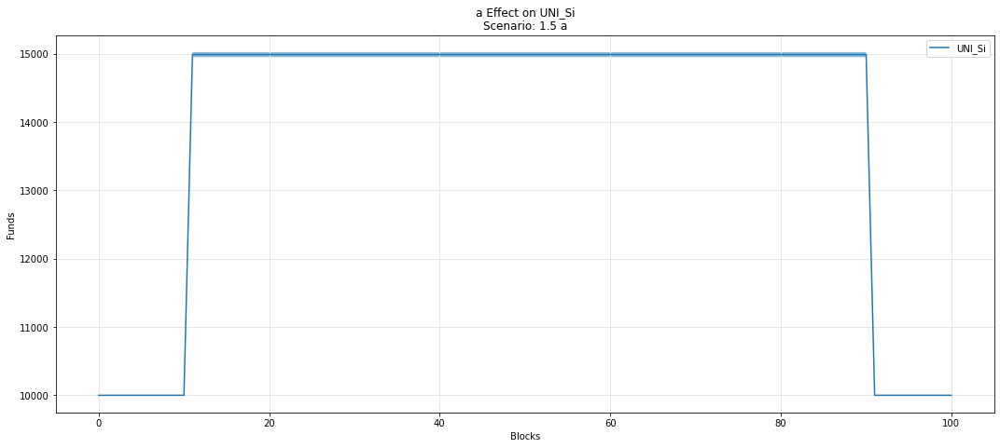

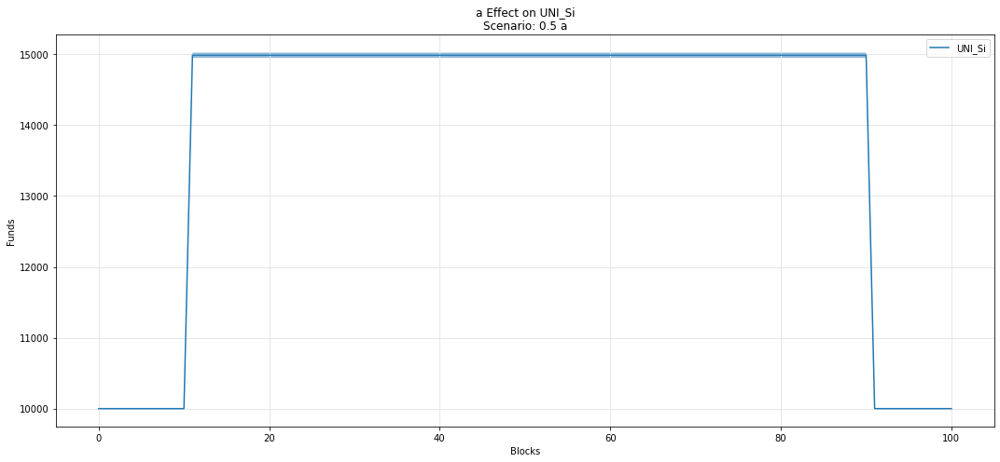

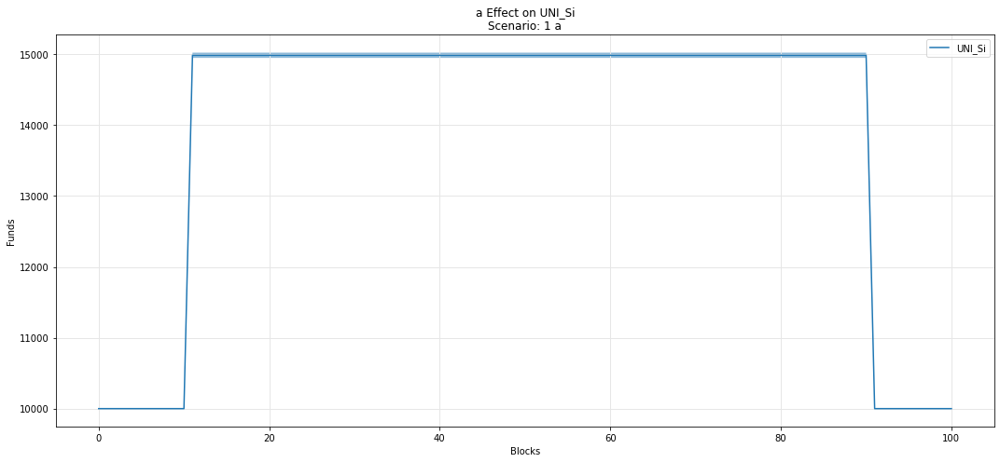

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

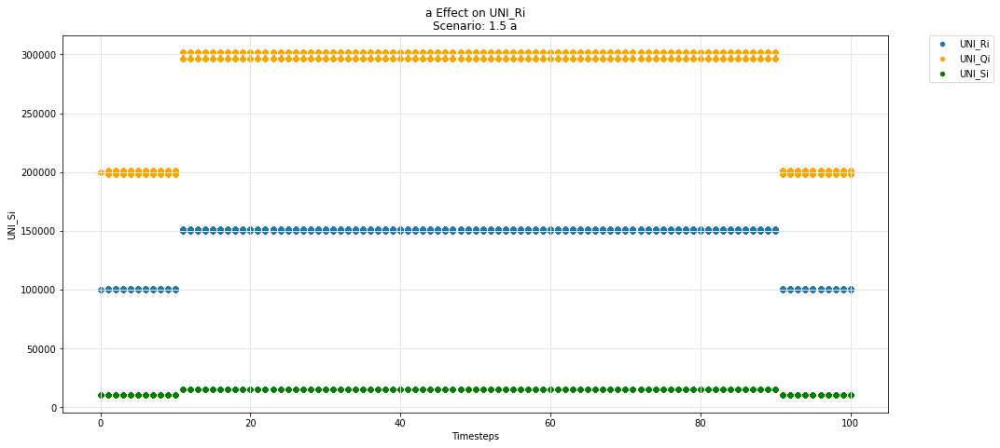

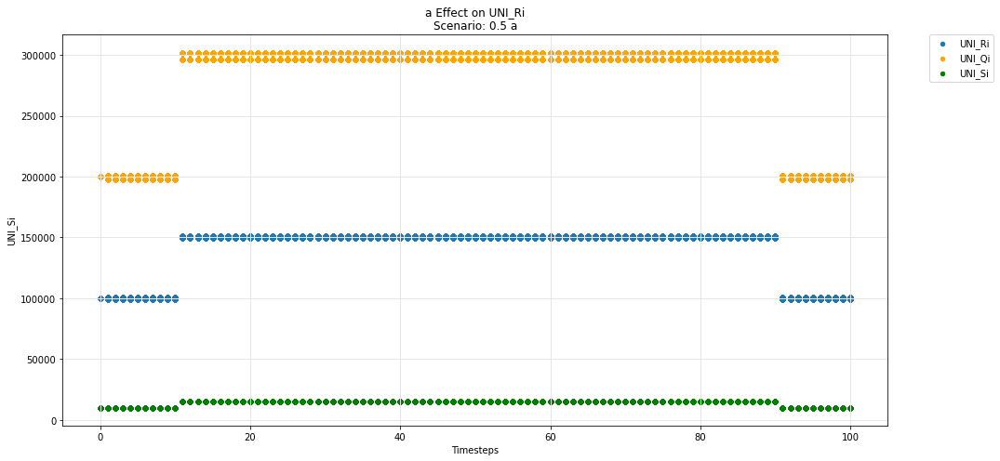

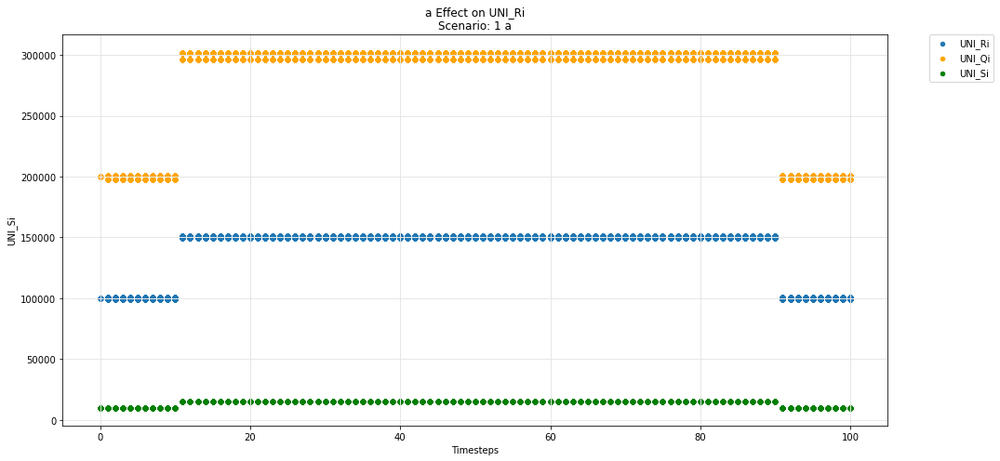

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

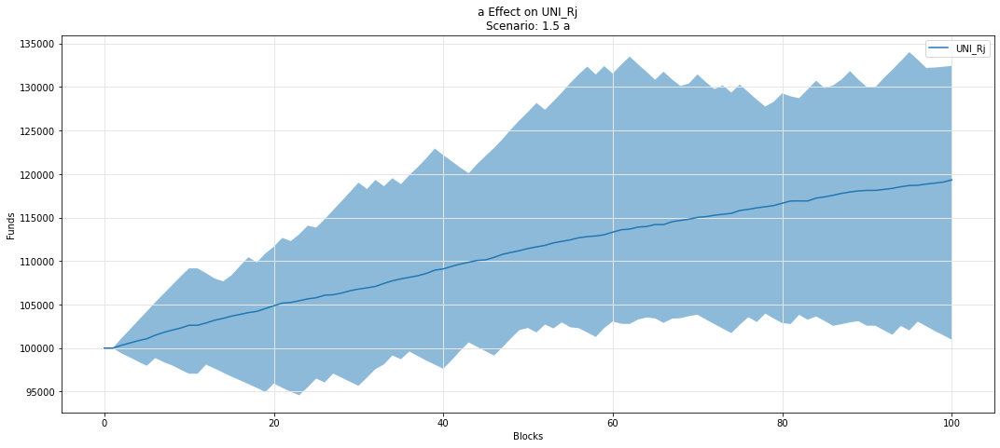

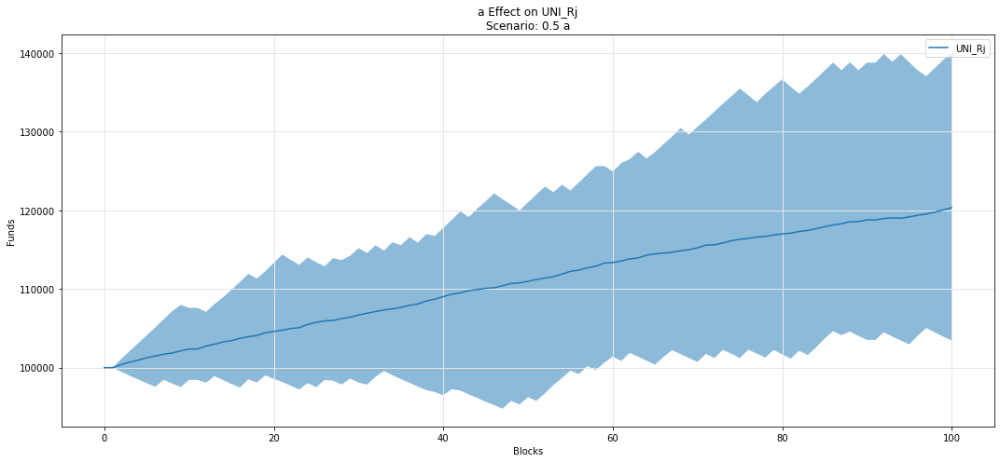

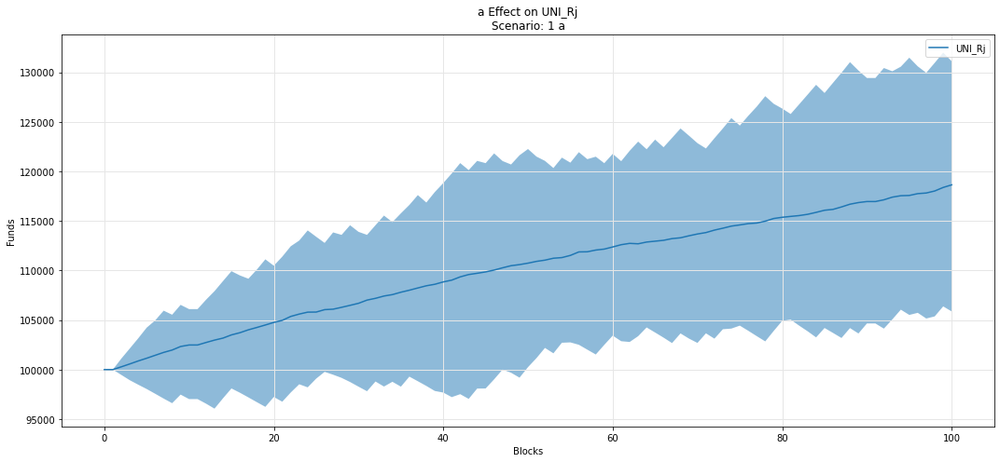

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

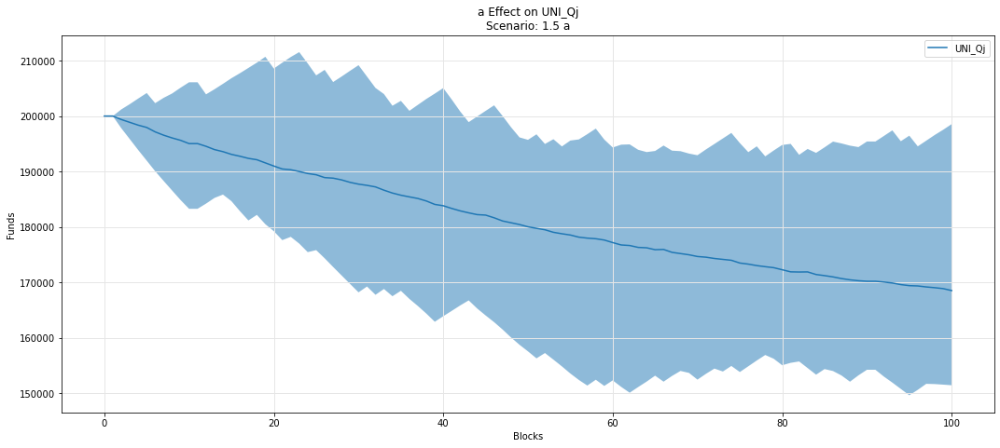

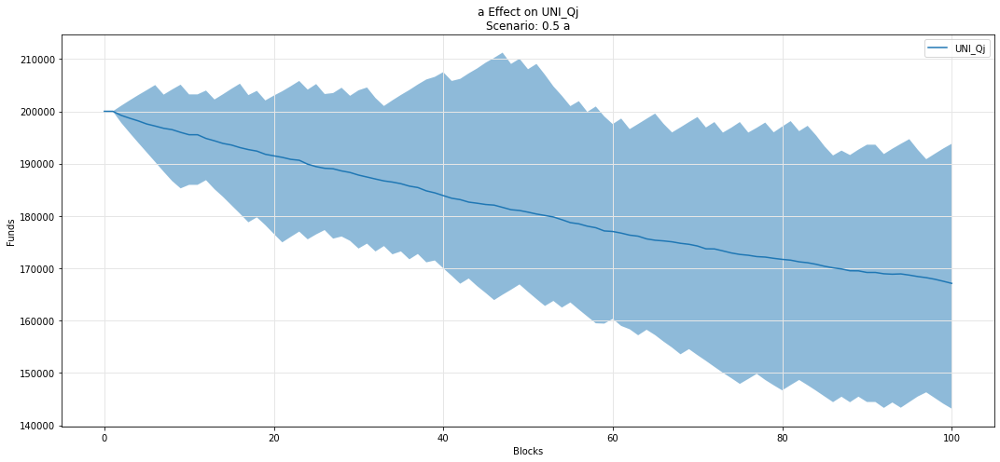

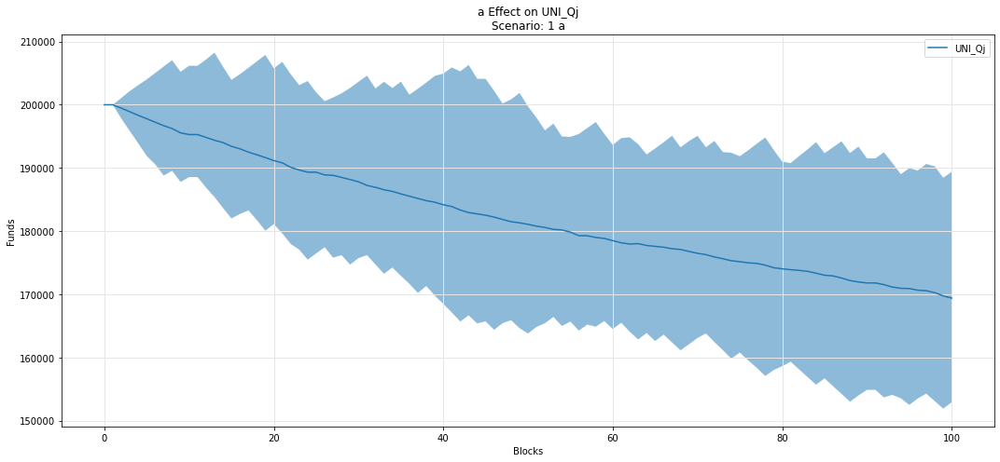

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

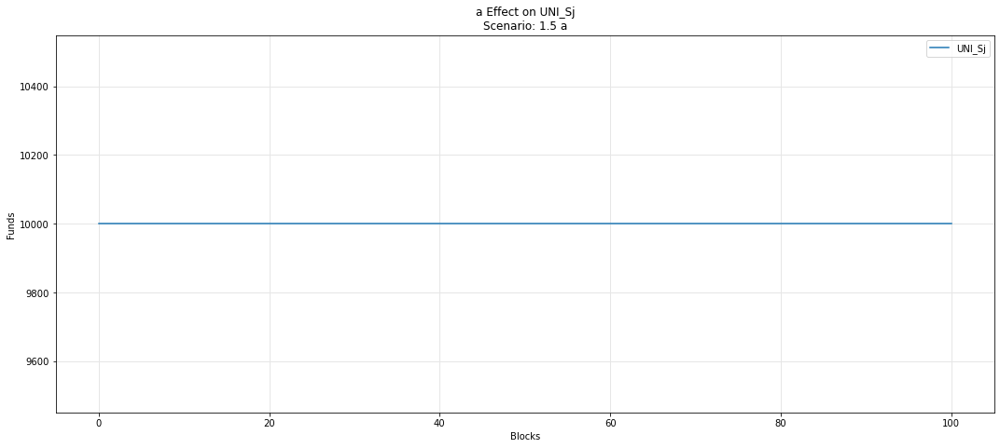

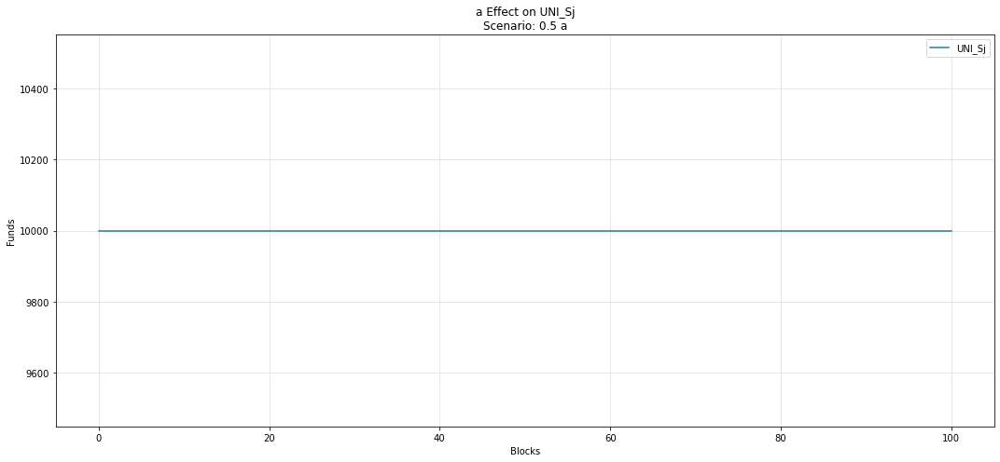

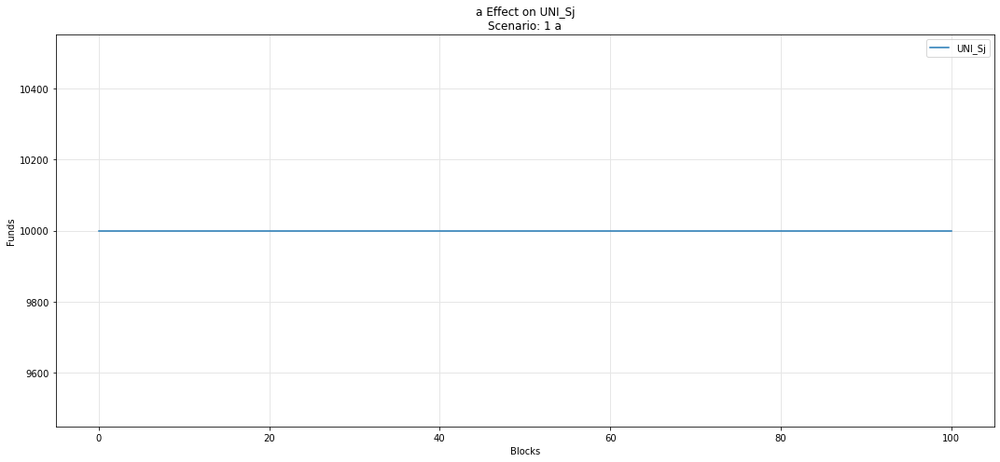

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

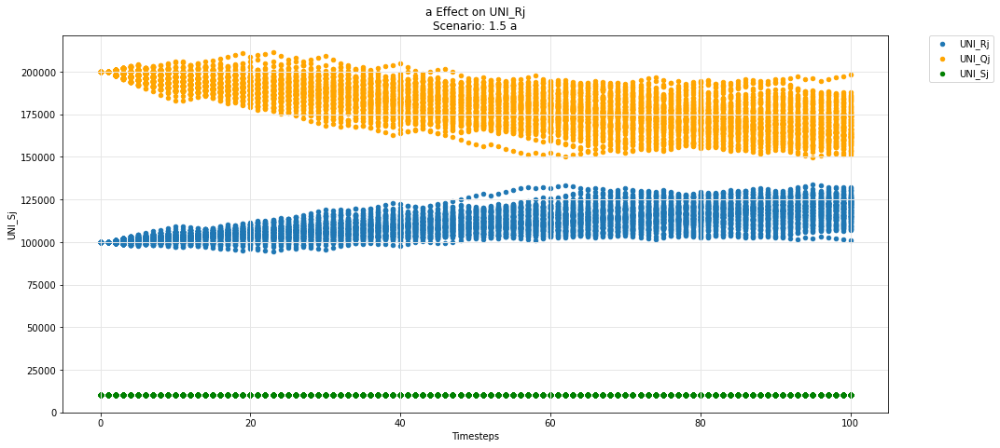

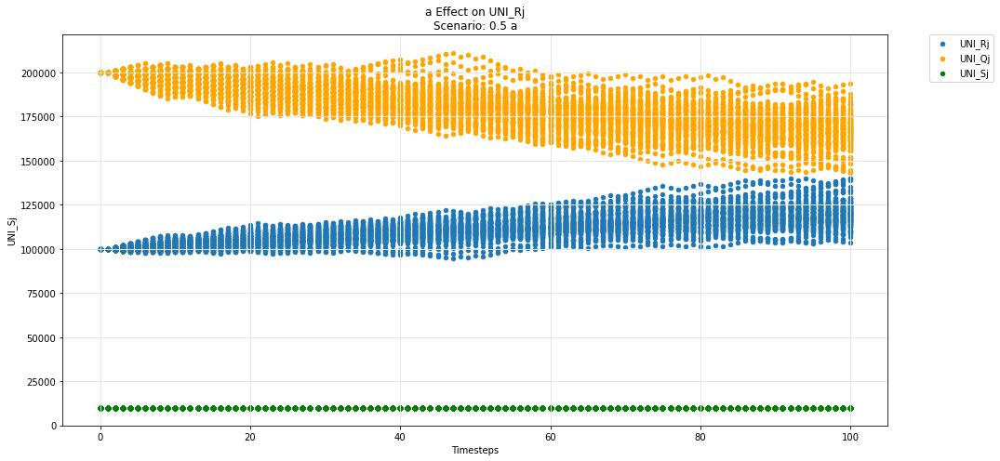

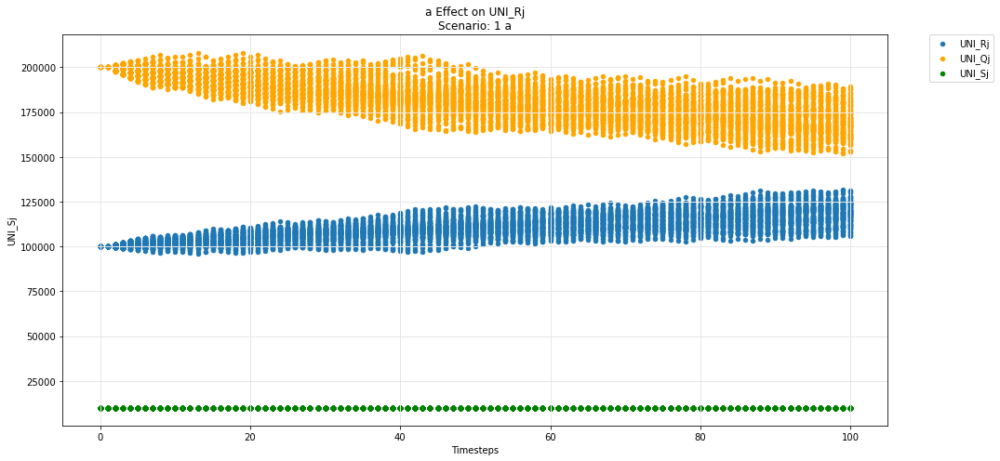

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

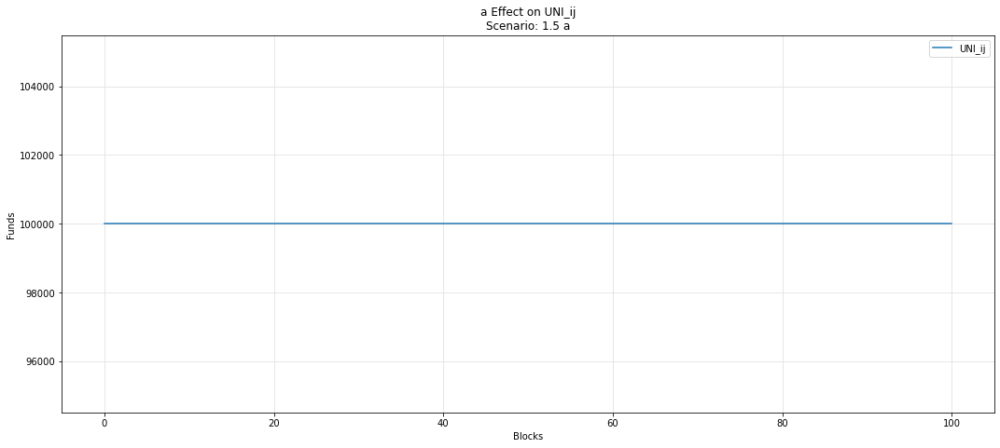

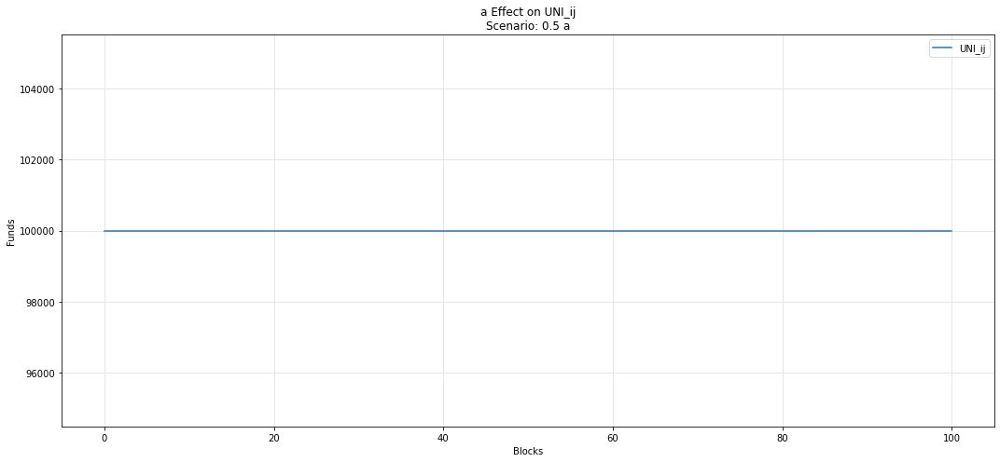

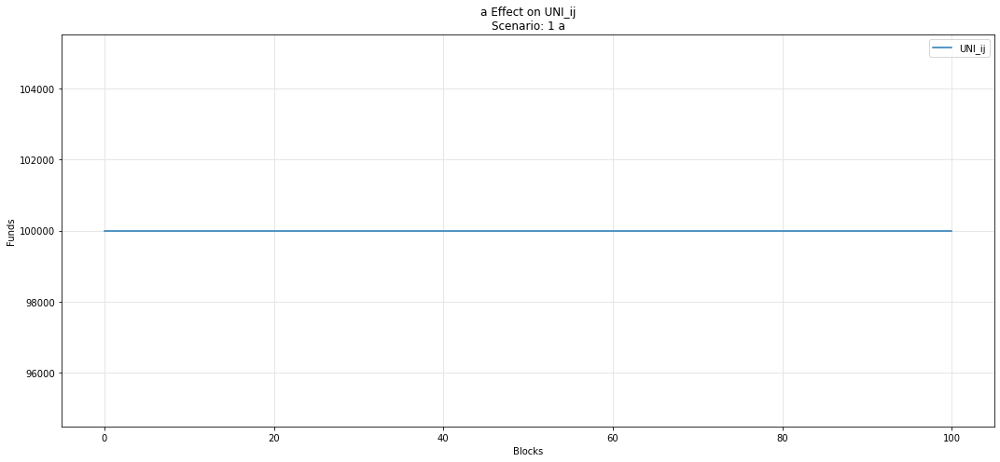

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

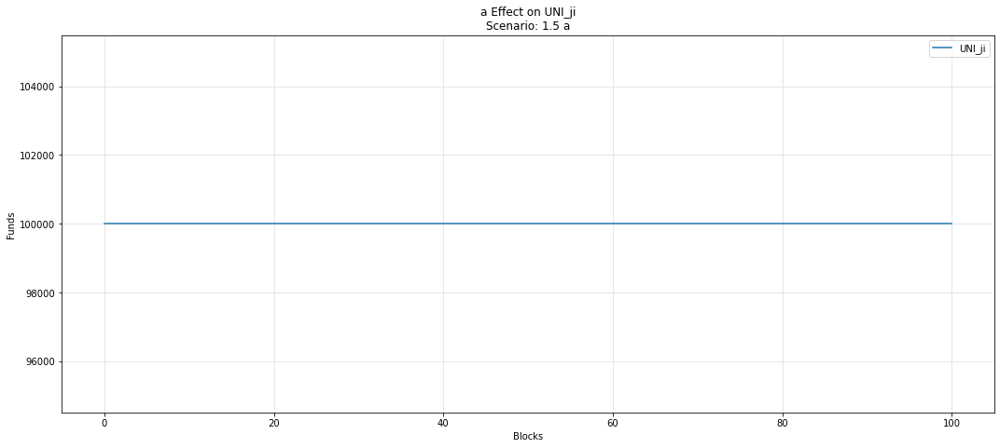

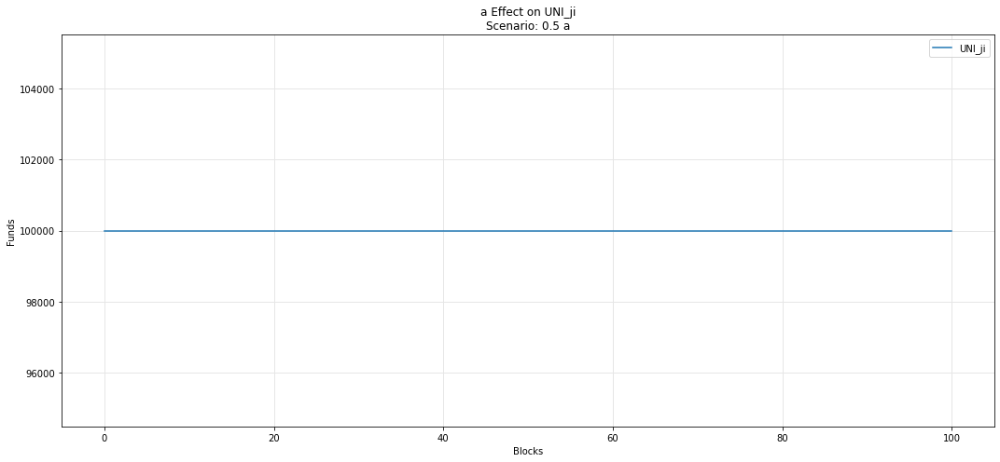

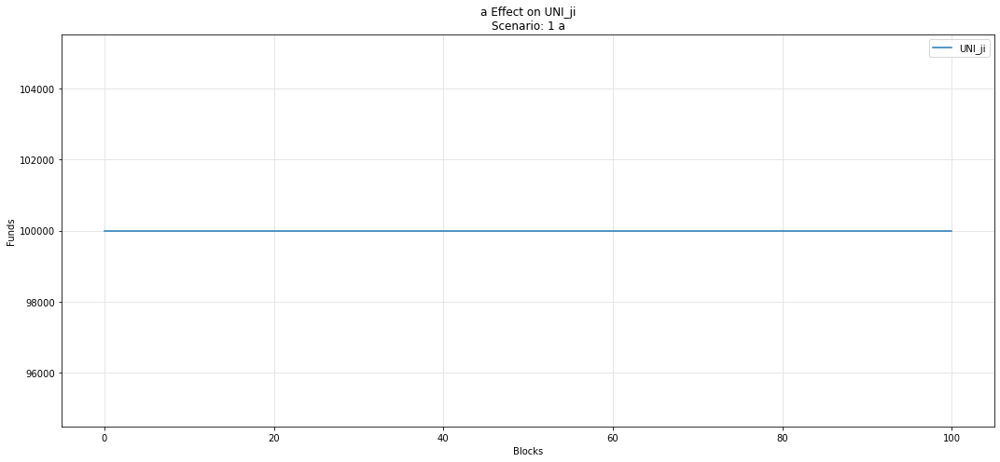

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

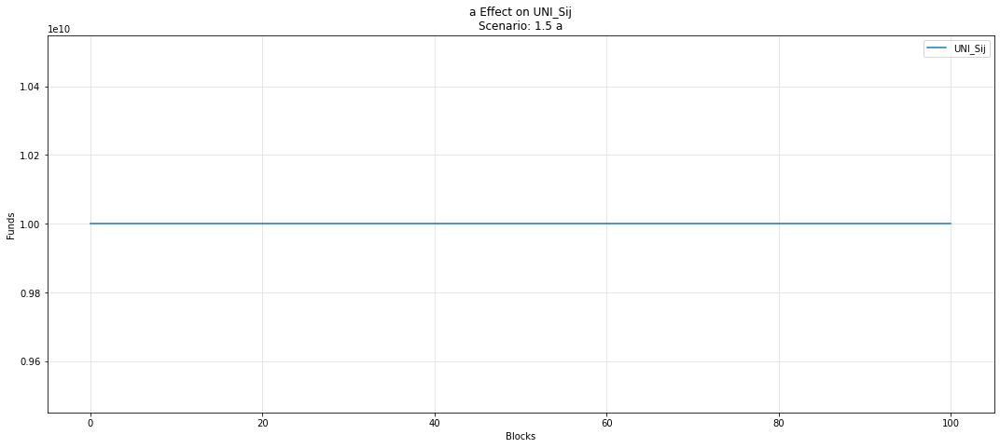

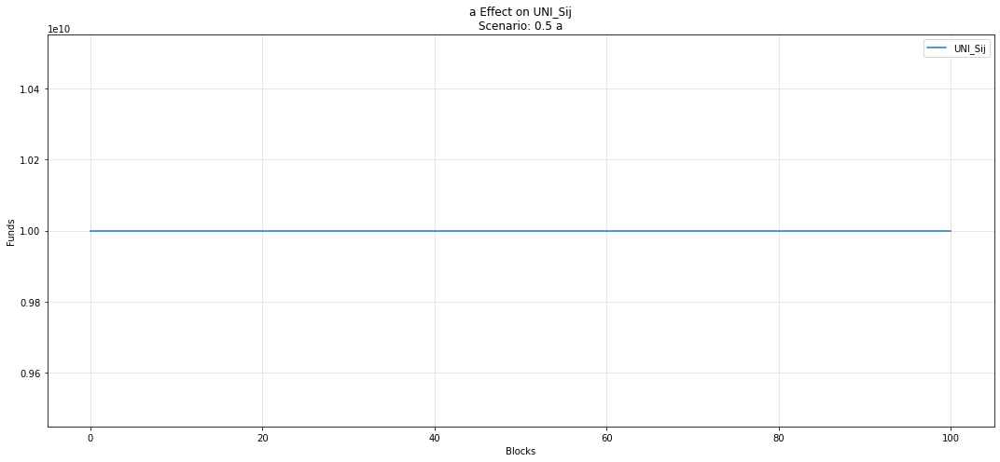

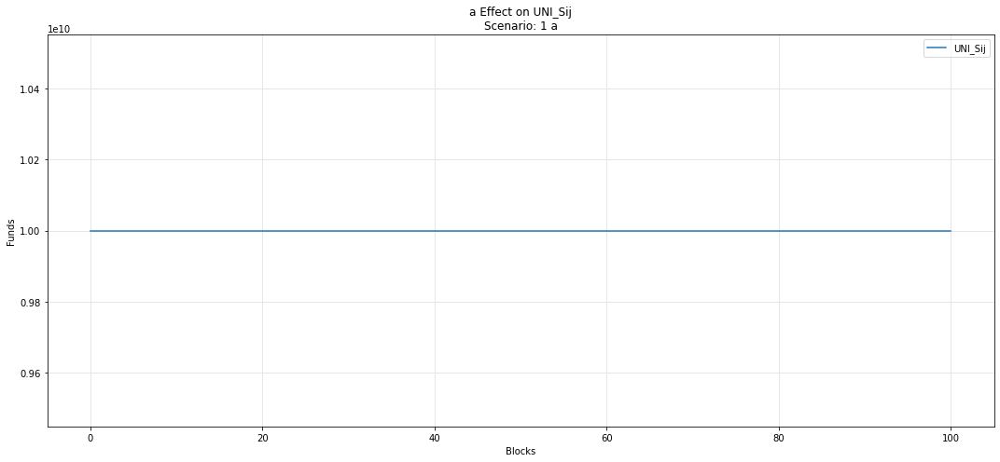

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

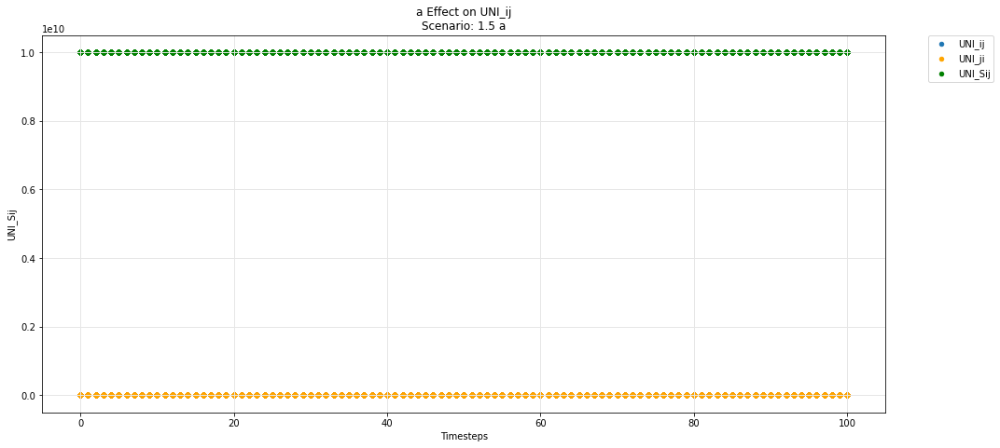

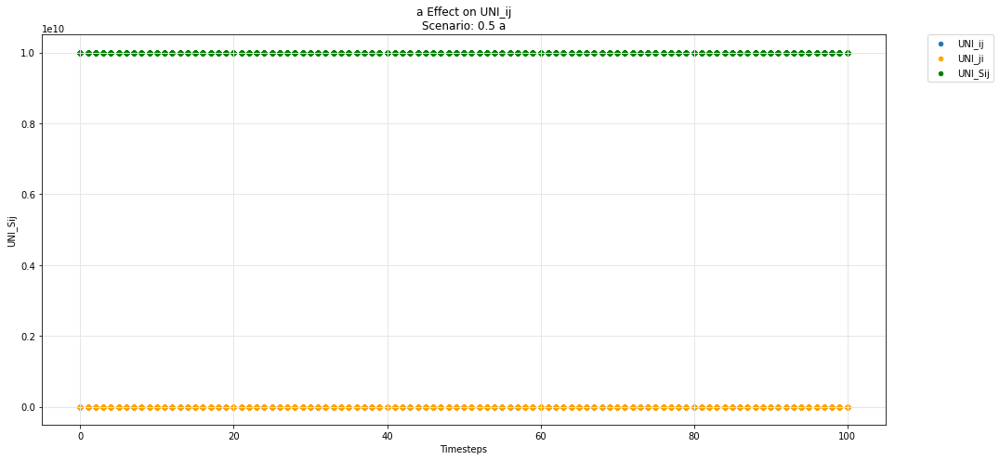

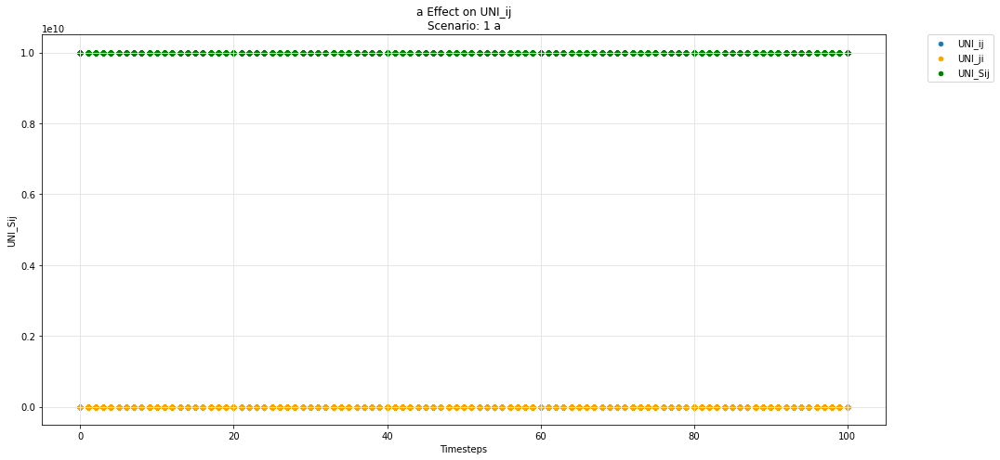

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

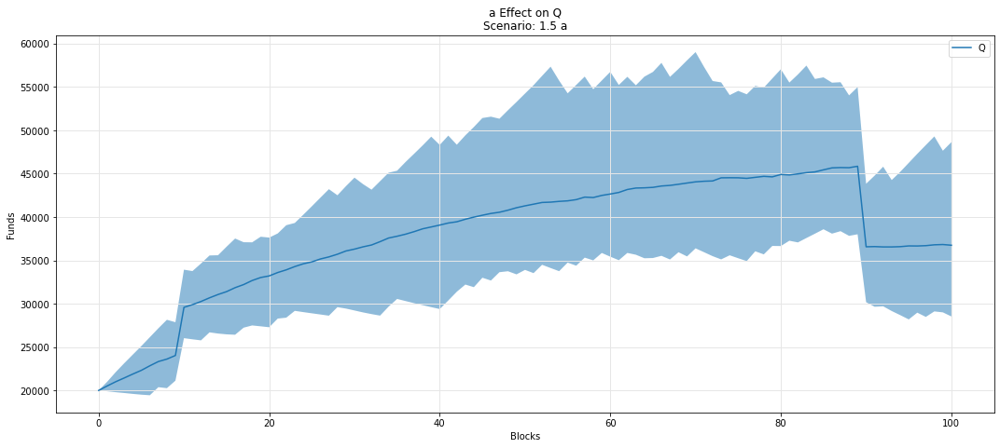

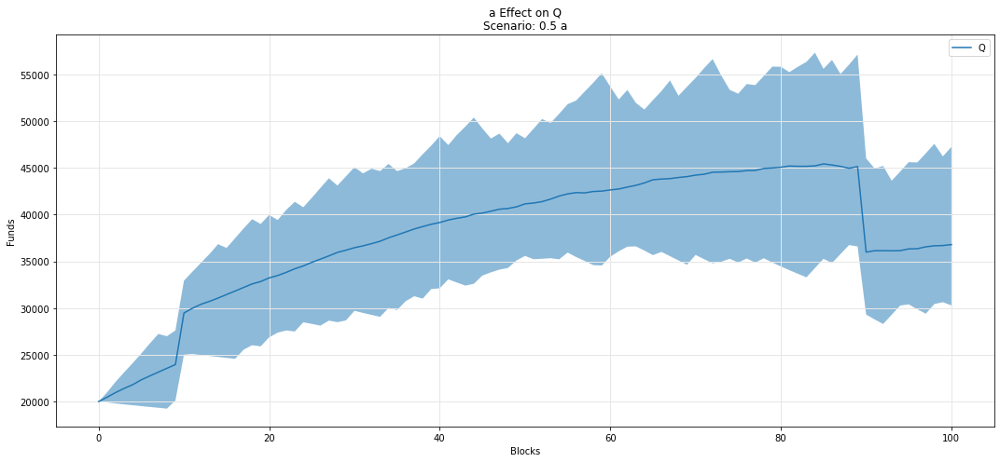

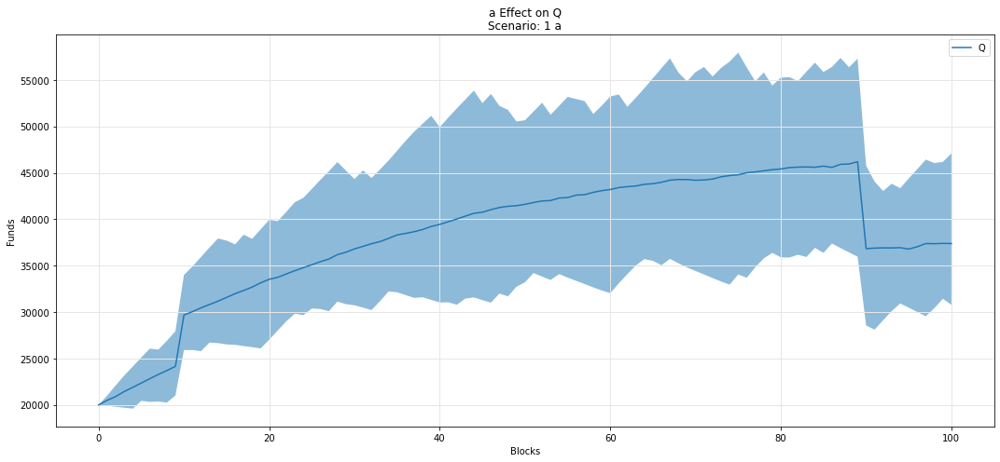

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

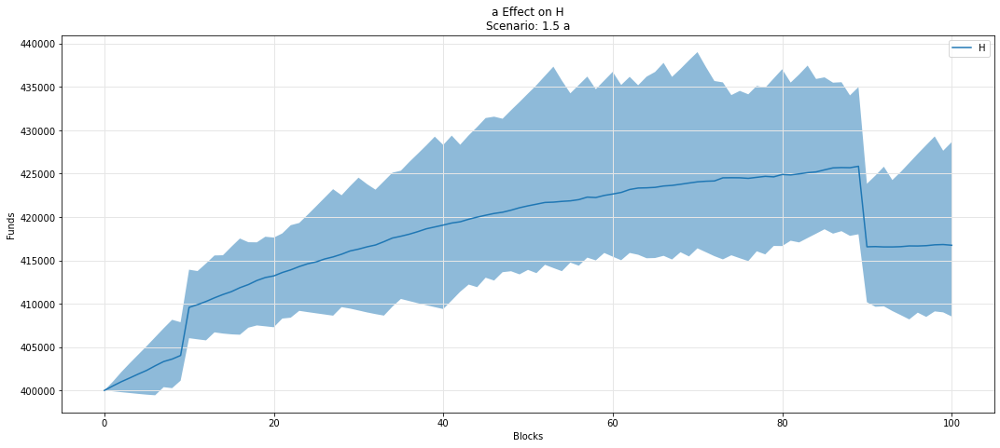

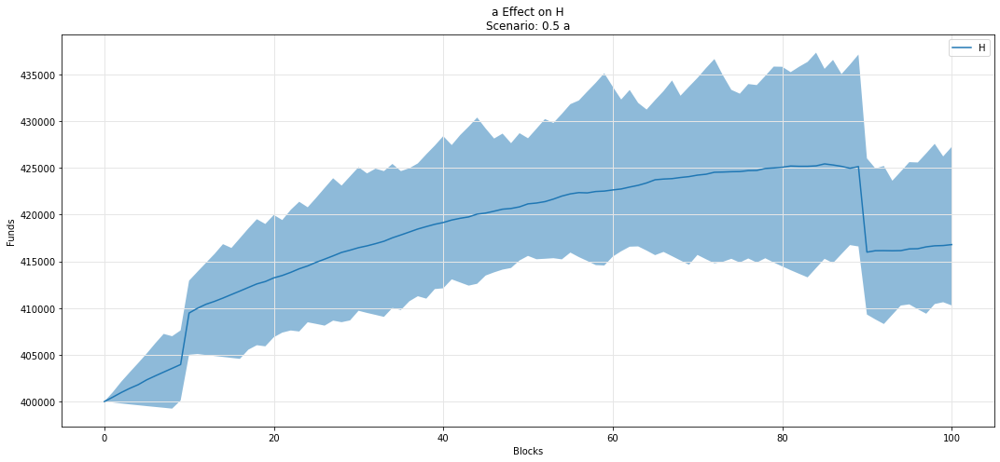

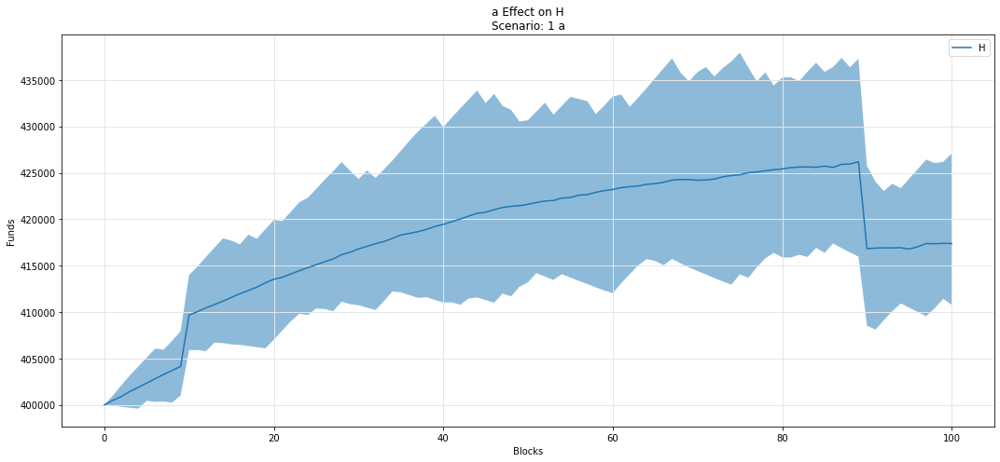

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

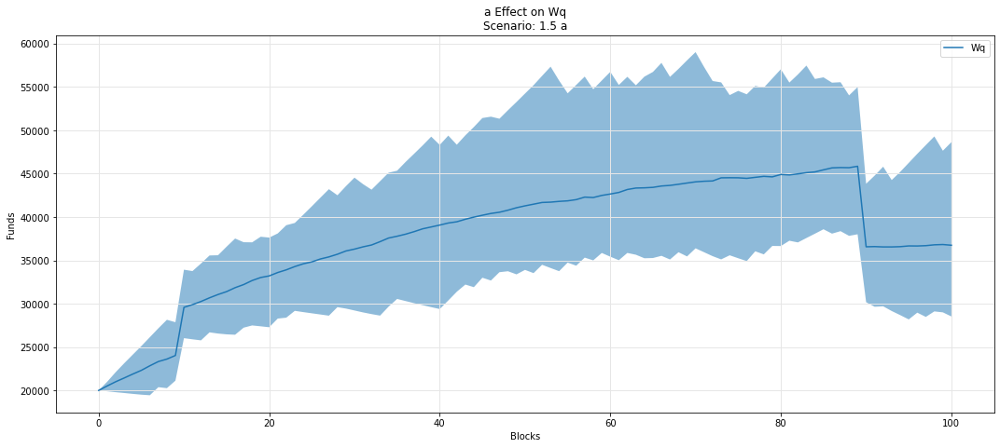

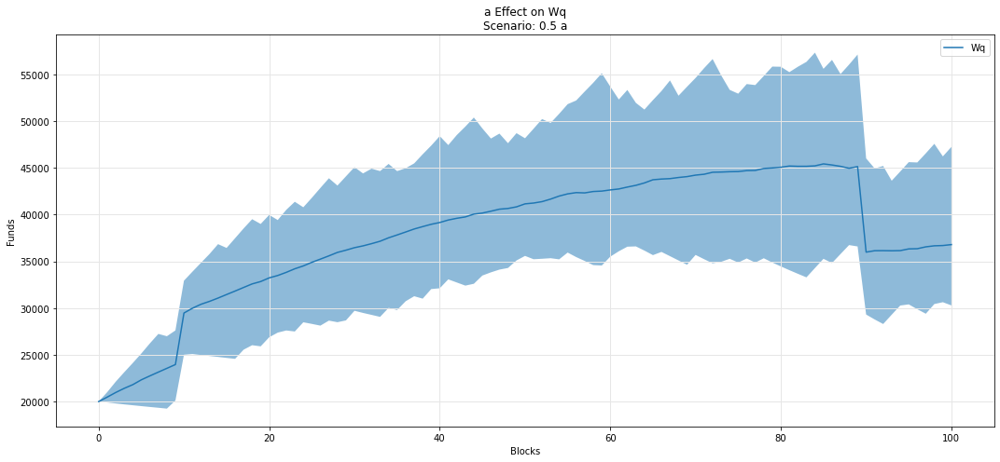

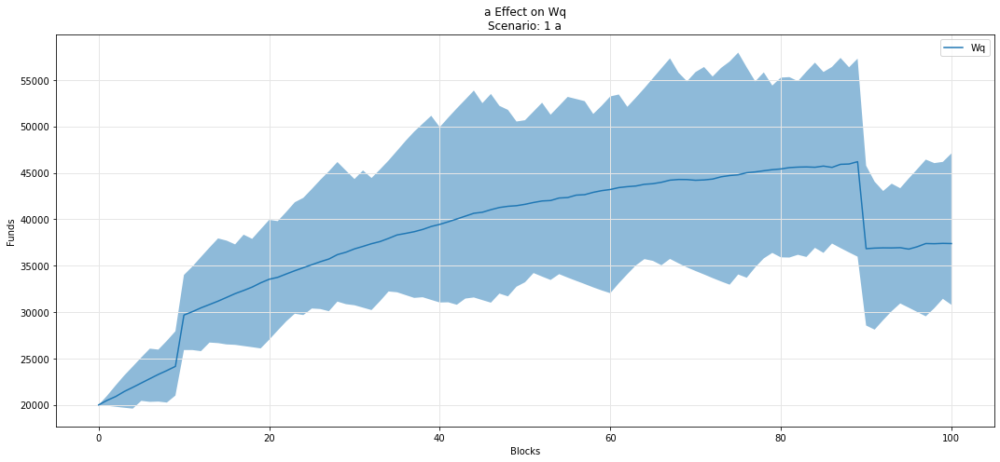

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

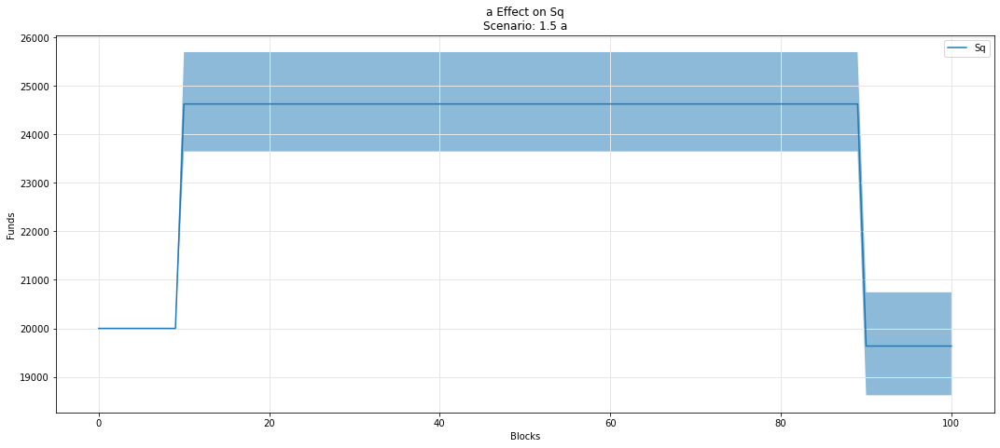

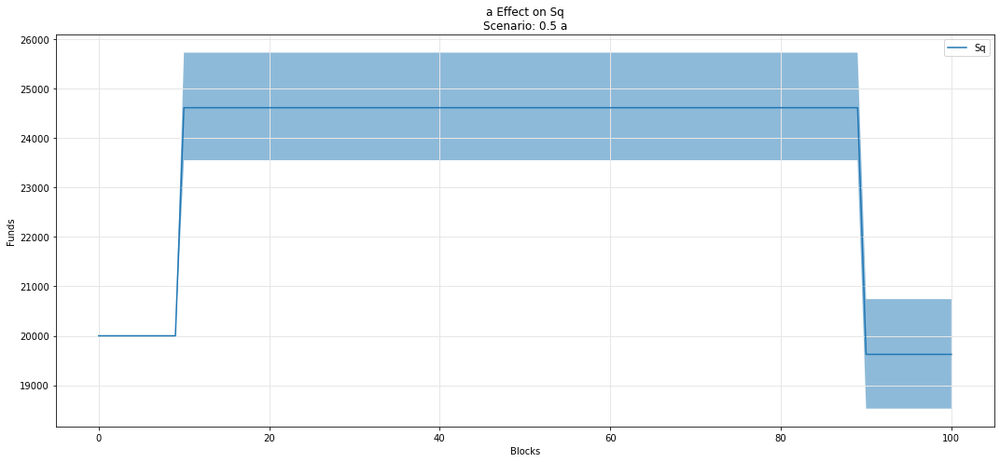

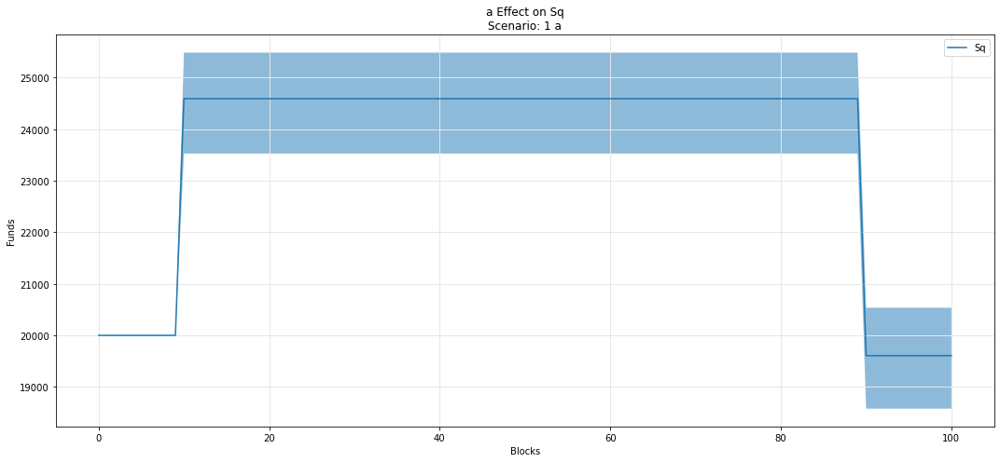

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

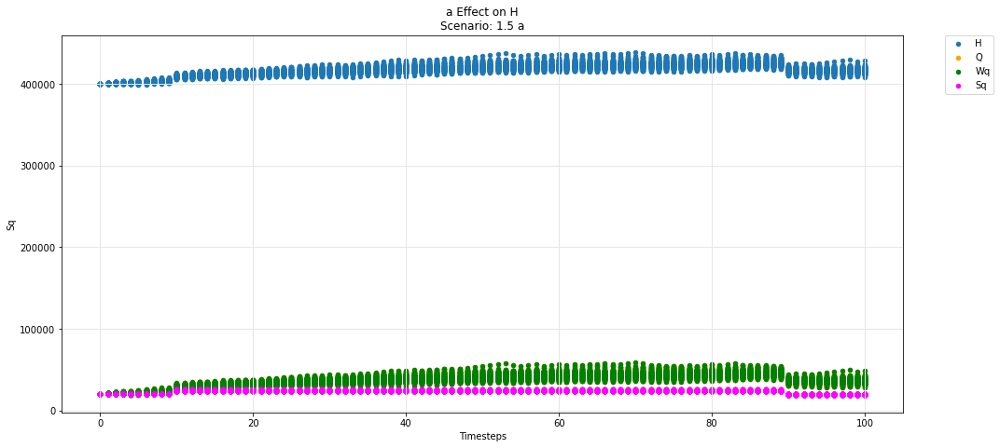

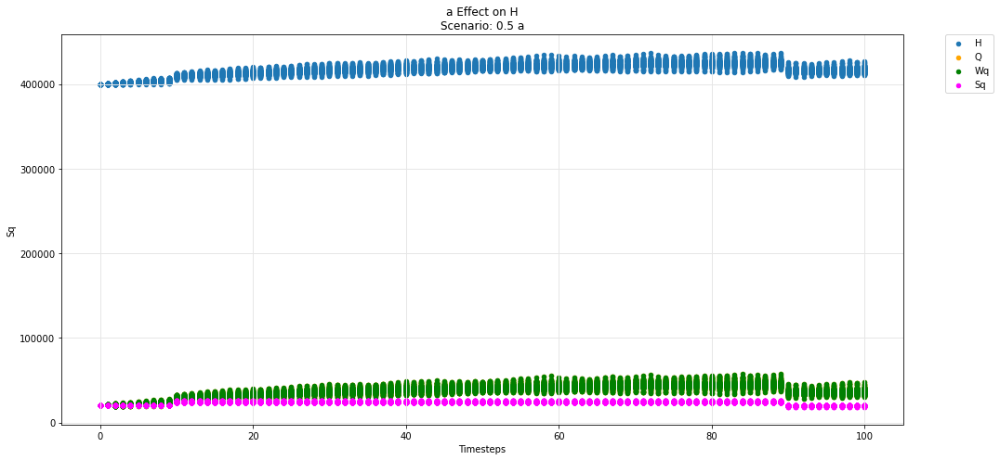

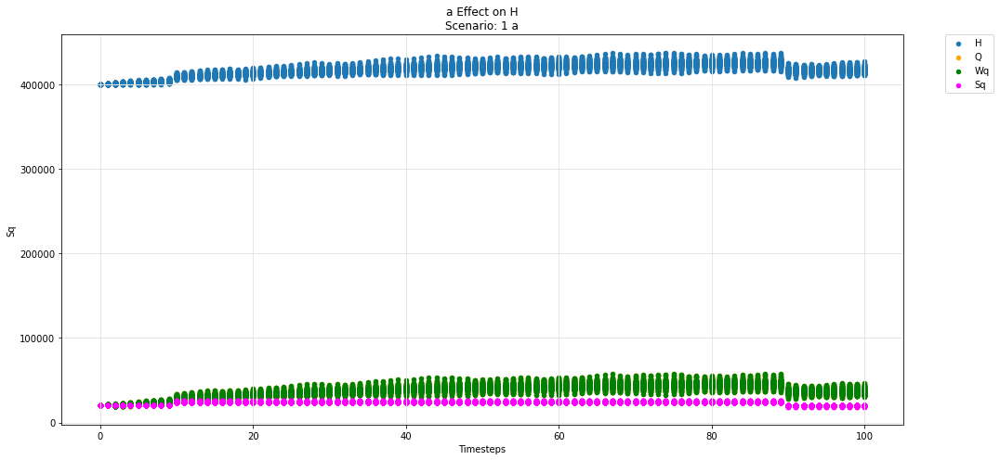

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

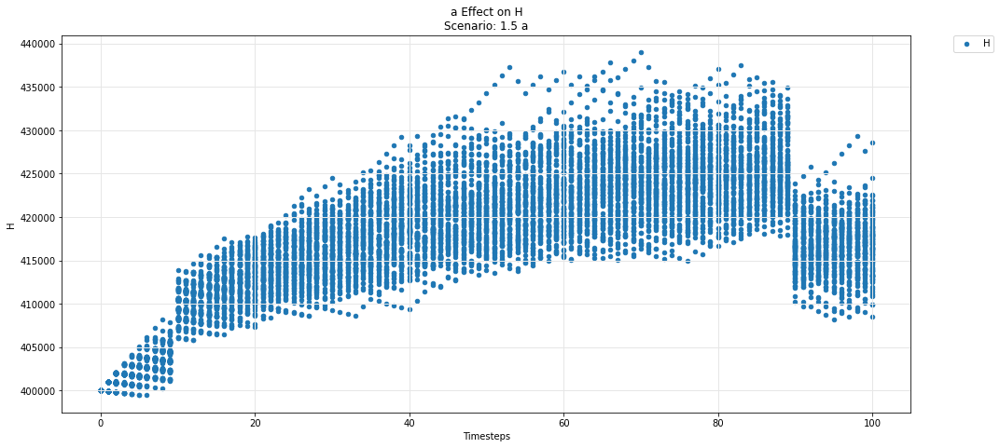

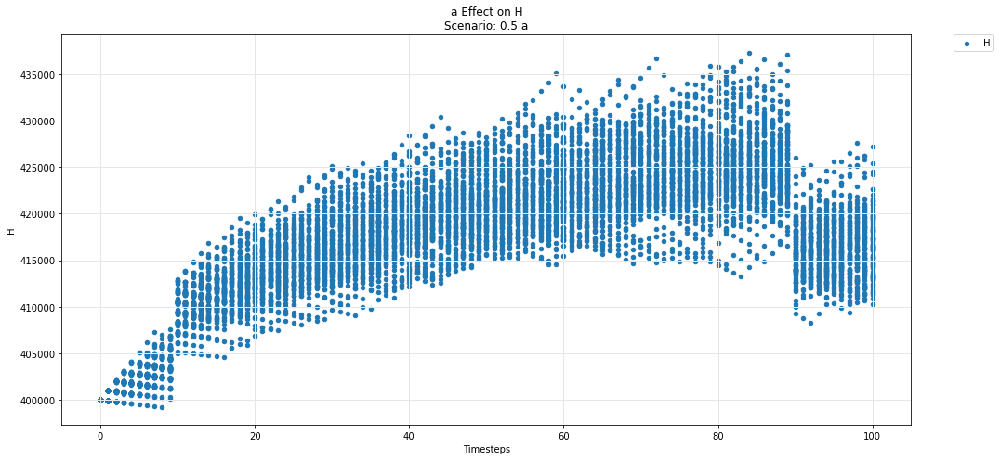

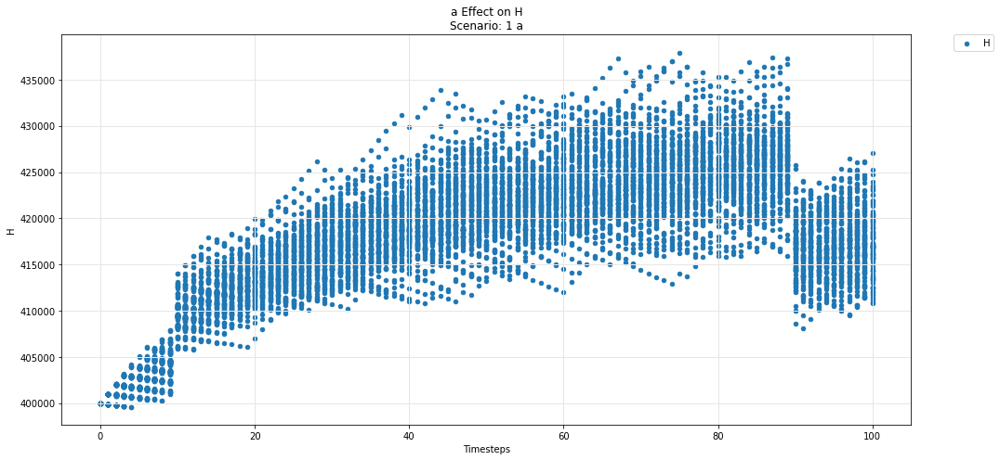

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

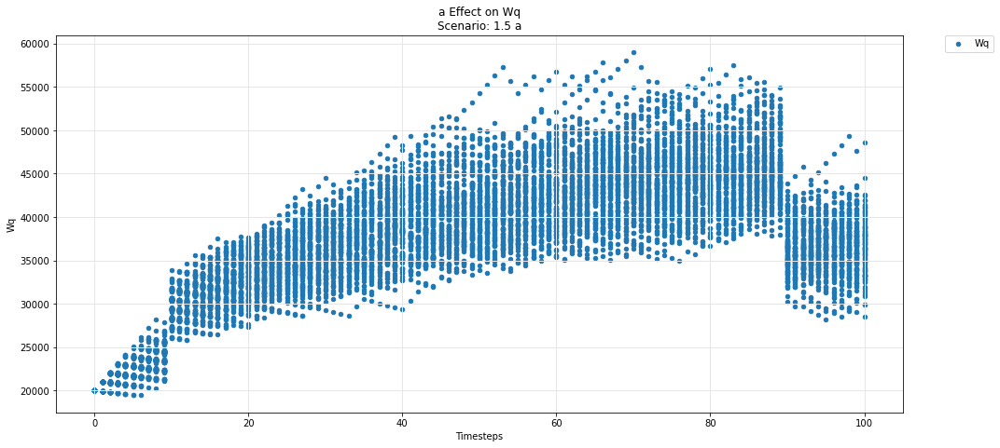

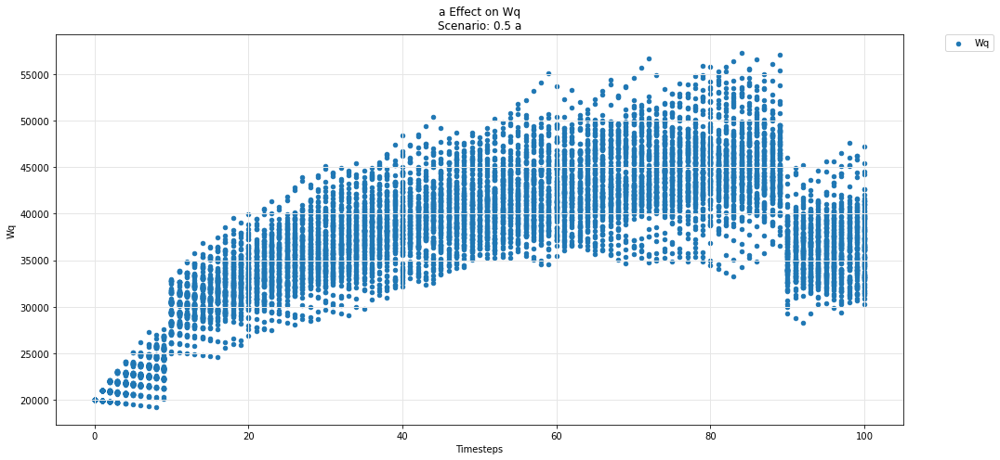

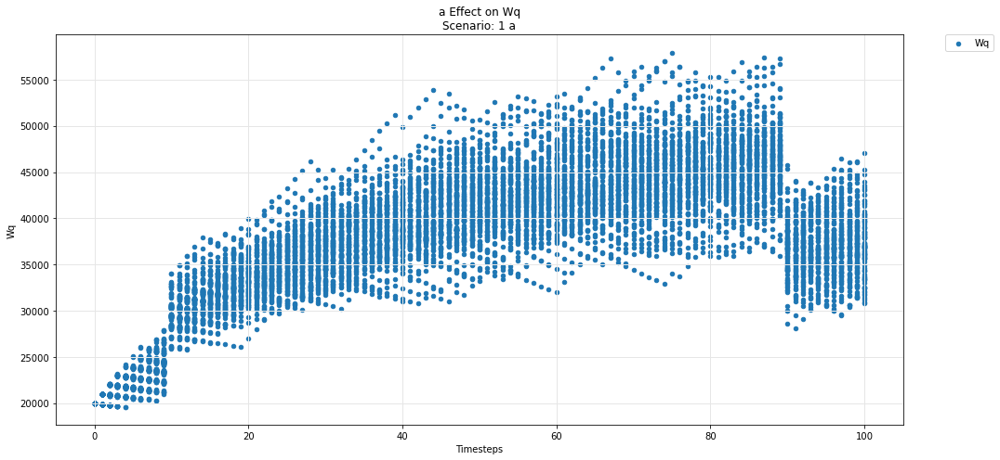

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

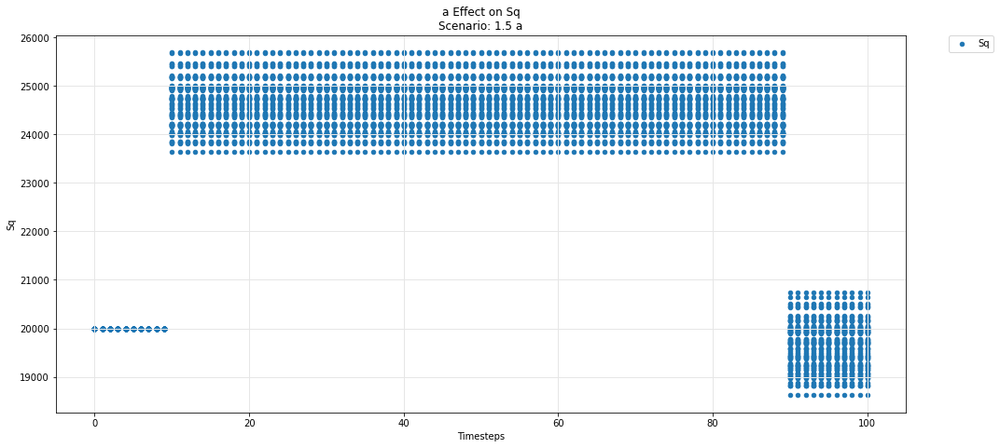

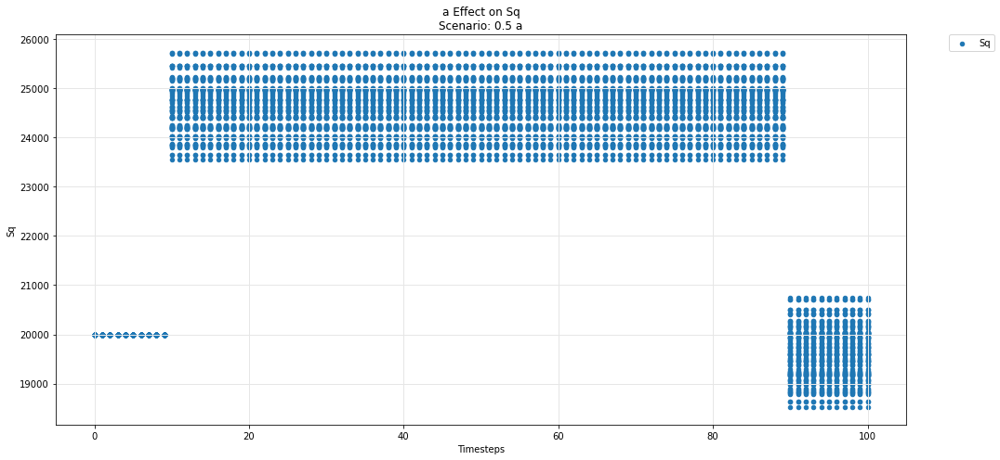

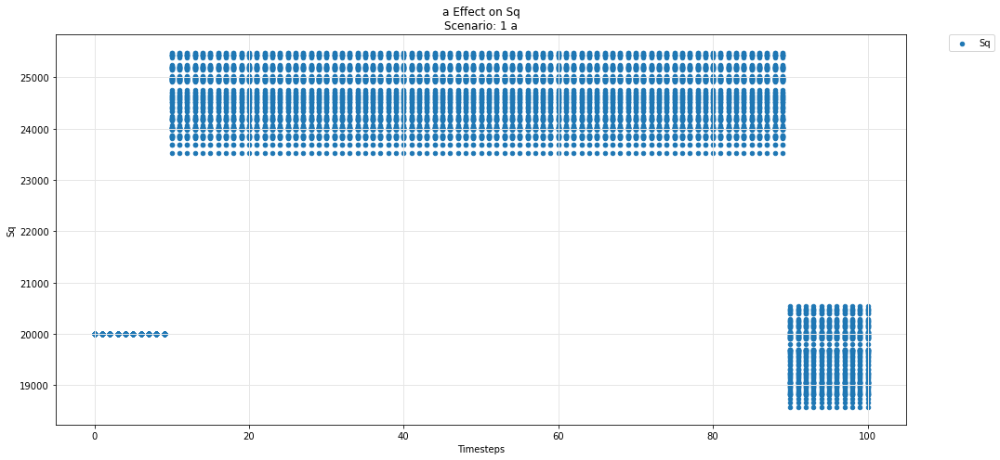

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

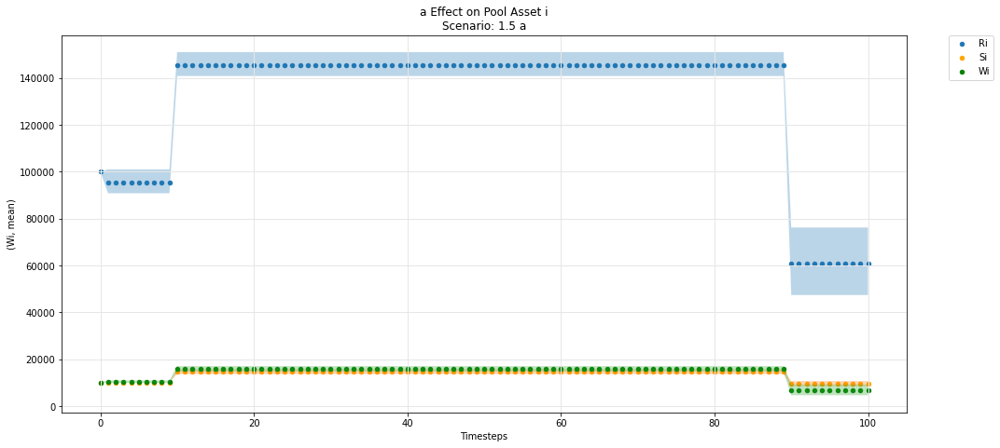

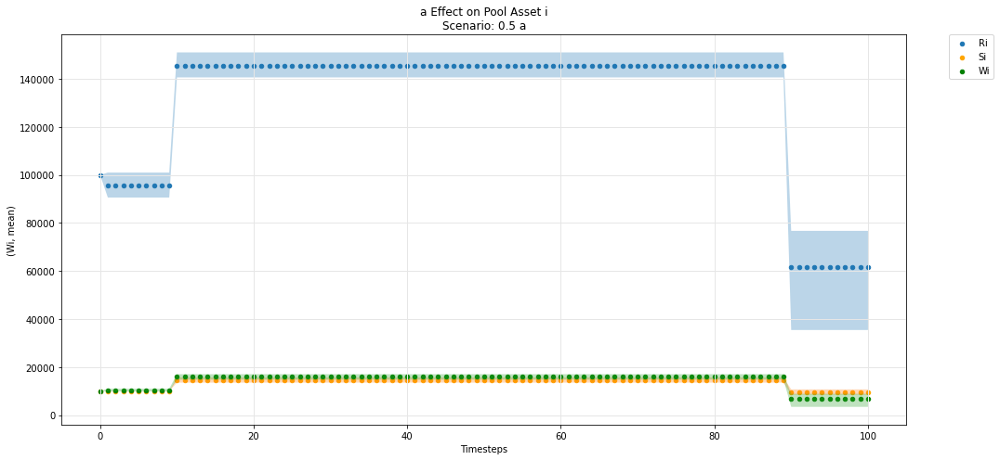

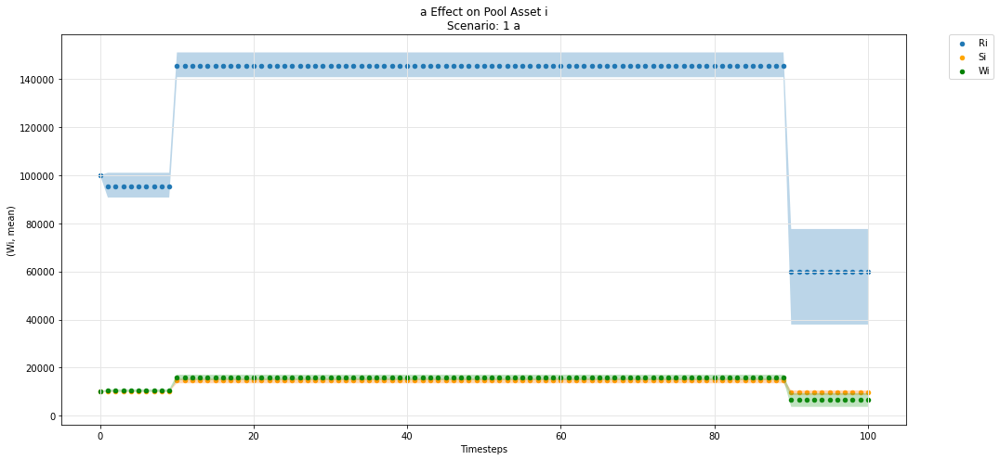

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

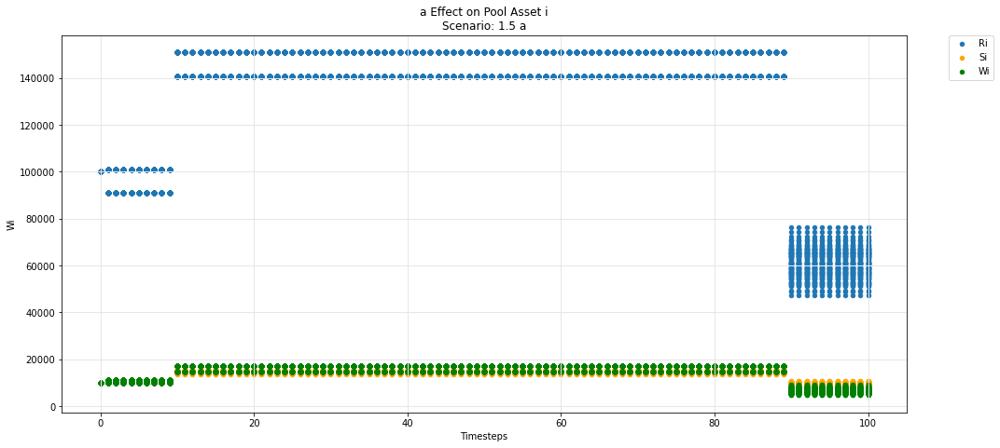

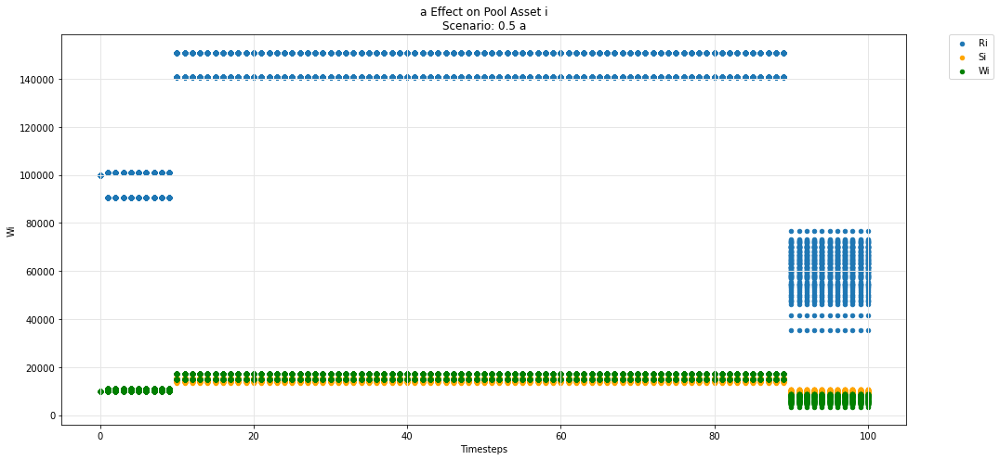

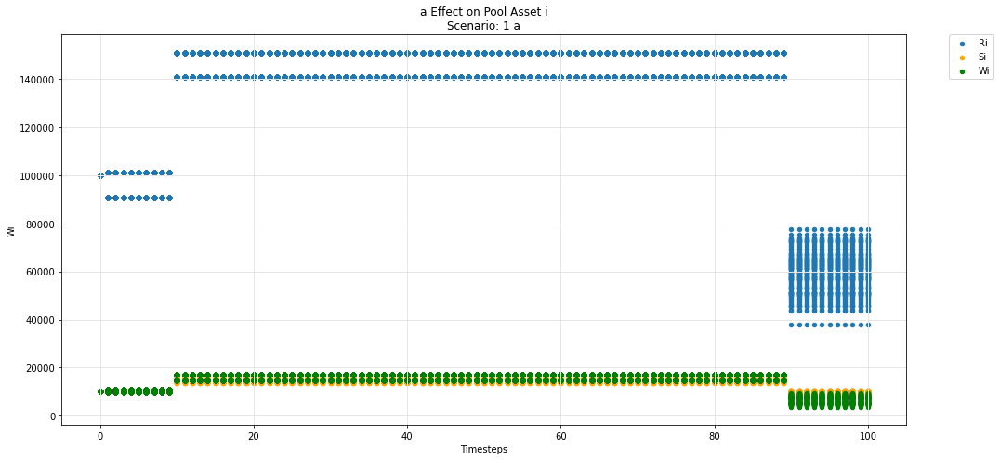

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

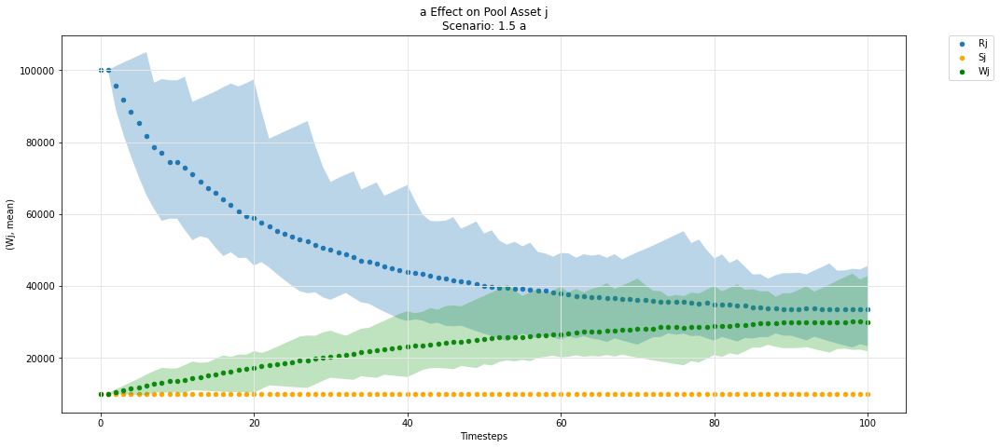

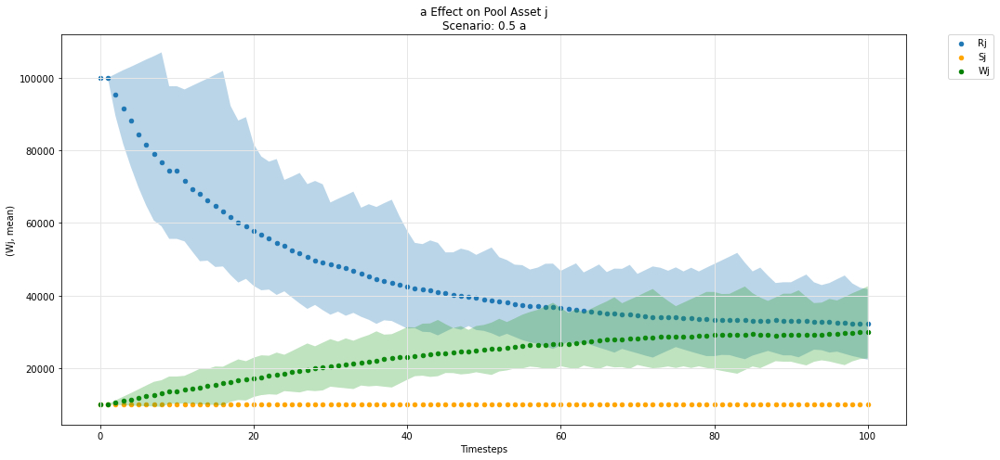

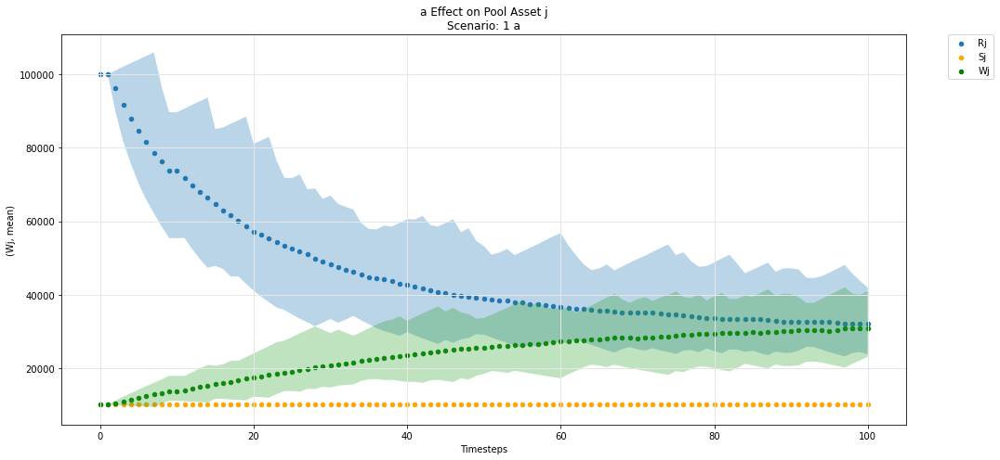

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

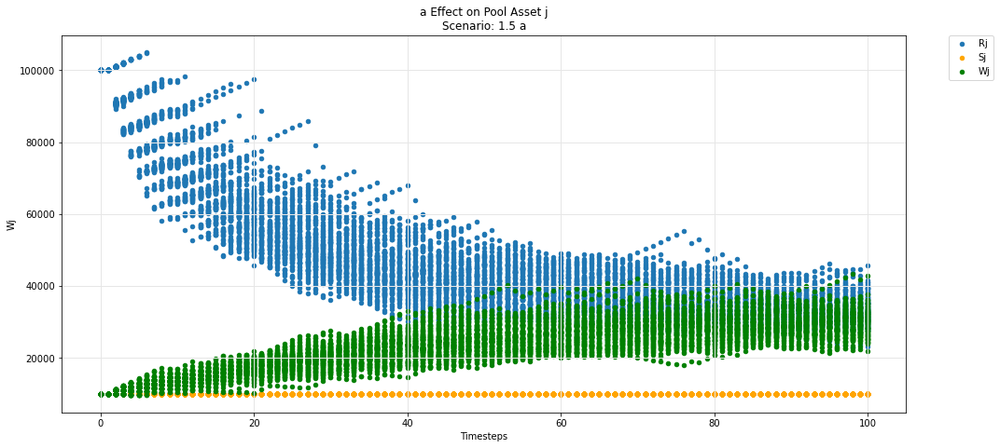

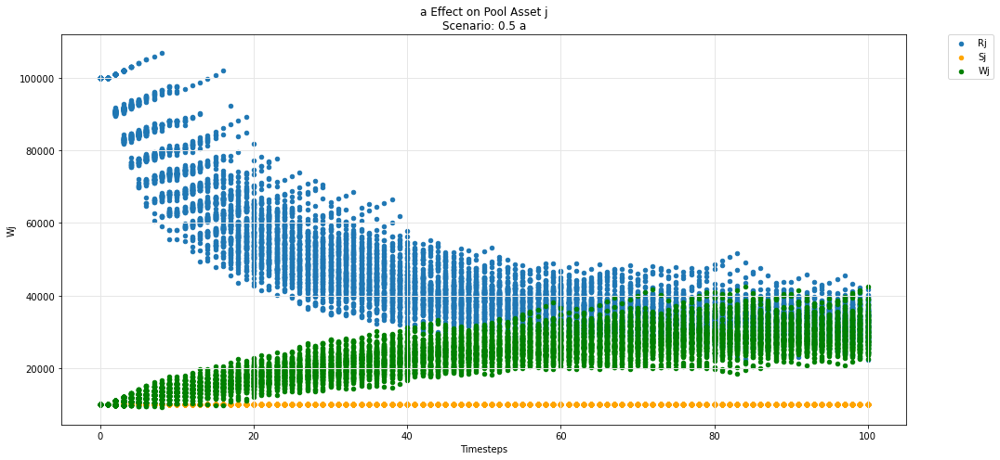

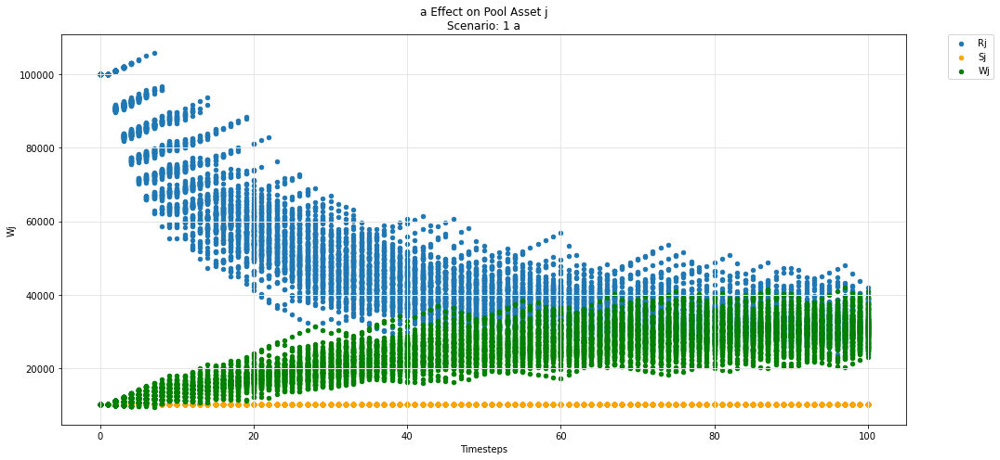

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

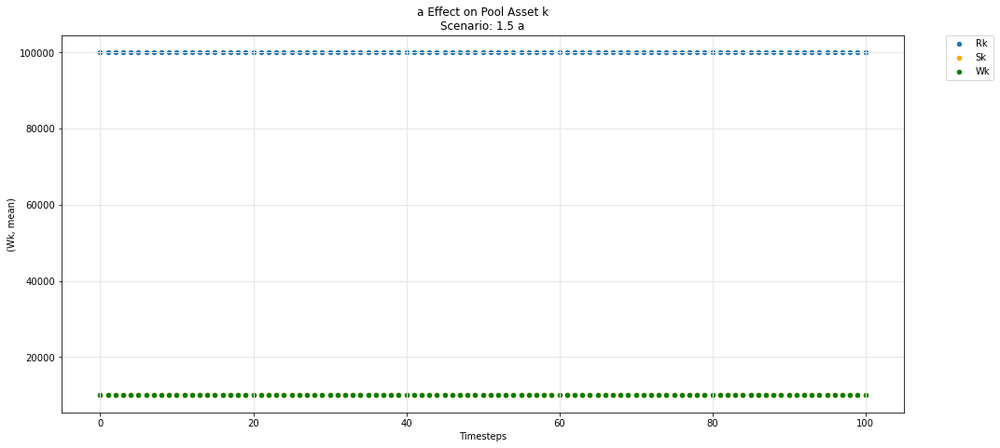

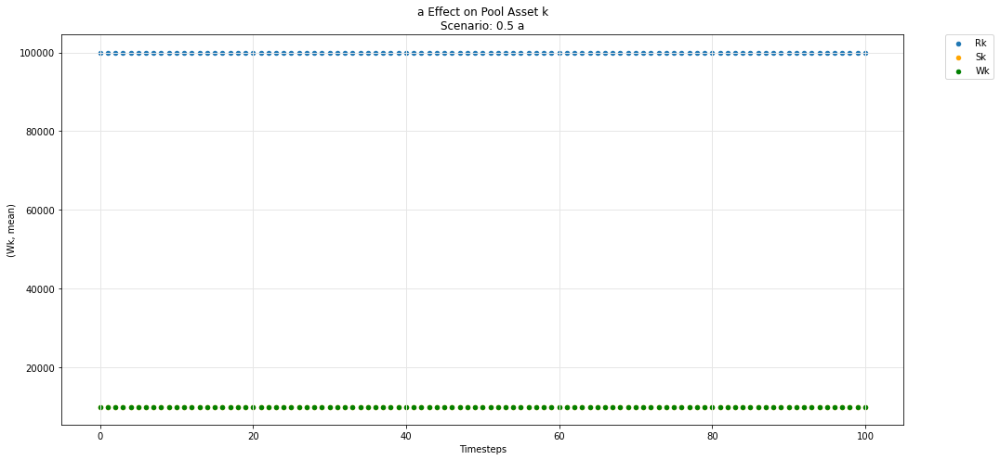

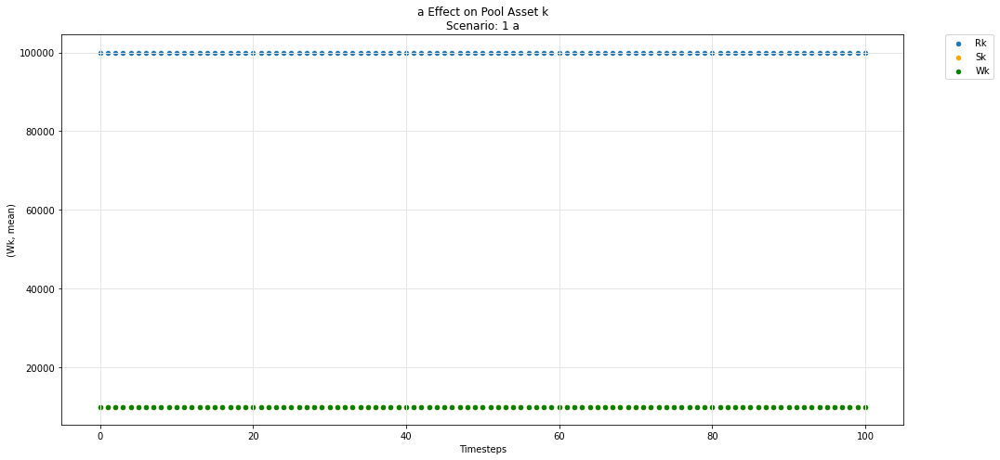

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

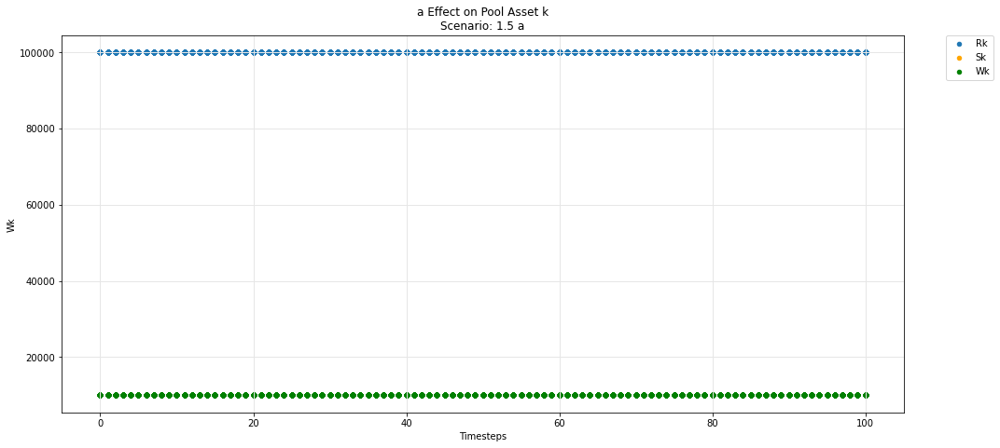

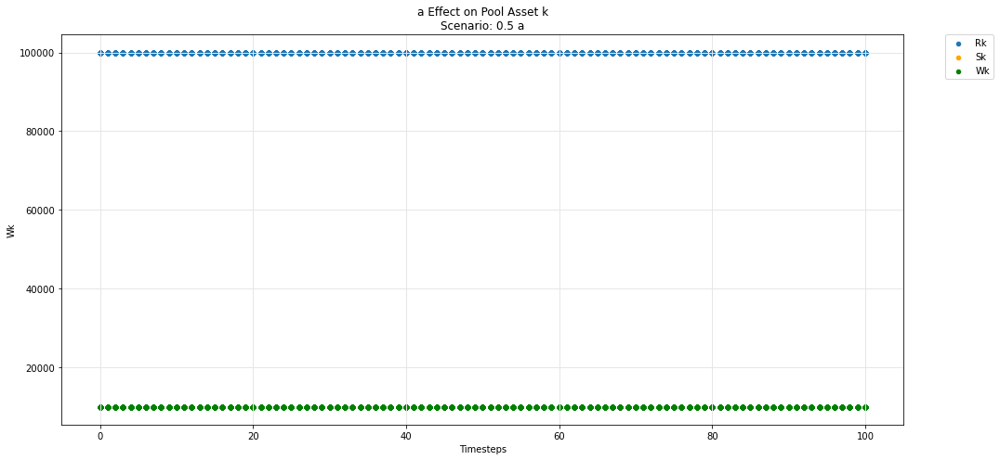

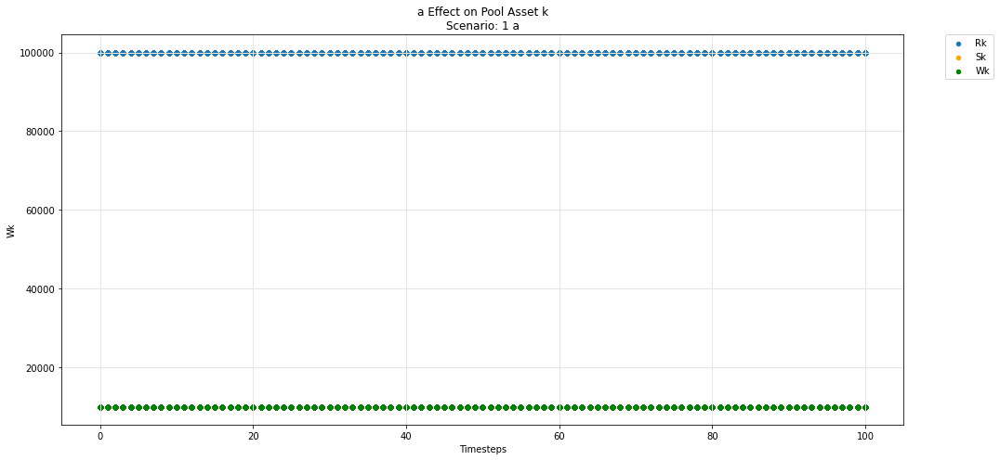

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

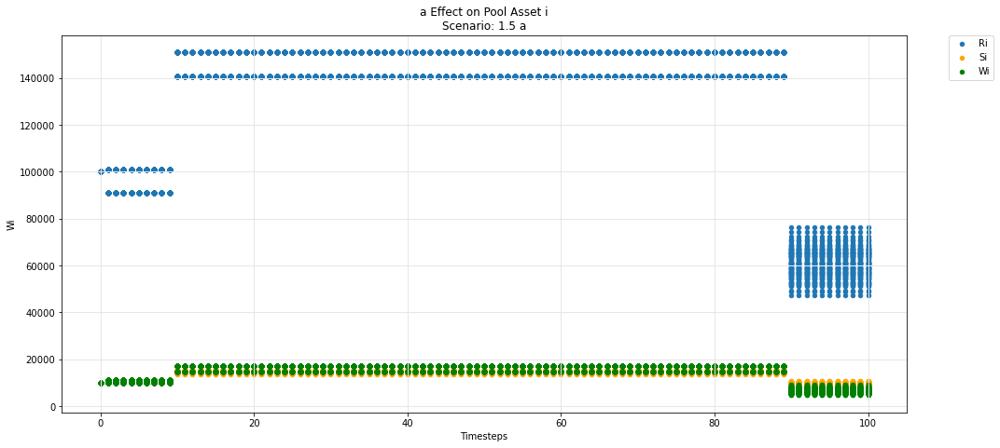

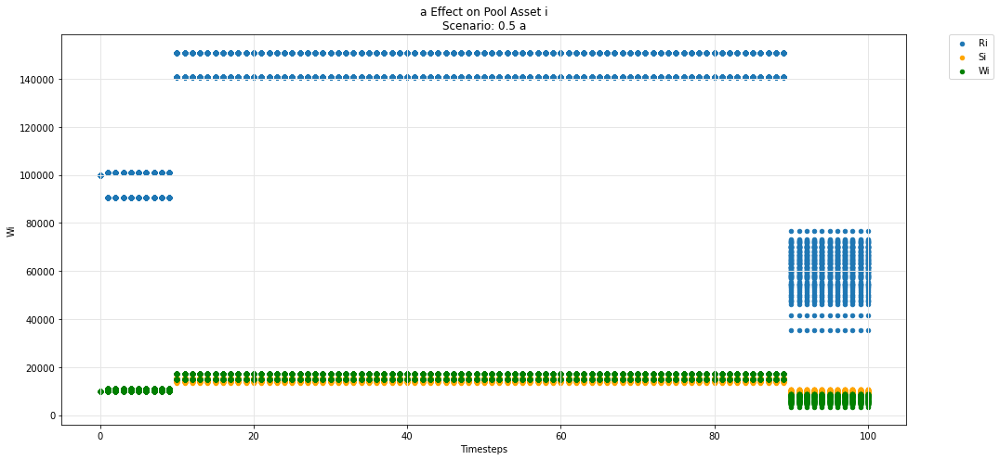

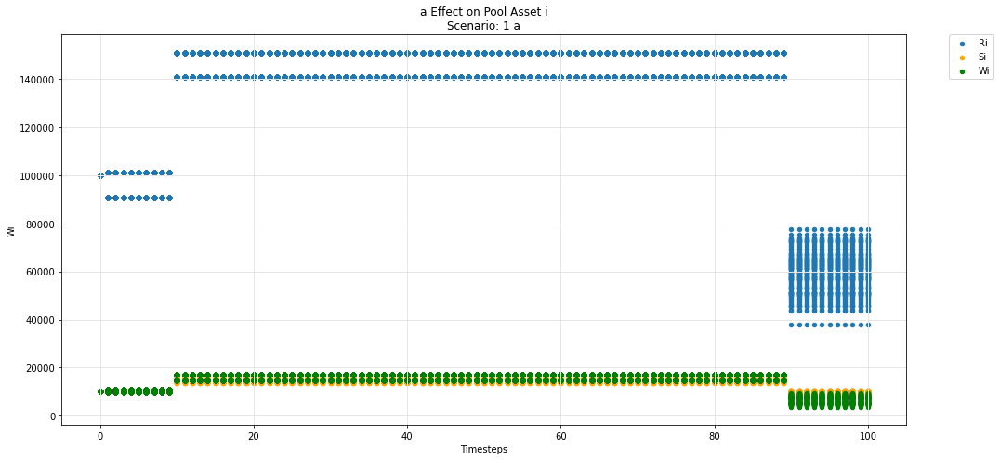

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

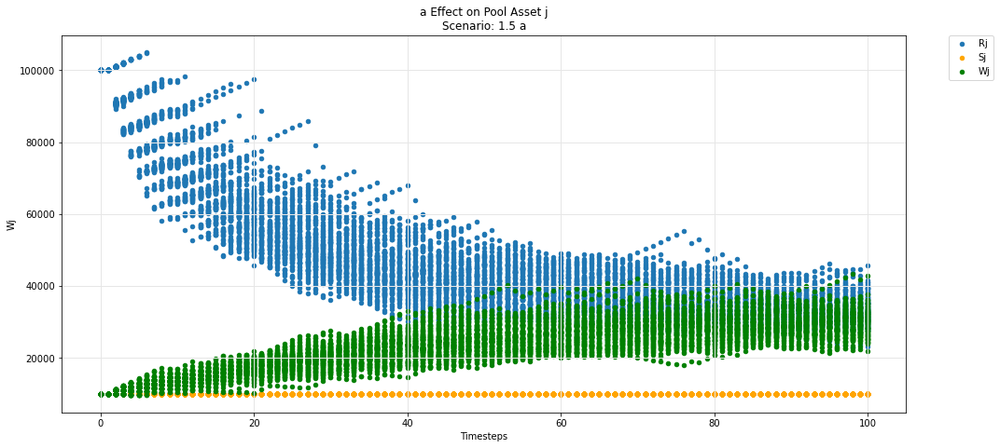

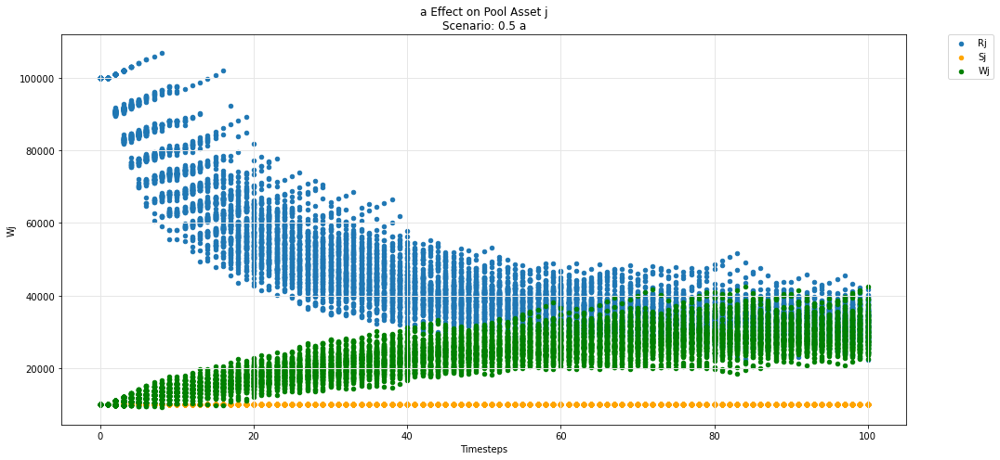

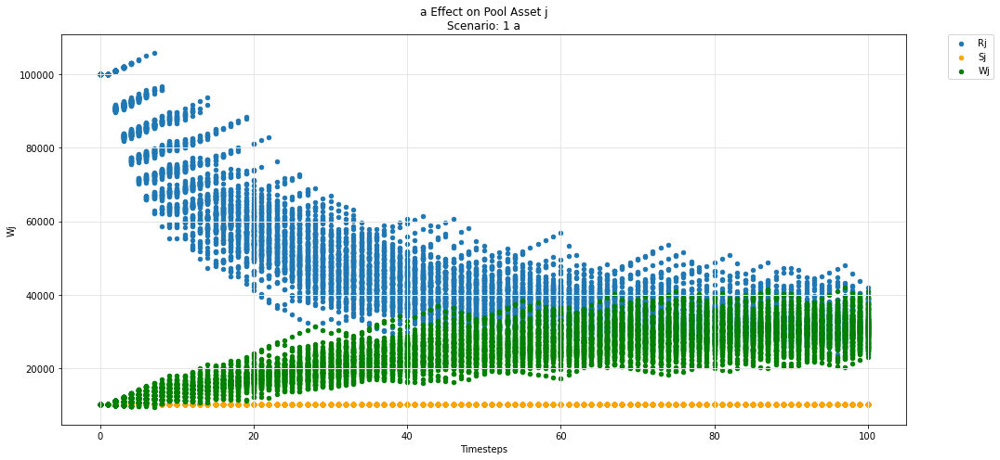

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

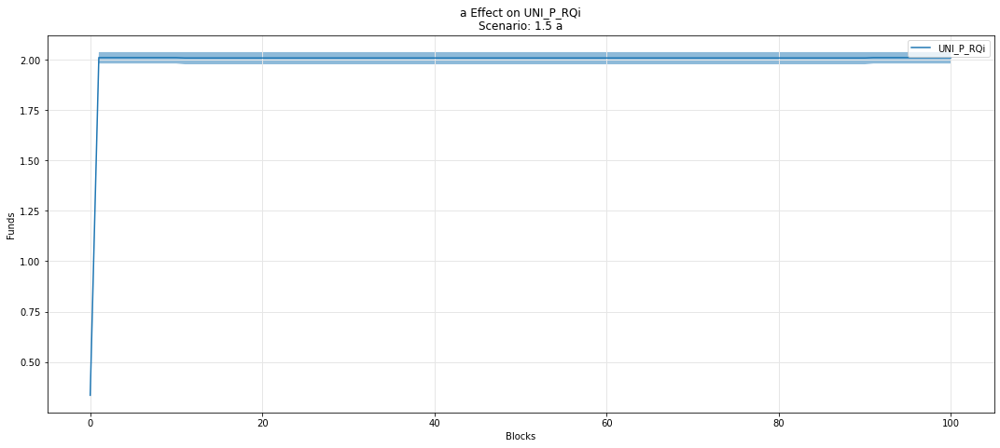

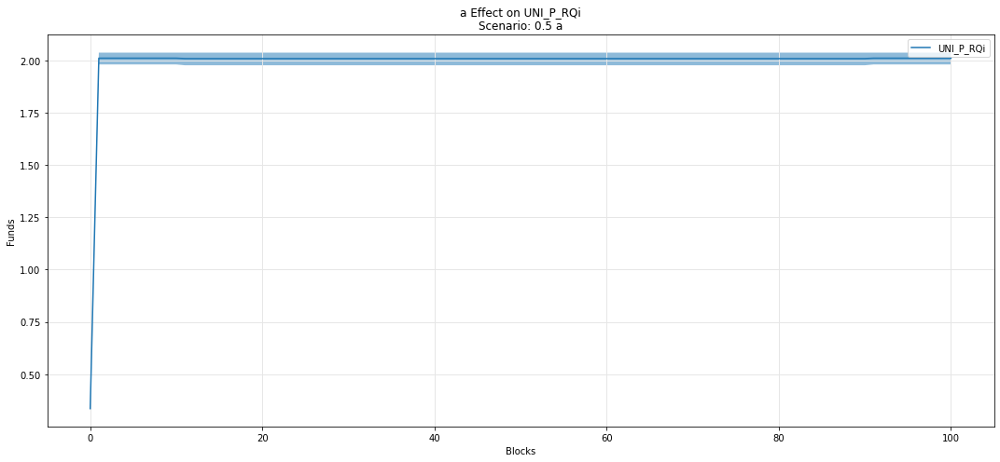

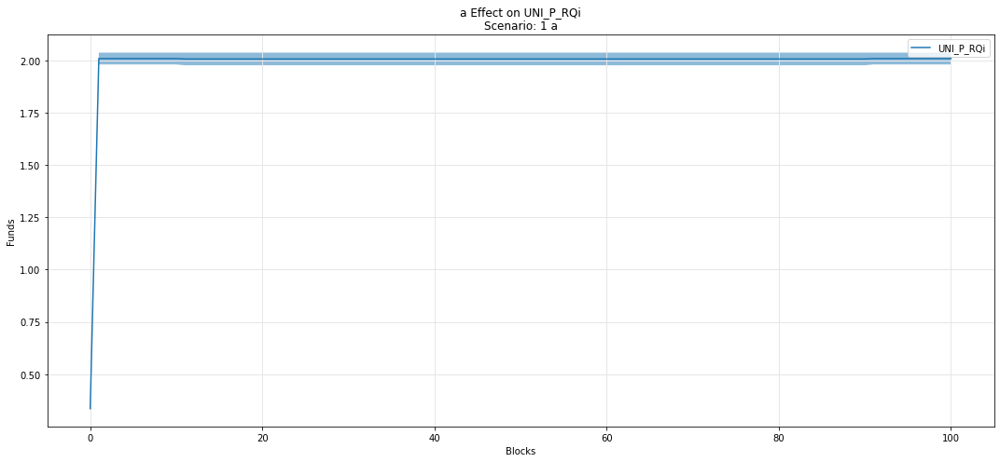

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

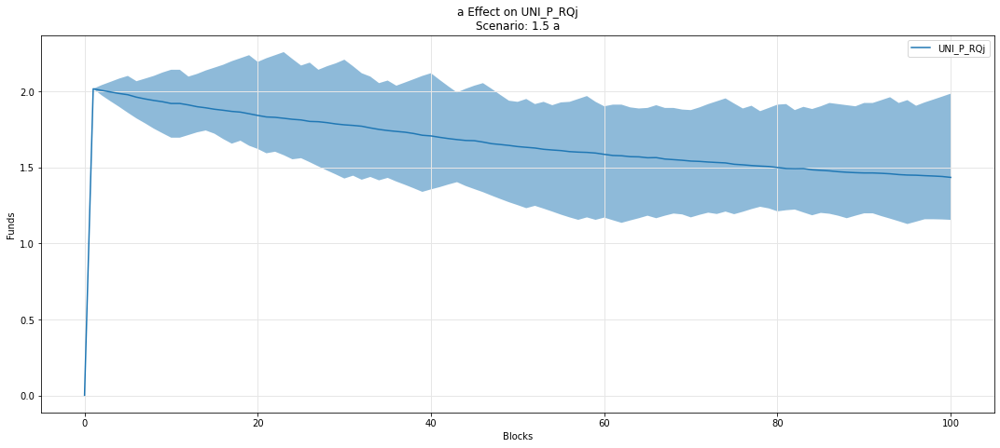

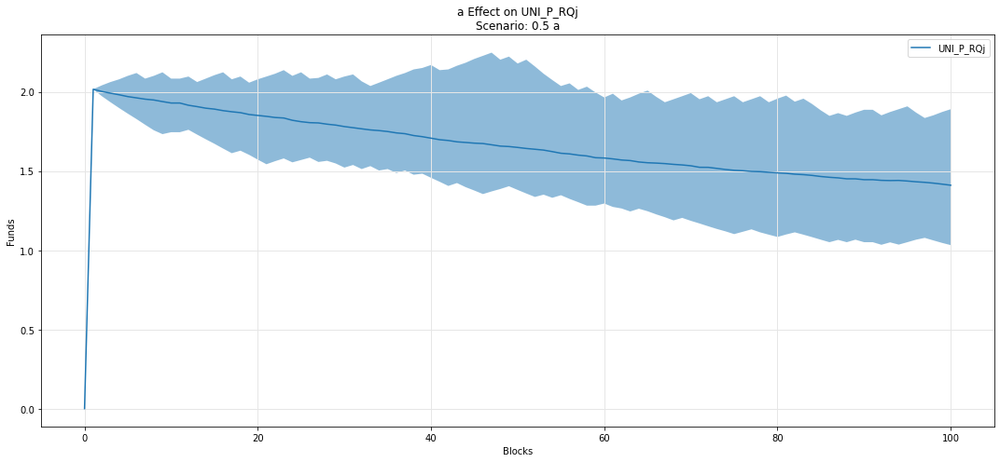

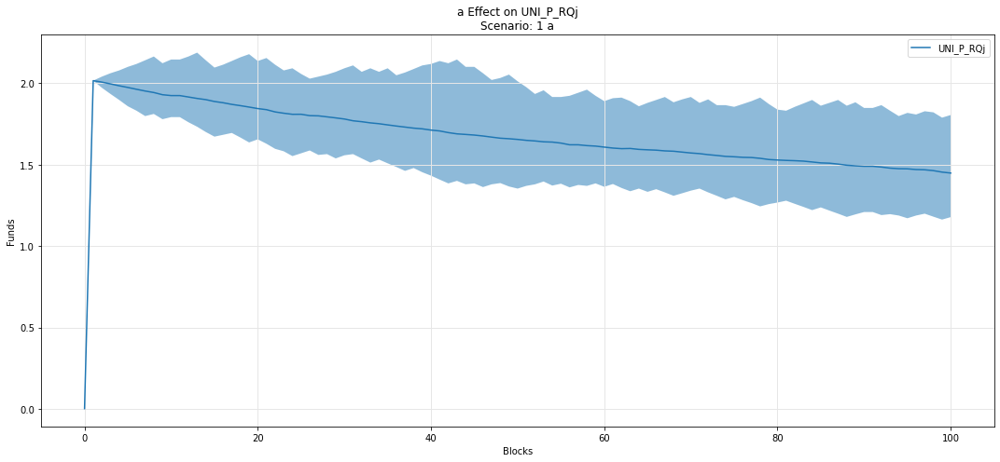

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

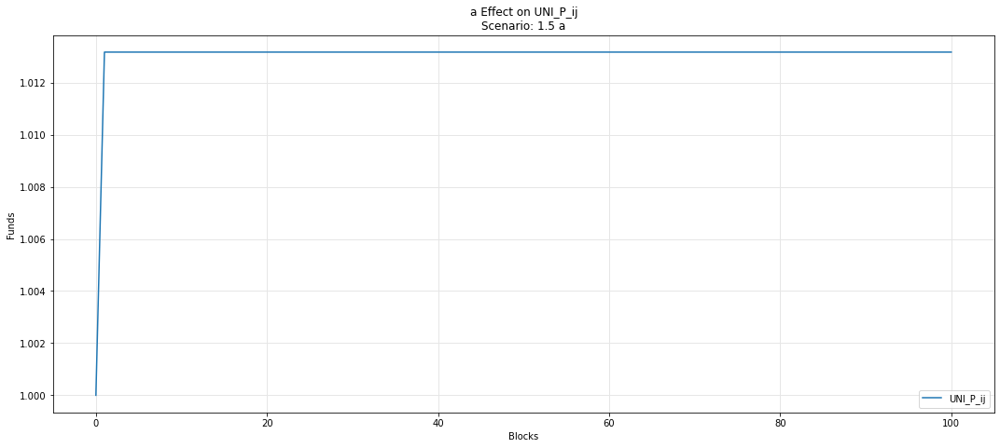

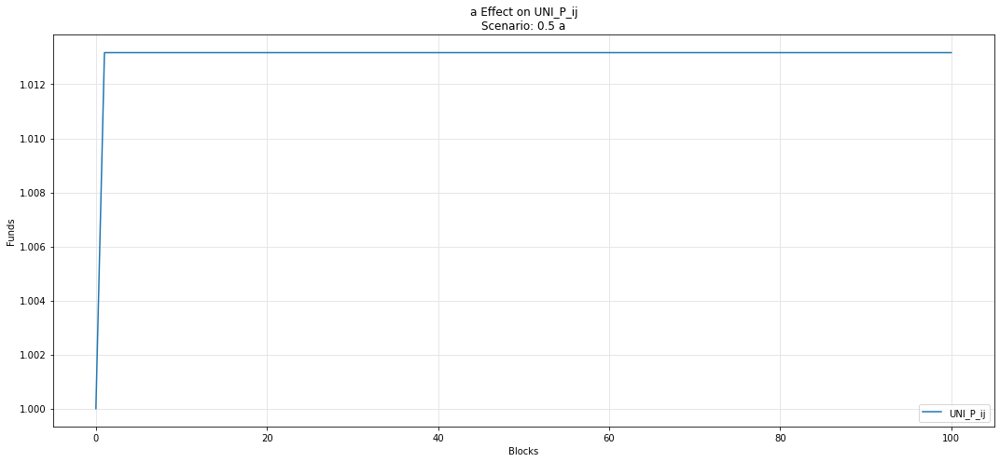

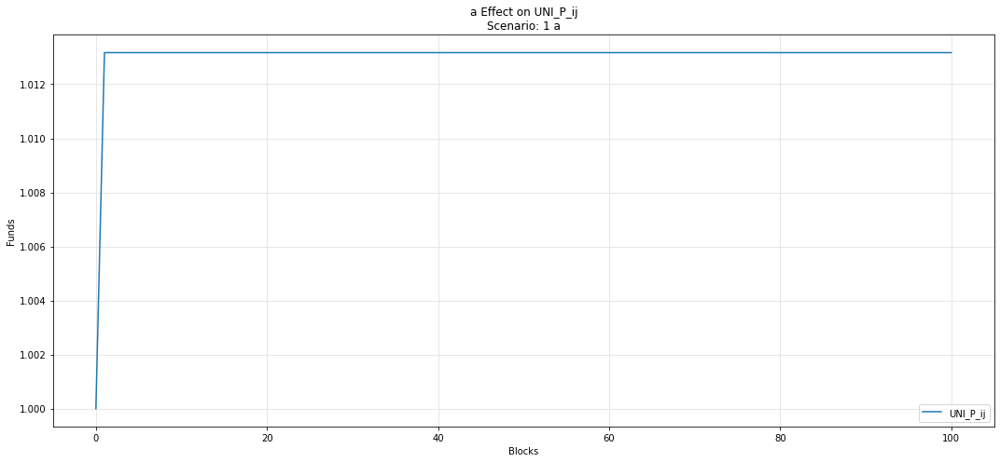

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

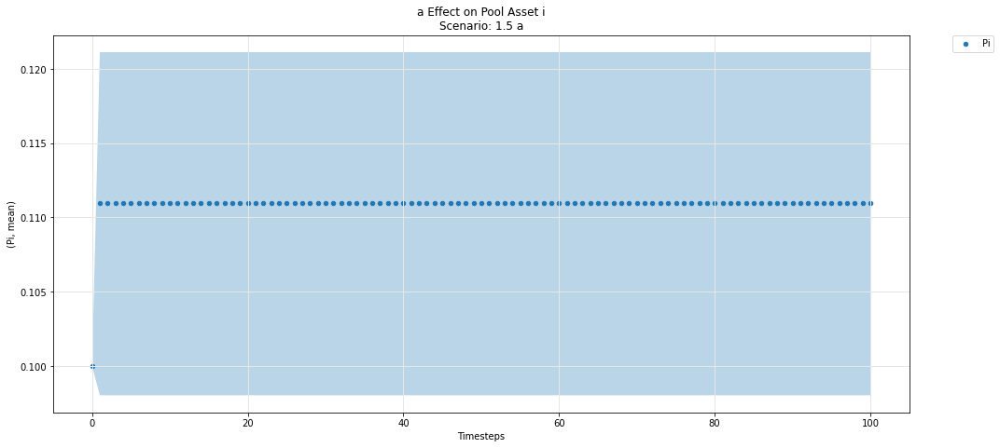

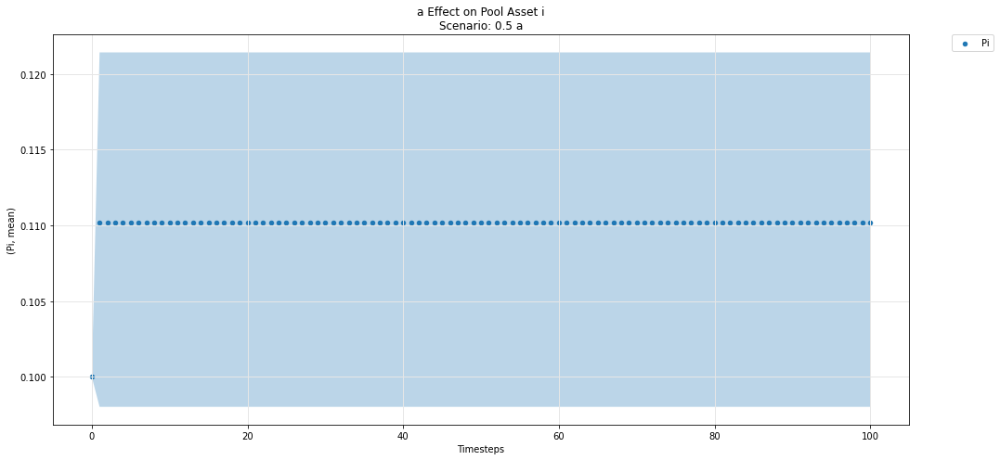

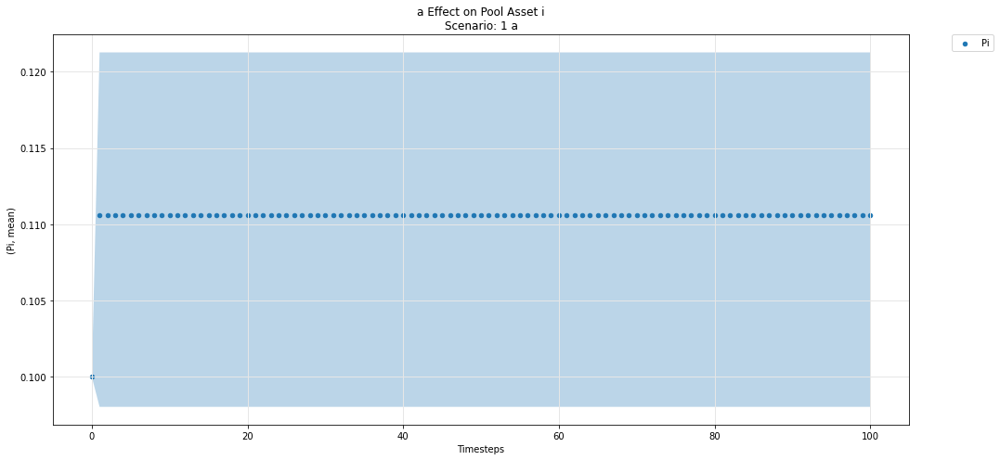

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

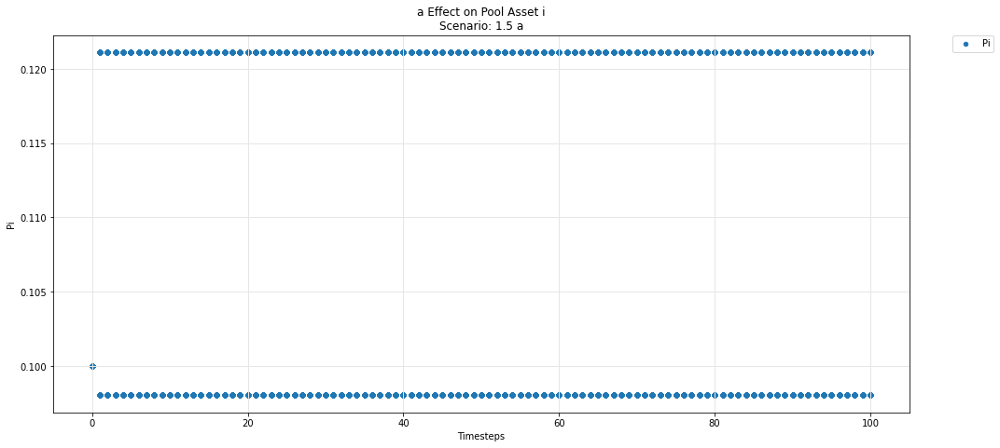

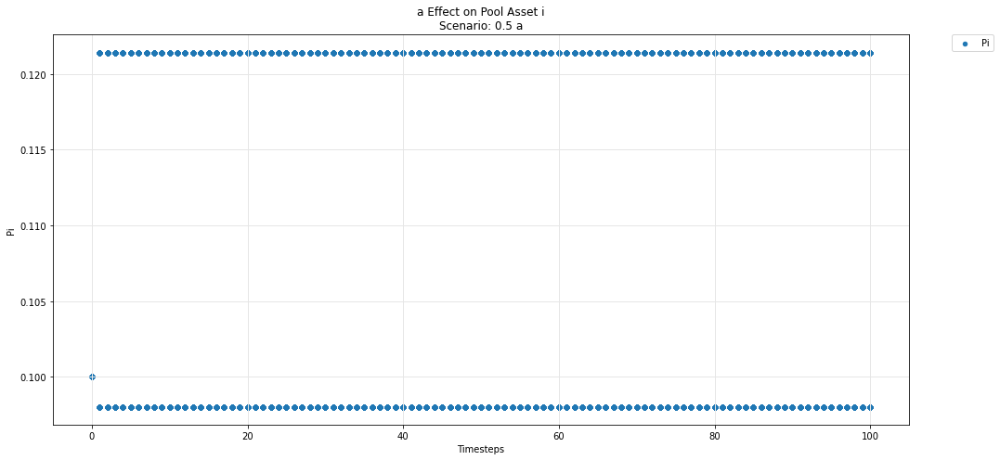

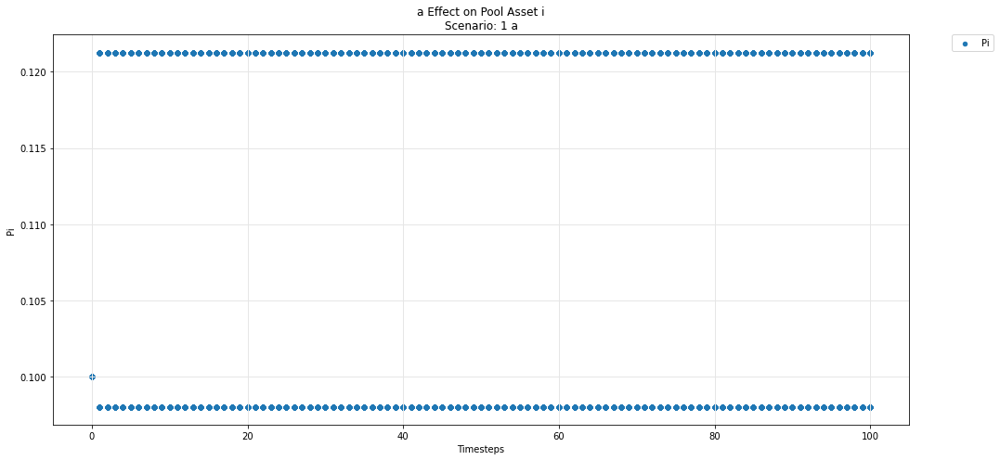

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

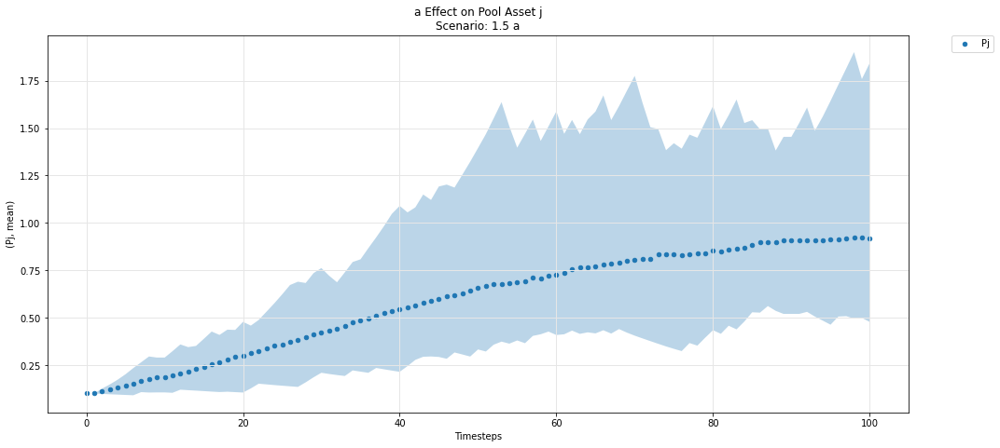

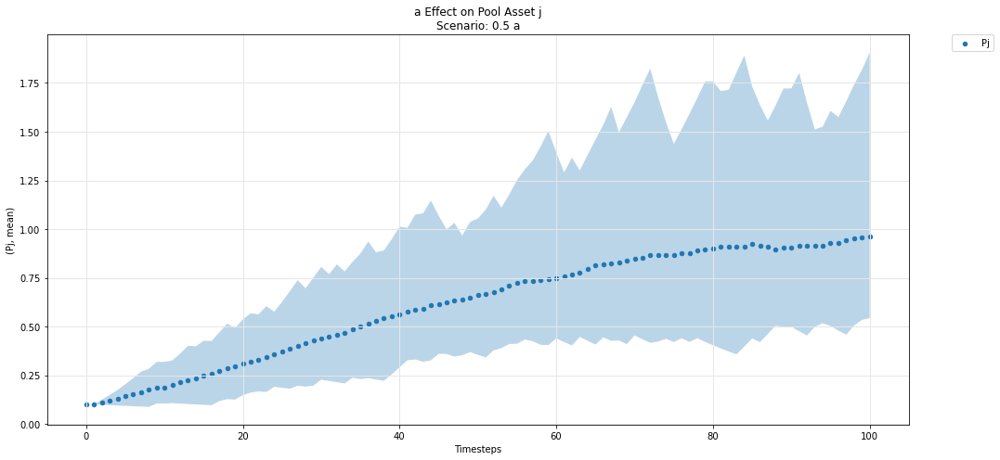

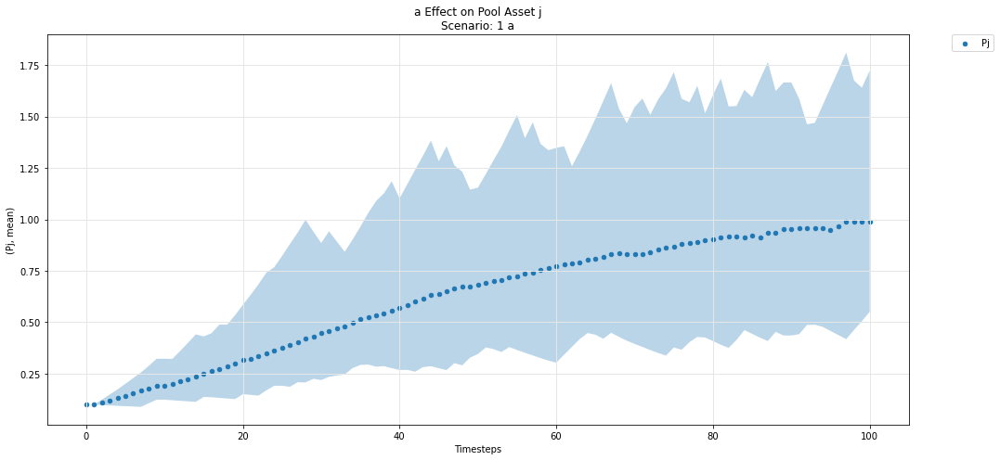

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

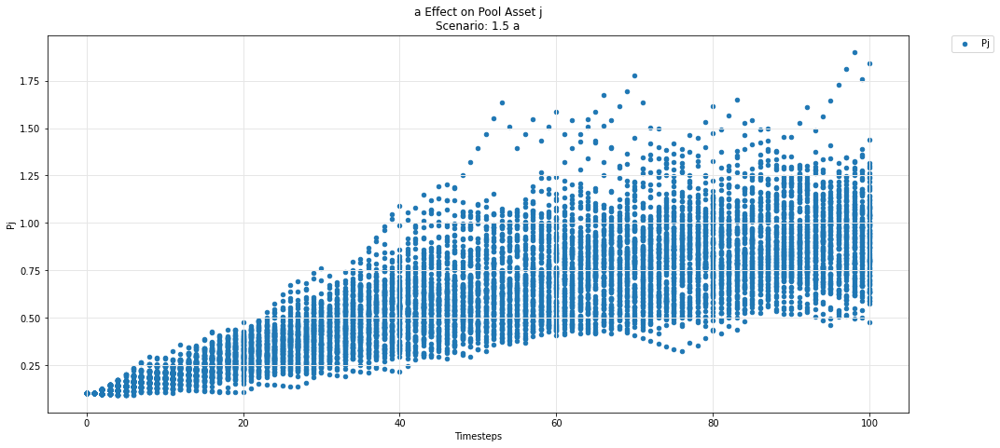

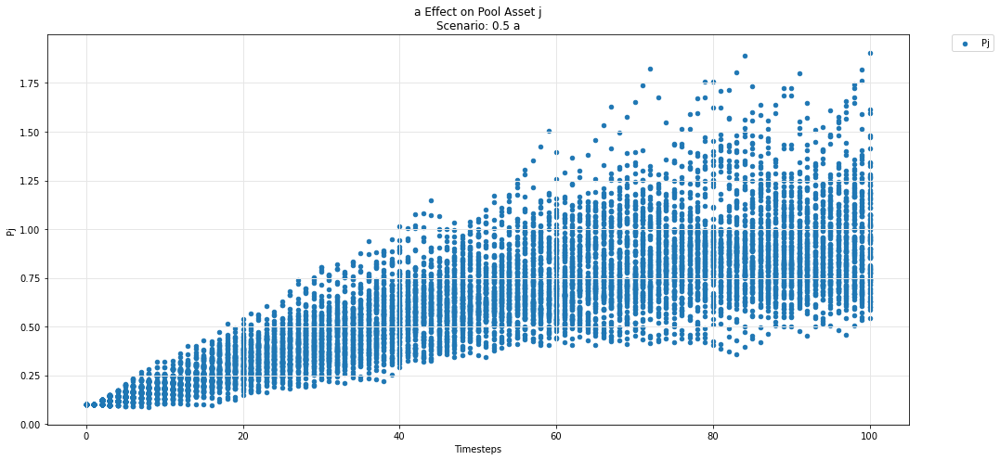

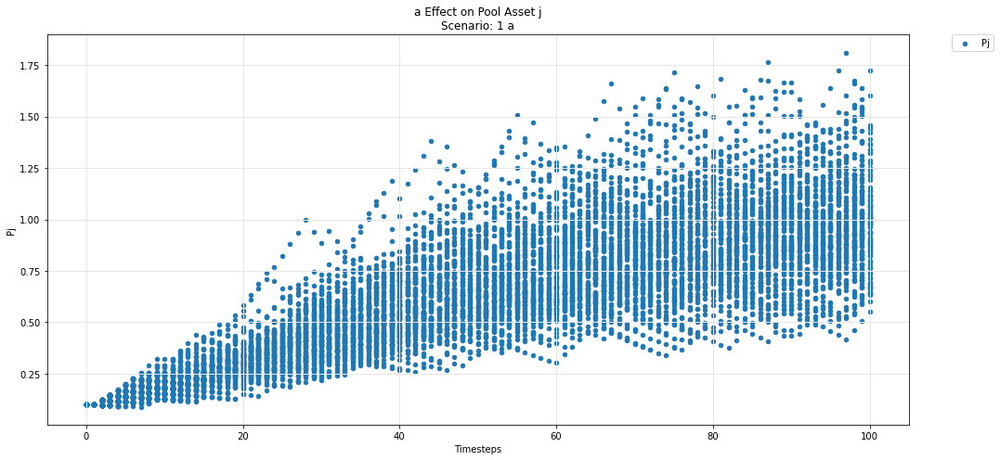

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

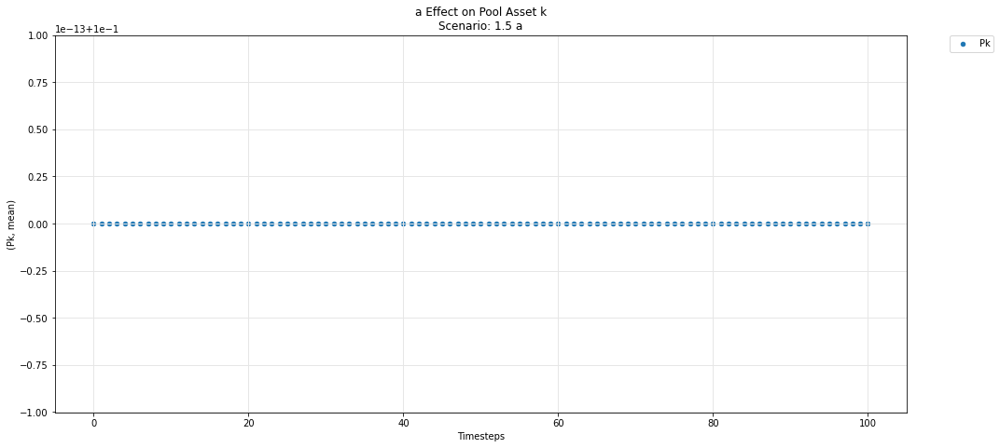

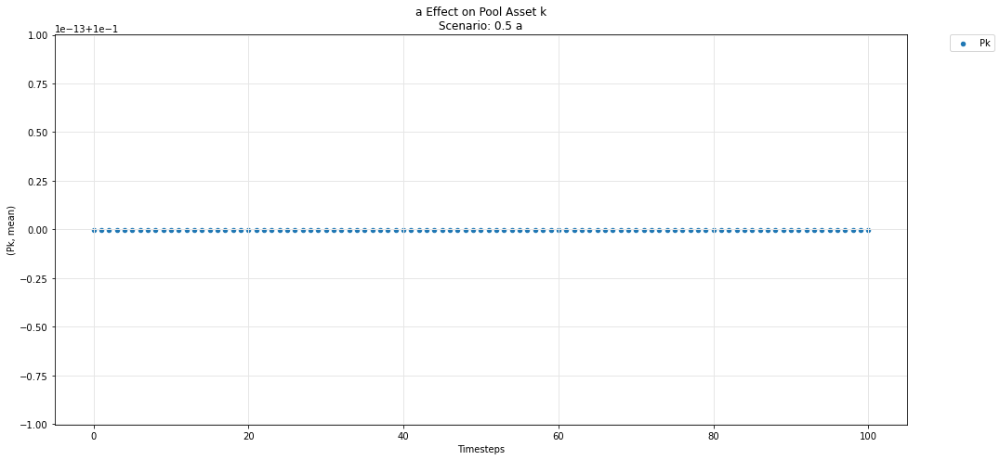

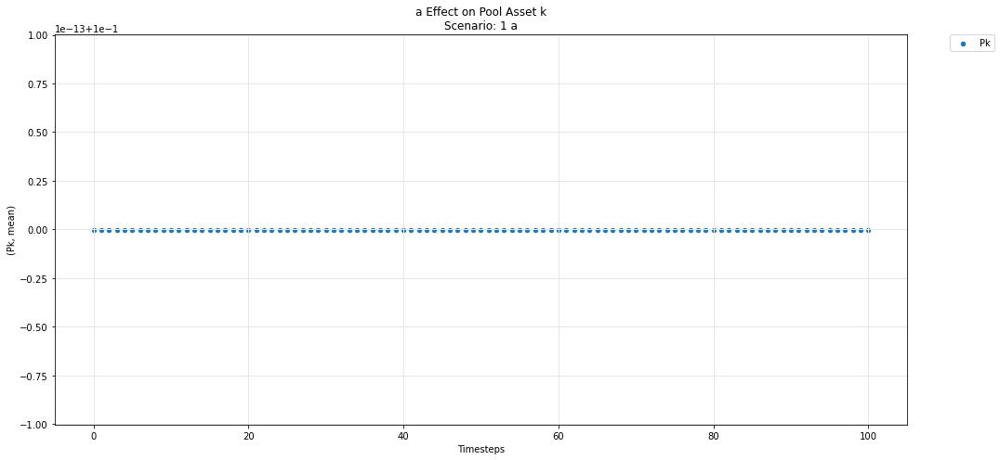

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

In [ ]:
param_pool_plot(experiments, config_ids, 'a','k','P')